In [3]:
import sys, os
import json, pickle
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import time as pytime
import statsmodels.tsa.stattools as tsa
import ruptures as rpt
import InsanallyLabEphysTools as ilep
from scipy.stats import gaussian_kde, sem, ttest_ind, ttest_rel, norm, mannwhitneyu, linregress, wilcoxon
from tqdm import tqdm
from types import SimpleNamespace
from sklearn import linear_model
import seaborn as sns
import colorsys
from matplotlib.backends.backend_pdf import PdfPages
from itertools import product
import pingouin as pg

plt.rcParams['legend.fontsize'] = 'small'
plt.rcParams['axes.labelsize'] = 'medium'
plt.rcParams['axes.formatter.limits'] = [-2,3]
plt.rcParams['axes.formatter.use_mathtext'] = True
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['figure.dpi'] = '150'

#Set global font parameters
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
#Set font type to TrueType for compatibility
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

act_directory = 'D:\\Analysis_Cache'
ops_directory = 'D:\\Opsin_Cache'
beh_directory = 'P:\\Behavioor'

CR_COLOR = '#808080'
NCR_COLOR = '#FF767C'
CNO_COLOR = '#00BFFF'
LASER_COLOR = '#3375E9'
GOOD_GREY = '#969696'
SWITCH_COLOR = '#B07A3B'

EARLY_POST = '#C2D9FF'#'#B0C4E5'
EXPERT_POST = '#616C7E'

NCR_CR_cmap = mpl.colors.LinearSegmentedColormap.from_list('NCR-CR color map', [NCR_COLOR, CR_COLOR], N=1000)
reversal_cmap = mpl.colors.LinearSegmentedColormap.from_list('reversal color map', [EARLY_POST,EXPERT_POST], N=1000)

dualrecanimalnames = ['BS_40','BS_41','BS_42','BS_49','BS_50','BS_51','BS_56','BS_59','BS_61','BS_67','BS_70','BS_72','BS_87','BS_108','DS_15','DS_19']

opsinanimalnames = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165','BS_174','BS_179','BS_191','BS_192']
dualanimals = ['BS_174','BS_179','BS_191','BS_192']
retroanimals = ['PB_86','BS_86','PB_92','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165']
did_learn = ['BS_92','BS_103','BS_111','BS_179']
did_not_learn = ['BS_86','BS_100','BS_119','BS_123','BS_128','BS_131','BS_163','BS_174']
indeterminate = ['BS_139','BS_165','BS_191','BS_192']

C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.2, the latest is 0.5.3.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [131]:
def load_recording_session(directory,animal,region,training_day):
    for session in os.listdir(directory):
        sessionfile = ilep.loadSessionCached(directory,session)
        
        if sessionfile.meta.animal != animal:
            continue
        if sessionfile.meta.region != region:
            continue
        if sessionfile.meta.day_of_training != training_day:
            continue
            
        return sessionfile
    return None

In [132]:
def get_behavior_from_sessionfile(sessionfile):
    
    valid_trials = np.where(sessionfile.trials.valid)[0]
    
    pre_rev_trials = []
    post_rev_trials = []
    
    if sessionfile.meta.task in ['nonreversal','opto nonreversal']:
        pre_rev_trials = np.array(range(sessionfile.meta.length_in_trials))
        post_rev_trials = np.array([])
    elif sessionfile.meta.task in ['reversal','opto reversal']:
        pre_rev_trials = np.array([])
        post_rev_trials = np.array(range(sessionfile.meta.length_in_trials))
    elif sessionfile.meta.task in ['switch','opto switch']:
        pre_rev_trials = np.array(range(sessionfile.meta.first_reversal_trial))
        post_rev_trials = np.array(range(sessionfile.meta.first_reversal_trial,sessionfile.meta.length_in_trials))
    
    laser = np.array([False]*sessionfile.meta.length_in_trials)
    if hasattr(sessionfile.trials,'laser_stimulation'):
        laser = sessionfile.trials.laser_stimulation
    laser_off_trials = np.where(np.logical_not(laser))[0]
    laser_on_trials = np.where(laser)[0]
    
    
    
    outcomes = [np.nan]*sessionfile.meta.length_in_trials
    for trialidx in range(sessionfile.meta.length_in_trials):
        if sessionfile.trials.target[trialidx] and sessionfile.trials.go[trialidx]:
            outcomes[trialidx] = 1
        elif sessionfile.trials.target[trialidx] and not sessionfile.trials.go[trialidx]:
            outcomes[trialidx] = 2
        elif not sessionfile.trials.target[trialidx] and sessionfile.trials.go[trialidx]:
            outcomes[trialidx] = 3
        elif not sessionfile.trials.target[trialidx] and not sessionfile.trials.go[trialidx]:
            outcomes[trialidx] = 4
    outcomes = np.array(outcomes)
            
    
    behavior = SimpleNamespace()
    
    behavior.onPostBehavior = SimpleNamespace()
    behavior.offPreBehavior = SimpleNamespace()
    behavior.offPostBehavior = SimpleNamespace()
    
    onPreTrials = laser_on_trials[np.isin(laser_on_trials,pre_rev_trials[np.isin(pre_rev_trials,valid_trials)])]
    #print(onPreTrials)
    #print(len(onPreTrials))
    if len(onPreTrials > 0):
        behavior.onPreBehavior = SimpleNamespace()
        behavior.onPreBehavior.hits = np.sum(np.equal(outcomes[onPreTrials],1))
        behavior.onPreBehavior.misses = np.sum(np.equal(outcomes[onPreTrials],2))
        behavior.onPreBehavior.falarms = np.sum(np.equal(outcomes[onPreTrials],3))
        behavior.onPreBehavior.crejects = np.sum(np.equal(outcomes[onPreTrials],4))
        
        
    offPreTrials = laser_off_trials[np.isin(laser_off_trials,pre_rev_trials[np.isin(pre_rev_trials,valid_trials)])]
    #print(offPreTrials)
    #print(len(offPreTrials))
    if len(offPreTrials > 0):
        behavior.offPreBehavior = SimpleNamespace()
        behavior.offPreBehavior.hits = np.sum(np.equal(outcomes[offPreTrials],1))
        behavior.offPreBehavior.misses = np.sum(np.equal(outcomes[offPreTrials],2))
        behavior.offPreBehavior.falarms = np.sum(np.equal(outcomes[offPreTrials],3))
        behavior.offPreBehavior.crejects = np.sum(np.equal(outcomes[offPreTrials],4))
        
        
    onPostTrials = laser_on_trials[np.isin(laser_on_trials,post_rev_trials[np.isin(post_rev_trials,valid_trials)])]
    #print(onPostTrials)
    #print(len(onPostTrials))
    if len(onPostTrials > 0):
        behavior.onPostBehavior = SimpleNamespace()
        behavior.onPostBehavior.hits = np.sum(np.equal(outcomes[onPostTrials],1))
        behavior.onPostBehavior.misses = np.sum(np.equal(outcomes[onPostTrials],2))
        behavior.onPostBehavior.falarms = np.sum(np.equal(outcomes[onPostTrials],3))
        behavior.onPostBehavior.crejects = np.sum(np.equal(outcomes[onPostTrials],4))
        
        
    offPostTrials = laser_off_trials[np.isin(laser_off_trials,post_rev_trials[np.isin(post_rev_trials,valid_trials)])]
    #print(offPostTrials)
    #print(len(offPostTrials))
    if len(offPostTrials > 0):
        behavior.offPostBehavior = SimpleNamespace()
        behavior.offPostBehavior.hits = np.sum(np.equal(outcomes[offPostTrials],1))
        behavior.offPostBehavior.misses = np.sum(np.equal(outcomes[offPostTrials],2))
        behavior.offPostBehavior.falarms = np.sum(np.equal(outcomes[offPostTrials],3))
        behavior.offPostBehavior.crejects = np.sum(np.equal(outcomes[offPostTrials],4))
        
    return behavior

In [4]:
def get_outcomes_from_sessionfile(sessionfile):
    
    valid_trials = np.where(sessionfile.trials.valid)[0]
    
    pre_rev_trials = []
    post_rev_trials = []
    
    if sessionfile.meta.task in ['nonreversal','opto nonreversal']:
        pre_rev_trials = np.array(range(sessionfile.meta.length_in_trials))
        post_rev_trials = np.array([])
    elif sessionfile.meta.task in ['reversal','opto reversal']:
        pre_rev_trials = np.array([])
        post_rev_trials = np.array(range(sessionfile.meta.length_in_trials))
    elif sessionfile.meta.task in ['switch','opto switch']:
        pre_rev_trials = np.array(range(sessionfile.meta.first_reversal_trial))
        post_rev_trials = np.array(range(sessionfile.meta.first_reversal_trial,sessionfile.meta.length_in_trials))
    
    laser = np.array([False]*sessionfile.meta.length_in_trials)
    if hasattr(sessionfile.trials,'laser_stimulation'):
        laser = sessionfile.trials.laser_stimulation
    laser_off_trials = np.where(np.logical_not(laser))[0]
    laser_on_trials = np.where(laser)[0]
    
    
    
    outcomes = [np.nan]*sessionfile.meta.length_in_trials
    for trialidx in range(sessionfile.meta.length_in_trials):
        if sessionfile.trials.target[trialidx] and sessionfile.trials.go[trialidx]:
            outcomes[trialidx] = 1
        elif sessionfile.trials.target[trialidx] and not sessionfile.trials.go[trialidx]:
            outcomes[trialidx] = 2
        elif not sessionfile.trials.target[trialidx] and sessionfile.trials.go[trialidx]:
            outcomes[trialidx] = 3
        elif not sessionfile.trials.target[trialidx] and not sessionfile.trials.go[trialidx]:
            outcomes[trialidx] = 4
    outcomes = np.array(outcomes)
    
    return outcomes,pre_rev_trials,post_rev_trials,laser_on_trials,laser_off_trials,valid_trials

In [5]:
def get_behavior_from_outcomes(outcomes,pre_rev_trials,post_rev_trials,laser_on_trials,laser_off_trials,valid_trials):
    behavior = SimpleNamespace()
    #print('outcomes: '+str(outcomes))
    #print('pre     : '+str(pre_rev_trials))
    #print('post    : '+str(post_rev_trials))
    #print('on      : '+str(laser_on_trials))
    #print('off     : '+str(laser_off_trials))
    #print('valid   : '+str(valid_trials))
    
    onPreTrials = laser_on_trials[np.isin(laser_on_trials,pre_rev_trials[np.isin(pre_rev_trials,valid_trials)])]
    #print(onPreTrials)
    #print(len(onPreTrials))
    if len(onPreTrials > 0):
        behavior.onPreBehavior = SimpleNamespace()
        behavior.onPreBehavior.hits = np.sum(np.equal(outcomes[onPreTrials],1))
        behavior.onPreBehavior.misses = np.sum(np.equal(outcomes[onPreTrials],2))
        behavior.onPreBehavior.falarms = np.sum(np.equal(outcomes[onPreTrials],3))
        behavior.onPreBehavior.crejects = np.sum(np.equal(outcomes[onPreTrials],4))
        
        
    offPreTrials = laser_off_trials[np.isin(laser_off_trials,pre_rev_trials[np.isin(pre_rev_trials,valid_trials)])]
    #print(offPreTrials)
    #print(len(offPreTrials))
    if len(offPreTrials > 0):
        behavior.offPreBehavior = SimpleNamespace()
        behavior.offPreBehavior.hits = np.sum(np.equal(outcomes[offPreTrials],1))
        behavior.offPreBehavior.misses = np.sum(np.equal(outcomes[offPreTrials],2))
        behavior.offPreBehavior.falarms = np.sum(np.equal(outcomes[offPreTrials],3))
        behavior.offPreBehavior.crejects = np.sum(np.equal(outcomes[offPreTrials],4))
        
        
    onPostTrials = laser_on_trials[np.isin(laser_on_trials,post_rev_trials[np.isin(post_rev_trials,valid_trials)])]
    #print(onPostTrials)
    #print(len(onPostTrials))
    if len(onPostTrials > 0):
        behavior.onPostBehavior = SimpleNamespace()
        behavior.onPostBehavior.hits = np.sum(np.equal(outcomes[onPostTrials],1))
        behavior.onPostBehavior.misses = np.sum(np.equal(outcomes[onPostTrials],2))
        behavior.onPostBehavior.falarms = np.sum(np.equal(outcomes[onPostTrials],3))
        behavior.onPostBehavior.crejects = np.sum(np.equal(outcomes[onPostTrials],4))
        
        
    offPostTrials = laser_off_trials[np.isin(laser_off_trials,post_rev_trials[np.isin(post_rev_trials,valid_trials)])]
    #print(offPostTrials)
    #print(len(offPostTrials))
    if len(offPostTrials > 0):
        behavior.offPostBehavior = SimpleNamespace()
        behavior.offPostBehavior.hits = np.sum(np.equal(outcomes[offPostTrials],1))
        behavior.offPostBehavior.misses = np.sum(np.equal(outcomes[offPostTrials],2))
        behavior.offPostBehavior.falarms = np.sum(np.equal(outcomes[offPostTrials],3))
        behavior.offPostBehavior.crejects = np.sum(np.equal(outcomes[offPostTrials],4))
        
    return behavior

In [6]:
def find_active_trials(outcomes,window_length = 75, active_thresholds = [0.2,0.8], verification_threshold = 0.8):
    hits = np.equal(outcomes,1)
    misses = np.equal(outcomes,2)
    falarms = np.equal(outcomes,3)
    crejects = np.equal(outcomes,4)
    
    gos = np.logical_or(hits,falarms)
    
    participation = np.array([np.mean(gos[i:(i+window_length)]) for i in range(len(gos)-window_length)])
    
    #Calculate where active conditions are fulfilled
    activehighthresh = np.less(participation,active_thresholds[1])
    activelowthresh = np.greater(participation,active_thresholds[0])
    active = np.logical_and(activehighthresh,activelowthresh)
    #Get trial numbers
    activetrials = np.where(active)[0]
    if len(activetrials) >= 2:
        activestart = np.min(activetrials)
        activeend = np.max(activetrials)
    else:
        activestart = np.nan
        activeend = np.nan
    
    ############################################ If there's no active period then skip everything
    if not np.isfinite(activestart) or not np.isfinite(activeend):
        valid_trials = np.zeros_like(outcomes,dtype='bool')
        return valid_trials
    
    ############################################ Verify that an appropriate amount of this span is active
    activespan = np.array(range(len(active)))
    tempspan = np.greater_equal(activespan,activestart)
    tempspan2 = np.less_equal(activespan,activeend)
    activespan = np.logical_and(tempspan,tempspan2)
    verification_frac = np.sum(active) / np.sum(activespan)
    #Check against verification_threshold and abort if insufficient
    if np.isfinite(verification_frac) and verification_frac < verification_threshold:
        valid_trials = np.zeros_like(outcomes,dtype='bool')
        return valid_trials
    
    ############################################ Now return a proper valid_trials object
    activeend += window_length
    valid_trials = np.zeros_like(outcomes,dtype='bool')
    valid_trials[activestart:activeend] = True
    return valid_trials

In [15]:
starttime = pytime.time()
   
#Opsin data
if True:
    #Trim Sessions
    #ilep.trimSessions('S:\\Sorts\Opsin',replace=False)
    #endtime1 = pytime.time()
    #Calculate Responsiveness
    #ilep.calculateResponsiveness('S:\\Sorts\Opsin',cachedDirectory='D:\\Opsin_Cache',replace=True)
    #endtime2 = pytime.time()
    #Finish
    ilep.loadSessionsComplete('S:\\Sorts\Opsin',destination='D:\\Opsin_Cache',verbose=False)
    endtime3 = pytime.time()
    print('Trimming       : ' + str((endtime1-starttime)/60)+' minutes elapsed');
    print('Responsiveness : ' + str((endtime2-starttime)/60)+' minutes elapsed');
    print('Finished       : ' + str((endtime3-starttime)/60)+' minutes elapsed');

#Opsin controls
if False:
    #Trim Sessions
    ilep.trimSessions('S:\\Sorts\OpsinControls',replace=False)
    endtime1 = pytime.time()
    #Calculate Responsiveness
    ilep.calculateResponsiveness('S:\\Sorts\OpsinControls',cachedDirectory='D:\\OpsinControl_Cache',replace=False)
    endtime2 = pytime.time()
    #Finish
    ilep.loadSessionsComplete('S:\\Sorts\OpsinControls',destination='D:\\OpsinControl_Cache',verbose=False)
    endtime3 = pytime.time()
    print('Trimming       : ' + str((endtime1-starttime)/60)+' minutes elapsed');
    print('Responsiveness : ' + str((endtime2-starttime)/60)+' minutes elapsed');
    print('Finished       : ' + str((endtime3-starttime)/60)+' minutes elapsed');

  0%|          | 0/16 [00:00<?, ?it/s]

[Errno 2] No such file or directory: 'S:\\Sorts\\Opsin\\BS_100\\BS_100 1\\AC\\condition_metadata.json'
Recording does not contain raw audio data. Use saveTrials.m to generate


  6%|▋         | 1/16 [00:00<00:11,  1.31it/s]

S:\Sorts\Opsin\BS_100\BS_100 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_100\BS_100 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_100\BS_100 1\Striatum\session_metadata.json missing. Skipping
BS_100 complete
[Errno 2] No such file or directory: 'S:\\Sorts\\Opsin\\BS_103\\BS_103 1\\AC\\condition_metadata.json'
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_103\BS_103 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_103\BS_103 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_103\BS_103 1\Striatum\session_metadata.json missing. Skipping
[Errno 2] No such file or directory: 'S:\\Sorts\\Opsin\\BS_103\\BS_103 2\\AC\\condition_metadata.json'
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_103\BS_103 2\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_103\BS_103 2\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_103\BS_10

 12%|█▎        | 2/16 [00:08<01:06,  4.76s/it]

S:\Sorts\Opsin\BS_103\BS_103 9\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_103\BS_103 9\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_103\BS_103 9\Striatum\session_metadata.json missing. Skipping
BS_103 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_111\BS_111 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_111\BS_111 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_111\BS_111 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_111\BS_111 10\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_111\BS_111 10\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_111\BS_111 10\Striatum\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_111\BS_111 11\AC\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_111\BS_111 11\M2\session_metadata.json missing. Skipping


 19%|█▉        | 3/16 [00:19<01:41,  7.82s/it]

S:\Sorts\Opsin\BS_111\BS_111 9\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_111\BS_111 9\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_111\BS_111 9\Striatum\session_metadata.json missing. Skipping
BS_111 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_119\BS_119 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_119\BS_119 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_119\BS_119 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_119\BS_119 2\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_119\BS_119 2\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_119\BS_119 2\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_119\BS_119 3\M2\session_metadata.json missing. Skipping
S:\Sort

 25%|██▌       | 4/16 [00:25<01:23,  6.96s/it]

S:\Sorts\Opsin\BS_119\BS_119 6\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_119\BS_119 6\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_119\BS_119 6\Striatum\session_metadata.json missing. Skipping
BS_119 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_123\BS_123 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_123\BS_123 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_123\BS_123 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_123\BS_123 2\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_123\BS_123 2\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_123\BS_123 2\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_123\BS_123 3\M2\session_metadata.json missing. Skipping
S:\Sort

 31%|███▏      | 5/16 [00:35<01:27,  7.93s/it]

S:\Sorts\Opsin\BS_123\BS_123 8\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_123\BS_123 8\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_123\BS_123 8\Striatum\session_metadata.json missing. Skipping
BS_123 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_128\BS_128 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_128\BS_128 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_128\BS_128 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_128\BS_128 10\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_128\BS_128 10\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_128\BS_128 10\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_128\BS_128 11\M2\session_metadata.json missing. Skipping
S:\

 38%|███▊      | 6/16 [00:47<01:34,  9.47s/it]

S:\Sorts\Opsin\BS_128\BS_128 9\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_128\BS_128 9\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_128\BS_128 9\Striatum\session_metadata.json missing. Skipping
BS_128 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_131\BS_131 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_131\BS_131 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_131\BS_131 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_131\BS_131 2\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_131\BS_131 2\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_131\BS_131 2\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_131\BS_131 3\M2\session_metadata.json missing. Skipping
S:\Sort

 44%|████▍     | 7/16 [00:53<01:13,  8.19s/it]

S:\Sorts\Opsin\BS_131\BS_131 8\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_131\BS_131 8\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_131\BS_131 8\Striatum\session_metadata.json missing. Skipping
BS_131 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_139\BS_139 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_139\BS_139 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_139\BS_139 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_139\BS_139 2\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_139\BS_139 2\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_139\BS_139 2\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_139\BS_139 3\M2\session_metadata.json missing. Skipping
S:\Sort

 50%|█████     | 8/16 [00:56<00:54,  6.76s/it]

S:\Sorts\Opsin\BS_139\BS_139 4\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_139\BS_139 4\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_139\BS_139 4\Striatum\session_metadata.json missing. Skipping
BS_139 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_163\BS_163 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_163\BS_163 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_163\BS_163 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_163\BS_163 10\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_163\BS_163 10\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_163\BS_163 10\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_163\BS_163 2\M2\session_metadata.json missing. Skipping
S:\S

 56%|█████▋    | 9/16 [01:05<00:51,  7.32s/it]

S:\Sorts\Opsin\BS_163\BS_163 9\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_163\BS_163 9\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_163\BS_163 9\Striatum\session_metadata.json missing. Skipping
BS_163 complete
[Errno 2] No such file or directory: 'S:\\Sorts\\Opsin\\BS_165\\BS_165 1\\AC\\responsiveness.pickle'
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_165\BS_165 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_165\BS_165 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_165\BS_165 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_165\BS_165 2\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_165\BS_165 2\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_165\BS_165 2\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveT

 62%|██████▎   | 10/16 [01:08<00:37,  6.18s/it]

S:\Sorts\Opsin\BS_165\BS_165 5\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_165\BS_165 5\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_165\BS_165 5\Striatum\session_metadata.json missing. Skipping
BS_165 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_174\BS_174 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_174\BS_174 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_174\BS_174 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_174\BS_174 2\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_174\BS_174 2\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_174\BS_174 2\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_174\BS_174 3\M2\session_metadata.json missing. Skipping
S:\Sort

 69%|██████▉   | 11/16 [01:21<00:40,  8.13s/it]

S:\Sorts\Opsin\BS_174\BS_174 5\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_174\BS_174 5\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_174\BS_174 5\Striatum\session_metadata.json missing. Skipping
BS_174 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_179\BS_179 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_179\BS_179 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_179\BS_179 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate


 75%|███████▌  | 12/16 [01:27<00:29,  7.36s/it]

S:\Sorts\Opsin\BS_179\BS_179 2\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_179\BS_179 2\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_179\BS_179 2\Striatum\session_metadata.json missing. Skipping
BS_179 complete
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_191\BS_191 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_191\BS_191 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_191\BS_191 1\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\BS_191\BS_191 2\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_191\BS_191 2\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_191\BS_191 2\Striatum\session_metadata.json missing. Skipping
Recording does not contain raw audio data. Use saveTrials.m to generate


 81%|████████▏ | 13/16 [01:31<00:19,  6.56s/it]

S:\Sorts\Opsin\BS_191\BS_191 3\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_191\BS_191 3\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_191\BS_191 3\Striatum\session_metadata.json missing. Skipping
BS_191 complete
Recording does not contain raw audio data. Use saveTrials.m to generate


 88%|████████▊ | 14/16 [01:33<00:10,  5.15s/it]

S:\Sorts\Opsin\BS_192\BS_192 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_192\BS_192 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\BS_192\BS_192 1\Striatum\session_metadata.json missing. Skipping
BS_192 complete
[Errno 2] No such file or directory: 'S:\\Sorts\\Opsin\\PB_86\\PB_86 1\\AC\\condition_metadata.json'
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\PB_86\PB_86 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_86\PB_86 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_86\PB_86 1\Striatum\session_metadata.json missing. Skipping
[Errno 2] No such file or directory: 'S:\\Sorts\\Opsin\\PB_86\\PB_86 10\\AC\\condition_metadata.json'
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\PB_86\PB_86 10\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_86\PB_86 10\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_86\PB_86 10\Striatum

 94%|█████████▍| 15/16 [01:45<00:07,  7.03s/it]

S:\Sorts\Opsin\PB_86\PB_86 9\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_86\PB_86 9\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_86\PB_86 9\Striatum\session_metadata.json missing. Skipping
PB_86 complete
[Errno 2] No such file or directory: 'S:\\Sorts\\Opsin\\PB_92\\PB_92 1\\AC\\condition_metadata.json'
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\PB_92\PB_92 1\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_92\PB_92 1\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_92\PB_92 1\Striatum\session_metadata.json missing. Skipping
[Errno 2] No such file or directory: 'S:\\Sorts\\Opsin\\PB_92\\PB_92 11\\AC\\condition_metadata.json'
Recording does not contain raw audio data. Use saveTrials.m to generate
S:\Sorts\Opsin\PB_92\PB_92 11\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_92\PB_92 11\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_92\PB_92 11\Striatum\sessio

100%|██████████| 16/16 [01:56<00:00,  7.28s/it]

S:\Sorts\Opsin\PB_92\PB_92 9\M2\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_92\PB_92 9\MGB\session_metadata.json missing. Skipping
S:\Sorts\Opsin\PB_92\PB_92 9\Striatum\session_metadata.json missing. Skipping
PB_92 complete
S:\Sorts\Opsin complete


NameError: name 'endtime1' is not defined

In [9]:
directory = 'D:\\Opsin_Cache'
#directory = 'D:\\OpsinControl_Cache'

numbersessions = 0
numberdisqlen = 0
numberdisqISI = 0
numberdisqFR = 0
numAC = 0
numM2 = 0
numTrim = 0

sessions = os.listdir(directory)
for session in sessions:
    sessionfile = ilep.loadSessionCached(directory,session)
    numbersessions += 1
    numberdisqlen += len(sessionfile.disqualified.NumTrials)
    numberdisqISI += len(sessionfile.disqualified.ISI)
    numberdisqFR += len(sessionfile.disqualified.FRthresh)

    if sessionfile.meta.region == 'AC':
        numAC += len(sessionfile.clusters.good)
    elif sessionfile.meta.region == 'M2':
        numM2 += len(sessionfile.clusters.good)
    else:
        pass
    
    if hasattr(sessionfile,'trim'):
        numTrim += 1

print(str(numbersessions)+' sessions')
print('AC       : ' + str(numAC))
print('M2       : ' + str(numM2))
print('Trim     : ' + str(numTrim))
print('Disq Len : ' + str(numberdisqlen))
print('Disq ISI : ' + str(numberdisqISI))
print('Disq FR  : ' + str(numberdisqFR))
#print(sessionfile.meta)
pass

101 sessions
AC       : 1798
M2       : 0
Trim     : 101
Disq Len : 92
Disq ISI : 7
Disq FR  : 13


In [5]:
sessionfile = ilep.loadSessionCached(directory,sessions[0])
print(sessionfile.meta)

namespace(animal='BS_100', arraystart=0, date='4/22/2022', day_of_recording=101, day_of_reversal=102, day_of_training=100, depth=1205, directory='D:\\OpsinRecording\\BS_100\\BS_100 M2 Opto Test\\M2\\', files=['April 22 M2 Opto Test BS_100_1001'], fs=30000, length_in_minutes=19.564226666666666, length_in_samples=35215608.0, length_in_seconds=1173.8536, length_in_trials=300, lickdelayrelativetostart=0.2, lickdelayrelativetotone=0.1, probe=9615, region='M2', task='opto reversal', tonelength=0.1, triallength=2.5)


100%|██████████| 19/19 [00:07<00:00,  2.39it/s]

finished


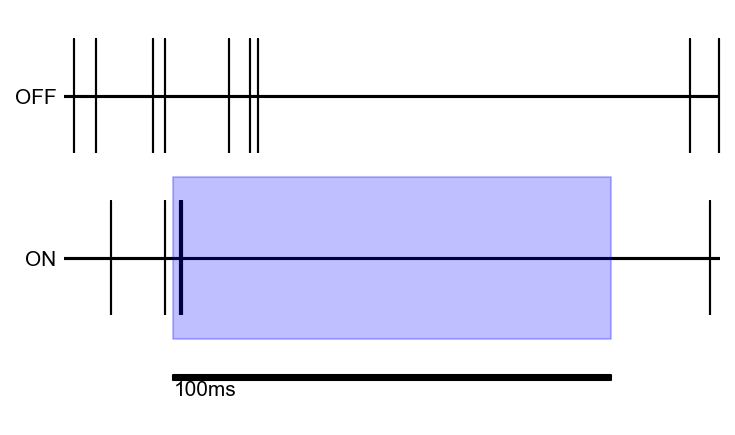

In [50]:
height=1000000
width=1
custommarker = mpl.path.Path([[-width,-height],[-width,height],[width,height],[width,-height]],closed=True)

numtrials = 50
    
for session in tqdm(sessions):
    sessionfile = ilep.loadSessionCached(directory,session)
    if sessionfile.meta.task == 'opto switch':
        continue
    for clust in sessionfile.clusters.good:
        #Caching search -- Unit
        idx = np.equal(sessionfile.spikes.clusters,clust)
        totaltimes = sessionfile.spikes.times[idx]
            
        laserONTrials = np.where(sessionfile.trials.laser_stimulation)[0]
        laserOFFTrials = np.where(np.logical_not(sessionfile.trials.laser_stimulation))[0]
        ONspikes = []
        OFFspikes = []
        count = 0
        for trial in laserONTrials:
            trialstart = sessionfile.trials.starts[trial]
            #Caching search -- Condition
            idx = np.logical_and(      np.greater(totaltimes,trialstart-0.025*sessionfile.meta.fs) , np.less(totaltimes,trialstart+0.125*sessionfile.meta.fs)     )
            times = totaltimes[idx]
            #PSTH times
            ONspikes = np.concatenate((ONspikes,(times-trialstart)/sessionfile.meta.fs*1000))
            count += 1
            if count == numtrials:
                break
        count = 0
        for trial in laserOFFTrials:
            trialstart = sessionfile.trials.starts[trial]    
            #Caching search -- Condition
            idx = np.logical_and(      np.greater(totaltimes,trialstart-0.025*sessionfile.meta.fs) , np.less(totaltimes,trialstart+0.125*sessionfile.meta.fs)     )
            times = totaltimes[idx]
            #PSTH times
            OFFspikes = np.concatenate((OFFspikes,(times-trialstart)/sessionfile.meta.fs*1000))
            count += 1
            if count == numtrials:
                break
        plt.close('all')
        fig, ax = plt.subplots(figsize=(5,3))
        ax.scatter(OFFspikes,np.zeros(len(OFFspikes)),color='black',marker=custommarker.vertices,s=3000)
        ax.plot([-25,125],[0,0],color='black')

        ax.scatter(ONspikes,np.zeros(len(ONspikes))-1,color='black',marker=custommarker.vertices,s=3000)
        ax.plot([-25,125],[-1,-1],color='black')
        ax.fill_between([0,100],[-1.5,-1.5],[-0.5,-0.5],color='blue',alpha=0.25,zorder=5)

        ax.set_ylim([-2,0.5])
        ax.set_xlim([-25,125])

        ax.set_xticks([])
        ax.set_yticks([0,-1])
        ax.ticklabel_format(style='plain')
        ax.set_yticklabels(['OFF','ON'])

        ax.fill_between([0,100],[-.25-1.5,-.25-1.5],[-.25-1.475,-.25-1.475],color='black')
        ax.text(0,-.25-1.6,'100ms')
                
        ax.spines['bottom'].set_visible(False)
        ax.get_xaxis().set_visible(False)
        ax.spines['left'].set_visible(False)

        plt.tight_layout()
        fig.savefig(os.path.join('D:\\\\Figures','Opsin Spiketrains',session + ' cluster ' + str(clust) + ' ON-OFF Spiketrain.png'),transparent=False,facecolor="white")

print('finished')

100%|██████████| 72/72 [02:16<00:00,  1.89s/it]


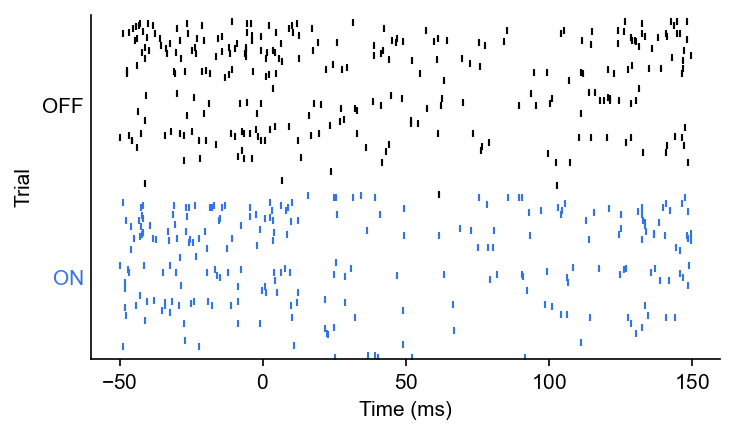

In [38]:
### SEPARATED BY GO/NOGO OR TARGET/NONTARGET

starttime = -0.05
endtime = 0.15
numbins = 100 + 1

height=10
width=1
trans=0.125
custommarker = mpl.path.Path([[-width,-height],[-width,height],[width,height],[width,-height]],closed=True)
    
opsinanimals = ['BS_86','PB_86','BS_92','PB_92','BS_100','PB_100','BS_103','BS_111','BS_119','BS_174','BS_179']
for session in tqdm(os.listdir(ops_directory)):
    #break
    try:
        sessionfile = ilep.loadSessionCached(ops_directory,session)
        
        if sessionfile.meta.task == 'opto switch':
            continue
            
        if not sessionfile.meta.animal in opsinanimals:
            continue

        if sessionfile.meta.cloudy:
            continue
            
        neurons = sessionfile.clusters.good

        ##########################################################################################################################
        
        for clust in neurons:
        
            conditions = []
            
            condition = SimpleNamespace()
            laser_on = sessionfile.trials.laser_stimulation
            laser_on = np.array(np.where(laser_on)[0])
            laser_on = laser_on[np.isin(laser_on,sessionfile.trim[clust].trimmed_trials)]
            condition.trials = laser_on
            condition.label = 'ON'
            condition.color = LASER_COLOR
            conditions.append(condition)

            condition = SimpleNamespace()
            laser_off = np.logical_not(sessionfile.trials.laser_stimulation)
            laser_off = np.array(np.where(laser_off)[0])
            laser_off = laser_off[np.isin(laser_off,sessionfile.trim[clust].trimmed_trials)]
            condition.trials = laser_off
            condition.label = 'OFF'
            condition.color = 'k'
            conditions.append(condition)

            totaltrials = 0
            for cond in conditions:
                totaltrials += len(cond.trials)
            
            #Caching search -- Unit
            idx = np.equal(sessionfile.spikes.clusters,clust)
            totaltimes = sessionfile.spikes.times[idx]
            
            #FRpertrial = []
            ##Overall Nonstationarity
            #for trial in range(sessionfile.meta.length_in_trials):
            #    trialstart = sessionfile.trials.starts[trial]
            #    trialend = sessionfile.trials.ends[trial]
            #    idxtone = np.logical_and(   np.greater(totaltimes,trialstart) , np.less(totaltimes,trialend)  )
            #    timestone = totaltimes[idxtone]
            #    trialtime = (trialend-trialstart) / sessionfile.meta.fs
            #    FRpertrial.append(len(timestone) / trialtime)
            
            for cond in conditions:
                cond.timestoplot = []
                cond.trialstoplot = []
                
                for trialidx,trial in enumerate(cond.trials):
                    trialstart = sessionfile.trials.starts[trial]
                    
                    #Caching search -- Condition
                    idx = np.logical_and(      np.greater(totaltimes,trialstart+starttime*sessionfile.meta.fs) , np.less(totaltimes,trialstart+endtime*sessionfile.meta.fs)     )
                    times = totaltimes[idx]
                    
                    #Each spike time to plot
                    for spike in ((times-trialstart)/sessionfile.meta.fs*1000):
                        cond.timestoplot.append(spike)
                        cond.trialstoplot.append(trialidx+1)
                        
            #############################################---PLOTTING---#############################################
            
            plt.close('all')
            fig,ax = plt.subplots(figsize=(5,3))
            
            #Plot Rasters
            #ylims1 = [1,totaltrials]
            offset = 0
            tickmeans = []
            ticklabels = []
            numtrials = 0
            for cond in conditions:
                ax.scatter(cond.timestoplot,np.array(cond.trialstoplot)+offset,s=7.5,c=cond.color,marker=custommarker.vertices)
                
                if cond.label == 'ON':
                    starttrial = offset
                    endtrial = offset+len(cond.trials)
                    #ax.fill_between([0,100],[starttrial,starttrial],[endtrial,endtrial],color=cond.color,alpha=trans,zorder=-10,edgecolor='None')
                
                tickmeans.append(0.5*len(cond.trials)+offset)
                #ax1.fill_between([starttime*1000,endtime*1000],[offset,offset],[offset+len(cond.trials),offset+len(cond.trials)],fc=cond.color,alpha=trans,zorder=-10)
                offset += len(cond.trials)
                ticklabels.append(cond.label)
                numtrials += len(cond.trials)
            ylims1 = [1,numtrials]
            ax.set_ylim(ylims1)
            ax.set_yticks(tickmeans)
            ax.set_yticklabels(ticklabels)
            
            ax.tick_params(axis='y',length=0)
            colors = [cond.color for cond in conditions]
            [t.set_color(colors[idx]) for idx,t in enumerate(ax.yaxis.get_ticklabels())]
            
            ax.tick_params(axis='x',direction='out')
            ax.set_xticks([-50,0,50,100,150])
            #ax.set_xticklabels(['','','','',''])
            #ax.spines['bottom'].set_visible(False)
            #ax.get_xaxis().set_visible(False)
            
            
            #ylims = ax.get_ylim()
            #ax.plot([0,100],[ylims[0],ylims[0]],'blue',zorder=10,lw=4)
            #ax.set_ylim(ylims)
            
            ax.set_ylabel('Trial')
            ax.set_xlabel('Time (ms)')
            
            xlimsfromrasters = ax.get_xlim()
            
            plt.tight_layout()
            fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Rasters','PNGs',session + ' cluster ' + str(clust) + ' raster.png'),transparent=False,facecolor="white")
            fig.savefig(os.path.join('D:\\\\Figures','Opsin FIgures','Rasters','PDFs',session + ' cluster ' + str(clust) + ' raster.pdf'),transparent=False,facecolor="white")
    except Exception as e:
        print(e)
        pass

100%|██████████| 72/72 [02:19<00:00,  1.94s/it]


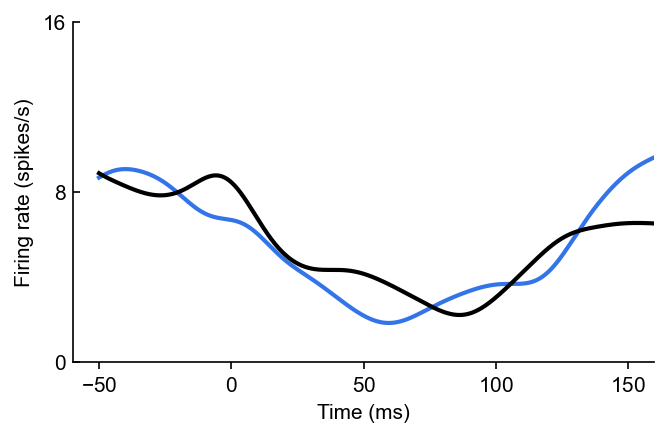

In [39]:
### SEPARATED BY GO/NOGO OR TARGET/NONTARGET

starttime = -0.05
endtime = 0.15
numbins = 100 + 1

height=10
width=1
trans=0.125
custommarker = mpl.path.Path([[-width,-height],[-width,height],[width,height],[width,-height]],closed=True)
    
    
opsinanimals = ['BS_86','PB_86','BS_92','PB_92','BS_100','PB_100','BS_103','BS_111','BS_119','BS_174','BS_179']
for session in tqdm(os.listdir(ops_directory)):
    #break
    try:
        sessionfile = ilep.loadSessionCached(ops_directory,session)
        
        if sessionfile.meta.task == 'opto switch':
            continue
            
        if not sessionfile.meta.animal in opsinanimals:
            continue

        if sessionfile.meta.cloudy:
            continue
            
        neurons = sessionfile.clusters.good

        ##########################################################################################################################
        
        for clust in neurons:
        
            conditions = []
            
            condition = SimpleNamespace()
            laser_on = sessionfile.trials.laser_stimulation
            laser_on = np.array(np.where(laser_on)[0])
            laser_on = laser_on[np.isin(laser_on,sessionfile.trim[clust].trimmed_trials)]
            condition.trials = laser_on
            condition.label = 'ON'
            condition.color = LASER_COLOR
            conditions.append(condition)

            condition = SimpleNamespace()
            laser_off = np.logical_not(sessionfile.trials.laser_stimulation)
            laser_off = np.array(np.where(laser_off)[0])
            laser_off = laser_off[np.isin(laser_off,sessionfile.trim[clust].trimmed_trials)]
            condition.trials = laser_off
            condition.label = 'OFF'
            condition.color = 'k'
            conditions.append(condition)

            totaltrials = 0
            for cond in conditions:
                totaltrials += len(cond.trials)
            
            #Caching search -- Unit
            idx = np.equal(sessionfile.spikes.clusters,clust)
            totaltimes = sessionfile.spikes.times[idx]
            
            #FRpertrial = []
            ##Overall Nonstationarity
            #for trial in range(sessionfile.meta.length_in_trials):
            #    trialstart = sessionfile.trials.starts[trial]
            #    trialend = sessionfile.trials.ends[trial]
            #    idxtone = np.logical_and(   np.greater(totaltimes,trialstart) , np.less(totaltimes,trialend)  )
            #    timestone = totaltimes[idxtone]
            #    trialtime = (trialend-trialstart) / sessionfile.meta.fs
            #    FRpertrial.append(len(timestone) / trialtime)
            
            for cond in conditions:
                cond.timestoplot = []
                cond.trialstoplot = []
                cond.peristimulustimes = []
                
                for trialidx,trial in enumerate(cond.trials):
                    trialstart = sessionfile.trials.starts[trial]
                    
                    #Caching search -- Condition
                    idx = np.logical_and(      np.greater(totaltimes,trialstart+starttime*sessionfile.meta.fs-0.25*30000) , np.less(totaltimes,trialstart+endtime*sessionfile.meta.fs+0.25*30000)     )
                    times = totaltimes[idx]
                        
                    #PSTH times
                    cond.peristimulustimes = np.concatenate((cond.peristimulustimes,(times-trialstart)/sessionfile.meta.fs*1000))
            #############################################---PLOTTING---#############################################
            
            plt.close('all')
            fig,ax = plt.subplots(figsize=(5,3))
            
            #Plot PSTHs
            #bw=0.10
            bw=0.05
            xrange = np.linspace(starttime*1000,endtime*1000-starttime*1000,num=1000)
            ind = 0
            max_FR = -np.inf
            for cond in conditions:
                try:
                    KDE = gaussian_kde((cond.peristimulustimes),bw_method=bw).evaluate(xrange)
                    FR = KDE*len(cond.peristimulustimes) / len(cond.trials) * 1000
                    targetmean = len(cond.peristimulustimes) / (endtime-starttime) / len(cond.trials)
                    #if(sigs[ind]):
                    #ax.plot(xrange,targetmean*KDE/np.mean(KDE),c=cond.color,lw=2)
                    ax.plot(xrange,FR,c=cond.color,lw=2)
                    #else:
                    #    ax2.plot(xrange,targetmean*KDE/np.mean(KDE),c=cond.color,lw=2,alpha=0.25)
                    max_FR = max(max_FR,np.max(FR))
                except Exception as e:
                    print('PSTHs: '+str(e))
                ind = ind + 1
                
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel('Firing rate (spikes/s)')
            ax.tick_params(axis='x',direction='out')
            ax.set_xticks([-50,0,50,100,150])
            #colors = ['k','b','b','b','k']
            #[t.set_color(colors[idx]) for idx,t in enumerate(ax.xaxis.get_ticklabels())]
            #[t.set_color(colors[int(idx/2)]) for idx,t in enumerate(ax.xaxis.get_ticklines())]
            #[l.set(color=colors[int(idx/2)]) for idx,l in enumerate(ax.xaxis.get_ticklines())]
            #[print(idx) for idx,t in enumerate(ax.xaxis.get_majoticklines())]
            
            ax.set_xlim(xlimsfromrasters)
            #ax.set_ylim([-5,90])
            #ax.set_yticks([0,30,60,90])
            
            max_FR_value = max_FR * 1.1
            sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
            idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
            valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
            limit = np.min(valid_limits)
            ax.set_ylim([0,limit])
            ax.set_yticks([0,limit/2,limit])
            ax.set_yticklabels(['0',str(int(limit/2)),str(limit)])
            
            #ylims = ax.get_ylim()
            #ax.plot([0,100],[ylims[0],ylims[0]],'blue',zorder=10,lw=4)
            #ax.set_ylim(ylims)
            
            #if sessionfile.responsiveness[clust]['all_trials'].FRbaseline < 8:
            #    continue
            
            #break
            fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','PSTHs','PNGs',session + ' cluster ' + str(clust) + ' psth.png'),transparent=False,facecolor="white")
            fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','PSTHs','PDFs',session + ' cluster ' + str(clust) + ' psth.pdf'),transparent=False,facecolor="white")
    except Exception as e:
        print(e)
        pass

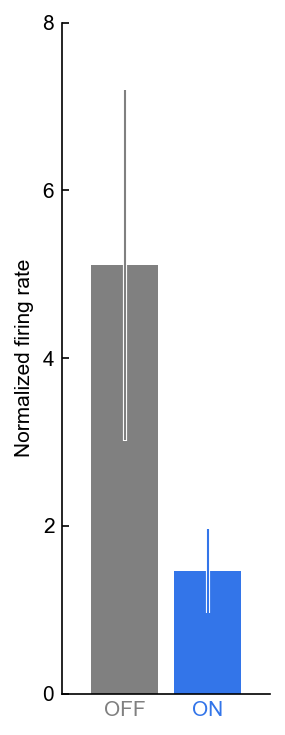

In [65]:
sessionidxs = [0,0,0]
clusts = [6,36,59]
window = 0.3#seconds

FRsONnorm = []
FRsOFFnorm = []

for idx,(session,clust) in enumerate(zip(sessionidxs,clusts)):
    sessionfile = ilep.loadSessionCached(directory,sessions[session])
        
    conditions = ilep.getAllConditions(sessionfile,clust)
    
    FRsON = []
    for trial in conditions['laser_on'].trials:
        trialstart = sessionfile.trials.starts[trial]
        windowend = trialstart + window*sessionfile.meta.fs
        spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=trialstart,endtime=windowend)
        FRsON.append( len(spikes) / window)
    FRsONnorm.append(np.mean(   FRsON / sessionfile.responsiveness[clust]['laser_on'].FRbaseline   ))
    
    FRsOFF = []
    for trial in conditions['laser_off'].trials:
        trialstart = sessionfile.trials.starts[trial]
        windowend = trialstart + window*sessionfile.meta.fs
        spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=trialstart,endtime=windowend)
        FRsOFF.append( len(spikes) / window)
    FRsOFFnorm.append(np.mean(   FRsOFF / sessionfile.responsiveness[clust]['laser_off'].FRbaseline   ))

fig,ax = plt.subplots(figsize=(2,5))

FR_OFF = np.mean(FRsOFFnorm)
FR_ON = np.mean(FRsONnorm)
FR_OFFsem = sem(FRsOFFnorm)
FR_ONsem = sem(FRsONnorm)

ax.bar([0],[FR_OFF],color='grey')
ax.bar([1],[FR_ON],color=LASER_COLOR)
thick = 1
thicksc=2
ax.errorbar([0,1],[FR_OFF,FR_ON],[FR_OFFsem*1.01,FR_ONsem*1.01],lw=0,elinewidth=thick*thicksc,color='white',zorder=10)
#ax.errorbar([0,1],[FR_OFF,FR_ON],[FR_OFFsem,FR_ONsem],lw=0,elinewidth=thick,capsize=10,capthick=thick,color='k',zorder=11)
ax.errorbar([0],[FR_OFF],[FR_OFFsem],lw=0,elinewidth=thick,color='grey',zorder=11)
ax.errorbar([1],[FR_ON],[FR_ONsem],lw=0,elinewidth=thick,color=LASER_COLOR,zorder=11)
ax.set_xlim([-0.75,1.75])
ax.set_ylim([0,8])
ax.set_yticks([0,2,4,6,8])

ax.set_ylabel('Normalized firing rate')

ax.set_xticks([0,1])
ax.set_xticklabels(['OFF','ON'])
ax.tick_params(axis='x',length=0)
colors = ['grey',LASER_COLOR]
[t.set_color(colors[idx]) for idx,t in enumerate(ax.xaxis.get_ticklabels())]

#ax.plot([np.nan],[np.nan],color='k',label='SEM',lw=thick)
#ax.legend(frameon=False,loc='upper right')

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','M2 Opsin suppressed cells only bar plot.pdf'),transparent=False,facecolor="white")

In [4]:
### SEPARATED BY GO/NOGO OR TARGET/NONTARGET

FRmodOFF = []
FRmodON = []
    
trials_overlap = 0
    
for session in tqdm(sessions):
    #break
    try:
        sessionfile = ilep.loadSessionCached(directory,session)
        
        if sessionfile.meta.task == 'opto switch':
            continue

        ##########################################################################################################################
        
        for clust in sessionfile.clusters.good:
            
            conditions = ilep.getAllConditions(sessionfile,clust)
            for trial in conditions['laser_on'].trials:
                if trial in conditions['laser_off'].trials:
                    trials_overlap += 1
            
            if sessionfile.responsiveness[clust]['laser_off'].FRmodulation > 10 and sessionfile.responsiveness[clust]['laser_on'].FRmodulation < 5:
                print(session)
                print(clust)
            
            FRmodOFF.append(sessionfile.responsiveness[clust]['laser_off'].FRmodulation)
            FRmodON.append(sessionfile.responsiveness[clust]['laser_on'].FRmodulation)
    except Exception as e:
        print(e)
        raise
        
FRmodON = np.array(FRmodON)
FRmodOFF = np.array(FRmodOFF)

fig,ax = plt.subplots(figsize=(5,5))
ax.scatter(FRmodOFF,FRmodON,s=5,color='k')

xlims = ax.get_xlim()
ylims = ax.get_ylim()
lims = [min(xlims[0],ylims[0]) , max(xlims[1],ylims[1])]
ax.plot(lims,lims,linestyle='--',color='grey',label='y=x')
ax.set_xlim(lims)
ax.set_ylim(lims)

ax.set_xlabel('FR modulation laser OFF (spikes/s)')
ax.set_ylabel('FR modulation laser ON (spikes/s)')
ax.legend(frameon=False,loc='lower right')
fig.savefig(os.path.join('D:\\\\Figures','Opsin Control Modulation ON-OFF.pdf'),transparent=False,facecolor="white")

NameError: name 'sessions' is not defined

In [141]:
FRmod_on = []
FRmod_off = []

opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not sessionfile.meta.animal in opsinanimals:
        continue
    
    if sessionfile.meta.cloudy:
        continue
    
    for clust in sessionfile.clusters.good:
        FRmod_on.append(sessionfile.responsiveness[clust]['laser_on'].FRmodulation)
        FRmod_off.append(sessionfile.responsiveness[clust]['laser_off'].FRmodulation)

100%|██████████| 52/52 [00:00<00:00, 135.10it/s]


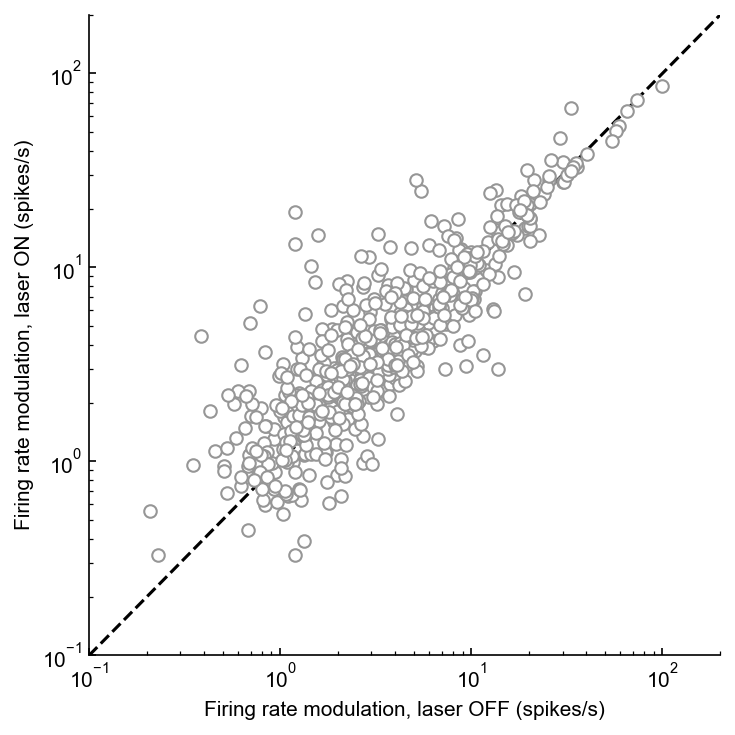

In [146]:
fig,ax = plt.subplots(figsize=(5,5))
ax.scatter(FRmod_off,FRmod_on,ec=GOOD_GREY,fc='white')
xlims = [0,105]#ax.get_xlim()
ylims = [0,105]#ax.get_ylim()
xlims = [0.1,200]#ax.get_xlim()
ylims = [0.1,200]#ax.get_ylim()
ax.plot(xlims,ylims,color='k',linestyle='--',zorder=-10)
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)')
ax.set_ylabel('Firing rate modulation, laser ON (spikes/s)')

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin FR modulation ON-OFF.pdf'),transparent=False,facecolor="white")

In [40]:
FRmod_from_laser = []

opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not sessionfile.meta.animal in opsinanimals:
        continue
    
    if sessionfile.meta.cloudy:
        continue
            
    for clust in sessionfile.clusters.good:
        base_FR = sessionfile.responsiveness[clust]['laser_off'].FR
        modulated_FR = sessionfile.responsiveness[clust]['laser_on'].FR
        FRmod_from_laser.append(modulated_FR-base_FR)

100%|██████████| 52/52 [00:00<00:00, 234.33it/s]


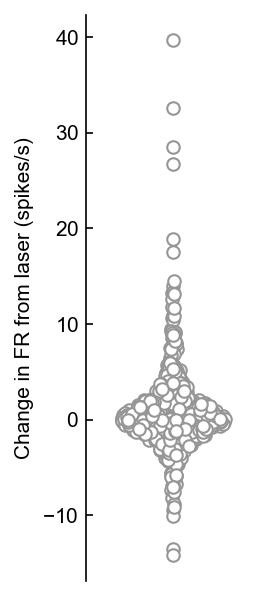

In [41]:
fig,ax = plt.subplots(figsize=(1.5,5))

X = np.ones_like(FRmod_from_laser)
X,Y = ilep.violin(X,FRmod_from_laser,width=0.75)

ax.scatter(X,Y,ec=GOOD_GREY,fc='white')
ax.set_xlim([0.5,1.5])
ax.set_ylabel('Change in FR from laser (spikes/s)')

ax.set_xticks([])
ax.spines['bottom'].set_visible(False)
#ax.set_yscale('log')

fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin FR modulation Direction.pdf'),transparent=False,facecolor="white")

In [90]:
FR = []
FRmod = []

for session in tqdm(os.listdir(act_directory)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    for clust in sessionfile.clusters.good:
        FR.append(sessionfile.responsiveness[clust]['all_trials'].FRbaseline)
        FRmod.append(sessionfile.responsiveness[clust]['all_trials'].FRmodulation)

100%|██████████| 398/398 [00:08<00:00, 46.70it/s]


Text(0, 0.5, 'Firing rate modulation (spikes/s)')

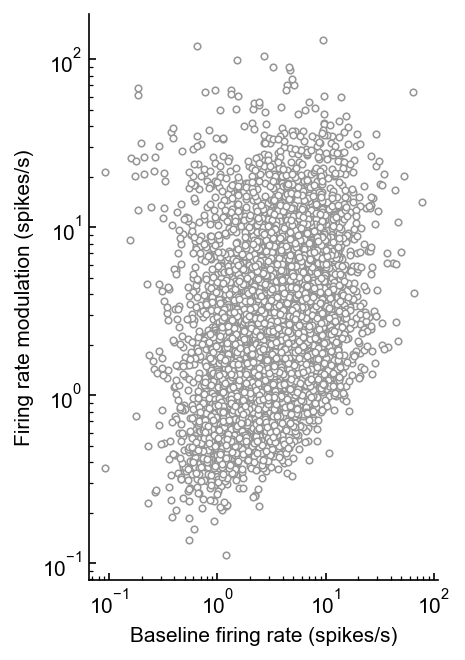

In [98]:
fig,ax = plt.subplots(figsize=(3,5))
ax.scatter(FR,FRmod,s=10,ec=GOOD_GREY,fc='white',lw=0.75)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('Baseline firing rate (spikes/s)')
ax.set_ylabel('Firing rate modulation (spikes/s)')

In [196]:
naive_baseline_FRmod = 3.3782569631626256
CR_on_FR = []
NCR_on_FR = []
CR_off_FR = []
NCR_off_FR = []

opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not sessionfile.meta.animal in opsinanimals:
        continue
    
    if sessionfile.meta.cloudy:
        continue
                        
    for clust in sessionfile.clusters.good:
        cached_spikes = ilep.getSpikeTimes(sessionfile,clust=clust)
        allConditions = ilep.getAllConditions(sessionfile,clust)
        
        #NCRs first
        
        this_CR_on_FR = []
        this_NCR_on_FR = []
        this_CR_off_FR = []
        this_NCR_off_FR = []
        
        if sessionfile.responsiveness[clust]['laser_off'].FRmodulation < naive_baseline_FRmod:
            for trial in allConditions['laser_on'].trials:
                #spikes = ilep.getSpikeTimes(sessionfile,starttime=sessionfile.trials.starts[trial],endtime=sessionfile.trials.starts[trial]*3000,cachedtimes=cached_spikes)
                spikes = ilep.getTrialSpikes(sessionfile,trial,startbuffer=0,endbuffer=-2.4,cachedtimes=cached_spikes)
                this_NCR_on_FR.append(len(spikes))
            for trial in allConditions['laser_off'].trials:
                spikes = ilep.getTrialSpikes(sessionfile,trial,startbuffer=0,endbuffer=-2.4,cachedtimes=cached_spikes)
                this_NCR_off_FR.append(len(spikes))
        
        #CRs second
        elif sessionfile.responsiveness[clust]['laser_off'].FRmodulation >= naive_baseline_FRmod:
            for trial in allConditions['laser_on'].trials:
                spikes = ilep.getTrialSpikes(sessionfile,trial,startbuffer=0,endbuffer=-2.4,cachedtimes=cached_spikes)
                this_CR_on_FR.append(len(spikes))
            for trial in allConditions['laser_off'].trials:
                spikes = ilep.getTrialSpikes(sessionfile,trial,startbuffer=0,endbuffer=-2.4,cachedtimes=cached_spikes)
                this_CR_off_FR.append(len(spikes))
                
        CR_on_FR.append(np.nanmean(this_CR_on_FR))
        NCR_on_FR.append(np.nanmean(this_NCR_on_FR))
        CR_off_FR.append(np.nanmean(this_CR_off_FR))
        NCR_off_FR.append(np.nanmean(this_NCR_off_FR))
                
CR_on_FR_SEM = sem(CR_on_FR,nan_policy='omit') * 10
NCR_on_FR_SEM = sem(NCR_on_FR,nan_policy='omit') * 10
CR_off_FR_SEM = sem(CR_off_FR,nan_policy='omit') * 10
NCR_off_FR_SEM = sem(NCR_off_FR,nan_policy='omit') * 10

CR_on_FR_STD = np.nanstd(CR_on_FR) * 10
NCR_on_FR_STD = np.nanstd(NCR_on_FR) * 10
CR_off_FR_STD = np.nanstd(CR_off_FR) * 10
NCR_off_FR_STD = np.nanstd(NCR_off_FR) * 10   
        
CR_on_FR = np.nanmean(CR_on_FR)*10
NCR_on_FR = np.nanmean(NCR_on_FR)*10
CR_off_FR = np.nanmean(CR_off_FR)*10
NCR_off_FR = np.nanmean(NCR_off_FR)*10

  0%|          | 0/52 [00:00<?, ?it/s]<ipython-input-196-2af406faaac8>:46: RuntimeWarning: Mean of empty slice
  CR_on_FR.append(np.nanmean(this_CR_on_FR))
<ipython-input-196-2af406faaac8>:47: RuntimeWarning: Mean of empty slice
  NCR_on_FR.append(np.nanmean(this_NCR_on_FR))
<ipython-input-196-2af406faaac8>:48: RuntimeWarning: Mean of empty slice
  CR_off_FR.append(np.nanmean(this_CR_off_FR))
<ipython-input-196-2af406faaac8>:49: RuntimeWarning: Mean of empty slice
  NCR_off_FR.append(np.nanmean(this_NCR_off_FR))
100%|██████████| 52/52 [00:08<00:00,  6.46it/s]


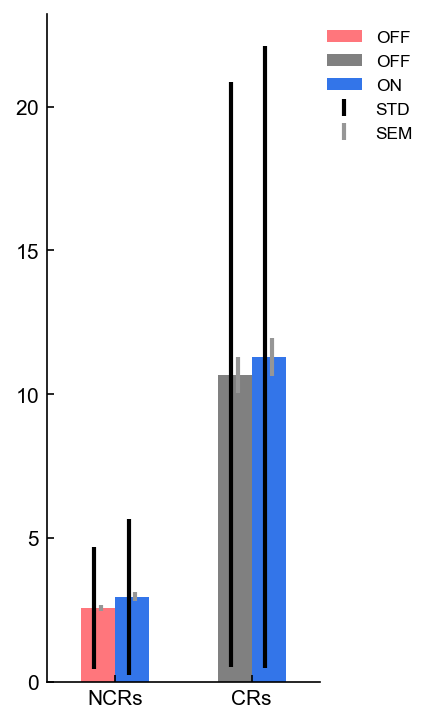

In [202]:
fig,ax = plt.subplots(figsize=(3,5))

ax.bar([-0.25],[NCR_off_FR],color=NCR_COLOR,width=0.5,label='OFF')
ax.bar([0.25],[NCR_on_FR],color=LASER_COLOR,width=0.5)

ax.bar([1.75],[CR_off_FR],color=CR_COLOR,width=0.5,label='OFF')
ax.bar([2.25],[CR_on_FR],color=LASER_COLOR,width=0.5,label='ON')

data = [NCR_off_FR,NCR_on_FR,CR_off_FR,CR_on_FR]
variance_sem = [NCR_off_FR_SEM,NCR_on_FR_SEM,CR_off_FR_SEM,CR_on_FR_SEM]
variance_std = [NCR_off_FR_STD,NCR_on_FR_STD,CR_off_FR_STD,CR_on_FR_STD]
ax.errorbar(np.array([-0.25,0.25,1.75,2.25])-0.05,data,variance_std,color='black',lw=0,elinewidth=2,label='STD')
ax.errorbar(np.array([-0.25,0.25,1.75,2.25])+0.05,data,variance_sem,color=GOOD_GREY,lw=0,elinewidth=2,label='SEM')

ax.set_xlim([-1,3])
ax.set_xticks([0,2])
ax.set_xticklabels(['NCRs','CRs'])

ax.legend(frameon=False,loc=[1,0.8])

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Firing rate CR-NCR.pdf'),transparent=False,facecolor="white")

In [121]:
naive_baseline_FRmod = 3.3782569631626256
on_FR = []
off_FR = []

opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not sessionfile.meta.animal in opsinanimals:
        continue
    
    if sessionfile.meta.cloudy:
        continue
        
    this_on_FR = []
    this_off_FR = []
                        
    for clust in sessionfile.clusters.good:
        cached_spikes = ilep.getSpikeTimes(sessionfile,clust=clust)
        allConditions = ilep.getAllConditions(sessionfile,clust)
        
        for trial in allConditions['laser_on'].trials:
            #spikes = ilep.getSpikeTimes(sessionfile,starttime=sessionfile.trials.starts[trial],endtime=sessionfile.trials.starts[trial]*3000,cachedtimes=cached_spikes)
            spikes = ilep.getTrialSpikes(sessionfile,trial,startbuffer=0,endbuffer=-2.4,cachedtimes=cached_spikes)
            this_on_FR.append(len(spikes))
            
        for trial in allConditions['laser_off'].trials:
            spikes = ilep.getTrialSpikes(sessionfile,trial,startbuffer=0,endbuffer=-2.4,cachedtimes=cached_spikes)
            this_off_FR.append(len(spikes))
            
        on_FR.append(np.nanmean(this_on_FR))
        off_FR.append(np.nanmean(this_off_FR))
                
on_FR = np.array(on_FR)*10
off_FR = np.array(off_FR)*10

  0%|          | 0/52 [00:00<?, ?it/s]<ipython-input-121-d9ac6bf4eee5>:31: RuntimeWarning: Mean of empty slice
  on_FR.append(np.nanmean(this_on_FR))
100%|██████████| 52/52 [00:07<00:00,  6.65it/s]


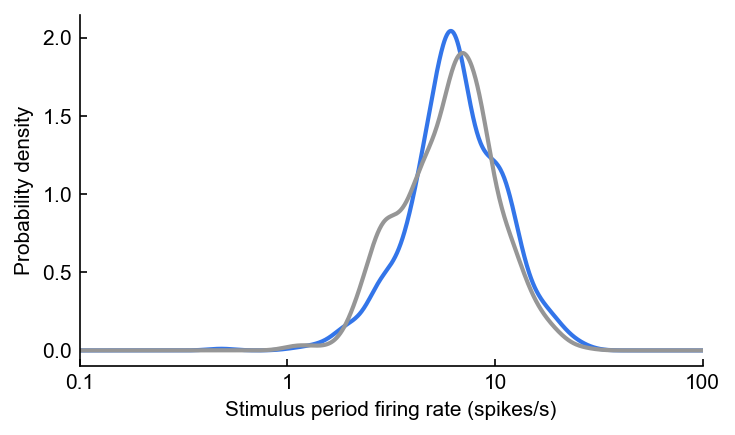

In [127]:
bw = 'scott'

log_on_FR = np.log10(on_FR)
log_off_FR = np.log10(off_FR)
log_on_FR = log_on_FR[np.isfinite(log_on_FR)]
log_off_FR = log_off_FR[np.isfinite(log_off_FR)]

fig,ax = plt.subplots(figsize=(5,3))

xrange = np.linspace(-1,2,1000)
KDE_on = gaussian_kde(log_on_FR,bw_method=bw).evaluate(xrange)
KDE_off = gaussian_kde(log_off_FR,bw_method=bw).evaluate(xrange)
ax.plot(xrange,KDE_on,color=LASER_COLOR,lw=2)
ax.plot(xrange,KDE_off,color=GOOD_GREY,lw=2)

ax.set_xlim([-1,2])
ax.set_xticks([-1,0,1,2])
ax.set_xticklabels(['0.1','1','10','100'])
ax.set_xlabel('Stimulus period firing rate (spikes/s)')
ax.set_ylabel('Probability density')

#ax.axvline(np.log10(naive_baseline_FRmod),color='grey',linestyle='--',lw=1,zorder=-10)
#ax.set_xscale('log')

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Firing rate ON-OFF.pdf'),transparent=False,facecolor="white")

In [37]:
naive_baseline_FRmod = 3.3782569631626256
on_FRmod = []
off_FRmod = []

opsinanimals = ['PB_86','PB_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']
#opsinanimals = ['BS_92']
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)

        
    print(session)
    
    if not sessionfile.meta.animal in opsinanimals:
        continue

    
    if sessionfile.meta.cloudy:
        continue
                        
    for clust in sessionfile.clusters.good:    
        on_FRmod.append(sessionfile.responsiveness[clust]['laser_on'].FRmodulation)
        off_FRmod.append(sessionfile.responsiveness[clust]['laser_off'].FRmodulation)
                
on_FRmod = np.array(on_FRmod)
off_FRmod = np.array(off_FRmod)

 46%|████▌     | 33/72 [00:00<00:00, 323.43it/s]

BS_100_1_opto_AC.pickle
BS_103_1_opto_AC.pickle
BS_103_2_opto_AC.pickle
BS_103_3_opto_AC.pickle
BS_103_4_opto_AC.pickle
BS_103_5_opto_AC.pickle
BS_103_6_opto_AC.pickle
BS_103_7_opto_AC.pickle
BS_103_8_opto_AC.pickle
BS_103_9_opto_AC.pickle
BS_111_10_opto_AC.pickle
BS_111_1_opto_AC.pickle
BS_111_2_opto_AC.pickle
BS_111_3_opto_AC.pickle
BS_111_4_opto_AC.pickle
BS_111_5_opto_AC.pickle
BS_111_6_opto_AC.pickle
BS_111_7_opto_AC.pickle
BS_111_8_opto_AC.pickle
BS_111_9_opto_AC.pickle
BS_119_1_opto_AC.pickle
BS_119_2_opto_AC.pickle
BS_119_3_opto_AC.pickle
BS_119_4_opto_AC.pickle
BS_119_5_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_123_1_opto_AC.pickle
BS_123_2_opto_AC.pickle
BS_123_3_opto_AC.pickle
BS_123_4_opto_AC.pickle
BS_123_5_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_8_opto_AC.pickle
BS_131_1_opto_AC.pickle
BS_131_2_opto_AC.pickle
BS_131_3_opto_AC.pickle
BS_131_4_opto_AC.pickle
BS_131_5_opto_AC.pickle
BS_131_6_opto_AC.pickle
BS_131_7_opto_AC.pickle
BS_131_8_opto_A

100%|██████████| 72/72 [00:00<00:00, 255.26it/s]

BS_179_1_opto_AC.pickle
BS_179_2_opto_AC.pickle
PB_86_10_opto_AC.pickle
PB_86_11_opto_AC.pickle
PB_86_1_opto_AC.pickle
PB_86_2_opto_AC.pickle
PB_86_3_opto_AC.pickle
PB_86_4_opto_AC.pickle
PB_86_5_opto_AC.pickle
PB_86_6_opto_AC.pickle
PB_86_7_opto_AC.pickle
PB_86_8_opto_AC.pickle
PB_86_9_opto_AC.pickle
PB_92_11_opto_AC.pickle
PB_92_12_opto_AC.pickle
PB_92_1_opto_AC.pickle
PB_92_2_opto_AC.pickle
PB_92_3_opto_AC.pickle
PB_92_4_opto_AC.pickle
PB_92_5_opto_AC.pickle
PB_92_6_opto_AC.pickle
PB_92_9_opto_AC.pickle


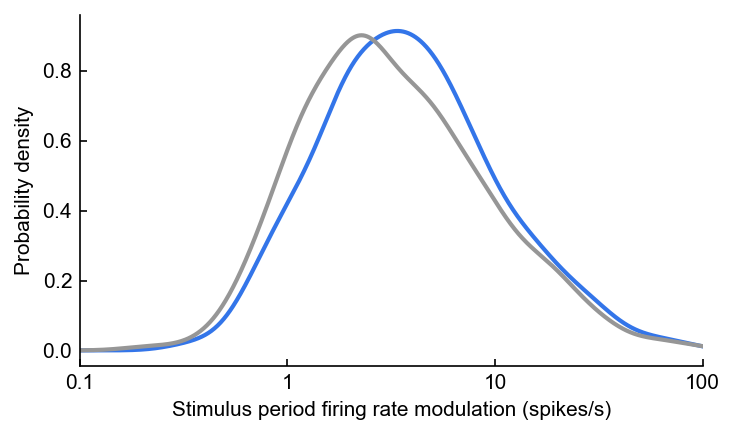

In [128]:
bw = 'scott'

log_on_FRmod = np.log10(on_FRmod)
log_off_FRmod = np.log10(off_FRmod)
log_on_FRmod = log_on_FRmod[np.isfinite(log_on_FRmod)]
log_off_FRmod = log_off_FRmod[np.isfinite(log_off_FRmod)]

fig,ax = plt.subplots(figsize=(5,3))

xrange = np.linspace(-1,2,1000)
KDE_on = gaussian_kde(log_on_FRmod,bw_method=bw).evaluate(xrange)
KDE_off = gaussian_kde(log_off_FRmod,bw_method=bw).evaluate(xrange)
ax.plot(xrange,KDE_on,color=LASER_COLOR,lw=2)
ax.plot(xrange,KDE_off,color=GOOD_GREY,lw=2)

ax.set_xlim([-1,2])
ax.set_xticks([-1,0,1,2])
ax.set_xticklabels(['0.1','1','10','100'])
ax.set_xlabel('Stimulus period firing rate modulation (spikes/s)')
ax.set_ylabel('Probability density')

#ax.axvline(np.log10(naive_baseline_FRmod),color='grey',linestyle='--',lw=1,zorder=-10)
#ax.set_xscale('log')

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin FRmod ON-OFF.pdf'),transparent=False,facecolor="white")

# Learning Phases

In [ ]:
animalnames = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']

animals = dict()
for animal in animalnames:
    animals[animal] = SimpleNamespace()
    animals[animal].name = animal
    
animals['BS_86'].reversal = 12
animals['BS_92'].reversal = 12
animals['BS_100'].reversal = 12
animals['BS_103'].reversal = 12
animals['BS_111'].reversal = 12
animals['BS_119'].reversal = 12
animals['BS_174'].reversal = 12
animals['BS_179'].reversal = 12

In [161]:
### SEPARATED BY GO/NOGO OR TARGET/NONTARGET

def plot_raster(ax,sessionfile,clust):

    starttime = -0.05
    endtime = 0.15
    numbins = 100 + 1

    height=10
    width=1
    trans=0.125
    custommarker = mpl.path.Path([[-width,-height],[-width,height],[width,height],[width,-height]],closed=True)

    ##########################################################################################################################
    
    conditions = []
            
    condition = SimpleNamespace()
    laser_on = sessionfile.trials.laser_stimulation
    laser_on = np.array(np.where(laser_on)[0])
    laser_on = laser_on[np.isin(laser_on,sessionfile.trim[clust].trimmed_trials)]
    condition.trials = laser_on
    condition.label = 'ON'
    condition.color = LASER_COLOR
    conditions.append(condition)

    condition = SimpleNamespace()
    laser_off = np.logical_not(sessionfile.trials.laser_stimulation)
    laser_off = np.array(np.where(laser_off)[0])
    laser_off = laser_off[np.isin(laser_off,sessionfile.trim[clust].trimmed_trials)]
    condition.trials = laser_off
    condition.label = 'OFF'
    condition.color = 'k'
    conditions.append(condition)

    totaltrials = 0
    for cond in conditions:
        totaltrials += len(cond.trials)
            
    #Caching search -- Unit
    idx = np.equal(sessionfile.spikes.clusters,clust)
    totaltimes = sessionfile.spikes.times[idx]
            
    #FRpertrial = []
    ##Overall Nonstationarity
    #for trial in range(sessionfile.meta.length_in_trials):
    #    trialstart = sessionfile.trials.starts[trial]
    #    trialend = sessionfile.trials.ends[trial]
    #    idxtone = np.logical_and(   np.greater(totaltimes,trialstart) , np.less(totaltimes,trialend)  )
    #    timestone = totaltimes[idxtone]
    #    trialtime = (trialend-trialstart) / sessionfile.meta.fs
    #    FRpertrial.append(len(timestone) / trialtime)
            
    for cond in conditions:
        cond.timestoplot = []
        cond.trialstoplot = []
                
        for trialidx,trial in enumerate(cond.trials):
            trialstart = sessionfile.trials.starts[trial]
                    
            #Caching search -- Condition
            idx = np.logical_and(      np.greater(totaltimes,trialstart+starttime*sessionfile.meta.fs) , np.less(totaltimes,trialstart+endtime*sessionfile.meta.fs)     )
            times = totaltimes[idx]
                    
            #Each spike time to plot
            for spike in ((times-trialstart)/sessionfile.meta.fs*1000):
                cond.timestoplot.append(spike)
                cond.trialstoplot.append(trialidx+1)
                        
    #############################################---PLOTTING---#############################################
            
    #Plot Rasters
    #ylims1 = [1,totaltrials]
    offset = 0
    tickmeans = []
    ticklabels = []
    numtrials = 0
    for cond in conditions:
        ax.scatter(cond.timestoplot,np.array(cond.trialstoplot)+offset,s=7.5,c=cond.color,marker=custommarker.vertices)
                
        if cond.label == 'ON':
            starttrial = offset
            endtrial = offset+len(cond.trials)
            #ax.fill_between([0,100],[starttrial,starttrial],[endtrial,endtrial],color=cond.color,alpha=trans,zorder=-10,edgecolor='None')
                
        tickmeans.append(0.5*len(cond.trials)+offset)
        #ax1.fill_between([starttime*1000,endtime*1000],[offset,offset],[offset+len(cond.trials),offset+len(cond.trials)],fc=cond.color,alpha=trans,zorder=-10)
        offset += len(cond.trials)
        ticklabels.append(cond.label)
        numtrials += len(cond.trials)
    ylims1 = [1,numtrials]
    ax.set_ylim(ylims1)
    ax.set_yticks(tickmeans)
    ax.set_yticklabels(ticklabels)
            
    ax.tick_params(axis='y',length=0)
    colors = [cond.color for cond in conditions]
    [t.set_color(colors[idx]) for idx,t in enumerate(ax.yaxis.get_ticklabels())]
            
    ax.tick_params(axis='x',direction='out')
    ax.set_xticks([-50,0,50,100,150])
    #ax.set_xticklabels(['','','','',''])
    #ax.spines['bottom'].set_visible(False)
    #ax.get_xaxis().set_visible(False)
                        
    #ylims = ax.get_ylim()
    #ax.plot([0,100],[ylims[0],ylims[0]],'blue',zorder=10,lw=4)
    #ax.set_ylim(ylims)
            
    ax.set_ylabel('Trial')
    ax.set_xlabel('Time (ms)')
            
    xlimsfromrasters = ax.get_xlim()

In [176]:
### SEPARATED BY GO/NOGO OR TARGET/NONTARGET

def plot_PSTH(ax,sessionfile,clust):

    starttime = -0.05
    endtime = 0.15
    numbins = 100 + 1

    height=10
    width=1
    trans=0.125
    custommarker = mpl.path.Path([[-width,-height],[-width,height],[width,height],[width,-height]],closed=True)


    opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']

    ##########################################################################################################################
        
    conditions = []
            
    condition = SimpleNamespace()
    laser_on = sessionfile.trials.laser_stimulation
    laser_on = np.array(np.where(laser_on)[0])
    laser_on = laser_on[np.isin(laser_on,sessionfile.trim[clust].trimmed_trials)]
    condition.trials = laser_on
    condition.label = 'ON'
    condition.color = LASER_COLOR
    conditions.append(condition)

    condition = SimpleNamespace()
    laser_off = np.logical_not(sessionfile.trials.laser_stimulation)
    laser_off = np.array(np.where(laser_off)[0])
    laser_off = laser_off[np.isin(laser_off,sessionfile.trim[clust].trimmed_trials)]
    condition.trials = laser_off
    condition.label = 'OFF'
    condition.color = 'k'
    conditions.append(condition)

    totaltrials = 0
    for cond in conditions:
        totaltrials += len(cond.trials)

    #Caching search -- Unit
    idx = np.equal(sessionfile.spikes.clusters,clust)
    totaltimes = sessionfile.spikes.times[idx]

    #FRpertrial = []
    ##Overall Nonstationarity
    #for trial in range(sessionfile.meta.length_in_trials):
    #    trialstart = sessionfile.trials.starts[trial]
    #    trialend = sessionfile.trials.ends[trial]
    #    idxtone = np.logical_and(   np.greater(totaltimes,trialstart) , np.less(totaltimes,trialend)  )
    #    timestone = totaltimes[idxtone]
    #    trialtime = (trialend-trialstart) / sessionfile.meta.fs
    #    FRpertrial.append(len(timestone) / trialtime)

    for cond in conditions:
        cond.timestoplot = []
        cond.trialstoplot = []
        cond.peristimulustimes = []

        for trialidx,trial in enumerate(cond.trials):
            trialstart = sessionfile.trials.starts[trial]

            #Caching search -- Condition
            idx = np.logical_and(      np.greater(totaltimes,trialstart+starttime*sessionfile.meta.fs-0.25*30000) , np.less(totaltimes,trialstart+endtime*sessionfile.meta.fs+0.25*30000)     )
            times = totaltimes[idx]

            #PSTH times
            cond.peristimulustimes = np.concatenate((cond.peristimulustimes,(times-trialstart)/sessionfile.meta.fs*1000))
    #############################################---PLOTTING---#############################################

    #Plot PSTHs
    #bw=0.10
    bw=0.05
    xrange = np.linspace(starttime*1000,endtime*1000-starttime*1000,num=1000)
    ind = 0
    max_FR = -np.inf
    for cond in conditions:
        try:
            KDE = gaussian_kde((cond.peristimulustimes),bw_method=bw).evaluate(xrange)
            FR = KDE*len(cond.peristimulustimes) / len(cond.trials) * 1000
            targetmean = len(cond.peristimulustimes) / (endtime-starttime) / len(cond.trials)
            #if(sigs[ind]):
            #ax.plot(xrange,targetmean*KDE/np.mean(KDE),c=cond.color,lw=2)
            ax.plot(xrange,FR,c=cond.color,lw=2)
            #else:
            #    ax2.plot(xrange,targetmean*KDE/np.mean(KDE),c=cond.color,lw=2,alpha=0.25)
            max_FR = max(max_FR,np.max(FR))
        except Exception as e:
            print('PSTHs: '+str(e))
        ind = ind + 1

    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Firing rate (spikes/s)')
    ax.tick_params(axis='x',direction='out')
    ax.set_xticks([-50,0,50,100,150])
    #colors = ['k','b','b','b','k']
    #[t.set_color(colors[idx]) for idx,t in enumerate(ax.xaxis.get_ticklabels())]
    #[t.set_color(colors[int(idx/2)]) for idx,t in enumerate(ax.xaxis.get_ticklines())]
    #[l.set(color=colors[int(idx/2)]) for idx,l in enumerate(ax.xaxis.get_ticklines())]
    #[print(idx) for idx,t in enumerate(ax.xaxis.get_majoticklines())]

    ax.set_xlim(xlimsfromrasters)
    #ax.set_ylim([-5,90])
    #ax.set_yticks([0,30,60,90])

    max_FR_value = max_FR * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax.set_ylim([0,limit])
    ax.set_yticks([0,limit/2,limit])
    ax.set_yticklabels(['0',str(int(limit/2)),str(limit)])

    ax.plot([0,100],[limit,limit],color=LASER_COLOR,lw=3)
    
    #ylims = ax.get_ylim()
    #ax.plot([0,100],[ylims[0],ylims[0]],'blue',zorder=10,lw=4)
    #ax.set_ylim(ylims)

    #if sessionfile.responsiveness[clust]['all_trials'].FRbaseline < 8:
    #    continue

In [181]:
EnumSession = []
EnumClust = []
sessions = os.listdir(ops_directory)
opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']
for session in sessions:
    sessionfile = ilep.loadSessionCached(ops_directory,session)

    if sessionfile.meta.task == 'opto switch':
        continue

    if not sessionfile.meta.animal in opsinanimals:
        continue

    if sessionfile.meta.cloudy:
        continue

    for clust in sessionfile.clusters.good:
        EnumSession.append(session)
        EnumClust.append(clust)
        
filename = 'C:\\Users\\insan\\Desktop\\Opsin Rasters.pdf'
with PdfPages(filename) as pdf:
    for idx,(session,clust) in tqdm(enumerate(zip(EnumSession,EnumClust))):
        
        if idx % 9 == 0:
            fig = plt.figure(figsize=(12,18))
            gs = fig.add_gridspec(6,3,wspace=0.5,hspace=0.75)#,wspace=0.5)#0.1)
        
        ax1 = plt.subplot(gs[int(np.floor((idx%9)/3)*2),int(idx%3)])#Raster
        ax2 = plt.subplot(gs[int(np.floor((idx%9)/3)*2 + 1),int(idx%3)],sharex=ax1)#PSTH
        
        sessionfile = ilep.loadSessionCached(ops_directory,session)
        plot_raster(ax1,sessionfile,clust)
        plot_PSTH(ax2,sessionfile,clust)
        ax1.set_title(ilep.generateDateString(sessionfile)+' '+str(clust),fontsize=10)
        
        if idx%9 == 8:
            pdf.savefig(fig)
            plt.close('all')
    if idx%9 !=8:
        pdf.savefig(fig)
        plt.close('all')

424it [00:51,  8.28it/s]


In [4]:
FRmod_delta_abs = []
FRmod_delta_pc = []
FRmod_off = []

opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not sessionfile.meta.animal in opsinanimals:
        continue
    
    if sessionfile.meta.cloudy:
        continue
    
    for clust in sessionfile.clusters.good:
        on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
        off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
        
        FRmod_off.append(off)
        FRmod_delta_abs.append( (on-off) )
        FRmod_delta_pc.append( (on-off)/off*100 )

100%|██████████| 72/72 [00:00<00:00, 142.82it/s]


1512.559618441972


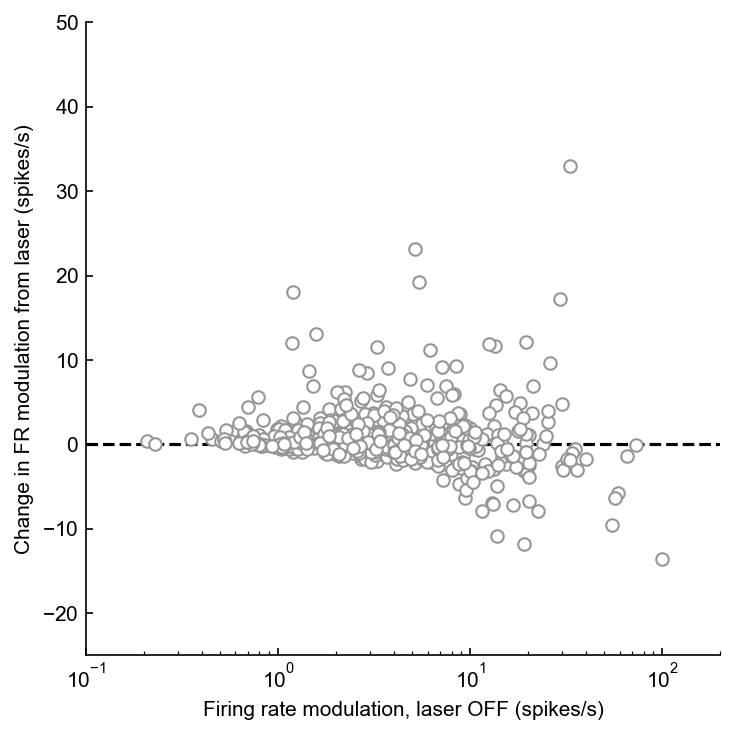

In [236]:
fig,ax = plt.subplots(figsize=(5,5))
ax.scatter(FRmod_off,FRmod_delta_abs,ec=GOOD_GREY,fc='white')
xlims = [0,105]#ax.get_xlim()
ylims = [-25,50]#ax.get_ylim()
xlims = [0.1,200]#ax.get_xlim()

ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)')
ax.set_ylabel('Change in FR modulation from laser (spikes/s)')

#ax.set_yticks([0,200,400,600,800,1000,1200,1400,1600])
#ax.set_yticklabels(['0','200','400','600','800','1000','1200','1400','1600'])

ax.axhline(0,color='k',linestyle='--',zorder=-10)

print(np.nanmax(FRmod_delta))

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin absolute change in FRmod.pdf'),transparent=False,facecolor="white")

<ipython-input-33-c9a636d787f1>:13: MatplotlibDeprecationWarning: The 'subsx' parameter of __init__() has been renamed 'subs' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  ax.set_xscale('log',subsx=[])


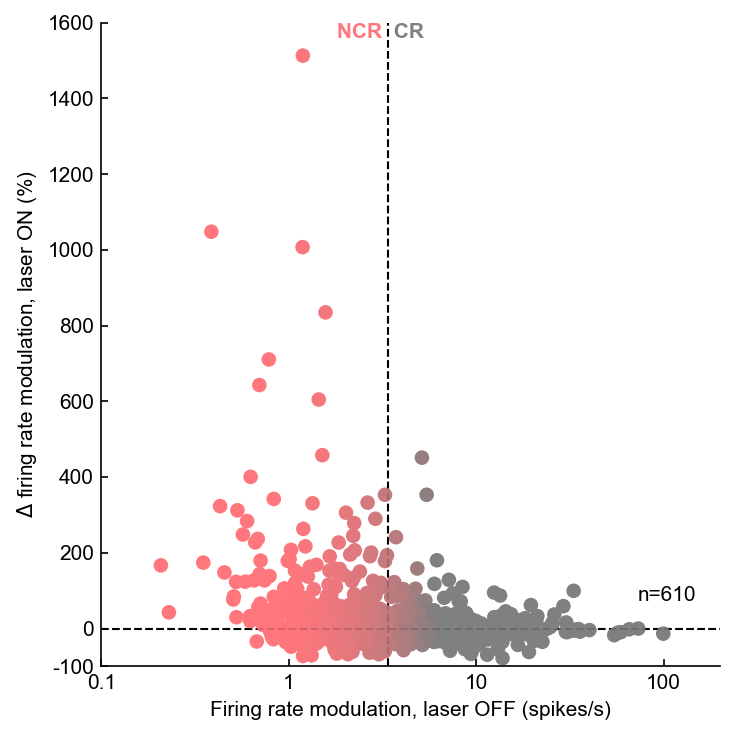

In [33]:
fig,ax = plt.subplots(figsize=(5,5))

CR_NCR_median = 3.3782569631626256
colors = NCR_CR_cmap((np.array(FRmod_off)-1)/5)

ax.scatter(FRmod_off,FRmod_delta_pc,c=colors)

xlims = [0,105]#ax.get_xlim()
ylims = [-100,1600]#ax.get_ylim()
xlims = [0.1,200]#ax.get_xlim()
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_xscale('log',subsx=[])
#ax.set_yscale('log')
ax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)')
ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

ax.set_yticks([-100,0,200,400,600,800,1000,1200,1400,1600])
ax.set_yticklabels(['-100','0','200','400','600','800','1000','1200','1400','1600'])

ax.set_xticks([0.1,1,10,100])
ax.set_xticklabels(['0.1','1','10','100'])

ax.axhline(0,linestyle='--',color='k',zorder=-10,lw=1)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=-10,lw=1)
ax.axhline(0,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)

ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

ax.text(xlims[0]+0.75*(xlims[1]-xlims[0]),ylims[0]+0.125*(ylims[1]-ylims[0]),'n='+str(int(np.sum(np.isfinite(FRmod_delta_pc)))),va='top',ha='right',color='k',fontsize=10)

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin percent change in FRmod.pdf'),transparent=False,facecolor="white")

In [20]:
len(FRmod_delta_pc)

613

In [22]:
np.sum(np.isfinite(FRmod_delta_pc))

610

In [110]:
dualanimals = ['BS_174','BS_179','BS_191','BS_192']
retroanimals = ['PB_86','BS_86','PB_92','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165']
did_learn = ['BS_92','BS_103','BS_111','BS_179']
did_not_learn = ['BS_86','BS_100','BS_119','BS_123','BS_128','BS_131','BS_163','BS_174']
indeterminate = ['BS_139','BS_165','BS_191','BS_192']

#subset_label = 'dual animals'
#subset_label = 'retro animals'
subset_label = 'did learn animals'
#subset_label = 'did not learn animals'
#subset_label = 'indeterminate animals'

if subset_label == 'dual animals':
    animalsToUseOpsinFigures = dualanimals
elif subset_label == 'retro animals':
    animalsToUseOpsinFigures = retroanimals
elif subset_label == 'did learn animals':
    animalsToUseOpsinFigures = did_learn
elif subset_label == 'did not learn animals':
    animalsToUseOpsinFigures = did_not_learn
elif subset_label == 'indeterminate animals':
    animalsToUseOpsinFigures = indeterminate

In [7]:
hitsON = 0
missesON = 0
falarmsON = 0
crejectsON = 0
hitsOFF = 0
missesOFF = 0
falarmsOFF = 0
crejectsOFF = 0

for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not sessionfile.meta.animal in animalsToUseOpsinFigures:
        continue
    
    #This session doesn't have laser stimulation. Need Blake to explain.
    if sessionfile.meta.animal == 'BS_165' and sessionfile.meta.day_of_recording == 1:
        continue
        
    #Check to see if the first 200 trials are opto or not
    reversal_nonopto = False;
    if (sessionfile.meta.length_in_trials > 200) and (np.sum(sessionfile.trials.laser_stimulation[range(200)]) == 0):
        reversal_nonopto = True;
 
    laser_on_trials = []
    laser_off_trials = []
    for trial in range(sessionfile.meta.length_in_trials):
        
        #If the first 200 trials are non-opto then don't include them
        if reversal_nonopto and trial <= 200:
            continue
            
        if sessionfile.trials.laser_stimulation[trial]:
            laser_on_trials.append(trial)
        else:
            laser_off_trials.append(trial)

    for trial in laser_on_trials:
        if sessionfile.trials.target[trial] and sessionfile.trials.go[trial]:
            hitsON+=1
        elif sessionfile.trials.target[trial] and not sessionfile.trials.go[trial]:
            missesON+=1
        elif (not sessionfile.trials.target[trial]) and sessionfile.trials.go[trial]:
            falarmsON+=1
        elif (not sessionfile.trials.target[trial]) and not sessionfile.trials.go[trial]:
            crejectsON+=1

    for trial in laser_off_trials:
        if sessionfile.trials.target[trial] and sessionfile.trials.go[trial]:
            hitsOFF+=1
        elif sessionfile.trials.target[trial] and not sessionfile.trials.go[trial]:
            missesOFF+=1
        elif (not sessionfile.trials.target[trial]) and sessionfile.trials.go[trial]:
            falarmsOFF+=1
        elif (not sessionfile.trials.target[trial]) and not sessionfile.trials.go[trial]:
            crejectsOFF+=1

100%|██████████| 101/101 [00:00<00:00, 253.75it/s]


In [93]:
hitrateON = []
missrateON = []
falarmrateON = []
crejectrateON = []
hitrateOFF = []
missrateOFF = []
falarmrateOFF = []
crejectrateOFF = []
crateON = []
crateOFF = []

for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not sessionfile.meta.animal in animalsToUseOpsinFigures:
        continue
    
    if sessionfile.meta.cloudy:
        continue
    
    #This session doesn't have laser stimulation. Need Blake to explain.
    if sessionfile.meta.animal == 'BS_165' and sessionfile.meta.day_of_recording == 1:
        continue
        
    #Check to see if the first 200 trials are opto or not
    reversal_nonopto = False;
    if (sessionfile.meta.length_in_trials > 200) and (np.sum(sessionfile.trials.laser_stimulation[range(200)]) == 0):
        reversal_nonopto = True;
 
    laser_on_trials = []
    laser_off_trials = []
    for trial in range(sessionfile.meta.length_in_trials):
        
        #If the first 200 trials are non-opto then don't include them
        if reversal_nonopto and trial <= 200:
            continue
            
        if sessionfile.trials.laser_stimulation[trial]:
            laser_on_trials.append(trial)
        else:
            laser_off_trials.append(trial)
              
    print(session)
    #print(laser_on_trials)
    #print(laser_off_trials)
            
    hitsON = 0
    missesON = 0
    falarmsON = 0
    crejectsON = 0
    hitsOFF = 0
    missesOFF = 0
    falarmsOFF = 0
    crejectsOFF = 0

    for trial in laser_on_trials:
        if sessionfile.trials.target[trial] and sessionfile.trials.go[trial]:
            hitsON+=1
        elif sessionfile.trials.target[trial] and not sessionfile.trials.go[trial]:
            missesON+=1
        elif (not sessionfile.trials.target[trial]) and sessionfile.trials.go[trial]:
            falarmsON+=1
        elif (not sessionfile.trials.target[trial]) and not sessionfile.trials.go[trial]:
            crejectsON+=1

    for trial in laser_off_trials:
        if sessionfile.trials.target[trial] and sessionfile.trials.go[trial]:
            hitsOFF+=1
        elif sessionfile.trials.target[trial] and not sessionfile.trials.go[trial]:
            missesOFF+=1
        elif (not sessionfile.trials.target[trial]) and sessionfile.trials.go[trial]:
            falarmsOFF+=1
        elif (not sessionfile.trials.target[trial]) and not sessionfile.trials.go[trial]:
            crejectsOFF+=1
            
    if (hitsOFF + crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF) < 0.6:
        continue
            
    hitrateON.append(hitsON / (hitsON + missesON))
    missrateON.append(missesON / (hitsON + missesON))
    falarmrateON.append(falarmsON / (falarmsON + crejectsON))
    crejectrateON.append(crejectsON / (falarmsON + crejectsON))
    crateON.append((hitsON + crejectsON)/(hitsON+missesON+falarmsON+crejectsON))
    
    hitrateOFF.append(hitsOFF / (hitsOFF + missesOFF))
    missrateOFF.append(missesOFF / (hitsOFF + missesOFF))
    falarmrateOFF.append(falarmsOFF / (falarmsOFF + crejectsOFF))
    crejectrateOFF.append(crejectsOFF / (falarmsOFF + crejectsOFF))
    crateOFF.append((hitsOFF + crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF))

 31%|███       | 31/101 [00:00<00:00, 303.84it/s]

BS_100_1_opto_AC.pickle
BS_119_1_opto_AC.pickle
BS_119_2_opto_AC.pickle
BS_119_3_opto_AC.pickle
BS_119_4_opto_AC.pickle
BS_119_5_opto_AC.pickle
BS_119_6_opto_AC.pickle
BS_123_1_opto_AC.pickle
BS_123_2_opto_AC.pickle
BS_123_3_opto_AC.pickle
BS_123_4_opto_AC.pickle
BS_123_5_opto_AC.pickle
BS_123_6_opto_AC.pickle
BS_123_7_opto_AC.pickle
BS_123_8_opto_AC.pickle
BS_128_10_opto_AC.pickle
BS_128_1_opto_AC.pickle
BS_128_2_opto_AC.pickle
BS_128_3_opto_AC.pickle
BS_128_4_opto_AC.pickle
BS_128_5_opto_AC.pickle
BS_128_6_opto_AC.pickle
BS_128_7_opto_AC.pickle
BS_128_8_opto_AC.pickle
BS_128_9_opto_AC.pickle
BS_131_1_opto_AC.pickle
BS_131_2_opto_AC.pickle
BS_131_3_opto_AC.pickle
BS_131_4_opto_AC.pickle


 89%|████████▉ | 90/101 [00:00<00:00, 211.82it/s]

BS_131_5_opto_AC.pickle
BS_131_6_opto_AC.pickle
BS_131_7_opto_AC.pickle
BS_131_8_opto_AC.pickle
BS_163_10_opto_AC.pickle
BS_163_1_opto_AC.pickle
BS_163_2_opto_AC.pickle
BS_163_3_opto_AC.pickle
BS_163_4_opto_AC.pickle
BS_163_5_opto_AC.pickle
BS_163_6_opto_AC.pickle
BS_163_7_opto_AC.pickle
BS_163_8_opto_AC.pickle
BS_163_9_opto_AC.pickle
BS_174_1_opto_AC.pickle
BS_174_2_opto_AC.pickle
BS_174_3_opto_AC.pickle
BS_174_5_opto_AC.pickle


100%|██████████| 101/101 [00:00<00:00, 228.97it/s]


In [94]:
print(np.mean(hitrateON))
print(np.mean(missrateON))
print(np.mean(falarmrateON))
print(np.mean(crejectrateON))
print(np.mean(crateON))
print()
print(np.mean(hitrateOFF))
print(np.mean(missrateOFF))
print(np.mean(falarmrateOFF))
print(np.mean(crejectrateOFF))
print(np.mean(crateOFF))

0.8209903928388227
0.17900960716117734
0.5617060483287418
0.4382939516712581
0.6321215314092328

0.844790557571645
0.155209442428355
0.5655596927972246
0.4344403072027754
0.6527879856436856


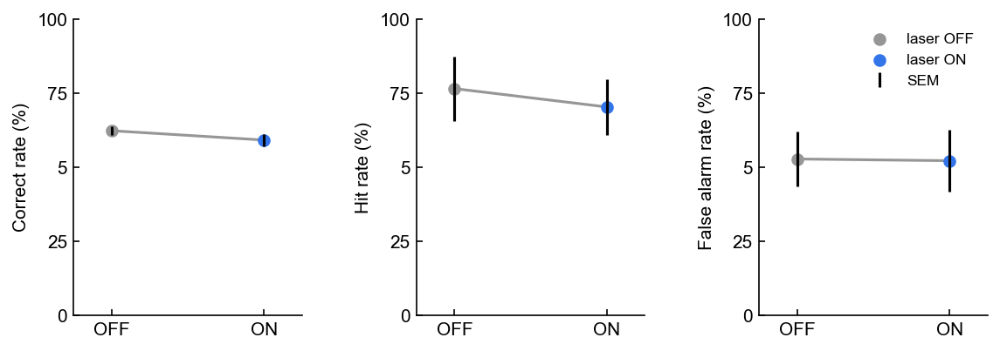

In [89]:
fig = plt.figure(figsize=(9,3))
gs = fig.add_gridspec(1,3,wspace=0.5)
ax0 = plt.subplot(gs[0,0])
ax1 = plt.subplot(gs[0,1],sharex=ax0,sharey=ax0)
ax2 = plt.subplot(gs[0,2],sharex=ax0,sharey=ax0)

ax0.plot([0,1],[np.mean(crateOFF),np.mean(crateON)],color=GOOD_GREY,zorder=-10)
ax1.plot([0,1],[np.mean(hitrateOFF),np.mean(hitrateON)],color=GOOD_GREY,zorder=-10)
ax2.plot([0,1],[np.mean(falarmrateOFF),np.mean(falarmrateON)],color=GOOD_GREY,zorder=-10)

ax0.errorbar([0,1],[np.mean(crateOFF),np.mean(crateON)],[sem(crateOFF),sem(crateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
ax1.errorbar([0,1],[np.mean(hitrateOFF),np.mean(hitrateON)],[sem(hitrateOFF),sem(hitrateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
ax2.errorbar([0,1],[np.mean(falarmrateOFF),np.mean(falarmrateON)],[sem(falarmrateOFF),sem(falarmrateON)],lw=0,elinewidth=1.5,color='k',zorder=5,label='SEM')

ax0.scatter([0],[np.mean(crateOFF)],color=GOOD_GREY,zorder=0)
ax0.scatter([1],[np.mean(crateON)],color=LASER_COLOR,zorder=0)
ax1.scatter([0],[np.mean(hitrateOFF)],color=GOOD_GREY,zorder=0)
ax1.scatter([1],[np.mean(hitrateON)],color=LASER_COLOR,zorder=0)
ax2.scatter([0],[np.mean(falarmrateOFF)],color=GOOD_GREY,zorder=0,label='laser OFF')
ax2.scatter([1],[np.mean(falarmrateON)],color=LASER_COLOR,zorder=0,label='laser ON')

ax0.set_ylim([0,1])
ax0.set_yticks([0,0.25,0.5,0.75,1])
ax0.set_yticklabels([0,25,5,75,100])
ax0.set_ylabel('Correct rate (%)')
ax1.set_ylabel('Hit rate (%)')
ax2.set_ylabel('False alarm rate (%)')

ax0.set_xlim([-0.25,1.25])
ax0.set_xticks([0,1])
ax0.set_xticklabels(['OFF','ON'])

ax2.legend(frameon=False)

#fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','ON-OFF behavior','ON-OFF behavior '+subset_label+'.pdf'),transparent=False,facecolor="white")
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','ON-OFF behavior','ON-OFF behavior high performance sessions'+subset_label+'.pdf'),transparent=False,facecolor="white")

(array([ 1.,  0.,  1.,  3.,  8., 13.,  7.,  5.,  2.,  3.]),
 array([0.23026316, 0.28034029, 0.33041742, 0.38049456, 0.43057169,
        0.48064882, 0.53072595, 0.58080309, 0.63088022, 0.68095735,
        0.73103448]),
 <BarContainer object of 10 artists>)

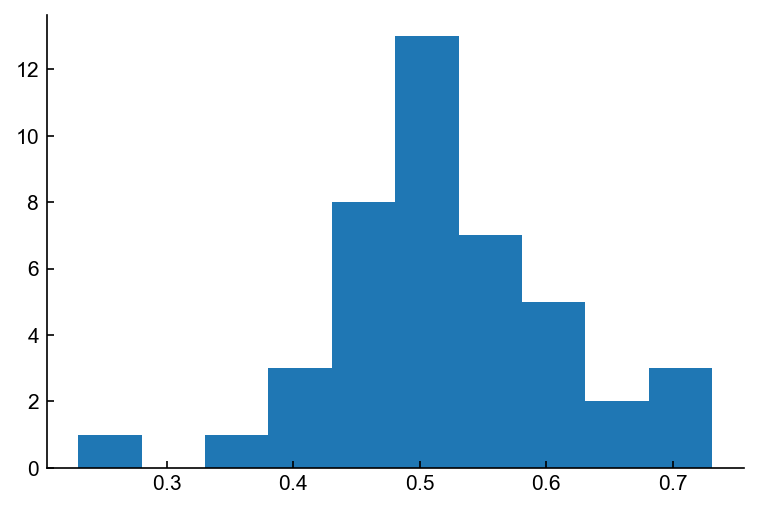

In [58]:
plt.hist(crateOFF)

Text(0.5, 0, 'Trial outcome')

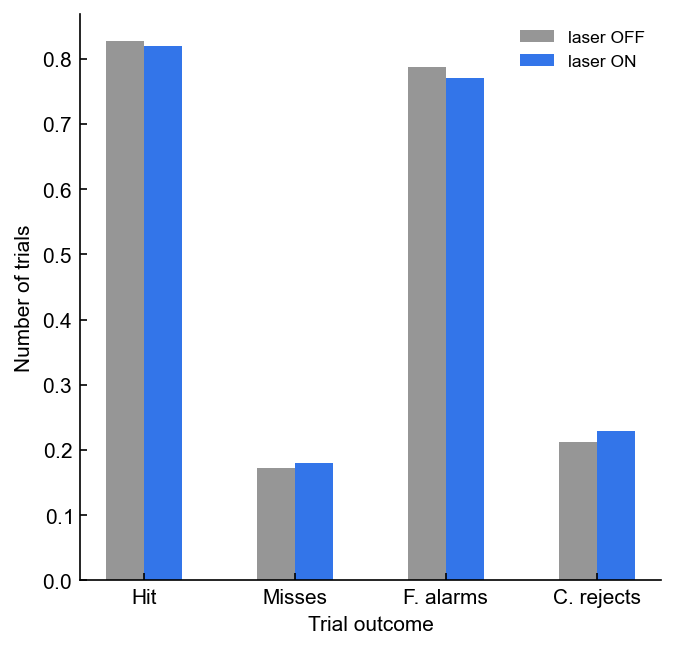

In [19]:
fig,ax = plt.subplots(figsize=(5,5))
ax.bar(np.array(range(4))-0.125,[np.mean(hitrateOFF),np.mean(missrateOFF),np.mean(falarmrateOFF),np.mean(crejectrateOFF)],width=0.25,fc=GOOD_GREY,label='laser OFF')
ax.bar(np.array(range(4))+0.125,[np.mean(hitrateON),np.mean(missrateON),np.mean(falarmrateON),np.mean(crejectrateON)],width=0.25,fc=LASER_COLOR,label='laser ON')
ax.legend(frameon=False)

ax.set_xticks(range(4))
ax.set_xticklabels(['Hit','Misses','F. alarms','C. rejects'])

ax.set_ylabel('Number of trials')
ax.set_xlabel('Trial outcome')

In [8]:
animals_in_cache = []
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.animal == 'PB_86':
        animals_in_cache.append('BS_86')
    elif sessionfile.meta.animal == 'PB_92':
        animals_in_cache.append('BS_92')
    else:
        animals_in_cache.append(sessionfile.meta.animal)
        
animals_in_cache = np.unique(animals_in_cache)

training_days_recorded = dict()
for animal in animals_in_cache:
    training_days_recorded[animal] = []
    
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    if sessionfile.meta.region != 'AC':
        continue
        
    if sessionfile.meta.animal == 'PB_86':
        training_days_recorded['BS_86'].append(sessionfile.meta.day_of_training)
    elif sessionfile.meta.animal == 'PB_92':
        training_days_recorded['BS_92'].append(sessionfile.meta.day_of_training)
    else:
        training_days_recorded[sessionfile.meta.animal].append(sessionfile.meta.day_of_training)
    
print(training_days_recorded['BS_119'])

100%|██████████| 101/101 [00:00<00:00, 270.50it/s]

[10, 11, 12, 13, 14, 15]


In [9]:
opsinanimalnames = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165','BS_174','BS_179','BS_191','BS_192']

opsinanimals = dict()
for animal in opsinanimalnames:
    opsinanimals[animal] = SimpleNamespace()
    opsinanimals[animal].name = animal
    
opsinanimals['BS_86'].reversal = 14
opsinanimals['BS_92'].reversal = 9
opsinanimals['BS_100'].reversal = 11
opsinanimals['BS_103'].reversal = 8
opsinanimals['BS_111'].reversal = 8
opsinanimals['BS_119'].reversal = 10
opsinanimals['BS_123'].reversal = 9
opsinanimals['BS_128'].reversal = 6
opsinanimals['BS_131'].reversal = 14
opsinanimals['BS_139'].reversal = 10
opsinanimals['BS_163'].reversal = 13
opsinanimals['BS_165'].reversal = np.nan
opsinanimals['BS_174'].reversal = 14
opsinanimals['BS_179'].reversal = 16
opsinanimals['BS_191'].reversal = 10
opsinanimals['BS_192'].reversal = 7

BS_86
BS_92
BS_100
BS_103
BS_111
BS_119
BS_123
BS_128
BS_131
BS_139
BS_163
BS_165
BS_174
BS_179
BS_191
BS_192


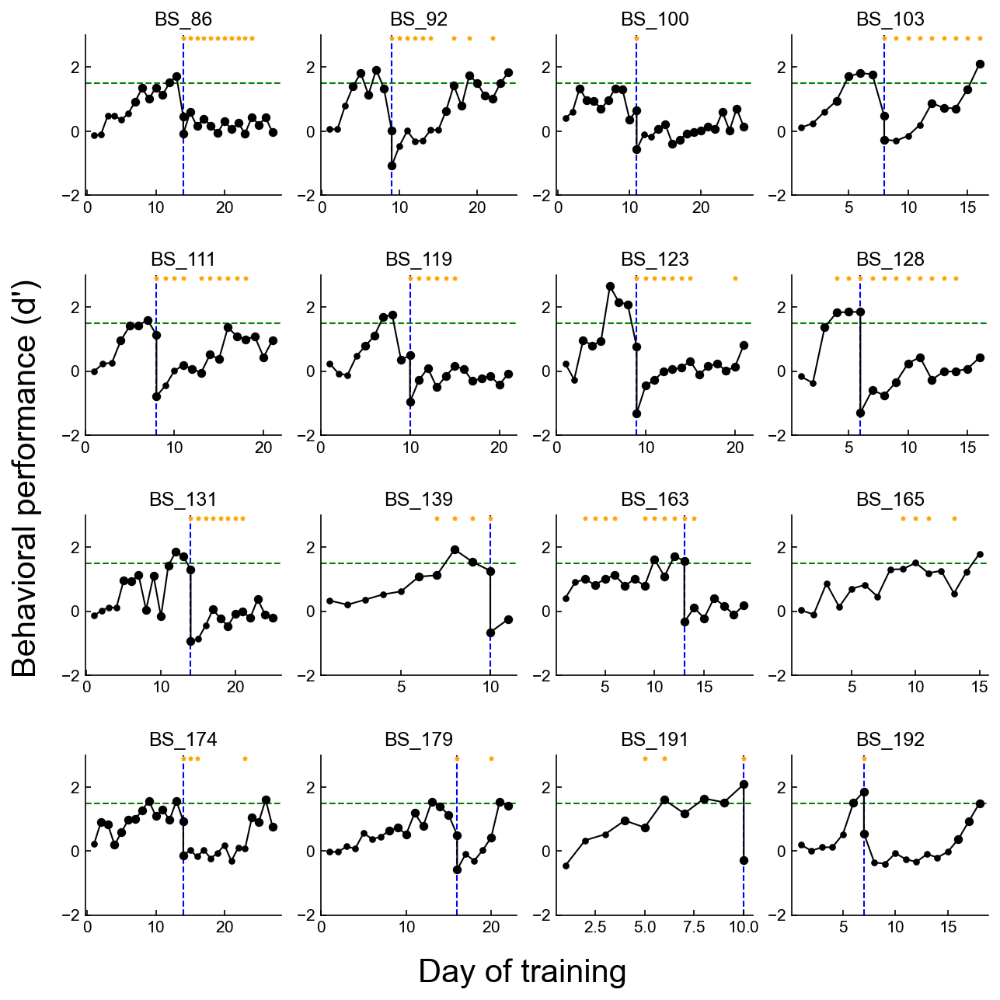

In [224]:
filename = os.path.join('C:\\\\Users','insan','Desktop','DataForJMTOpsin.csv')
#filename = os.path.join('C:\\\\Users','4thgr','Desktop','DataForJMT.csv')
csv = pd.read_csv(filename)

postthresholds = dict()

plot=True
if plot:
    fig = plt.figure(figsize=(10,10))
    gs = fig.add_gridspec(4,4,hspace=0.5)
    axs = [plt.subplot(gs[i,j]) for i,j in product(range(4),range(4))]
    #plt.delaxes(axs[14])
    #plt.delaxes(axs[15])

premiddlecutoffs = dict()
postmiddlecutoffs = dict()

for animalidx,animal in enumerate(opsinanimals):
    print(animal)
    
    condname = 'd\' ' + animal
    pc_condname = 'Percent correct ' + animal
    days = np.array(list(csv['Day']))
    cond = csv[condname]
    cond_pc = csv[pc_condname]
    
    #Correct for double reversal days
    for idx,day in enumerate(days):
        if day > opsinanimals[animal].reversal:
            days[idx] = day-1
            
    #days = days - animals[animal].reversal
    
    prereversaldays = []
    prereversaldps = []
    maxreversaldp = -np.Inf
    minreversaldp = np.Inf
    postreversaldays = []
    postreversaldps = []
    for idx,day in enumerate(days):
        if day < opsinanimals[animal].reversal or np.isnan(opsinanimals[animal].reversal):
            prereversaldays.append(day)
            prereversaldps.append(cond[idx])
        if day == opsinanimals[animal].reversal:
            maxreversaldp = max(cond[idx],maxreversaldp)
            minreversaldp = min(cond[idx],minreversaldp)
        if day > opsinanimals[animal].reversal and not np.isnan(cond[idx]):
            postreversaldays.append(day)
            postreversaldps.append(cond[idx])
            
    #Prereversal threshold
    maxperf = np.nanmax(np.concatenate((prereversaldps,[maxreversaldp])))
    minperf = np.nanmin(prereversaldps)
    prethreshold = minperf + 0.4*(maxperf-minperf)
    #Postreversal threshold
    try:
        maxperf = np.nanmax(postreversaldps)
        minperf = np.nanmin(np.concatenate((postreversaldps,[minreversaldp])))
        postthreshold = minperf + 0.4*(maxperf-minperf)
    
        postthresholds[animal] = postthreshold
    except:
        pass
    
    prereversaldays = np.array(prereversaldays)
    prereversaldps = np.array(prereversaldps)
    postreversaldays = np.array(postreversaldays)
    postreversaldps = np.array(postreversaldps)
    
    premiddlebool = np.greater_equal(prereversaldps,prethreshold)
    for idx,day in enumerate(prereversaldays):
        if premiddlebool[idx]:
            premiddlebool[idx:(len(premiddlebool)-1)].fill(True)
        #if not premiddlebool[idx]:
        #    premiddlebool[0:idx].fill(False)
    if np.any(premiddlebool):
        premiddlefirstday = np.min(prereversaldays[premiddlebool])
    else:
        premiddlefirstday = np.Inf
                     
    postmiddlebool = np.greater_equal(postreversaldps,postthreshold)
    for idx,day in enumerate(postreversaldays):
        if postmiddlebool[idx]:
            postmiddlebool[idx:(len(postmiddlebool)-1)].fill(True)
        #if not postmiddlebool[idx]:
        #    postmiddlebool[0:idx].fill(False)
    if np.any(postmiddlebool):
        postmiddlefirstday = np.min(postreversaldays[postmiddlebool])
    else:
        postmiddlefirstday = np.Inf
    
    if animal == 'BS_95':
        premiddlefirstday = 4
    if animal in ['BS_83','BS_50']:
        postmiddlefirstday = np.Inf
    
    premiddlecutoffs[animal] = premiddlefirstday
    postmiddlecutoffs[animal] = postmiddlefirstday
    
    if plot:
        ax = axs[animalidx]    
        #All Days no color
        ax.plot(days,cond,color='k',lw=1)
        ax.scatter(days,cond,color='k',s=10,zorder=9)
        #Pre Middle
        premiddle = np.logical_and( np.greater_equal(days,premiddlefirstday),np.less(days,opsinanimals[animal].reversal) )
        ax.scatter(days[premiddle],cond[premiddle],color='k',s=20,zorder=10)
        #Post Middle
        postmiddle = np.greater_equal(days,postmiddlefirstday)
        ax.scatter(days[postmiddle],cond[postmiddle],color='k',s=20,zorder=10)
        #Switch
        switch = np.equal(days,opsinanimals[animal].reversal)
        ax.scatter(days[switch],cond[switch],color='k',s=20,zorder=10)
        
        ax.axvline(opsinanimals[animal].reversal,color='b',lw=1,linestyle='--',zorder=-20)

        xlims = ax.get_xlim()
        ax.plot(xlims,[1.5,1.5],c='g',linestyle='--',lw=1,zorder=-10)
        ax.set_xlim(xlims)
        ax.set_ylim([-2,3])
        
        days_recorded = training_days_recorded[animal]
        ax.scatter(days_recorded,np.ones_like(days_recorded)*2.9,s=5,marker='*',color='orange',zorder=11)

        ax.set_title(animal)
        
fig.text(0.075, 0.5, 'Behavioral performance (d\')', ha='center', va='center', rotation='vertical',fontsize=20)
fig.text(0.5,0.075, 'Day of training', ha='center', va='center', rotation='horizontal',fontsize=20)

if plot:
    plt.savefig(os.path.join('D:\\\\TempFigures','Opsin EIL Learning Phases.pdf'),transparent=False,facecolor="white")
    pass

In [ ]:
did_learn = ['BS_92','BS_103','BS_111','BS_174','BS_179']
did_not_learn = ['BS_86','BS_100','BS_119','BS_123','BS_128','BS_131','BS_163']
indeterminate = ['BS_139','BS_165','BS_191','BS_192']

In [49]:
animalBehaviors = ilep.getAllBehavior(beh_directory)

Fetching files for BS_51
Fetching files for BS_52
Fetching files for BS_56
Fetching files for BS_59
Fetching files for BS_61
Fetching files for BS_86
Fetching files for BS_92
Fetching files for BS_100
Fetching files for BS_103
Fetching files for BS_111
Fetching files for BS_119
Fetching files for BS_123
Fetching files for BS_128
Fetching files for BS_131
Fetching files for BS_139
Fetching files for BS_163
Fetching files for BS_165
Fetching files for BS_174
Fetching files for BS_179
Fetching files for BS_191
Fetching files for BS_192
Fetching files for BS_33
Fetching files for BS_67
Fetching files for BS_73
Fetching files for BS_78
Fetching files for BS_108
Fetching files for BS_40
Fetching files for BS_41
Fetching files for BS_42
Fetching files for BS_49
Fetching files for BS_50
Fetching files for BS_70
Fetching files for BS_72
Fetching files for BS_83
Fetching files for BS_85
Fetching files for BS_87
Fetching files for BS_95
Fetching files for BS_113
Fetching files for DS_15
Fetching 

In [214]:
def plot_outcome_rates(hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF,save_folder,animal,suffix):
    fig = plt.figure(figsize=(15,3))
    gs = fig.add_gridspec(1,5,wspace=0.5)
    ax0 = plt.subplot(gs[0,0])
    ax1 = plt.subplot(gs[0,1],sharex=ax0,sharey=ax0)
    ax2 = plt.subplot(gs[0,2],sharex=ax0,sharey=ax0)
    ax3 = plt.subplot(gs[0,3],sharex=ax0,sharey=ax0)
    ax4 = plt.subplot(gs[0,4],sharex=ax0,sharey=ax0)
    
    #########################################################################################################################################################################################
    # Plot Individual Points
    #########################################################################################################################################################################################
    
    p_thresh = 0.05 / 6
    
    #Correct
    crateX = np.random.uniform(low=-0.125,high=0.125,size=len(crateON))
    ax0.plot([crateX,crateX+1],[crateOFF,crateON],color=GOOD_GREY,zorder=-20)
    ax0.scatter(crateX,crateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax0.scatter(crateX+1,crateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(crateON,crateOFF).pvalue
    y_val = np.mean([np.mean(crateON),np.mean(crateOFF)])+0.25
    ax0.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #Hits
    hitrateX = np.random.uniform(low=-0.125,high=0.125,size=len(hitrateON))
    ax1.plot([hitrateX,hitrateX+1],[hitrateOFF,hitrateON],color=GOOD_GREY,zorder=-20)
    ax1.scatter(hitrateX,hitrateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax1.scatter(hitrateX+1,hitrateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(hitrateON,hitrateOFF).pvalue
    y_val = np.mean([np.mean(hitrateON),np.mean(hitrateOFF)])+0.25
    ax1.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #Misses
    missrateX = np.random.uniform(low=-0.125,high=0.125,size=len(missrateON))
    ax2.plot([missrateX,missrateX+1],[missrateOFF,missrateON],color=GOOD_GREY,zorder=-20)
    ax2.scatter(missrateX,missrateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax2.scatter(missrateX+1,missrateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(missrateON,missrateOFF).pvalue
    y_val = np.mean([np.mean(missrateON),np.mean(missrateOFF)])+0.25
    ax2.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #Falarms
    falarmrateX = np.random.uniform(low=-0.125,high=0.125,size=len(falarmrateON))
    ax3.plot([falarmrateX,falarmrateX+1],[falarmrateOFF,falarmrateON],color=GOOD_GREY,zorder=-20)
    ax3.scatter(falarmrateX,falarmrateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax3.scatter(falarmrateX+1,falarmrateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(falarmrateON,falarmrateOFF).pvalue
    y_val = np.mean([np.mean(falarmrateON),np.mean(falarmrateOFF)])+0.25
    ax3.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #Crejects
    crejectrateX = np.random.uniform(low=-0.125,high=0.125,size=len(crejectrateON))
    ax4.plot([crejectrateX,crejectrateX+1],[crejectrateOFF,crejectrateON],color=GOOD_GREY,zorder=-20)
    ax4.scatter(crejectrateX,crejectrateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax4.scatter(crejectrateX+1,crejectrateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(crejectrateON,crejectrateOFF).pvalue
    y_val = np.mean([np.mean(crejectrateON),np.mean(crejectrateOFF)])+0.25
    ax4.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #########################################################################################################################################################################################
    # Plot Summaries
    #########################################################################################################################################################################################

    ax0.plot([0,1],[np.mean(crateOFF),np.mean(crateON)],color='k',zorder=-10)
    ax1.plot([0,1],[np.mean(hitrateOFF),np.mean(hitrateON)],color='k',zorder=-10)
    ax2.plot([0,1],[np.mean(missrateOFF),np.mean(missrateON)],color='k',zorder=-10)
    ax3.plot([0,1],[np.mean(falarmrateOFF),np.mean(falarmrateON)],color='k',zorder=-10)
    ax4.plot([0,1],[np.mean(crejectrateOFF),np.mean(crejectrateON)],color='k',zorder=-10)

    ax0.errorbar([0,1],[np.mean(crateOFF),np.mean(crateON)],[sem(crateOFF),sem(crateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
    ax1.errorbar([0,1],[np.mean(hitrateOFF),np.mean(hitrateON)],[sem(hitrateOFF),sem(hitrateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
    ax2.errorbar([0,1],[np.mean(missrateOFF),np.mean(missrateON)],[sem(missrateOFF),sem(missrateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
    ax3.errorbar([0,1],[np.mean(falarmrateOFF),np.mean(falarmrateON)],[sem(falarmrateOFF),sem(falarmrateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
    ax4.errorbar([0,1],[np.mean(crejectrateOFF),np.mean(crejectrateON)],[sem(crejectrateOFF),sem(crejectrateON)],lw=0,elinewidth=1.5,color='k',zorder=5,label='SEM')

    ax0.scatter([0],[np.mean(crateOFF)],color=GOOD_GREY,zorder=0)
    ax0.scatter([1],[np.mean(crateON)],color=LASER_COLOR,zorder=0)
    ax1.scatter([0],[np.mean(hitrateOFF)],color=GOOD_GREY,zorder=0)
    ax1.scatter([1],[np.mean(hitrateON)],color=LASER_COLOR,zorder=0)
    ax2.scatter([0],[np.mean(missrateOFF)],color=GOOD_GREY,zorder=0)
    ax2.scatter([1],[np.mean(missrateON)],color=LASER_COLOR,zorder=0)
    ax3.scatter([0],[np.mean(falarmrateOFF)],color=GOOD_GREY,zorder=0)
    ax3.scatter([1],[np.mean(falarmrateON)],color=LASER_COLOR,zorder=0)
    ax4.scatter([0],[np.mean(crejectrateOFF)],color=GOOD_GREY,zorder=0,label='laser OFF')
    ax4.scatter([1],[np.mean(crejectrateON)],color=LASER_COLOR,zorder=0,label='laser ON')

    ax0.set_ylim([0,1])
    ax0.set_yticks([0,0.25,0.5,0.75,1])
    ax0.set_yticklabels([0,25,50,75,100])
    ax0.set_ylabel('Percent correct')
    ax1.set_ylabel('Hit rate (%)')
    ax2.set_ylabel('Miss rate (%)')
    ax3.set_ylabel('False alarm rate (%)')
    ax4.set_ylabel('Correct reject rate (%)')

    ax0.set_xlim([-0.25,1.25])
    ax0.set_xticks([0,1])
    ax0.set_xticklabels(['OFF','ON'])

    ax0.set_title(animal)
    ax0.text(0.5,0.05,'n = '+str(len(hitrateON))+' sessions')
    ax4.legend(frameon=False)

    fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','ON-OFF behavior',save_folder,'ON-OFF behavior '+animal+' '+subset_label+suffix+'.pdf'),transparent=False,facecolor="white")

BS_92: 4 ns6, 8 behavior
BS_103: 5 ns6, 7 behavior
BS_111: 10 ns6, 12 behavior
BS_179: 2 ns6, 19 behavior


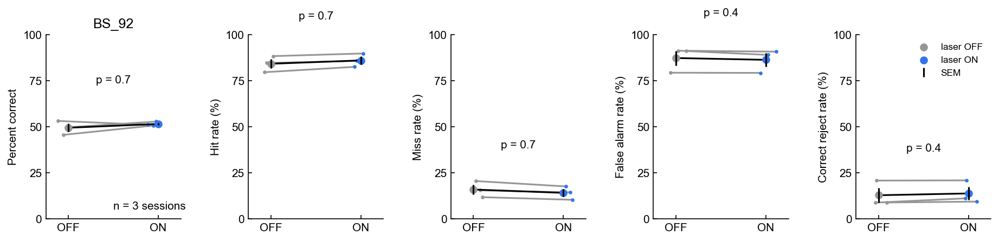

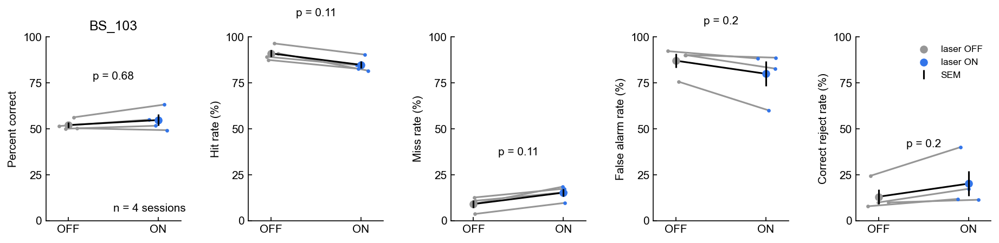

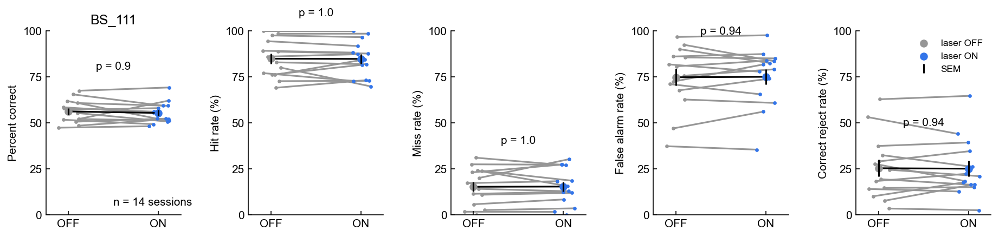

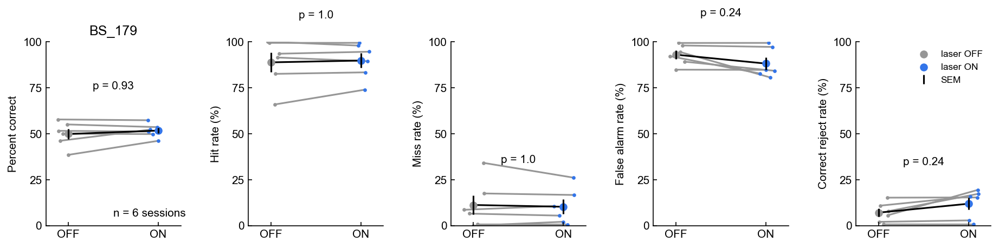

In [111]:
for animal in did_learn:
    
    number_ns6 = 0
    number_beh = 0
    
    hitrateON = []
    missrateON = []
    falarmrateON = []
    crejectrateON = []
    hitrateOFF = []
    missrateOFF = []
    falarmrateOFF = []
    crejectrateOFF = []
    crateON = []
    crateOFF = []
    
    for sessionnumber in animalBehaviors[animal].sessions:
        
        hitsON = np.nan
        missesON = np.nan
        falarmsON = np.nan
        crejectsON = np.nan
        hitsOFF = np.nan
        missesOFF = np.nan
        falarmsOFF = np.nan
        crejectsOFF = np.nan
        
        #Need to check for cloudiness
        if sessionnumber >= animalBehaviors[animal].cloudiness:
            continue
            
        
        #Need to get the actual data
        session_behavior = animalBehaviors[animal].sessions[sessionnumber]
        sessionfile = load_recording_session(ops_directory,animal,'AC',sessionnumber)
        if not sessionfile is None:
            session_behavior = get_behavior_from_sessionfile(sessionfile)
            number_ns6 += 1
        else:
            number_beh += 1
        
        
        #Post-reversal
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber > animalBehaviors[animal].reversal:
            try:
                hitsON = session_behavior.onPostBehavior.hits
                missesON = session_behavior.onPostBehavior.misses
                falarmsON = session_behavior.onPostBehavior.falarms
                crejectsON = session_behavior.onPostBehavior.crejects

                hitsOFF = session_behavior.offPostBehavior.hits
                missesOFF = session_behavior.offPostBehavior.misses
                falarmsOFF = session_behavior.offPostBehavior.falarms
                crejectsOFF = session_behavior.offPostBehavior.crejects
            except Exception as e:
                #print(animal)
                #print(sessionnumber)
                #print(e)
                pass
            
        #Pre-reversal
        elif np.isnan(animalBehaviors[animal].reversal) or sessionnumber < animalBehaviors[animal].reversal:
            pass
            #try:
            #    hitsON = session_behavior.onPreBehavior.hits
            #    missesON = session_behavior.onPreBehavior.misses
            #    falarmsON = session_behavior.onPreBehavior.falarms
            #    crejectsON = session_behavior.onPreBehavior.crejects
            #
            #    hitsOFF = session_behavior.offPreBehavior.hits
            #    missesOFF = session_behavior.offPreBehavior.misses
            #    falarmsOFF = session_behavior.offPreBehavior.falarms
            #    crejectsOFF = session_behavior.offPreBehavior.crejects
            #except Exception as e:
            #    #print(animal)
            #    #print(sessionnumber)
            #    #print(e)
            #    pass
            
        hitrateON.append(hitsON / (hitsON + missesON))
        missrateON.append(missesON / (hitsON + missesON))
        falarmrateON.append(falarmsON / (falarmsON + crejectsON))
        crejectrateON.append(crejectsON / (falarmsON + crejectsON))
        crateON.append((hitsON + crejectsON)/(hitsON+missesON+falarmsON+crejectsON))

        hitrateOFF.append(hitsOFF / (hitsOFF + missesOFF))
        missrateOFF.append(missesOFF / (hitsOFF + missesOFF))
        falarmrateOFF.append(falarmsOFF / (falarmsOFF + crejectsOFF))
        crejectrateOFF.append(crejectsOFF / (falarmsOFF + crejectsOFF))
        crateOFF.append((hitsOFF + crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF))
        
    ##############################################################################################################################
        
    hitrateON = np.array(hitrateON)
    missrateON = np.array(missrateON)
    falarmrateON = np.array(falarmrateON)
    crejectrateON = np.array(crejectrateON)
        
    hitrateOFF = np.array(hitrateOFF)
    missrateOFF = np.array(missrateOFF)
    falarmrateOFF = np.array(falarmrateOFF)
    crejectrateOFF = np.array(crejectrateOFF)
        
    crateON = np.array(crateON)
    crateOFF = np.array(crateOFF)
        
    ##############################################################################################################################
        
    hitrateON = hitrateON[np.isfinite(hitrateON)]
    missrateON = missrateON[np.isfinite(missrateON)]
    falarmrateON = falarmrateON[np.isfinite(falarmrateON)]
    crejectrateON = crejectrateON[np.isfinite(crejectrateON)]
        
    hitrateOFF = hitrateOFF[np.isfinite(hitrateOFF)]
    missrateOFF = missrateOFF[np.isfinite(missrateOFF)]
    falarmrateOFF = falarmrateOFF[np.isfinite(falarmrateOFF)]
    crejectrateOFF = crejectrateOFF[np.isfinite(crejectrateOFF)]
        
    crateON = crateON[np.isfinite(crateON)]
    crateOFF = crateOFF[np.isfinite(crateOFF)]
            
    plot_outcome_rates(hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF,'animals',animal)
    
    print(animal + ': '+str(number_ns6)+ ' ns6, '+str(number_beh)+' behavior')

namespace(offPostBehavior=namespace(crejects=31, falarms=14, hits=35, misses=19), onPostBehavior=namespace(crejects=29, falarms=20, hits=32, misses=19))
namespace(offPostBehavior=namespace(crejects=23, falarms=28, hits=27, misses=26), onPostBehavior=namespace(crejects=19, falarms=23, hits=36, misses=19))
namespace(offPostBehavior=namespace(crejects=33, falarms=12, hits=17, misses=30), onPostBehavior=namespace(crejects=31, falarms=20, hits=29, misses=26))
namespace(offPostBehavior=namespace(crejects=22, falarms=18, hits=23, misses=30), onPostBehavior=namespace(crejects=27, falarms=25, hits=36, misses=19))
BS_86: 5 ns6, 13 behavior
namespace(offPostBehavior=namespace(crejects=50, falarms=1, hits=1, misses=54), onPostBehavior=namespace(crejects=44, falarms=1, hits=2, misses=48))
namespace(offPostBehavior=namespace(crejects=29, falarms=5, hits=3, misses=34), onPostBehavior=namespace(crejects=37, falarms=2, hits=4, misses=37))
namespace(offPostBehavior=namespace(crejects=48, falarms=3, hits

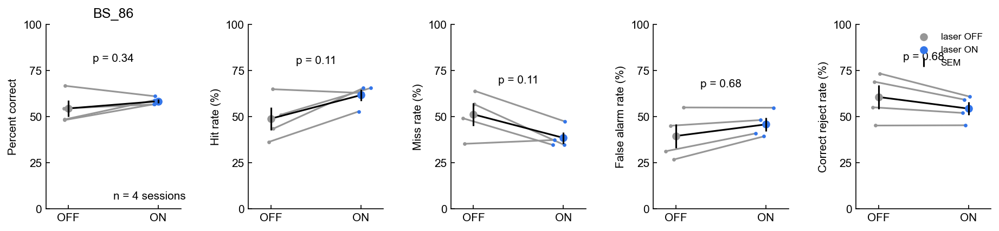

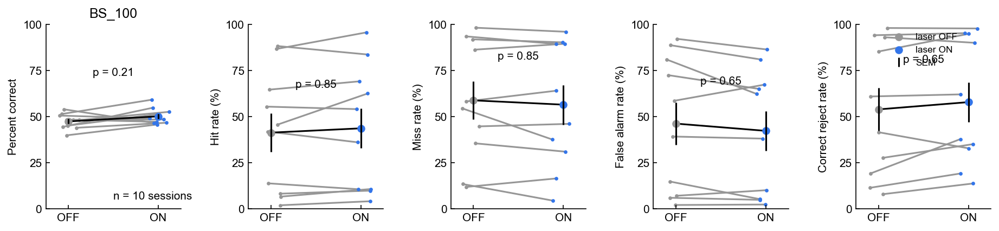

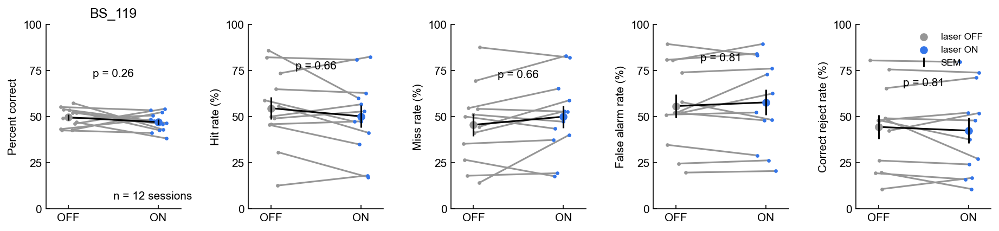

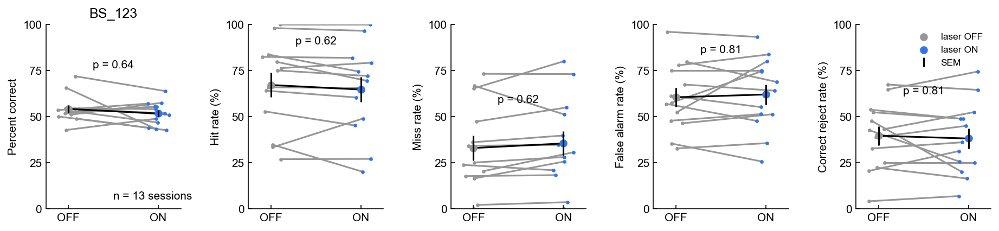

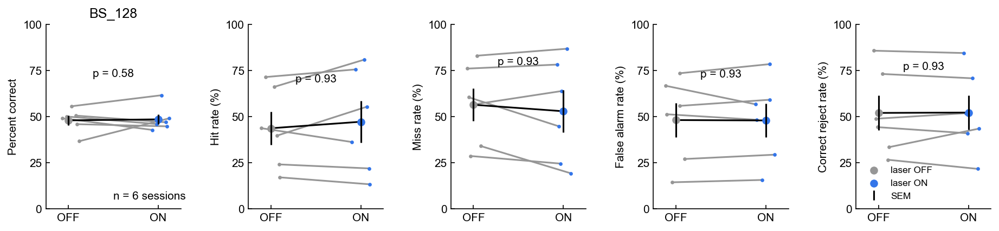

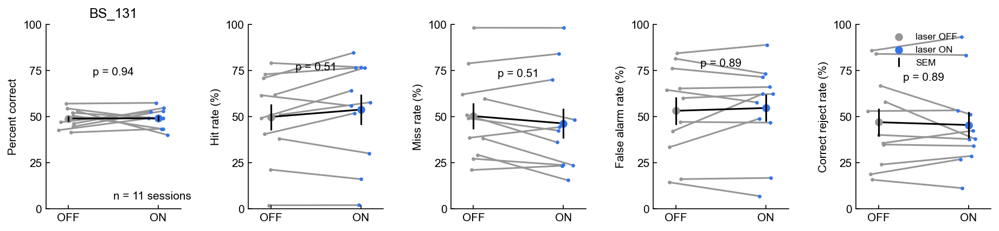

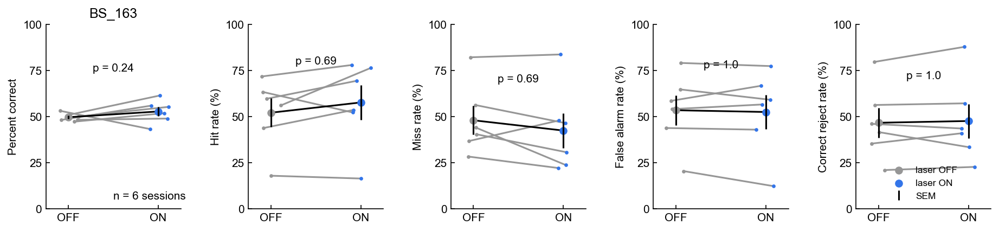

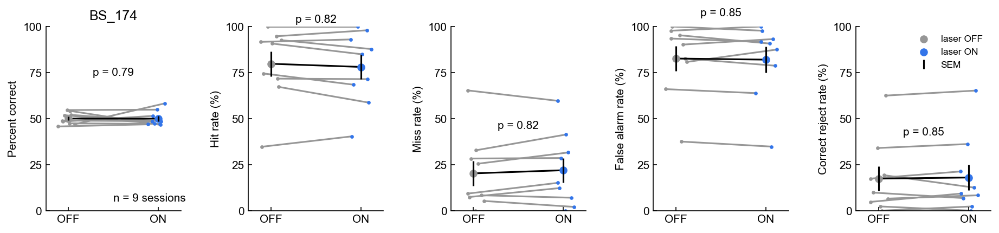

In [216]:
subset_label = 'did not learn'
for animal in did_not_learn:
    
    number_ns6 = 0
    number_beh = 0
    
    hitrateON = []
    missrateON = []
    falarmrateON = []
    crejectrateON = []
    hitrateOFF = []
    missrateOFF = []
    falarmrateOFF = []
    crejectrateOFF = []
    crateON = []
    crateOFF = []
    
    for sessionnumber in animalBehaviors[animal].sessions:
        
        hitsON = np.nan
        missesON = np.nan
        falarmsON = np.nan
        crejectsON = np.nan
        hitsOFF = np.nan
        missesOFF = np.nan
        falarmsOFF = np.nan
        crejectsOFF = np.nan
        
        #Need to check for cloudiness
        if sessionnumber >= animalBehaviors[animal].cloudiness:
            continue
            
        
        #Need to get the actual data
        session_behavior = animalBehaviors[animal].sessions[sessionnumber]
        outcomes = session_behavior.outcomes
        valid_trials = np.array(range(len(outcomes)))
        sessionfile = load_recording_session(ops_directory,animal,'AC',sessionnumber)
        laser_on_trials = np.where(session_behavior.laser)[0]
        laser_off_trials = np.where(np.logical_not(session_behavior.laser))[0]
        if not sessionfile is None:
            #session_behavior = get_behavior_from_sessionfile(sessionfile)
            outcomes,_,_,laser_on_trials,laser_off_trials,valid_trials = get_outcomes_from_sessionfile(sessionfile)
            number_ns6 += 1
        else:
            number_beh += 1
        #Post-reversal
        post_rev_trials = []
        pre_rev_trials = []
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber > animalBehaviors[animal].reversal:
            post_rev_trials = np.array(range(len(outcomes)))
        #Pre-reversal
        elif np.isnan(animalBehaviors[animal].reversal) or sessionnumber < animalBehaviors[animal].reversal:
            pre_rev_trials = np.array(range(len(outcomes)))
            
        #Remove "non-behaving" trials
        trials_to_keep_valid = np.ones_like(valid_trials,dtype='bool')
        trials_to_keep_valid[0:100] = False                                 #Valid trials needs to be in the format of a list of trials NOT a boolean array
        if len(trials_to_keep_valid) > 200:
            trials_to_keep_valid[0:(len(trials_to_keep_valid)-201)] = False
        trials_to_keep_valid = np.where(trials_to_keep_valid)[0]
        valid_trials = valid_trials[np.isin(valid_trials,trials_to_keep_valid)]
        if len(valid_trials) < 100:
            continue
            
        outcomes = np.array(outcomes)
        pre_rev_trials = np.array(pre_rev_trials)
        post_rev_trials = np.array(post_rev_trials)
        laser_on_trials = np.array(laser_on_trials)
        laser_off_trials = np.array(laser_off_trials)
        valid_trials = np.array(valid_trials)
        
        
        if animal == 'BS_86':
            #print(valid_trials)
            pass
        
        
        session_behavior = get_behavior_from_outcomes(outcomes,pre_rev_trials,post_rev_trials,laser_on_trials,laser_off_trials,valid_trials)
        
        
        ###################################################################################################################################################
        
        
        #Post-reversal
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber > animalBehaviors[animal].reversal:
            try:
                hitsON = session_behavior.onPostBehavior.hits
                missesON = session_behavior.onPostBehavior.misses
                falarmsON = session_behavior.onPostBehavior.falarms
                crejectsON = session_behavior.onPostBehavior.crejects

                hitsOFF = session_behavior.offPostBehavior.hits
                missesOFF = session_behavior.offPostBehavior.misses
                falarmsOFF = session_behavior.offPostBehavior.falarms
                crejectsOFF = session_behavior.offPostBehavior.crejects
                
                print(session_behavior)
            except Exception as e:
                #print(animal)
                #print(sessionnumber)
                #print(e)
                pass
            
        #Pre-reversal
        elif np.isnan(animalBehaviors[animal].reversal) or sessionnumber < animalBehaviors[animal].reversal:
            continue
            pass
            #try:
            #    hitsON = session_behavior.onPreBehavior.hits
            #    missesON = session_behavior.onPreBehavior.misses
            #    falarmsON = session_behavior.onPreBehavior.falarms
            #    crejectsON = session_behavior.onPreBehavior.crejects
            #
            #    hitsOFF = session_behavior.offPreBehavior.hits
            #    missesOFF = session_behavior.offPreBehavior.misses
            #    falarmsOFF = session_behavior.offPreBehavior.falarms
            #    crejectsOFF = session_behavior.offPreBehavior.crejects
            #except Exception as e:
            #    #print(animal)
            #    #print(sessionnumber)
            #    #print(e)
            #    pass
            
        hitrateON.append(hitsON / (hitsON + missesON))
        missrateON.append(missesON / (hitsON + missesON))
        falarmrateON.append(falarmsON / (falarmsON + crejectsON))
        crejectrateON.append(crejectsON / (falarmsON + crejectsON))
        crateON.append((hitsON + crejectsON)/(hitsON+missesON+falarmsON+crejectsON))

        hitrateOFF.append(hitsOFF / (hitsOFF + missesOFF))
        missrateOFF.append(missesOFF / (hitsOFF + missesOFF))
        falarmrateOFF.append(falarmsOFF / (falarmsOFF + crejectsOFF))
        crejectrateOFF.append(crejectsOFF / (falarmsOFF + crejectsOFF))
        crateOFF.append((hitsOFF + crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF))
        
    ##############################################################################################################################
        
    hitrateON = np.array(hitrateON)
    missrateON = np.array(missrateON)
    falarmrateON = np.array(falarmrateON)
    crejectrateON = np.array(crejectrateON)
        
    hitrateOFF = np.array(hitrateOFF)
    missrateOFF = np.array(missrateOFF)
    falarmrateOFF = np.array(falarmrateOFF)
    crejectrateOFF = np.array(crejectrateOFF)
        
    crateON = np.array(crateON)
    crateOFF = np.array(crateOFF)
        
    ##############################################################################################################################
        
    hitrateON = hitrateON[np.isfinite(hitrateON)]
    missrateON = missrateON[np.isfinite(missrateON)]
    falarmrateON = falarmrateON[np.isfinite(falarmrateON)]
    crejectrateON = crejectrateON[np.isfinite(crejectrateON)]
        
    hitrateOFF = hitrateOFF[np.isfinite(hitrateOFF)]
    missrateOFF = missrateOFF[np.isfinite(missrateOFF)]
    falarmrateOFF = falarmrateOFF[np.isfinite(falarmrateOFF)]
    crejectrateOFF = crejectrateOFF[np.isfinite(crejectrateOFF)]
        
    crateON = crateON[np.isfinite(crateON)]
    crateOFF = crateOFF[np.isfinite(crateOFF)]
            
    plot_outcome_rates(hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF,'animals',animal,' active trials')
    
    print(animal + ': '+str(number_ns6)+ ' ns6, '+str(number_beh)+' behavior')

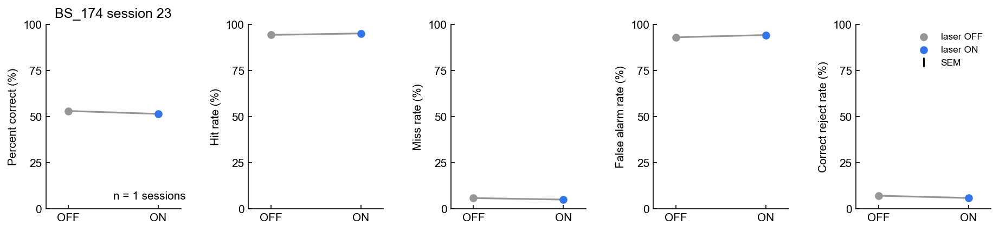

In [22]:
for animal in did_not_learn:
    for sessionnumber in animalBehaviors[animal].sessions:
    
        hitrateON = []
        missrateON = []
        falarmrateON = []
        crejectrateON = []
        hitrateOFF = []
        missrateOFF = []
        falarmrateOFF = []
        crejectrateOFF = []
        crateON = []
        crateOFF = []
    
        hitsON = np.nan
        missesON = np.nan
        falarmsON = np.nan
        crejectsON = np.nan
        hitsOFF = np.nan
        missesOFF = np.nan
        falarmsOFF = np.nan
        crejectsOFF = np.nan
        
        #Need to check for cloudiness
        if sessionnumber >= animalBehaviors[animal].cloudiness:
            continue
        
        #Post-reversal
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber > animalBehaviors[animal].reversal:
            
            try:
                hitsON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.hits
                missesON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.misses
                falarmsON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.falarms
                crejectsON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.crejects

                hitsOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.hits
                missesOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.misses
                falarmsOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.falarms
                crejectsOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.crejects
            except Exception as e:
                #print(animal)
                #print(sessionnumber)
                #print(e)
                pass
            
        #Pre-reversal
        elif np.isnan(animalBehaviors[animal].reversal) or sessionnumber < animalBehaviors[animal].reversal:
            
            try:
                hitsON = animalBehaviors[animal].sessions[sessionnumber].onPreBehavior.hits
                missesON = animalBehaviors[animal].sessions[sessionnumber].onPreBehavior.misses
                falarmsON = animalBehaviors[animal].sessions[sessionnumber].onPreBehavior.falarms
                crejectsON = animalBehaviors[animal].sessions[sessionnumber].onPreBehavior.crejects

                hitsOFF = animalBehaviors[animal].sessions[sessionnumber].offPreBehavior.hits
                missesOFF = animalBehaviors[animal].sessions[sessionnumber].offPreBehavior.misses
                falarmsOFF = animalBehaviors[animal].sessions[sessionnumber].offPreBehavior.falarms
                crejectsOFF = animalBehaviors[animal].sessions[sessionnumber].offPreBehavior.crejects
            except Exception as e:
                #print(animal)
                #print(sessionnumber)
                #print(e)
                pass
            
        hitrateON.append(hitsON / (hitsON + missesON))
        missrateON.append(missesON / (hitsON + missesON))
        falarmrateON.append(falarmsON / (falarmsON + crejectsON))
        crejectrateON.append(crejectsON / (falarmsON + crejectsON))
        crateON.append((hitsON + crejectsON)/(hitsON+missesON+falarmsON+crejectsON))

        hitrateOFF.append(hitsOFF / (hitsOFF + missesOFF))
        missrateOFF.append(missesOFF / (hitsOFF + missesOFF))
        falarmrateOFF.append(falarmsOFF / (falarmsOFF + crejectsOFF))
        crejectrateOFF.append(crejectsOFF / (falarmsOFF + crejectsOFF))
        crateOFF.append((hitsOFF + crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF))
        
        ##############################################################################################################################

        hitrateON = np.array(hitrateON)
        missrateON = np.array(missrateON)
        falarmrateON = np.array(falarmrateON)
        crejectrateON = np.array(crejectrateON)

        hitrateOFF = np.array(hitrateOFF)
        missrateOFF = np.array(missrateOFF)
        falarmrateOFF = np.array(falarmrateOFF)
        crejectrateOFF = np.array(crejectrateOFF)

        crateON = np.array(crateON)
        crateOFF = np.array(crateOFF)

        ##############################################################################################################################

        hitrateON = hitrateON[np.isfinite(hitrateON)]
        missrateON = missrateON[np.isfinite(missrateON)]
        falarmrateON = falarmrateON[np.isfinite(falarmrateON)]
        crejectrateON = crejectrateON[np.isfinite(crejectrateON)]

        hitrateOFF = hitrateOFF[np.isfinite(hitrateOFF)]
        missrateOFF = missrateOFF[np.isfinite(missrateOFF)]
        falarmrateOFF = falarmrateOFF[np.isfinite(falarmrateOFF)]
        crejectrateOFF = crejectrateOFF[np.isfinite(crejectrateOFF)]

        crateON = crateON[np.isfinite(crateON)]
        crateOFF = crateOFF[np.isfinite(crateOFF)]

        if len(crateOFF) < 1:
            continue
        
        plt.close('all')
        plot_outcome_rates(hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF,'sessions',(animal+' session '+str(sessionnumber)))

# Reversal Pre

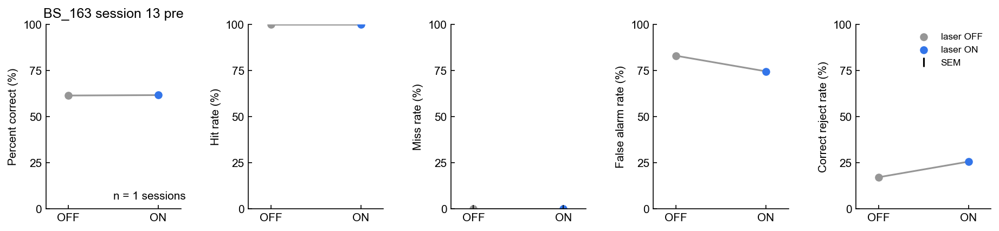

In [23]:
for animal in did_not_learn:
    for sessionnumber in animalBehaviors[animal].sessions:
    
        hitrateON = []
        missrateON = []
        falarmrateON = []
        crejectrateON = []
        hitrateOFF = []
        missrateOFF = []
        falarmrateOFF = []
        crejectrateOFF = []
        crateON = []
        crateOFF = []
    
        hitsON = np.nan
        missesON = np.nan
        falarmsON = np.nan
        crejectsON = np.nan
        hitsOFF = np.nan
        missesOFF = np.nan
        falarmsOFF = np.nan
        crejectsOFF = np.nan
        
        #Need to check for cloudiness
        if sessionnumber >= animalBehaviors[animal].cloudiness:
            continue
        
        #Post-reversal
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber == animalBehaviors[animal].reversal:
            
            try:
                hitsON = animalBehaviors[animal].sessions[sessionnumber].onPreBehavior.hits
                missesON = animalBehaviors[animal].sessions[sessionnumber].onPreBehavior.misses
                falarmsON = animalBehaviors[animal].sessions[sessionnumber].onPreBehavior.falarms
                crejectsON = animalBehaviors[animal].sessions[sessionnumber].onPreBehavior.crejects

                hitsOFF = animalBehaviors[animal].sessions[sessionnumber].offPreBehavior.hits
                missesOFF = animalBehaviors[animal].sessions[sessionnumber].offPreBehavior.misses
                falarmsOFF = animalBehaviors[animal].sessions[sessionnumber].offPreBehavior.falarms
                crejectsOFF = animalBehaviors[animal].sessions[sessionnumber].offPreBehavior.crejects
            except:
                pass
            
        hitrateON.append(hitsON / (hitsON + missesON))
        missrateON.append(missesON / (hitsON + missesON))
        falarmrateON.append(falarmsON / (falarmsON + crejectsON))
        crejectrateON.append(crejectsON / (falarmsON + crejectsON))
        crateON.append((hitsON + crejectsON)/(hitsON+missesON+falarmsON+crejectsON))

        hitrateOFF.append(hitsOFF / (hitsOFF + missesOFF))
        missrateOFF.append(missesOFF / (hitsOFF + missesOFF))
        falarmrateOFF.append(falarmsOFF / (falarmsOFF + crejectsOFF))
        crejectrateOFF.append(crejectsOFF / (falarmsOFF + crejectsOFF))
        crateOFF.append((hitsOFF + crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF))
        
        ##############################################################################################################################

        hitrateON = np.array(hitrateON)
        missrateON = np.array(missrateON)
        falarmrateON = np.array(falarmrateON)
        crejectrateON = np.array(crejectrateON)

        hitrateOFF = np.array(hitrateOFF)
        missrateOFF = np.array(missrateOFF)
        falarmrateOFF = np.array(falarmrateOFF)
        crejectrateOFF = np.array(crejectrateOFF)

        crateON = np.array(crateON)
        crateOFF = np.array(crateOFF)

        ##############################################################################################################################

        hitrateON = hitrateON[np.isfinite(hitrateON)]
        missrateON = missrateON[np.isfinite(missrateON)]
        falarmrateON = falarmrateON[np.isfinite(falarmrateON)]
        crejectrateON = crejectrateON[np.isfinite(crejectrateON)]

        hitrateOFF = hitrateOFF[np.isfinite(hitrateOFF)]
        missrateOFF = missrateOFF[np.isfinite(missrateOFF)]
        falarmrateOFF = falarmrateOFF[np.isfinite(falarmrateOFF)]
        crejectrateOFF = crejectrateOFF[np.isfinite(crejectrateOFF)]

        crateON = crateON[np.isfinite(crateON)]
        crateOFF = crateOFF[np.isfinite(crateOFF)]

        if len(crateOFF) < 1:
            continue
        
        plt.close('all')
        plot_outcome_rates(hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF,'sessions',(animal+' session '+str(sessionnumber)+' pre'))

# Reversal Post

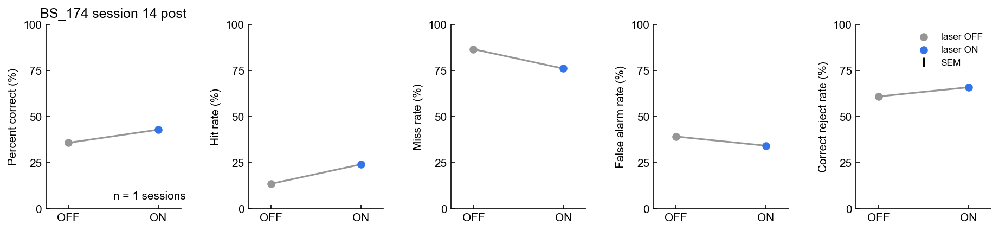

In [24]:
for animal in did_not_learn:
    for sessionnumber in animalBehaviors[animal].sessions:
    
        hitrateON = []
        missrateON = []
        falarmrateON = []
        crejectrateON = []
        hitrateOFF = []
        missrateOFF = []
        falarmrateOFF = []
        crejectrateOFF = []
        crateON = []
        crateOFF = []
    
        hitsON = np.nan
        missesON = np.nan
        falarmsON = np.nan
        crejectsON = np.nan
        hitsOFF = np.nan
        missesOFF = np.nan
        falarmsOFF = np.nan
        crejectsOFF = np.nan
        
        #Need to check for cloudiness
        if sessionnumber >= animalBehaviors[animal].cloudiness:
            continue
        
        #Post-reversal
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber == animalBehaviors[animal].reversal:
            
            try:
                hitsON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.hits
                missesON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.misses
                falarmsON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.falarms
                crejectsON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.crejects

                hitsOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.hits
                missesOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.misses
                falarmsOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.falarms
                crejectsOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.crejects
            except:
                pass
            
        hitrateON.append(hitsON / (hitsON + missesON))
        missrateON.append(missesON / (hitsON + missesON))
        falarmrateON.append(falarmsON / (falarmsON + crejectsON))
        crejectrateON.append(crejectsON / (falarmsON + crejectsON))
        crateON.append((hitsON + crejectsON)/(hitsON+missesON+falarmsON+crejectsON))

        hitrateOFF.append(hitsOFF / (hitsOFF + missesOFF))
        missrateOFF.append(missesOFF / (hitsOFF + missesOFF))
        falarmrateOFF.append(falarmsOFF / (falarmsOFF + crejectsOFF))
        crejectrateOFF.append(crejectsOFF / (falarmsOFF + crejectsOFF))
        crateOFF.append((hitsOFF + crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF))
        
        ##############################################################################################################################

        hitrateON = np.array(hitrateON)
        missrateON = np.array(missrateON)
        falarmrateON = np.array(falarmrateON)
        crejectrateON = np.array(crejectrateON)

        hitrateOFF = np.array(hitrateOFF)
        missrateOFF = np.array(missrateOFF)
        falarmrateOFF = np.array(falarmrateOFF)
        crejectrateOFF = np.array(crejectrateOFF)

        crateON = np.array(crateON)
        crateOFF = np.array(crateOFF)

        ##############################################################################################################################

        hitrateON = hitrateON[np.isfinite(hitrateON)]
        missrateON = missrateON[np.isfinite(missrateON)]
        falarmrateON = falarmrateON[np.isfinite(falarmrateON)]
        crejectrateON = crejectrateON[np.isfinite(crejectrateON)]

        hitrateOFF = hitrateOFF[np.isfinite(hitrateOFF)]
        missrateOFF = missrateOFF[np.isfinite(missrateOFF)]
        falarmrateOFF = falarmrateOFF[np.isfinite(falarmrateOFF)]
        crejectrateOFF = crejectrateOFF[np.isfinite(crejectrateOFF)]

        crateON = crateON[np.isfinite(crateON)]
        crateOFF = crateOFF[np.isfinite(crateOFF)]

        if len(crateOFF) < 1:
            continue
        
        plt.close('all')
        plot_outcome_rates(hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF,'sessions',(animal+' session '+str(sessionnumber)+' post'))

In [18]:
animalBehaviors['BS_128'].sessions[6]

namespace(animal='BS_128',
          session=6,
          files=array(['BS_128_6v1_opto.txt', 'BS_128_6v2_opto.txt',
                       'BS_128_6v3_opto.txt', 'BS_128_6v4_opto.txt'], dtype='<U19'),
          blocknumbers=array([1, 2, 3, 4]),
          type='switch',
          trials_per_session=array([200.,  57.,  54., 100.]),
          onPreBehavior=namespace(hits=58, misses=0, falarms=33, crejects=18),
          onPostBehavior=namespace(hits=3, misses=47, falarms=17, crejects=28),
          offPreBehavior=namespace(hits=44, misses=0, falarms=35, crejects=12),
          offPostBehavior=namespace(hits=5,
                                    misses=57,
                                    falarms=22,
                                    crejects=32),
          pre_pc_sessions=0.66,
          pre_dp_sessions=1.845176790282996,
          post_pc_sessions=0.30259909031838855,
          post_dp_sessions=-1.2978608225524069)

In [14]:
animalBehaviors = ilep.getAllBehavior(beh_directory)

Fetching files for BS_51
Fetching files for BS_52
Fetching files for BS_56
Fetching files for BS_59
Fetching files for BS_61
Fetching files for BS_86
Fetching files for BS_92
Fetching files for BS_100
Fetching files for BS_103
Fetching files for BS_111
Fetching files for BS_119
Fetching files for BS_123
Fetching files for BS_128
Fetching files for BS_131
Fetching files for BS_139
Fetching files for BS_163
Fetching files for BS_165
Fetching files for BS_174
Fetching files for BS_179
Fetching files for BS_191
Fetching files for BS_192
Fetching files for BS_33
Fetching files for BS_67
Fetching files for BS_73
Fetching files for BS_78
Fetching files for BS_108
Fetching files for BS_40
Fetching files for BS_41
Fetching files for BS_42
Fetching files for BS_49
Fetching files for BS_50
Fetching files for BS_70
Fetching files for BS_72
Fetching files for BS_83
Fetching files for BS_85
Fetching files for BS_87
Fetching files for BS_95
Fetching files for BS_113
Fetching files for DS_15
Fetching 

In [4]:
for session in os.listdir(ops_directory):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    if sessionfile.meta.animal == 'PB_86':
        sessionfile.meta.animal = 'BS_86'
    if sessionfile.meta.animal == 'PB_92':
        sessionfile.meta.animal = 'BS_92'
    
    trial_outcomes = [np.nan]*sessionfile.meta.length_in_trials
    trial_tones = [np.nan]*sessionfile.meta.length_in_trials
    for idx in range(sessionfile.meta.length_in_trials):
        
        #Hit
        if sessionfile.trials.target[idx] and sessionfile.trials.go[idx]:
            trial_outcomes[idx] = 1
        if sessionfile.trials.target[idx] and not sessionfile.trials.go[idx]:
            trial_outcomes[idx] = 2
        if not sessionfile.trials.target[idx] and sessionfile.trials.go[idx]:
            trial_outcomes[idx] = 3
        if not sessionfile.trials.target[idx] and not sessionfile.trials.go[idx]:
            trial_outcomes[idx] = 4
            
        trial_tones[idx] = sessionfile.trials.freqs[idx]
            
    try:
        beh_outcomes = animalBehaviors[sessionfile.meta.animal].sessions[sessionfile.meta.day_of_training].outcomes
        beh_tones = animalBehaviors[sessionfile.meta.animal].sessions[sessionfile.meta.day_of_training].tones
    except:
        print(sessionfile.meta.animal)
        print(sessionfile.meta.day_of_training)
        
    trial_outcomes = np.array(trial_outcomes)
    beh_outcomes = np.array(beh_outcomes)
    trial_tones = np.array(trial_tones)
    beh_tones = np.array(beh_tones)
    
    print(trial_outcomes)
    print(beh_outcomes)
    
    #minimum = min(len(trial_outcomes),len(beh_outcomes))
    
    
    #print(trial_outcomes)
    #print(beh_outcomes)
    #
    #discrepancies = np.abs(trial_outcomes - beh_outcomes)
    #print(np.sum(discrepancies))
    #
    #tone_discrepancies = np.abs(trial_tones - beh_tones)
    #print(np.sum(tone_discrepancies))
    
    if hasattr(sessionfile.trials,'laser_stimulation'):
        trial_laser = [np.nan]*sessionfile.meta.length_in_trials
        for idx in range(sessionfile.meta.length_in_trials):
            if sessionfile.trials.laser_stimulation[idx]:
                trial_laser[idx] = 1
            else:
                trial_laser[idx] = 0
        
        beh_laser = animalBehaviors[sessionfile.meta.animal].sessions[sessionfile.meta.day_of_training].laser
        
        trial_laser = np.array(trial_laser)
        beh_laser = np.array(beh_laser)
        
        #print(trial_laser)
        #print(beh_laser)
        
        print('blackrock length: '+str(len(trial_outcomes)))
        print('MATLAB length: '+str(len(beh_outcomes)))
        #print(len(trial_tones))
        #print(len(trial_laser))
        #print(len(beh_outcomes))
        #print(len(beh_tones))
        #print(len(beh_laser))
        #
        #print(len(animalBehaviors[sessionfile.meta.animal].sessions[sessionfile.meta.day_of_training].outcomes))
        #print(len(animalBehaviors[sessionfile.meta.animal].sessions[sessionfile.meta.day_of_training].tones))
        #print(len(animalBehaviors[sessionfile.meta.animal].sessions[sessionfile.meta.day_of_training].laser))
        print()
        
        #laser_discrepancies = np.abs(trial_laser - beh_laser)
        #print(np.sum(laser_discrepancies))

BS_100
11


NameError: name 'beh_outcomes' is not defined

In [22]:
def load_recording_session(directory,animal,region,training_day):
    for session in os.listdir(directory):
        sessionfile = ilep.loadSessionCached(directory,session)
        
        if sessionfile.meta.animal != animal:
            continue
        if sessionfile.meta.region != region:
            continue
        if sessionfile.meta.day_of_training != training_day:
            continue
            
        return sessionfile
    return None

In [148]:
dual_rec_animals = ['BS_40','BS_41','BS_42','BS_49','BS_51','BS_56','BS_59','BS_61','BS_67','BS_70','BS_72','BS_87','BS_108','DS_15','DS_19']

Text(0.5, 0, 'Session completion fraction')

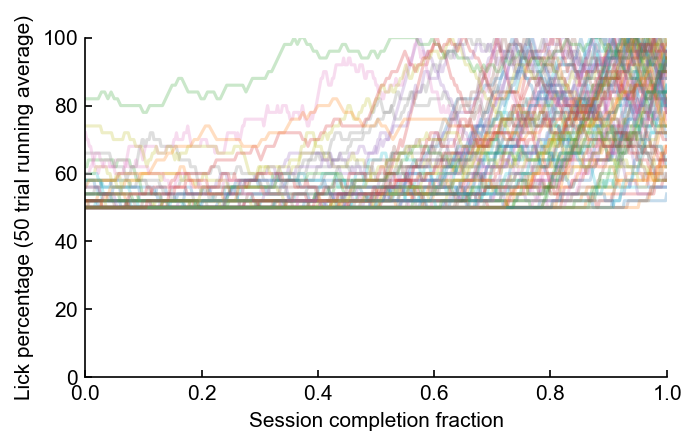

In [141]:
fig,ax = plt.subplots(figsize=(5,3))
ax.set_xlim([0,1])
ax.set_ylim([0,100])
smoothvalue = 50

for animal in did_learn:
    for sessionnumber in animalBehaviors[animal].sessions:
    
        outcomes = animalBehaviors[animal].sessions[sessionnumber].outcomes
        isactive = np.logical_or(np.equal(outcomes,1),np.equal(outcomes,3))
        
        isactive = np.array([100*np.mean(isactive[i:(i+smoothvalue)]) for i in range(len(isactive)-smoothvalue)])
        max_possible_behavior = 100 - np.abs(isactive-50)
        
        xrange = np.linspace(0,1,num=len(isactive))
        
        ax.plot(xrange,max_possible_behavior,alpha=0.25)
        
ax.set_ylabel('Lick percentage ('+str(smoothvalue)+' trial running average)')
ax.set_xlabel('Session completion fraction')

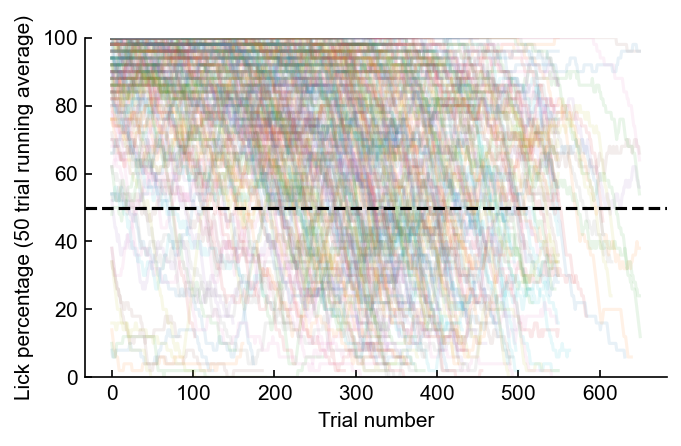

In [172]:
fig,ax = plt.subplots(figsize=(5,3))
#ax.set_xlim([0,1])
ax.set_ylim([0,100])
smoothvalue = 50

for animal in dual_rec_animals:
#for animal in did_learn:
    for sessionnumber in animalBehaviors[animal].sessions:
    
        try:
    
            outcomes = animalBehaviors[animal].sessions[sessionnumber].outcomes
            isactive = np.logical_or(np.equal(outcomes,1),np.equal(outcomes,3))

            isactive = np.array([100*np.mean(isactive[i:(i+smoothvalue)]) for i in range(len(isactive)-smoothvalue)])
            max_possible_behavior = 100 - np.abs(isactive-50)
            #xrange = np.linspace(0,1,num=len(isactive))
            xrange = np.array(range(len(isactive)))
            #xrange = np.array(range(len(isactive)))-len(isactive)

            #ax.plot(xrange,max_possible_behavior,alpha=0.05)
            #ax.plot(xrange,isactive,alpha=0.25)
            ax.plot(xrange,isactive,alpha=0.1)

        except:
            pass
            
ax.set_ylabel('Lick percentage ('+str(smoothvalue)+' trial running average)')
ax.set_xlabel('Trial number')
ax.axhline(50,zorder=10,color='k',linestyle='--')
#ax.set_xlim([ax.get_xlim()[0],0])

fig.savefig(os.path.join('D:\\\\TempFigures','Lick participation figures','Dual lick participation.pdf'),transparent=False,facecolor="white")

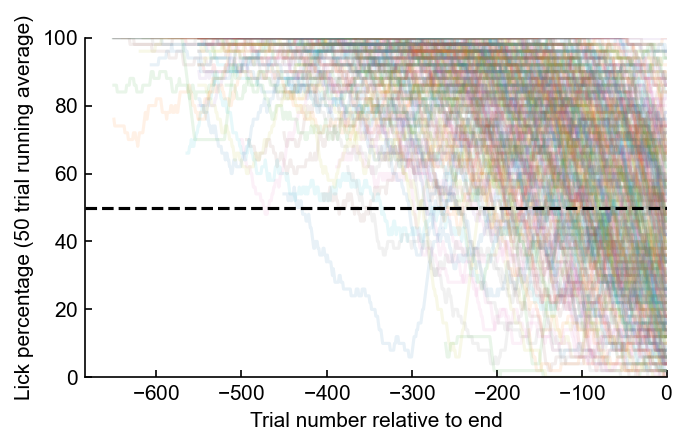

In [176]:
fig,ax = plt.subplots(figsize=(5,3))
#ax.set_xlim([0,1])
ax.set_ylim([0,100])
smoothvalue = 50

for animal in dual_rec_animals:
#for animal in did_learn:
    for sessionnumber in animalBehaviors[animal].sessions:
    
        try:
        
            outcomes = animalBehaviors[animal].sessions[sessionnumber].outcomes
            isactive = np.logical_or(np.equal(outcomes,1),np.equal(outcomes,3))

            isactive = np.array([100*np.mean(isactive[i:(i+smoothvalue)]) for i in range(len(isactive)-smoothvalue)])
            max_possible_behavior = 100 - np.abs(isactive-50)
            #xrange = np.linspace(0,1,num=len(isactive))
            #xrange = np.array(range(len(isactive)))
            xrange = np.array(range(len(isactive)))-len(isactive)

            #ax.plot(xrange,max_possible_behavior,alpha=0.05)
            #ax.plot(xrange,isactive,alpha=0.25)
            ax.plot(xrange,isactive,alpha=0.1)
            
        except:
            pass
        
ax.set_ylabel('Lick percentage ('+str(smoothvalue)+' trial running average)')
ax.set_xlabel('Trial number relative to end')
ax.axhline(50,zorder=10,color='k',linestyle='--')
ax.set_xlim([ax.get_xlim()[0],0])

fig.savefig(os.path.join('D:\\\\TempFigures','Lick participation figures','Dual lick participation2.pdf'),transparent=False,facecolor="white")

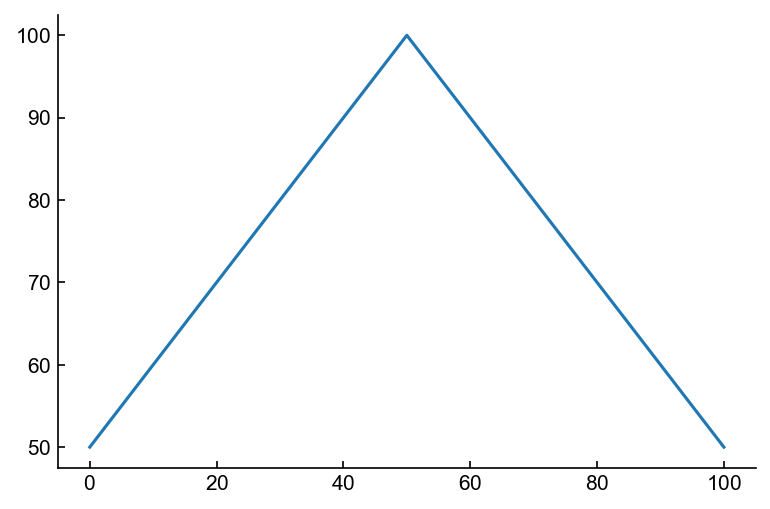

In [138]:
activity = np.linspace(0,100,101)
max_possible_behavior = 100 - np.abs(activity-50)
plt.plot(activity,max_possible_behavior)

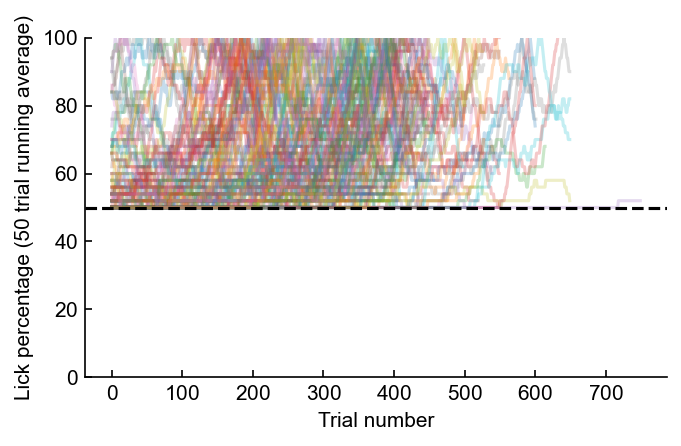

In [174]:
fig,ax = plt.subplots(figsize=(5,3))
#ax.set_xlim([0,1])
ax.set_ylim([0,100])
smoothvalue = 50

#for animal in dual_rec_animals:
for animal in did_not_learn:
    for sessionnumber in animalBehaviors[animal].sessions:
    
        try:
    
            outcomes = animalBehaviors[animal].sessions[sessionnumber].outcomes
            isactive = np.logical_or(np.equal(outcomes,1),np.equal(outcomes,3))

            isactive = np.array([100*np.mean(isactive[i:(i+smoothvalue)]) for i in range(len(isactive)-smoothvalue)])
            max_possible_behavior = 100 - np.abs(isactive-50)
            #xrange = np.linspace(0,1,num=len(isactive))
            xrange = np.array(range(len(isactive)))
            #xrange = np.array(range(len(isactive)))-len(isactive)

            ax.plot(xrange,max_possible_behavior,alpha=0.25)
            #ax.plot(xrange,max_possible_behavior,alpha=0.1)
            #ax.plot(xrange,isactive,alpha=0.25)
            #ax.plot(xrange,isactive,alpha=0.1)

        except:
            pass
            
ax.set_ylabel('Lick percentage ('+str(smoothvalue)+' trial running average)')
ax.set_xlabel('Trial number')
ax.axhline(50,zorder=10,color='k',linestyle='--')
#ax.set_xlim([ax.get_xlim()[0],0])

fig.savefig(os.path.join('D:\\\\TempFigures','Lick participation figures','Did not learn max behavior.pdf'),transparent=False,facecolor="white")

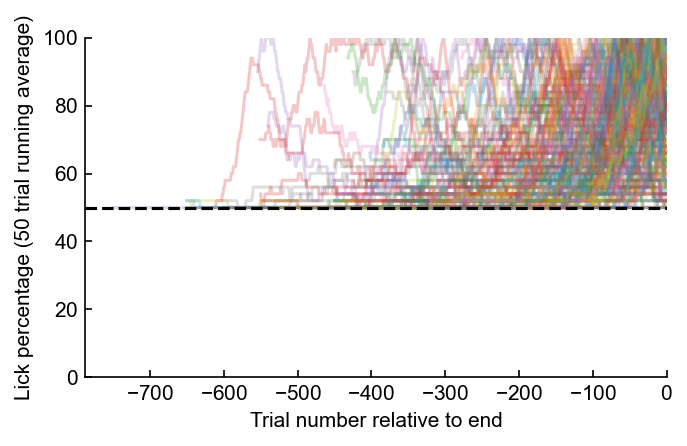

In [179]:
fig,ax = plt.subplots(figsize=(5,3))
#ax.set_xlim([0,1])
ax.set_ylim([0,100])
smoothvalue = 50

#for animal in dual_rec_animals:
for animal in did_not_learn:
    for sessionnumber in animalBehaviors[animal].sessions:
    
        try:
        
            outcomes = animalBehaviors[animal].sessions[sessionnumber].outcomes
            isactive = np.logical_or(np.equal(outcomes,1),np.equal(outcomes,3))

            isactive = np.array([100*np.mean(isactive[i:(i+smoothvalue)]) for i in range(len(isactive)-smoothvalue)])
            max_possible_behavior = 100 - np.abs(isactive-50)
            #xrange = np.linspace(0,1,num=len(isactive))
            #xrange = np.array(range(len(isactive)))
            xrange = np.array(range(len(isactive)))-len(isactive)

            ax.plot(xrange,max_possible_behavior,alpha=0.25)
            #ax.plot(xrange,max_possible_behavior,alpha=0.1)
            #ax.plot(xrange,isactive,alpha=0.25)
            #ax.plot(xrange,isactive,alpha=0.1)
            
        except:
            pass
        
ax.set_ylabel('Lick percentage ('+str(smoothvalue)+' trial running average)')
ax.set_xlabel('Trial number relative to end')
ax.axhline(50,zorder=10,color='k',linestyle='--')
ax.set_xlim([ax.get_xlim()[0],0])

fig.savefig(os.path.join('D:\\\\TempFigures','Lick participation figures','Did not learn max performance2.pdf'),transparent=False,facecolor="white")

# %-Change FR modulation -- separated by improved vs impaired sessions

In [266]:
FRmod_delta_abs = []
FRmod_delta_pc = []
FRmod_delta_pc_baseline = []
FRmod_on = []
FRmod_off = []

subset = 'impaired'

#opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']
opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165','BS_174','BS_179','BS_191','BS_192']
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not sessionfile.meta.animal in opsinanimals:
        continue
    
    if sessionfile.meta.cloudy:
        continue
        
    if not sessionfile.meta.task == 'opto reversal':
        continue

    try:
    
        outcomes,pre_rev,post_rev,laser_on,laser_off,valid = get_outcomes_from_sessionfile(sessionfile)
        if len(valid) < 100:
            continue
        session_behavior = get_behavior_from_outcomes(outcomes,pre_rev,post_rev,laser_on,laser_off,valid)
        hitsON = session_behavior.onPostBehavior.hits
        missesON = session_behavior.onPostBehavior.misses
        falarmsON = session_behavior.onPostBehavior.falarms
        crejectsON = session_behavior.onPostBehavior.crejects
        hitsOFF = session_behavior.offPostBehavior.hits
        missesOFF = session_behavior.offPostBehavior.misses
        falarmsOFF = session_behavior.offPostBehavior.falarms
        crejectsOFF = session_behavior.offPostBehavior.crejects
        crateON = (hitsON+crejectsON)/(hitsON+missesON+falarmsON+crejectsON)
        crateOFF = (hitsOFF+crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF)
        
        if subset == 'improved' and crateON <= crateOFF:
            continue
        if subset == 'impaired' and crateON >= crateOFF:
            continue
    
        for clust in sessionfile.clusters.good:
            on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
            off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
            offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline

            FRmod_on.append(on)
            FRmod_off.append(off)
            FRmod_delta_abs.append( (on-off) )
            FRmod_delta_pc.append( (on-off)/off*100 )
            FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )
    except Exception as e:
        print(session + ': '+ str(e))

100%|██████████| 101/101 [00:00<00:00, 209.06it/s]


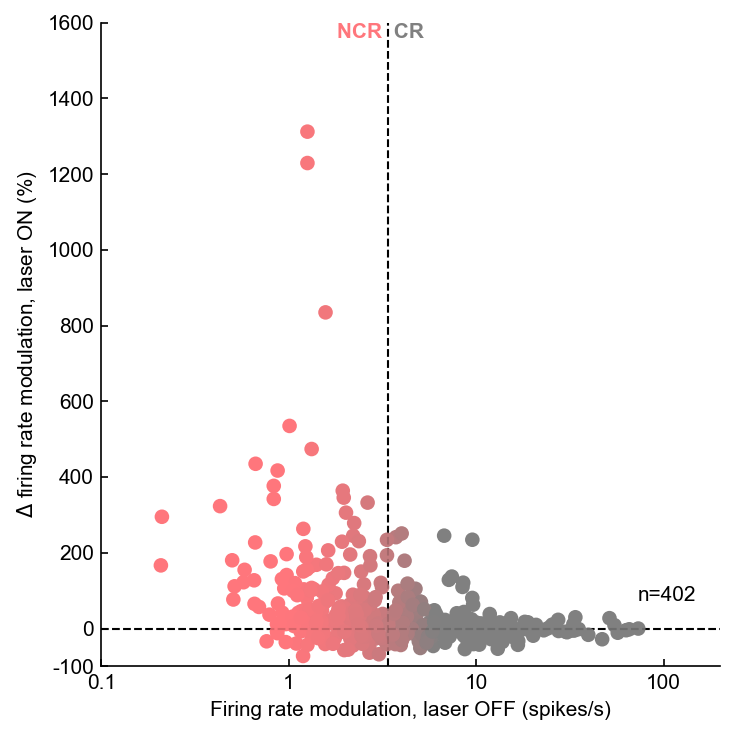

In [267]:
fig,ax = plt.subplots(figsize=(5,5))

CR_NCR_median = 3.3782569631626256
colors = NCR_CR_cmap((np.array(FRmod_off)-1)/5)

ax.scatter(FRmod_off,FRmod_delta_pc,c=colors)

xlims = [0,105]#ax.get_xlim()
ylims = [-100,1600]#ax.get_ylim()
xlims = [0.1,200]#ax.get_xlim()
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_xscale('log',subs=[])
#ax.set_yscale('log')
ax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)')
ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

ax.set_yticks([-100,0,200,400,600,800,1000,1200,1400,1600])
ax.set_yticklabels(['-100','0','200','400','600','800','1000','1200','1400','1600'])

ax.set_xticks([0.1,1,10,100])
ax.set_xticklabels(['0.1','1','10','100'])

ax.axhline(0,linestyle='--',color='k',zorder=-10,lw=1)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=-10,lw=1)
ax.axhline(0,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)

ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

ax.text(xlims[0]+0.75*(xlims[1]-xlims[0]),ylims[0]+0.125*(ylims[1]-ylims[0]),'n='+str(int(np.sum(np.isfinite(FRmod_delta_pc)))),va='top',ha='right',color='k',fontsize=10)

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin percent change in FRmod ' + subset+'.pdf'),transparent=False,facecolor="white")

# Overall Percent change in FRmod

In [328]:
FRmod_delta_abs = []
FRmod_delta_pc = []
FRmod_delta_pc_baseline = []
FRmod_on = []
FRmod_off = []

#opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_174','BS_179']
opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165','BS_174','BS_179','BS_191','BS_192']
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if not sessionfile.meta.animal in opsinanimals:
        continue
    
    if sessionfile.meta.cloudy:
        continue
        
    if not sessionfile.meta.task == 'opto reversal':
        continue
    
    for clust in sessionfile.clusters.good:
        on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
        off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
        offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline

        FRmod_on.append(on)
        FRmod_off.append(off)
        FRmod_delta_abs.append( (on-off) )
        FRmod_delta_pc.append( (on-off)/off*100 )
        FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )

100%|██████████| 101/101 [00:00<00:00, 256.28it/s]


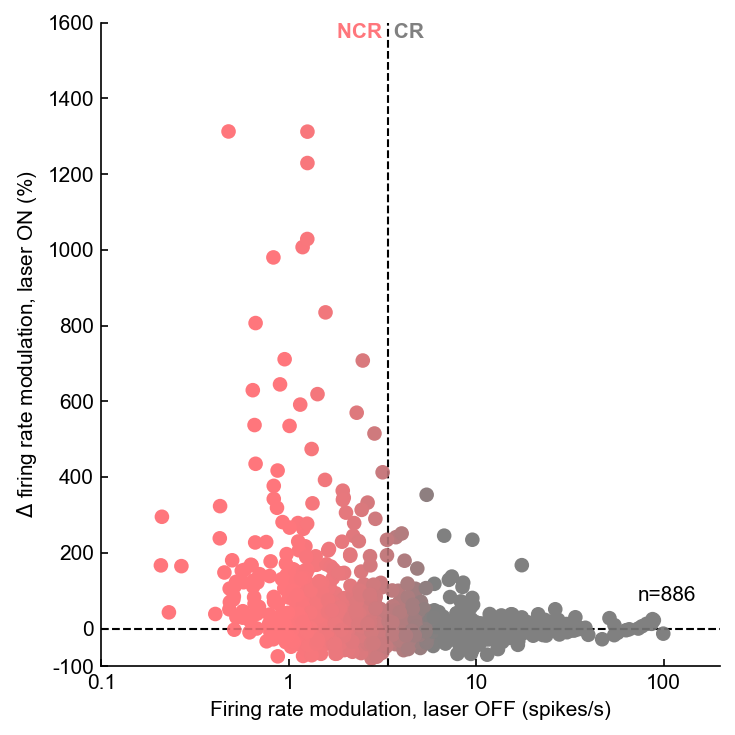

In [329]:
fig,ax = plt.subplots(figsize=(5,5))

CR_NCR_median = 3.3782569631626256
colors = NCR_CR_cmap((np.array(FRmod_off)-1)/5)

ax.scatter(FRmod_off,FRmod_delta_pc,c=colors)

xlims = [0,105]#ax.get_xlim()
ylims = [-100,1600]#ax.get_ylim()
xlims = [0.1,200]#ax.get_xlim()
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_xscale('log',subs=[])
#ax.set_yscale('log')
ax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)')
ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

ax.set_yticks([-100,0,200,400,600,800,1000,1200,1400,1600])
ax.set_yticklabels(['-100','0','200','400','600','800','1000','1200','1400','1600'])

ax.set_xticks([0.1,1,10,100])
ax.set_xticklabels(['0.1','1','10','100'])

ax.axhline(0,linestyle='--',color='k',zorder=-10,lw=1)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=-10,lw=1)
ax.axhline(0,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)

ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

ax.text(xlims[0]+0.75*(xlims[1]-xlims[0]),ylims[0]+0.125*(ylims[1]-ylims[0]),'n='+str(int(np.sum(np.isfinite(FRmod_delta_pc)))),va='top',ha='right',color='k',fontsize=10)

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin percent change in FRmod.pdf'),transparent=False,facecolor="white")

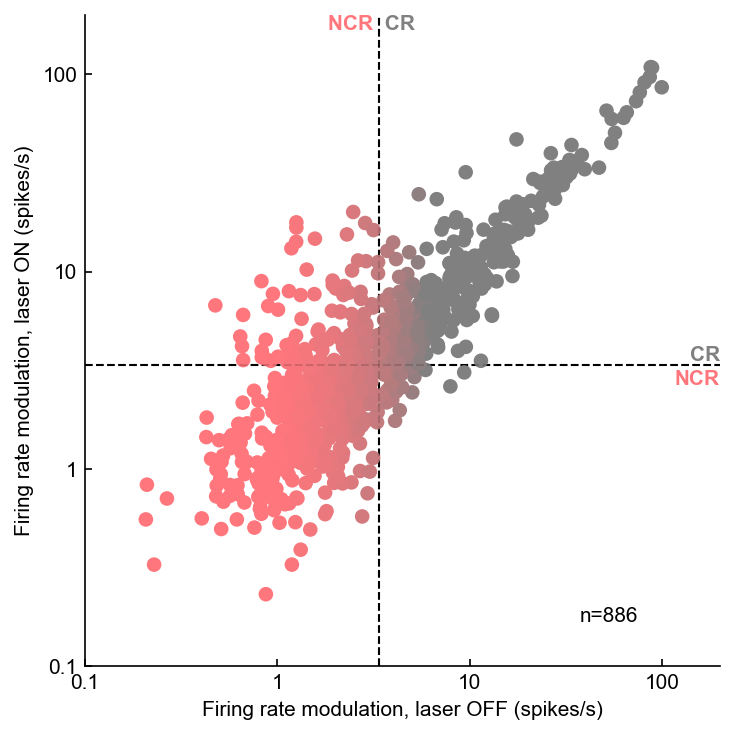

In [350]:
fig,ax = plt.subplots(figsize=(5,5))

CR_NCR_median = 3.3782569631626256
colors = NCR_CR_cmap((np.array(FRmod_off)-1)/5)

ax.scatter(FRmod_off,FRmod_on,c=colors)

#xlims = [0,105]#ax.get_xlim()
#ylims = [-100,1600]#ax.get_ylim()
xlims = [0.1,200]#ax.get_xlim()
ylims = [0.1,200]#ax.get_xlim()
ax.set_xlim(xlims)
ax.set_ylim(ylims)
#ax.set_ylim(ylims)
ax.set_xscale('log',subs=[])
ax.set_yscale('log',subs=[])
ax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)')
ax.set_ylabel('Firing rate modulation, laser ON (spikes/s)')

#ax.set_yticks([-100,0,200,400,600,800,1000,1200,1400,1600])
#ax.set_yticklabels(['-100','0','200','400','600','800','1000','1200','1400','1600'])
#ax.set_yticks([0.1,1,10,100])
#ax.set_yticklabels(['0.1','1','10','100'])

ax.set_xticks([0.1,1,10,100])
ax.set_xticklabels(['0.1','1','10','100'])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])

ax.axhline(CR_NCR_median,linestyle='--',color='k',zorder=-10,lw=1)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=-10,lw=1)
ax.axhline(CR_NCR_median,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)

ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

ax.text(xlims[1],CR_NCR_median,'CR',ha='right',va='bottom',color=CR_COLOR,weight='bold')
ax.text(xlims[1],CR_NCR_median-0.2,'NCR',ha='right',va='top',color=NCR_COLOR,weight='bold')

ax.text(75,0.2,'n='+str(int(np.sum(np.isfinite(FRmod_delta_pc)))),va='top',ha='right',color='k',fontsize=10)

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin log scale change in FRmod.pdf'),transparent=False,facecolor="white")

# %-Change FR modulation -- separated by did vs didn't learn

In [315]:
FRmod_delta_abs = []
FRmod_delta_pc = []
FRmod_delta_pc_baseline = []
FRmod_on = []
FRmod_off = []

population_subset = 'did learn'
did_learn = ['BS_92','BS_103','BS_111','BS_179']
did_not_learn = ['BS_86','BS_100','BS_119','BS_123','BS_128','BS_131','BS_163','BS_174']
opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165','BS_174','BS_179','BS_191','BS_192']


for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if population_subset == 'did learn' and not sessionfile.meta.animal in did_learn:
        continue
    if population_subset == 'did not learn' and not sessionfile.meta.animal in did_not_learn:
        continue
    
    if sessionfile.meta.cloudy:
        continue
        
    if not sessionfile.meta.task == 'opto reversal':
        continue

    try:
    
        outcomes,pre_rev,post_rev,laser_on,laser_off,valid = get_outcomes_from_sessionfile(sessionfile)
        if len(valid) < 100:
            continue
        session_behavior = get_behavior_from_outcomes(outcomes,pre_rev,post_rev,laser_on,laser_off,valid)
        hitsON = session_behavior.onPostBehavior.hits
        missesON = session_behavior.onPostBehavior.misses
        falarmsON = session_behavior.onPostBehavior.falarms
        crejectsON = session_behavior.onPostBehavior.crejects
        hitsOFF = session_behavior.offPostBehavior.hits
        missesOFF = session_behavior.offPostBehavior.misses
        falarmsOFF = session_behavior.offPostBehavior.falarms
        crejectsOFF = session_behavior.offPostBehavior.crejects
        crateON = (hitsON+crejectsON)/(hitsON+missesON+falarmsON+crejectsON)
        crateOFF = (hitsOFF+crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF)
        
#         if subset == 'improved' and crateON <= crateOFF:
#             continue
#         if subset == 'impaired' and crateON >= crateOFF:
#             continue
    
        for clust in sessionfile.clusters.good:
            on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
            off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
            offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline

            FRmod_on.append(on)
            FRmod_off.append(off)
            FRmod_delta_abs.append( (on-off) )
            FRmod_delta_pc.append( (on-off)/off*100 )
            FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )
    except Exception as e:
        print(session + ': '+ str(e))

100%|██████████| 101/101 [00:00<00:00, 251.95it/s]


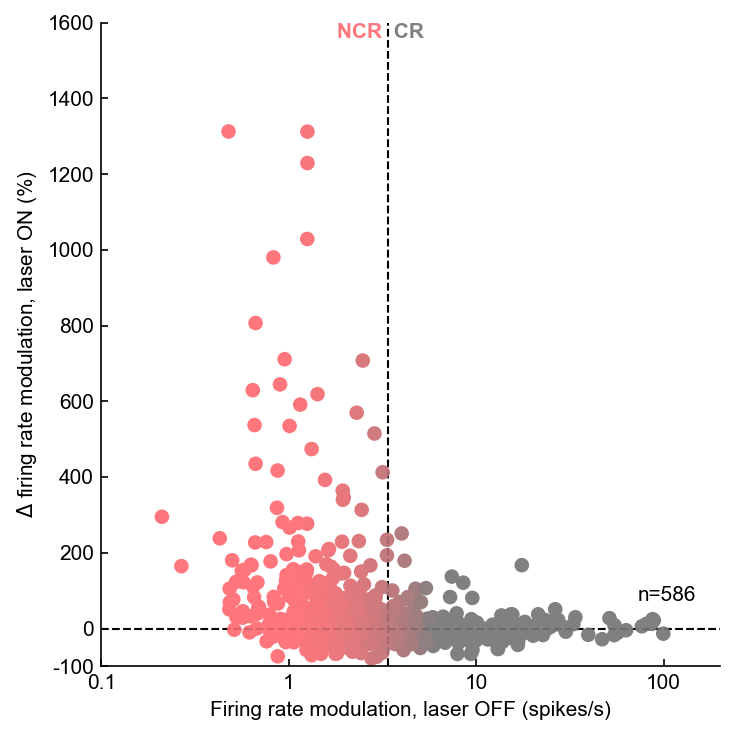

In [302]:
fig,ax = plt.subplots(figsize=(5,5))

CR_NCR_median = 3.3782569631626256
colors = NCR_CR_cmap((np.array(FRmod_off)-1)/5)

ax.scatter(FRmod_off,FRmod_delta_pc,c=colors)

xlims = [0,105]#ax.get_xlim()
ylims = [-100,1600]#ax.get_ylim()
xlims = [0.1,200]#ax.get_xlim()
ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.set_xscale('log',subs=[])
#ax.set_yscale('log')
ax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)')
ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

ax.set_yticks([-100,0,200,400,600,800,1000,1200,1400,1600])
ax.set_yticklabels(['-100','0','200','400','600','800','1000','1200','1400','1600'])

ax.set_xticks([0.1,1,10,100])
ax.set_xticklabels(['0.1','1','10','100'])

ax.axhline(0,linestyle='--',color='k',zorder=-10,lw=1)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=-10,lw=1)
ax.axhline(0,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)
ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)

ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

ax.text(xlims[0]+0.75*(xlims[1]-xlims[0]),ylims[0]+0.125*(ylims[1]-ylims[0]),'n='+str(int(np.sum(np.isfinite(FRmod_delta_pc)))),va='top',ha='right',color='k',fontsize=10)

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin percent change in FRmod '+population_subset+'.pdf'),transparent=False,facecolor="white")

# %-Change FR modulation -- separated by animal

In [315]:
FRmod_delta_abs = []
FRmod_delta_pc = []
FRmod_delta_pc_baseline = []
FRmod_on = []
FRmod_off = []

population_subset = 'did learn'
did_learn = ['BS_92','BS_103','BS_111','BS_179']
did_not_learn = ['BS_86','BS_100','BS_119','BS_123','BS_128','BS_131','BS_163','BS_174']
opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165','BS_174','BS_179','BS_191','BS_192']


for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if population_subset == 'did learn' and not sessionfile.meta.animal in did_learn:
        continue
    if population_subset == 'did not learn' and not sessionfile.meta.animal in did_not_learn:
        continue
    
    if sessionfile.meta.cloudy:
        continue
        
    if not sessionfile.meta.task == 'opto reversal':
        continue

    try:
    
        outcomes,pre_rev,post_rev,laser_on,laser_off,valid = get_outcomes_from_sessionfile(sessionfile)
        if len(valid) < 100:
            continue
        session_behavior = get_behavior_from_outcomes(outcomes,pre_rev,post_rev,laser_on,laser_off,valid)
        hitsON = session_behavior.onPostBehavior.hits
        missesON = session_behavior.onPostBehavior.misses
        falarmsON = session_behavior.onPostBehavior.falarms
        crejectsON = session_behavior.onPostBehavior.crejects
        hitsOFF = session_behavior.offPostBehavior.hits
        missesOFF = session_behavior.offPostBehavior.misses
        falarmsOFF = session_behavior.offPostBehavior.falarms
        crejectsOFF = session_behavior.offPostBehavior.crejects
        crateON = (hitsON+crejectsON)/(hitsON+missesON+falarmsON+crejectsON)
        crateOFF = (hitsOFF+crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF)
        
#         if subset == 'improved' and crateON <= crateOFF:
#             continue
#         if subset == 'impaired' and crateON >= crateOFF:
#             continue
    
        for clust in sessionfile.clusters.good:
            on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
            off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
            offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline

            FRmod_on.append(on)
            FRmod_off.append(off)
            FRmod_delta_abs.append( (on-off) )
            FRmod_delta_pc.append( (on-off)/off*100 )
            FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )
    except Exception as e:
        print(session + ': '+ str(e))

100%|██████████| 101/101 [00:00<00:00, 251.95it/s]


 35%|███▍      | 35/101 [00:00<00:00, 346.46it/s]

BS_86


 36%|███▌      | 36/101 [00:00<00:00, 359.92it/s]

BS_92


 37%|███▋      | 37/101 [00:00<00:00, 352.30it/s]

BS_100


  3%|▎         | 3/101 [00:00<00:06, 15.23it/s]

BS_103


  0%|          | 0/101 [00:00<?, ?it/s]

BS_111


 16%|█▌        | 16/101 [00:01<00:06, 13.26it/s]<ipython-input-351-ef851d7d7c49>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(5,5))
  0%|          | 0/101 [00:00<?, ?it/s]

BS_119


  0%|          | 0/101 [00:00<?, ?it/s]

BS_123


  0%|          | 0/101 [00:00<?, ?it/s]

BS_128


 33%|███▎      | 33/101 [00:00<00:00, 326.66it/s]

BS_131


 37%|███▋      | 37/101 [00:00<00:00, 352.30it/s]

BS_139


 37%|███▋      | 37/101 [00:00<00:00, 359.14it/s]

BS_163


 63%|██████▎   | 64/101 [00:00<00:00, 316.76it/s]

BS_165


 37%|███▋      | 37/101 [00:00<00:00, 352.30it/s]

BS_174


 35%|███▍      | 35/101 [00:00<00:00, 349.92it/s]

BS_179


 37%|███▋      | 37/101 [00:00<00:00, 355.69it/s]

BS_191


 37%|███▋      | 37/101 [00:00<00:00, 359.17it/s]

BS_192


100%|██████████| 101/101 [00:00<00:00, 139.86it/s]


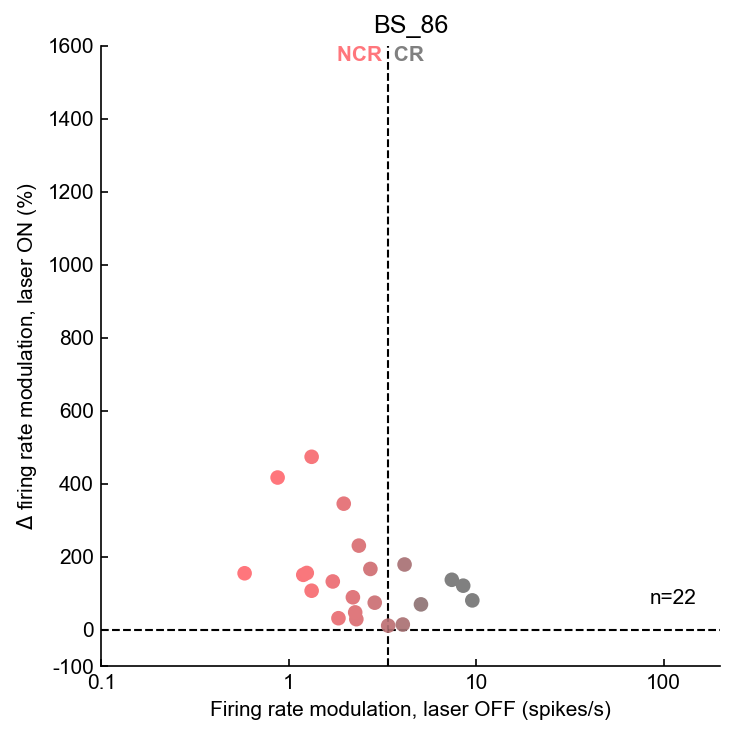

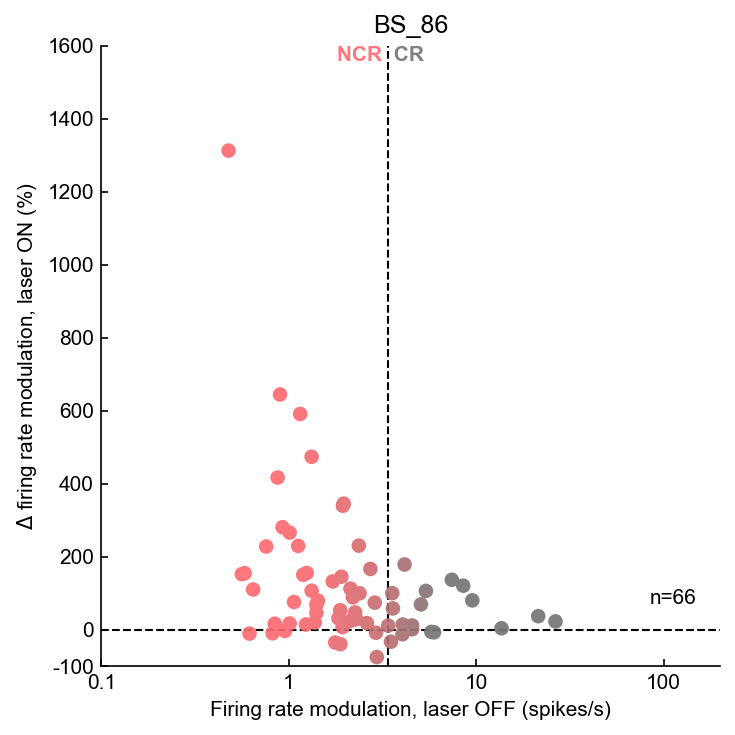

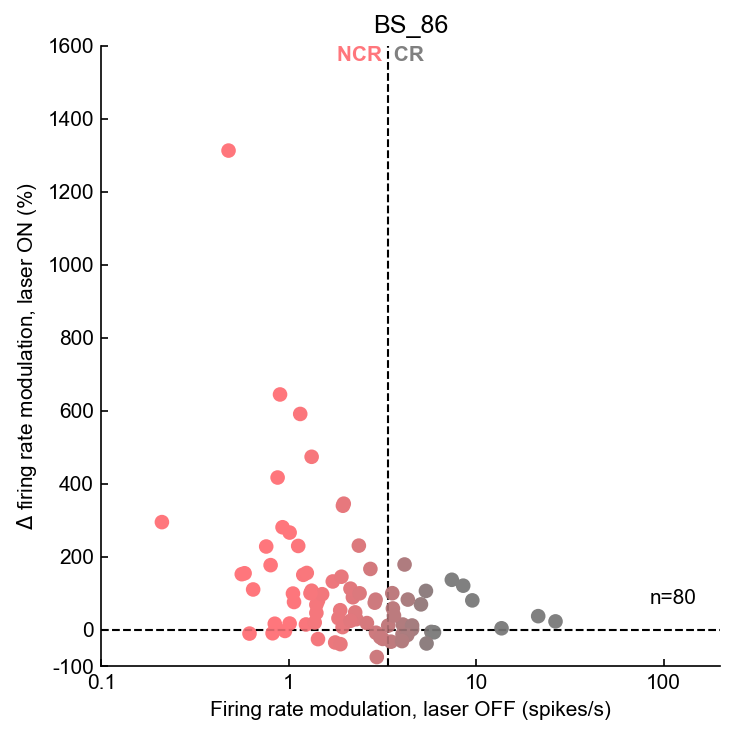

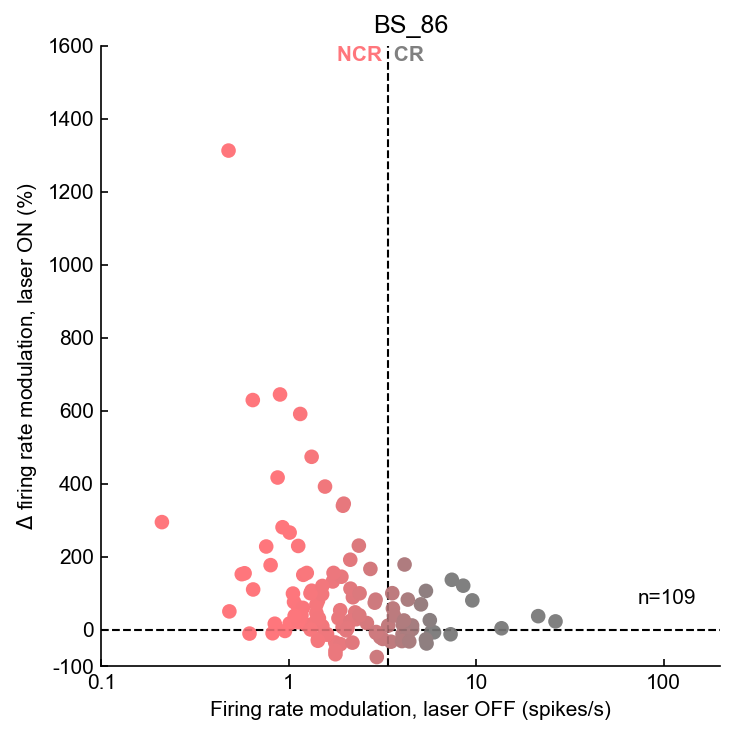

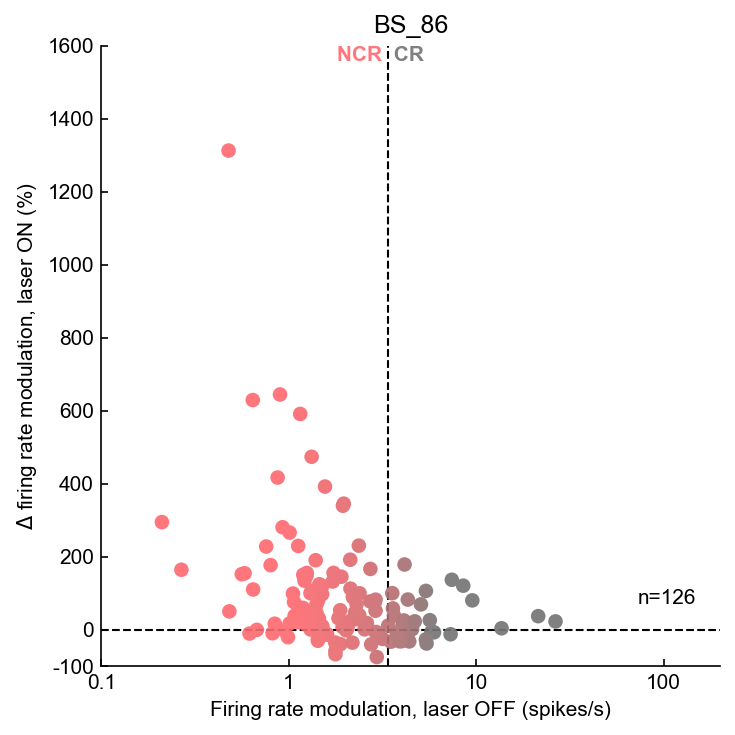

...

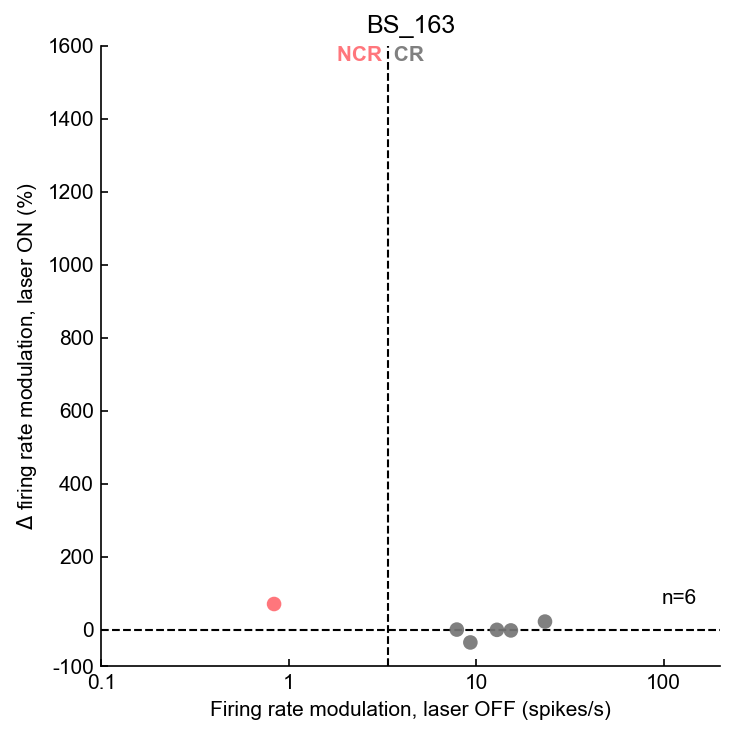

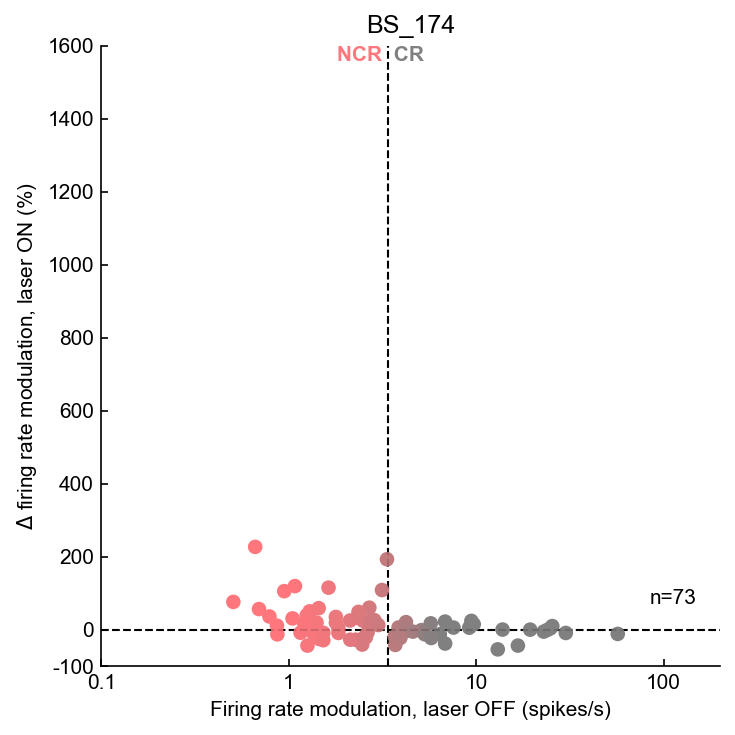

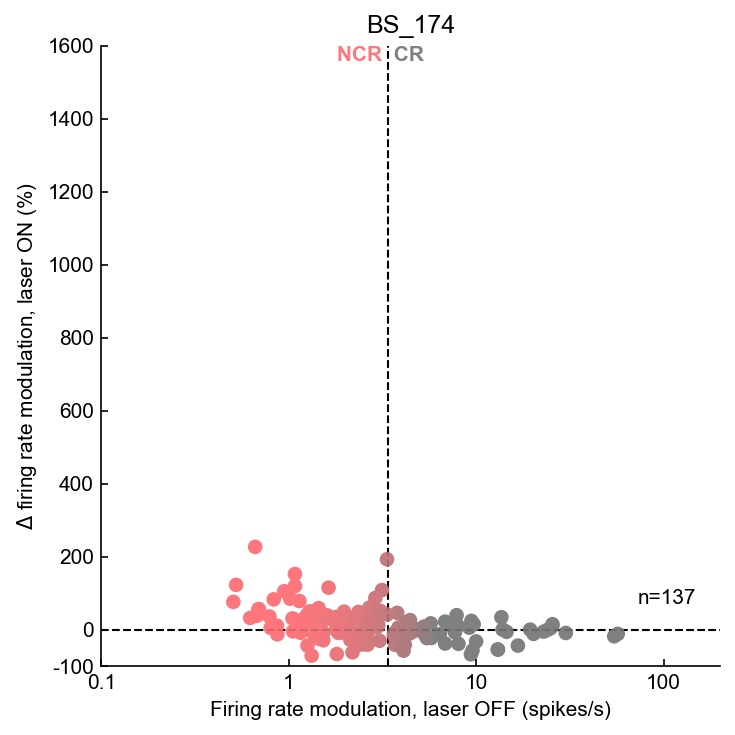

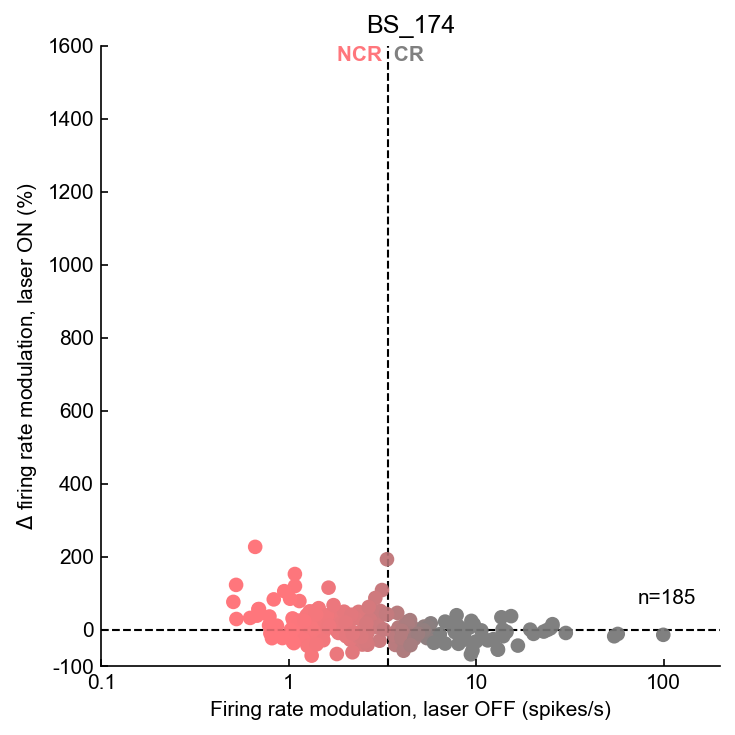

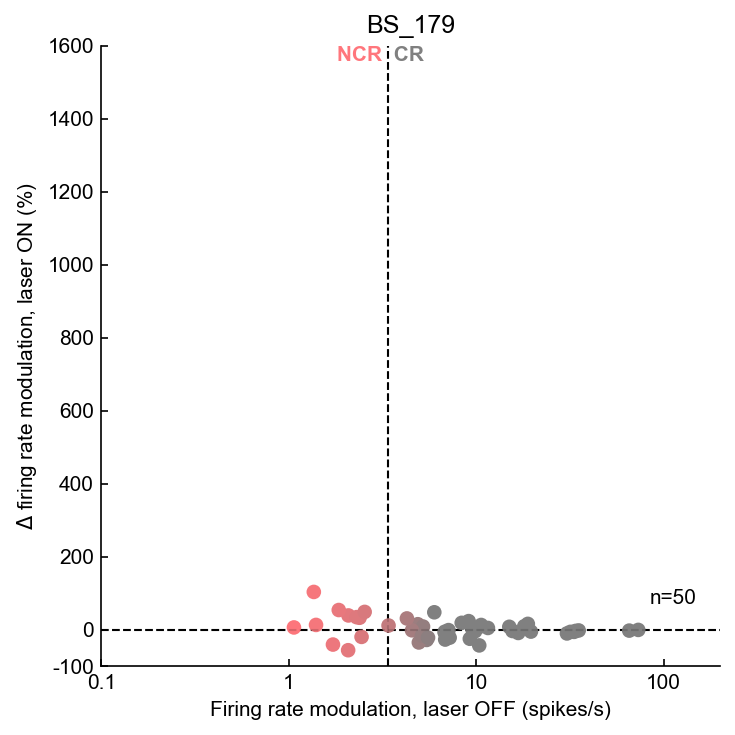

In [351]:
def plot_FR_change_figure(FRmod_on,FRmod_off,FRmod_delta_pc,animal):
    fig,ax = plt.subplots(figsize=(5,5))

    CR_NCR_median = 3.3782569631626256
    colors = NCR_CR_cmap((np.array(FRmod_off)-1)/5)

    ax.scatter(FRmod_off,FRmod_delta_pc,c=colors)

    xlims = [0,105]#ax.get_xlim()
    ylims = [-100,1600]#ax.get_ylim()
    xlims = [0.1,200]#ax.get_xlim()
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
    ax.set_xscale('log',subs=[])
    #ax.set_yscale('log')
    ax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)')
    ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

    ax.set_yticks([-100,0,200,400,600,800,1000,1200,1400,1600])
    ax.set_yticklabels(['-100','0','200','400','600','800','1000','1200','1400','1600'])

    ax.set_xticks([0.1,1,10,100])
    ax.set_xticklabels(['0.1','1','10','100'])

    ax.axhline(0,linestyle='--',color='k',zorder=-10,lw=1)
    ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=-10,lw=1)
    ax.axhline(0,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)
    ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=10,lw=1,alpha=0.15)

    ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
    ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

    ax.text(xlims[0]+0.75*(xlims[1]-xlims[0]),ylims[0]+0.125*(ylims[1]-ylims[0]),'n='+str(int(np.sum(np.isfinite(FRmod_delta_pc)))),va='top',ha='right',color='k',fontsize=10)
    ax.set_title(animal)
    
    plt.tight_layout()
    fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Percent change by animal','Opsin percent change in FRmod '+animal+'.pdf'),transparent=False,facecolor="white")
    
    
    
    
    
    
opsinanimals = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165','BS_174','BS_179','BS_191','BS_192']
for animal in opsinanimals:
    
    FRmod_delta_abs = []
    FRmod_delta_pc = []
    FRmod_delta_pc_baseline = []
    FRmod_on = []
    FRmod_off = []
    print(animal)
    
    for session in tqdm(os.listdir(ops_directory)):
        sessionfile = ilep.loadSessionCached(ops_directory,session)

        if not sessionfile.meta.animal == animal:
            continue
        
        #if population_subset == 'did learn' and not sessionfile.meta.animal in did_learn:
        #    continue
        #if population_subset == 'did not learn' and not sessionfile.meta.animal in did_not_learn:
        #    continue

        if sessionfile.meta.cloudy:
            continue

        if not sessionfile.meta.task == 'opto reversal':
            continue

        try:

            outcomes,pre_rev,post_rev,laser_on,laser_off,valid = get_outcomes_from_sessionfile(sessionfile)
            if len(valid) < 100:
                continue
            session_behavior = get_behavior_from_outcomes(outcomes,pre_rev,post_rev,laser_on,laser_off,valid)
            hitsON = session_behavior.onPostBehavior.hits
            missesON = session_behavior.onPostBehavior.misses
            falarmsON = session_behavior.onPostBehavior.falarms
            crejectsON = session_behavior.onPostBehavior.crejects
            hitsOFF = session_behavior.offPostBehavior.hits
            missesOFF = session_behavior.offPostBehavior.misses
            falarmsOFF = session_behavior.offPostBehavior.falarms
            crejectsOFF = session_behavior.offPostBehavior.crejects
            crateON = (hitsON+crejectsON)/(hitsON+missesON+falarmsON+crejectsON)
            crateOFF = (hitsOFF+crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF)

    #         if subset == 'improved' and crateON <= crateOFF:
    #             continue
    #         if subset == 'impaired' and crateON >= crateOFF:
    #             continue

            for clust in sessionfile.clusters.good:
                on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
                off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
                offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline

                FRmod_on.append(on)
                FRmod_off.append(off)
                FRmod_delta_abs.append( (on-off) )
                FRmod_delta_pc.append( (on-off)/off*100 )
                FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )
        except Exception as e:
            print(session + ': '+ str(e))
            
        plot_FR_change_figure(FRmod_on,FRmod_off,FRmod_delta_pc,animal)

In [316]:
CR_NCR_median = 3.3782569631626256
CR_OFF = np.greater_equal(FRmod_off,CR_NCR_median)
CR_ON = np.greater_equal(FRmod_on,CR_NCR_median)
NCR_OFF = np.less(FRmod_off,CR_NCR_median)
NCR_ON = np.less(FRmod_on,CR_NCR_median)

print(np.sum(CR_OFF))
print(np.sum(CR_ON))
print(np.sum(NCR_OFF))
print(np.sum(NCR_ON))
print()

NCR_to_NCR = np.logical_and(NCR_OFF,NCR_ON)
NCR_to_CR = np.logical_and(NCR_OFF,CR_ON)
CR_to_NCR = np.logical_and(CR_OFF,NCR_ON)
CR_to_CR = np.logical_and(CR_OFF,CR_ON)

print(np.sum(NCR_to_NCR))
print(np.sum(NCR_to_CR))
print(np.sum(CR_to_NCR))
print(np.sum(CR_to_CR))

150
175
150
125

116
34
9
141


[Text(0, 0, 'NCR->NCR'),
 Text(1, 0, 'NCR->CR'),
 Text(2, 0, 'CR->CR'),
 Text(3, 0, 'CR->NCR')]

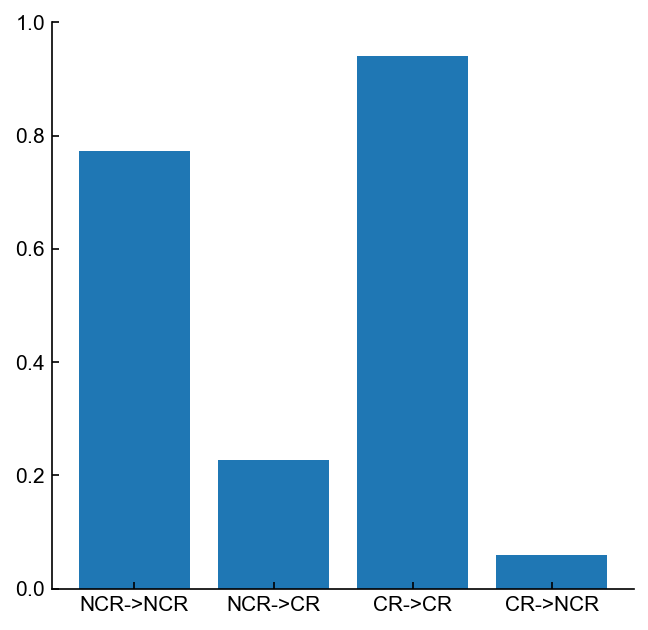

In [317]:
fig,ax = plt.subplots(figsize=(5,5))
data = [np.sum(NCR_to_NCR)/np.sum(NCR_OFF),np.sum(NCR_to_CR)/np.sum(NCR_OFF),np.sum(CR_to_CR)/np.sum(CR_OFF),np.sum(CR_to_NCR)/np.sum(NCR_OFF)]
ax.bar(range(4),data)
ax.set_ylim([0,1])
ax.set_xticks(range(4))
ax.set_xticklabels(['NCR->NCR','NCR->CR','CR->CR','CR->NCR'])

In [11]:
def plot_FR_change_figure_embedded(ax,FRmod_on,FRmod_off,FRmod_delta_pc,animal):
    CR_NCR_median = 3.3782569631626256
    colors = NCR_CR_cmap((np.array(FRmod_off)-1)/5)

    ax.scatter(FRmod_off,FRmod_delta_pc,c=colors)

    xlims = [0,105]#ax.get_xlim()
    ylims = [-100,1600]#ax.get_ylim()
    xlims = [0.1,200]#ax.get_xlim()
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
    ax.set_xscale('log',subs=[])
    #ax.set_yscale('log')
    ax.set_xlabel('Firing rate modulation, laser OFF (spikes/s)')
    ax.set_ylabel(r'$\Delta$ firing rate modulation, laser ON (%)')

    ax.set_yticks([-100,0,200,400,600,800,1000,1200,1400,1600])
    ax.set_yticklabels(['-100','0','200','400','600','800','1000','1200','1400','1600'])

    ax.set_xticks([0.1,1,10,100])
    ax.set_xticklabels(['0.1','1','10','100'])

    ax.axhline(0,linestyle='--',color='k',zorder=-10,lw=0.5)
    ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=-10,lw=0.5)
    #ax.axhline(0,linestyle='--',color='k',zorder=10,alpha=0.15,lw=0.5)
    #ax.axvline(CR_NCR_median,linestyle='--',color='k',zorder=10,alpha=0.15,lw=0.5)

    ax.text(CR_NCR_median,ylims[1],' CR',ha='left',va='top',color=CR_COLOR,weight='bold')
    ax.text(CR_NCR_median,ylims[1],'NCR ',ha='right',va='top',color=NCR_COLOR,weight='bold')

    #ax.text(xlims[0]+0.75*(xlims[1]-xlims[0]),ylims[0]+0.125*(ylims[1]-ylims[0]),'n='+str(int(np.sum(np.isfinite(FRmod_delta_pc)))),va='top',ha='right',color='k',fontsize=10)

In [12]:
def plot_outcome_rates_one_session_three_panel(ax0,ax1,ax2,hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF):    

    #########################################################################################################################################################################################
    # Plot Summaries
    #########################################################################################################################################################################################

    ax0.plot([0,1],[np.mean(crateOFF),np.mean(crateON)],color='k',zorder=-10)
    ax1.plot([0,1],[np.mean(hitrateOFF),np.mean(hitrateON)],color='g',zorder=-10)
    ax1.plot([0,1],[np.mean(missrateOFF),np.mean(missrateON)],color='purple',zorder=-10)
    ax2.plot([0,1],[np.mean(falarmrateOFF),np.mean(falarmrateON)],color='g',zorder=-10,label='go')
    ax2.plot([0,1],[np.mean(crejectrateOFF),np.mean(crejectrateON)],color='purple',zorder=-10,label='no-go')

    ax0.scatter([0],[np.mean(crateOFF)],color=GOOD_GREY,zorder=0)
    ax0.scatter([1],[np.mean(crateON)],color=LASER_COLOR,zorder=0)
    ax1.scatter([0],[np.mean(hitrateOFF)],color=GOOD_GREY,zorder=0)
    ax1.scatter([1],[np.mean(hitrateON)],color=LASER_COLOR,zorder=0)
    ax1.scatter([0],[np.mean(missrateOFF)],color=GOOD_GREY,zorder=0)
    ax1.scatter([1],[np.mean(missrateON)],color=LASER_COLOR,zorder=0)
    ax2.scatter([0],[np.mean(falarmrateOFF)],color=GOOD_GREY,zorder=0)
    ax2.scatter([1],[np.mean(falarmrateON)],color=LASER_COLOR,zorder=0)
    ax2.scatter([0],[np.mean(crejectrateOFF)],color=GOOD_GREY,zorder=0)
    ax2.scatter([1],[np.mean(crejectrateON)],color=LASER_COLOR,zorder=0)

    ax0.set_ylim([0,1])
    ax0.set_yticks([0,0.25,0.5,0.75,1])
    ax0.set_yticklabels([0,25,50,75,100])
    ax0.set_ylabel('Percent correct')
    ax1.set_ylabel('Target outcome rate (%)')
    ax2.set_ylabel('Nontarget outcome rate (%)')
    #ax3.set_ylabel('False alarm rate (%)')
    #ax4.set_ylabel('Correct reject rate (%)')

    ax0.set_xlim([-0.25,1.25])
    ax0.set_xticks([0,1])
    ax0.set_xticklabels(['OFF','ON'])

    #ax0.set_title(animal)
    #ax0.text(0.5,0.05,'n = '+str(len(hitrateON))+' sessions')
    ax2.legend(frameon=False,loc = 'upper right')

    #fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','ON-OFF behavior',save_folder,'ON-OFF behavior '+animal+' '+subset_label+suffix+'.pdf'),transparent=False,facecolor="white")

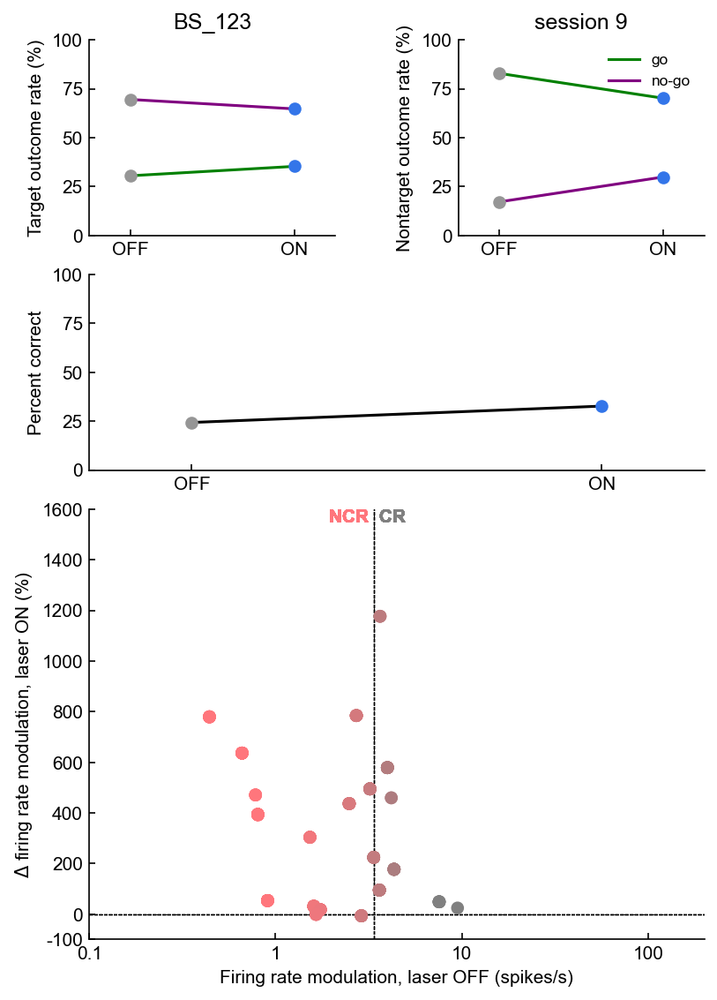

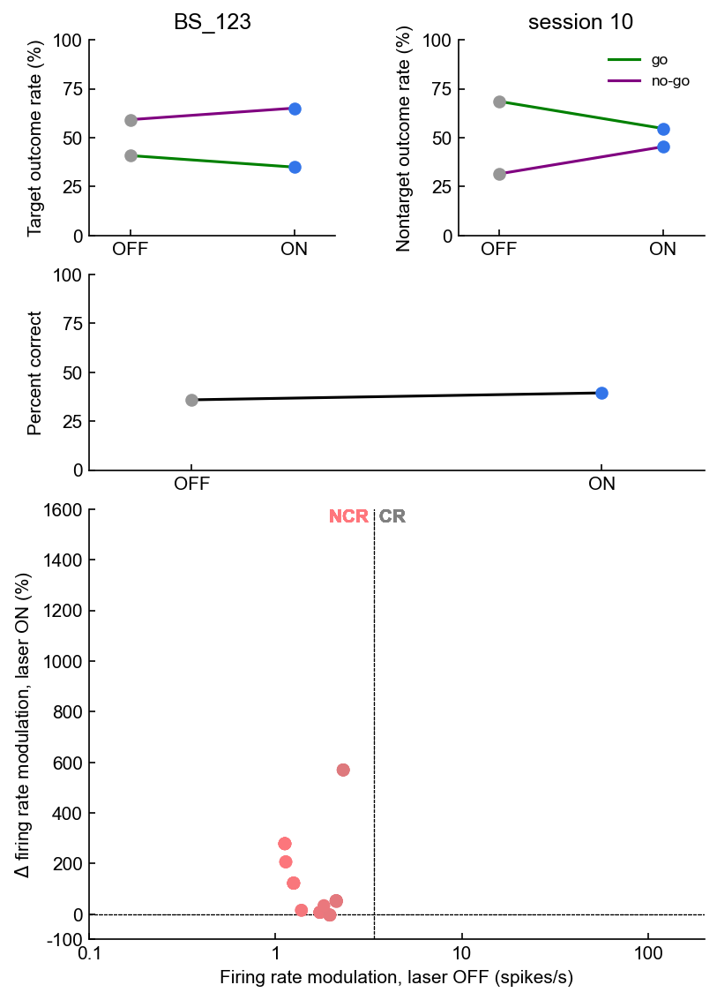

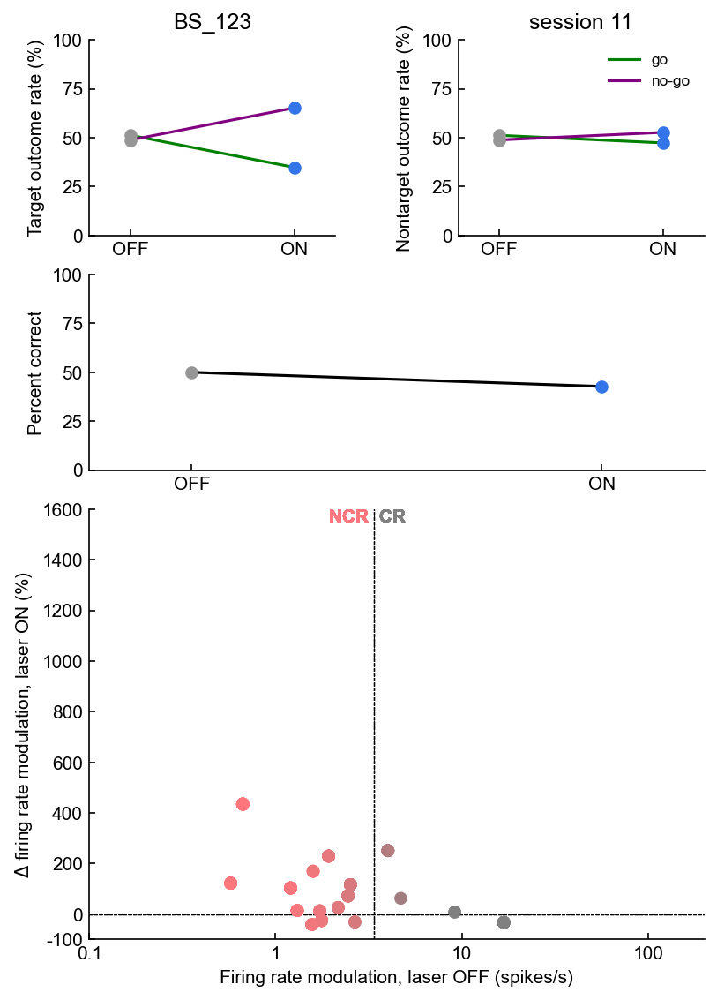

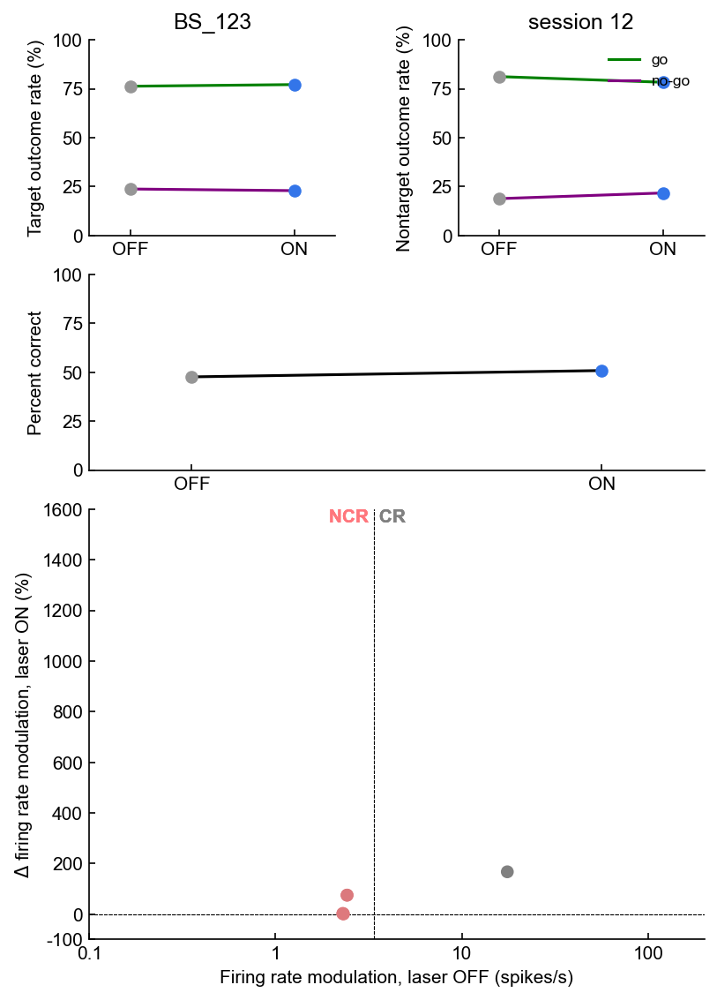

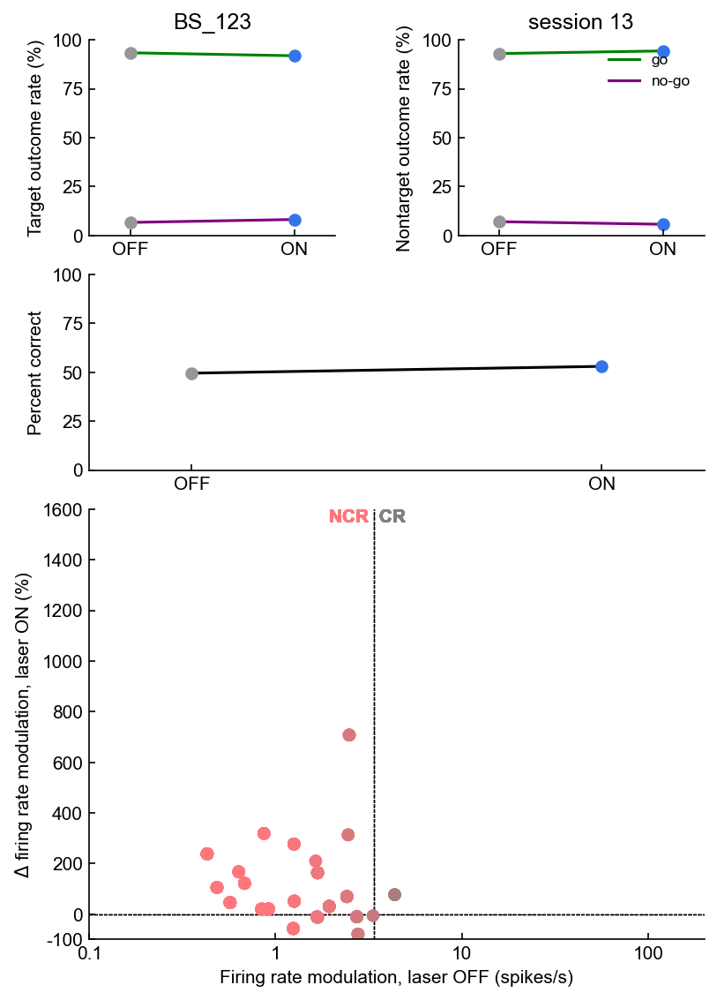

...

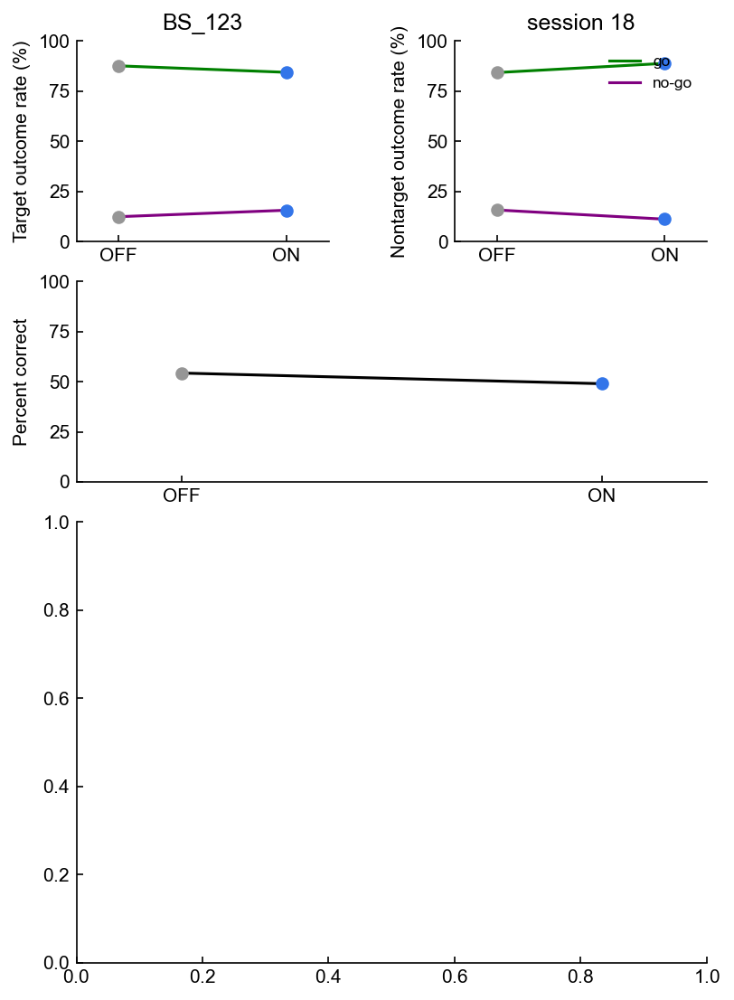

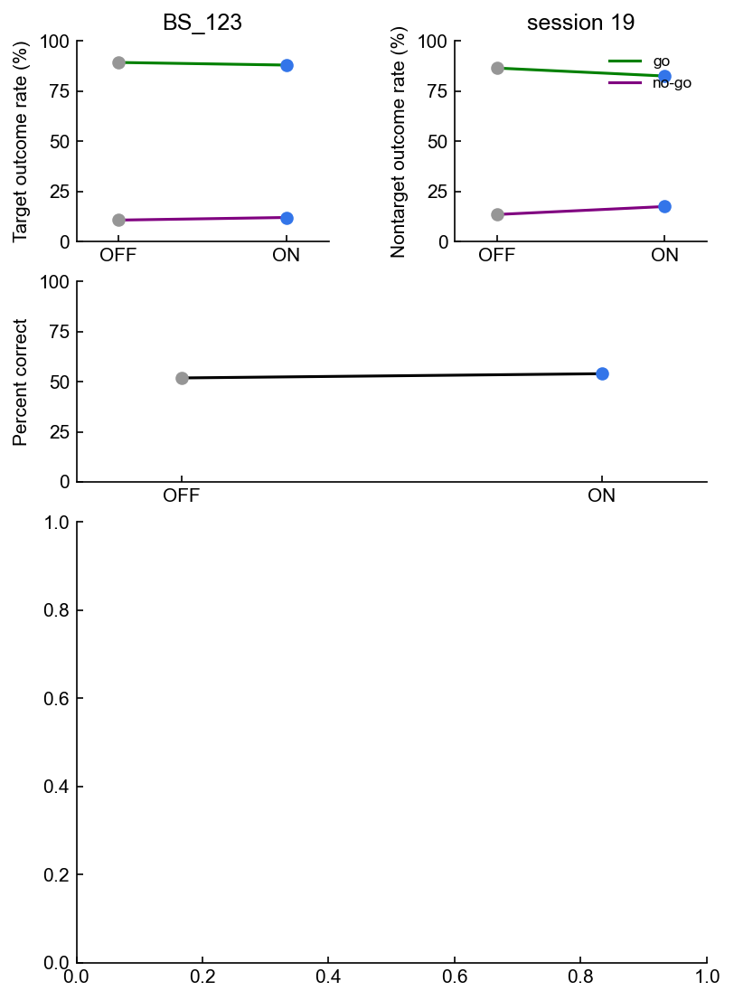

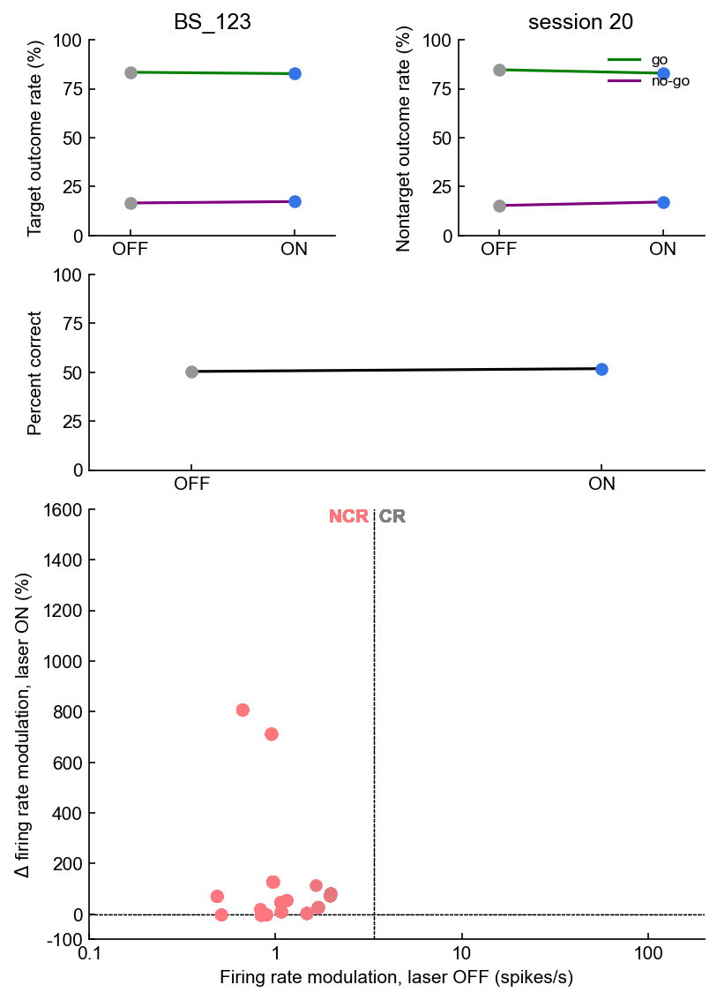

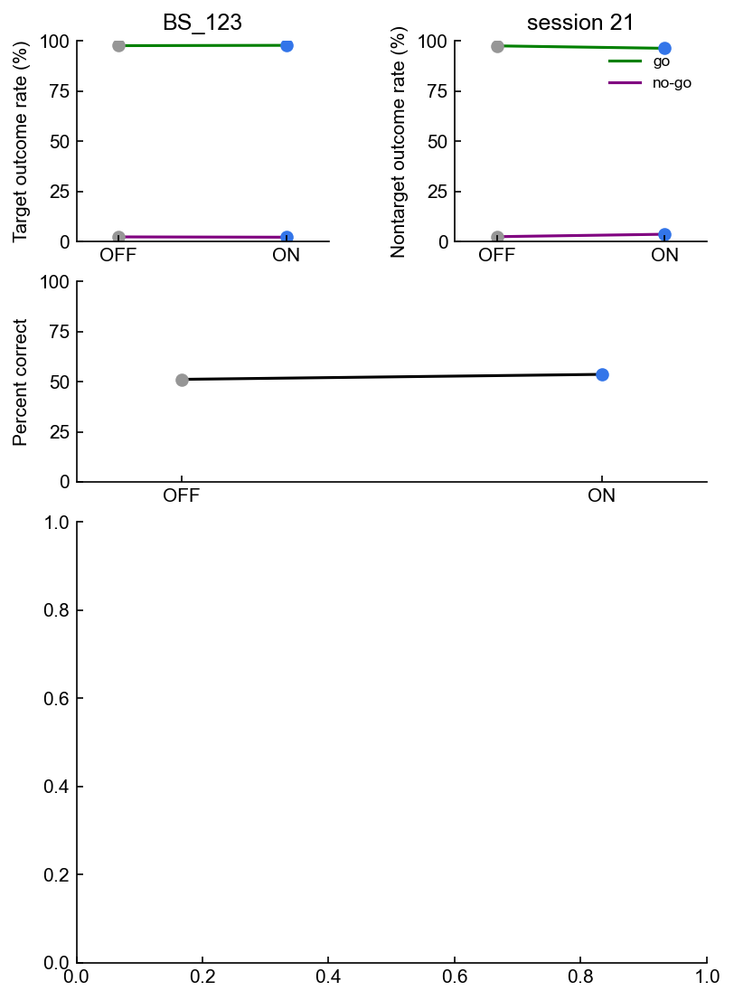

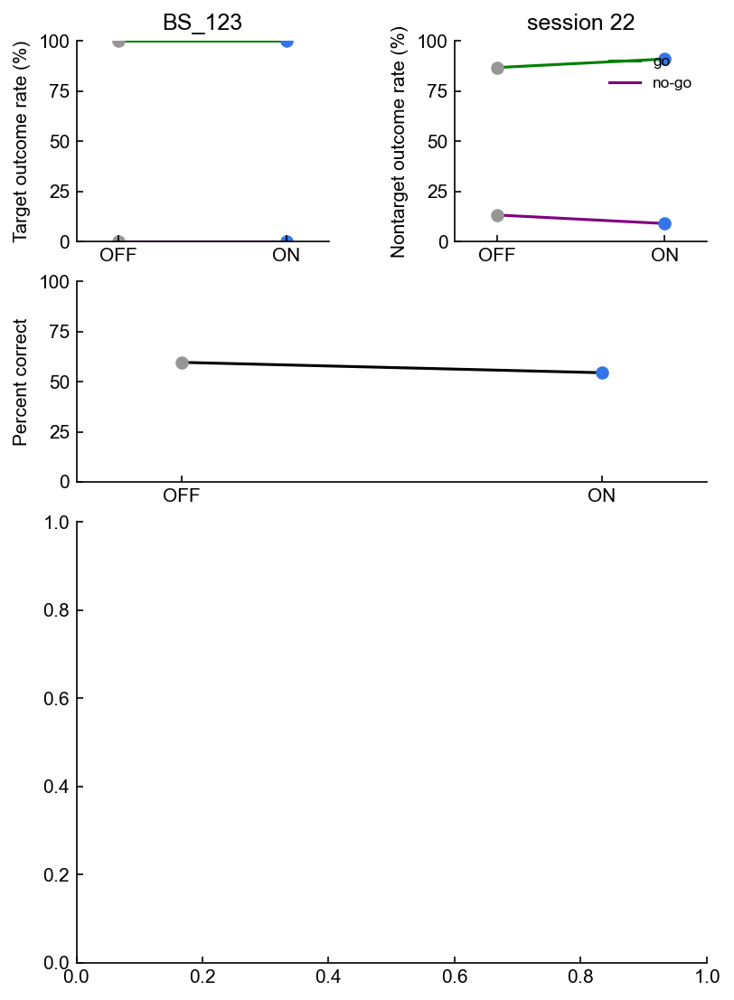

In [18]:
for animal in ['BS_123']:
    for sessionnumber in animalBehaviors[animal].sessions:
        
        if np.isnan(animalBehaviors[animal].reversal) or sessionnumber < animalBehaviors[animal].reversal:
            continue
        
        fig = plt.figure(figsize=(6,9))
        gs = fig.add_gridspec(4,2,wspace=0.5,hspace=0.2)
        ax0 = plt.subplot(gs[0,0])
        ax1 = plt.subplot(gs[0,1],sharex=ax0,sharey=ax0)
        ax2 = plt.subplot(gs[1,:],sharex=ax0,sharey=ax0)
        ax3 = plt.subplot(gs[2:4,0:2])
    
        hitrateON = []
        missrateON = []
        falarmrateON = []
        crejectrateON = []
        hitrateOFF = []
        missrateOFF = []
        falarmrateOFF = []
        crejectrateOFF = []
        crateON = []
        crateOFF = []
    
        hitsON = np.nan
        missesON = np.nan
        falarmsON = np.nan
        crejectsON = np.nan
        hitsOFF = np.nan
        missesOFF = np.nan
        falarmsOFF = np.nan
        crejectsOFF = np.nan
        
        #Need to check for cloudiness
        if sessionnumber >= animalBehaviors[animal].cloudiness:
            continue
        
        #Post-reversal
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber >= animalBehaviors[animal].reversal:
            
            try:
                hitsON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.hits
                missesON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.misses
                falarmsON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.falarms
                crejectsON = animalBehaviors[animal].sessions[sessionnumber].onPostBehavior.crejects

                hitsOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.hits
                missesOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.misses
                falarmsOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.falarms
                crejectsOFF = animalBehaviors[animal].sessions[sessionnumber].offPostBehavior.crejects
            except:
                pass
            
        hitrateON.append(hitsON / (hitsON + missesON))
        missrateON.append(missesON / (hitsON + missesON))
        falarmrateON.append(falarmsON / (falarmsON + crejectsON))
        crejectrateON.append(crejectsON / (falarmsON + crejectsON))
        crateON.append((hitsON + crejectsON)/(hitsON+missesON+falarmsON+crejectsON))

        hitrateOFF.append(hitsOFF / (hitsOFF + missesOFF))
        missrateOFF.append(missesOFF / (hitsOFF + missesOFF))
        falarmrateOFF.append(falarmsOFF / (falarmsOFF + crejectsOFF))
        crejectrateOFF.append(crejectsOFF / (falarmsOFF + crejectsOFF))
        crateOFF.append((hitsOFF + crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF))
        
        ##############################################################################################################################

        hitrateON = np.array(hitrateON)
        missrateON = np.array(missrateON)
        falarmrateON = np.array(falarmrateON)
        crejectrateON = np.array(crejectrateON)

        hitrateOFF = np.array(hitrateOFF)
        missrateOFF = np.array(missrateOFF)
        falarmrateOFF = np.array(falarmrateOFF)
        crejectrateOFF = np.array(crejectrateOFF)

        crateON = np.array(crateON)
        crateOFF = np.array(crateOFF)

        ##############################################################################################################################
        
        hitrateON = hitrateON[np.isfinite(hitrateON)]
        missrateON = missrateON[np.isfinite(missrateON)]
        falarmrateON = falarmrateON[np.isfinite(falarmrateON)]
        crejectrateON = crejectrateON[np.isfinite(crejectrateON)]

        hitrateOFF = hitrateOFF[np.isfinite(hitrateOFF)]
        missrateOFF = missrateOFF[np.isfinite(missrateOFF)]
        falarmrateOFF = falarmrateOFF[np.isfinite(falarmrateOFF)]
        crejectrateOFF = crejectrateOFF[np.isfinite(crejectrateOFF)]

        crateON = crateON[np.isfinite(crateON)]
        crateOFF = crateOFF[np.isfinite(crateOFF)]

        if len(crateOFF) < 1:
            continue
        
        #plt.close('all')
        
        plot_outcome_rates_one_session_three_panel(ax2,ax0,ax1,hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF)
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        FRmod_delta_abs = []
        FRmod_delta_pc = []
        FRmod_delta_pc_baseline = []
        FRmod_on = []
        FRmod_off = []

        sessionfile = load_recording_session(ops_directory,animal,'AC',sessionnumber)
        if not sessionfile is None:

                #outcomes,pre_rev,post_rev,laser_on,laser_off,valid = get_outcomes_from_sessionfile(sessionfile)
                #if len(valid) < 100:
                #    continue
                #session_behavior = get_behavior_from_outcomes(outcomes,pre_rev,post_rev,laser_on,laser_off,valid)
                #hitsON = session_behavior.onPostBehavior.hits
                #missesON = session_behavior.onPostBehavior.misses
                #falarmsON = session_behavior.onPostBehavior.falarms
                #crejectsON = session_behavior.onPostBehavior.crejects
                #hitsOFF = session_behavior.offPostBehavior.hits
                #missesOFF = session_behavior.offPostBehavior.misses
                #falarmsOFF = session_behavior.offPostBehavior.falarms
                #crejectsOFF = session_behavior.offPostBehavior.crejects
                #crateON = (hitsON+crejectsON)/(hitsON+missesON+falarmsON+crejectsON)
                #crateOFF = (hitsOFF+crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF)

            for clust in sessionfile.clusters.good:
                on = sessionfile.responsiveness[clust]['laser_on'].FRmodulation
                off = sessionfile.responsiveness[clust]['laser_off'].FRmodulation
                offbaseline = sessionfile.responsiveness[clust]['laser_off'].FRbaseline

                FRmod_on.append(on)
                FRmod_off.append(off)
                FRmod_delta_abs.append( (on-off) )
                FRmod_delta_pc.append( (on-off)/off*100 )
                FRmod_delta_pc_baseline.append( (on-off)/offbaseline*100 )

                plot_FR_change_figure_embedded(ax3,FRmod_on,FRmod_off,FRmod_delta_pc,animal)
                
                
                
        ax0.set_title(animal)
        ax1.set_title('session '+str(sessionnumber))
                
        fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Combined FRmod and Behavior','Combined FRmod and behavior '+animal+' session '+str(sessionnumber)+'.pdf'),transparent=False,facecolor="white")

In [366]:
animalBehaviors['BS_123'].reversal

9

# Active trials refinement

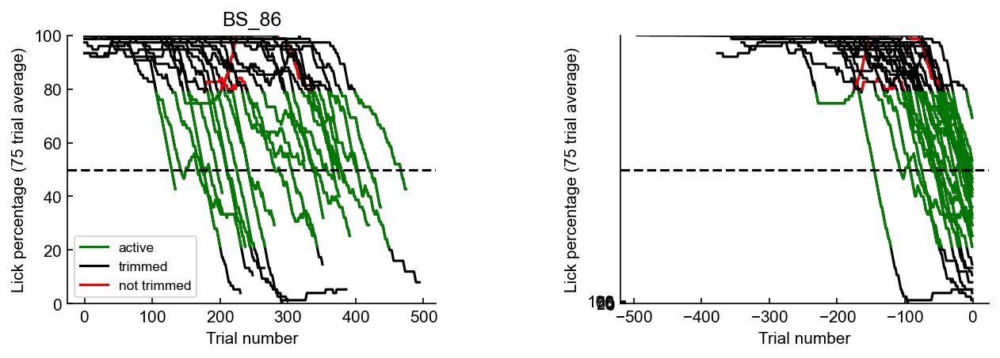

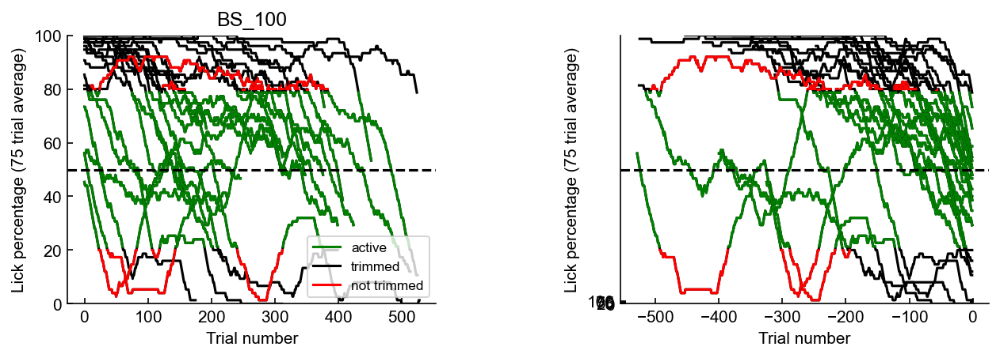

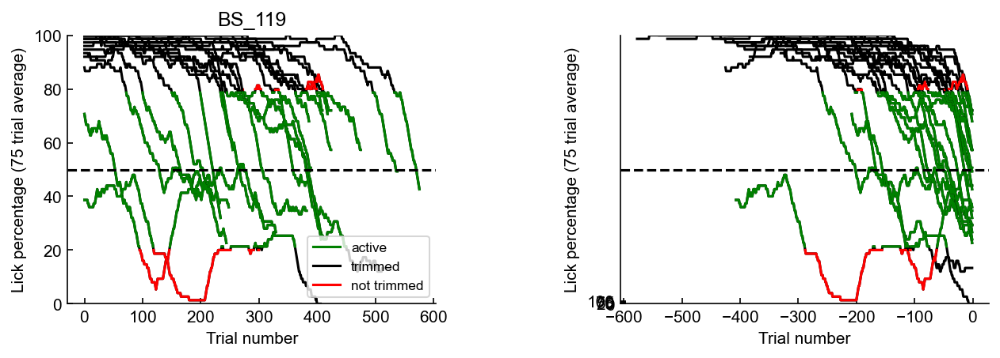

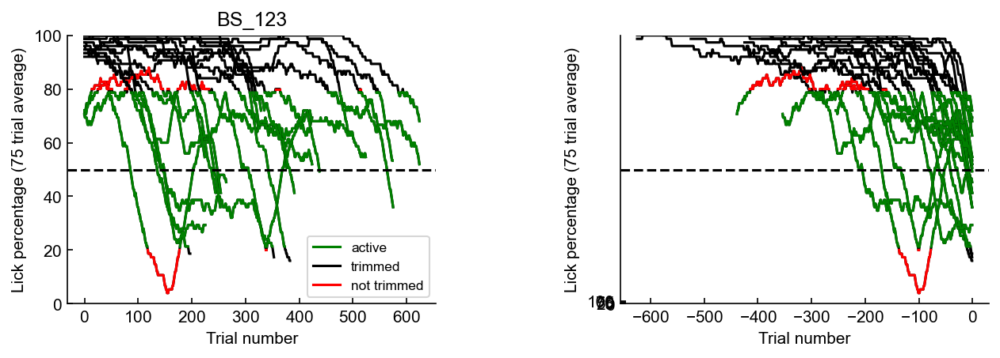

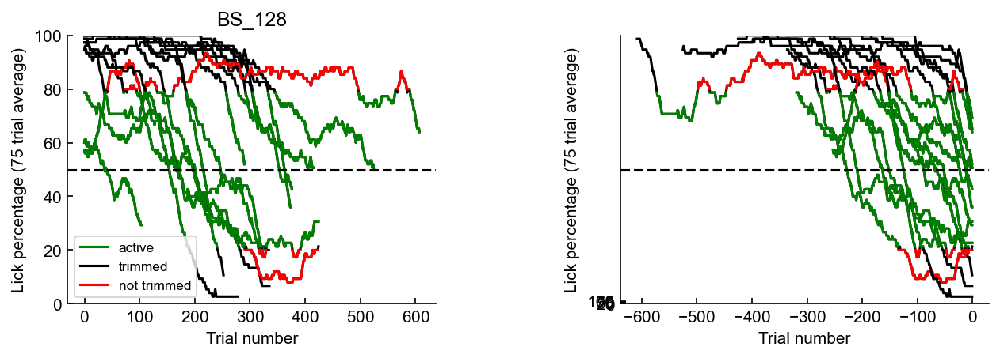

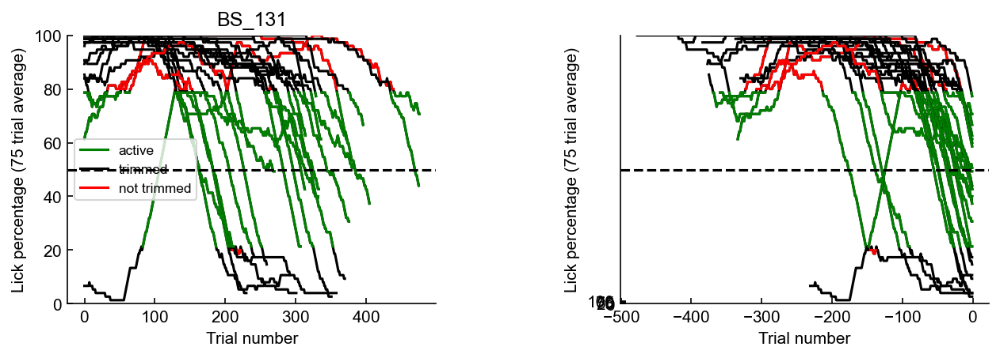

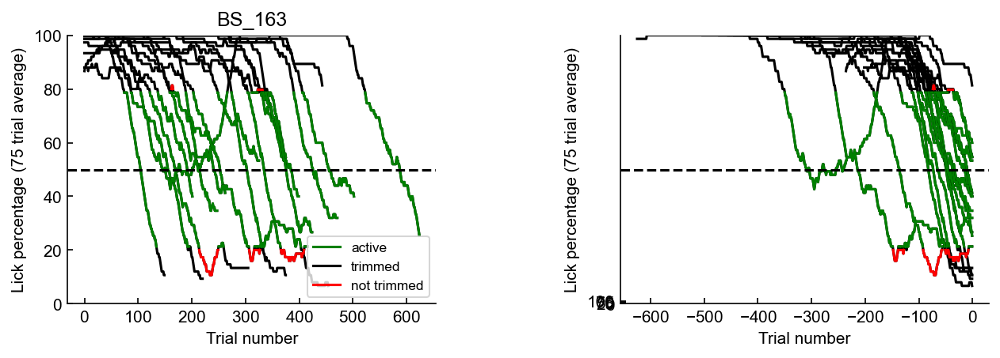

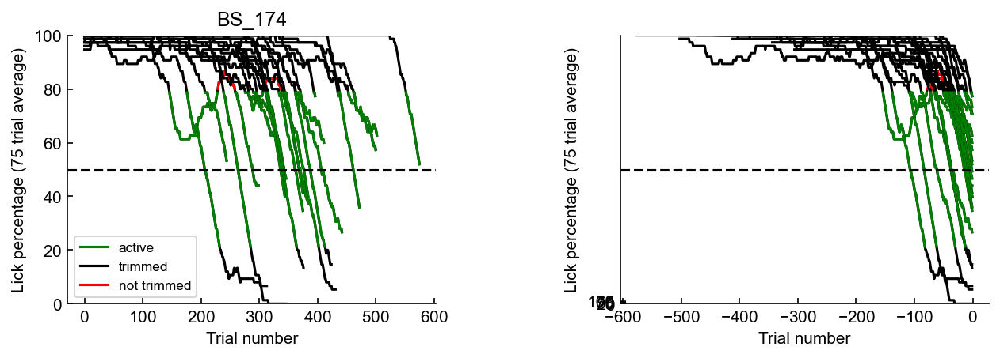

In [38]:
smoothvalue = 75

#for animal in dual_rec_animals:
for animal in did_not_learn:
    
    fig = plt.figure(figsize=(10,3))
    gs = fig.add_gridspec(1,2,wspace=0.5)
    ax1 = plt.subplot(gs[0,0])
    ax2 = plt.subplot(gs[0,1],sharey=ax0)
    
    for sessionnumber in animalBehaviors[animal].sessions:
    
        try:
    
            outcomes = animalBehaviors[animal].sessions[sessionnumber].outcomes
            isactive = np.logical_or(np.equal(outcomes,1),np.equal(outcomes,3))

            isactive = np.array([100*np.mean(isactive[i:(i+smoothvalue)]) for i in range(len(isactive)-smoothvalue)])
            
            activehighthresh = np.less(isactive,80)
            activelowthresh = np.greater(isactive,20)
            active = np.logical_and(activehighthresh,activelowthresh)
            activetrials = np.where(active)[0]
            activestart = np.min(activetrials)
            activeend = np.max(activetrials)
            
            activespan = np.array(range(len(active)))
            tempspan = np.greater_equal(activespan,activestart)
            tempspan2 = np.less_equal(activespan,activeend)
            activespan = np.logical_and(tempspan,tempspan2)
            
            
            xrange = np.array(range(len(isactive)))
            xrange2 = np.array(range(len(isactive)))-len(isactive)

            ax1.plot(xrange,isactive,color='k')
            ax2.plot(xrange2,isactive,color='k')
            
            tempactive = np.full_like(isactive,np.nan)
            tempactive[active] = isactive[active]
            ax1.plot(xrange,tempactive,color='g')
            ax2.plot(xrange2,tempactive,color='g')
            
            tempactive = np.full_like(isactive,np.nan)
            badsections = np.logical_and(activespan,np.logical_not(active))
            tempactive[badsections] = isactive[badsections]
            ax1.plot(xrange,tempactive,color='r')
            ax2.plot(xrange2,tempactive,color='r')
            
            ### ALso check that 80% of the active span is within the active window. Else skip the session

        except:
            pass
            
    ax1.plot([],[],color='g',label='active')
    ax1.plot([],[],color='k',label='trimmed')
    ax1.plot([],[],color='r',label='not trimmed')
            
    ax1.legend()
    ax1.set_ylabel('Lick percentage ('+str(smoothvalue)+' trial average)')
    ax1.set_xlabel('Trial number')
    ax1.axhline(50,zorder=10,color='k',linestyle='--')
    ax1.set_ylim([0,100])
    ax2.set_ylabel('Lick percentage ('+str(smoothvalue)+' trial average)')
    ax2.set_xlabel('Trial number')
    ax2.axhline(50,zorder=10,color='k',linestyle='--')
    ax2.set_ylim([0,100])
    #ax.set_xlim([ax.get_xlim()[0],0])
    
    ax1.set_title(animal)
    
    fig.savefig(os.path.join('D:\\\\TempFigures','Lick participation figures','Active window refinement '+animal+'.pdf'),transparent=False,facecolor="white")

In [48]:
outcomes,_,_,_,_,_ = get_outcomes_from_sessionfile(sessionfile)

In [49]:
find_active_trials(outcomes)

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [87]:
def plot_outcome_rates_active(hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF,colors,save_folder,animal,suffix):
    fig = plt.figure(figsize=(15,3))
    gs = fig.add_gridspec(1,5,wspace=0.5)
    ax0 = plt.subplot(gs[0,0])
    ax1 = plt.subplot(gs[0,1],sharex=ax0,sharey=ax0)
    ax2 = plt.subplot(gs[0,2],sharex=ax0,sharey=ax0)
    ax3 = plt.subplot(gs[0,3],sharex=ax0,sharey=ax0)
    ax4 = plt.subplot(gs[0,4],sharex=ax0,sharey=ax0)
    
    #########################################################################################################################################################################################
    # Plot Individual Points
    #########################################################################################################################################################################################
    
    p_thresh = 0.05 / 6
    
    #Correct
    crateX = np.random.uniform(low=-0.125,high=0.125,size=len(crateON))
    for idx in range(len(crateOFF)):
        ax0.plot([crateX[idx],crateX[idx]+1],[crateOFF[idx],crateON[idx]],color=colors[idx],zorder=-20,label='color '+str(idx))
    ax0.scatter(crateX,crateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax0.scatter(crateX+1,crateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(crateON,crateOFF).pvalue
    y_val = np.mean([np.mean(crateON),np.mean(crateOFF)])+0.25
    ax0.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #Hits
    hitrateX = np.random.uniform(low=-0.125,high=0.125,size=len(hitrateON))
    for idx in range(len(hitrateOFF)):
        ax1.plot([hitrateX[idx],hitrateX[idx]+1],[hitrateOFF[idx],hitrateON[idx]],color=colors[idx],zorder=-20)
    ax1.scatter(hitrateX,hitrateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax1.scatter(hitrateX+1,hitrateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(hitrateON,hitrateOFF).pvalue
    y_val = np.mean([np.mean(hitrateON),np.mean(hitrateOFF)])+0.25
    ax1.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #Misses
    missrateX = np.random.uniform(low=-0.125,high=0.125,size=len(missrateON))
    for idx in range(len(missrateOFF)):
        ax2.plot([missrateX[idx],missrateX[idx]+1],[missrateOFF[idx],missrateON[idx]],color=colors[idx],zorder=-20)
    ax2.scatter(missrateX,missrateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax2.scatter(missrateX+1,missrateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(missrateON,missrateOFF).pvalue
    y_val = np.mean([np.mean(missrateON),np.mean(missrateOFF)])+0.25
    ax2.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #Falarms
    falarmrateX = np.random.uniform(low=-0.125,high=0.125,size=len(falarmrateON))
    for idx in range(len(falarmrateOFF)):
        ax3.plot([falarmrateX[idx],falarmrateX[idx]+1],[falarmrateOFF[idx],falarmrateON[idx]],color=colors[idx],zorder=-20)
    ax3.scatter(falarmrateX,falarmrateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax3.scatter(falarmrateX+1,falarmrateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(falarmrateON,falarmrateOFF).pvalue
    y_val = np.mean([np.mean(falarmrateON),np.mean(falarmrateOFF)])+0.25
    ax3.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #Crejects
    crejectrateX = np.random.uniform(low=-0.125,high=0.125,size=len(crejectrateON))
    for idx in range(len(crejectrateOFF)):
        ax4.plot([crejectrateX[idx],crejectrateX[idx]+1],[crejectrateOFF[idx],crejectrateON[idx]],color=colors[idx],zorder=-20)
    ax4.scatter(crejectrateX,crejectrateOFF,color=GOOD_GREY,s=5,zorder=-19)
    ax4.scatter(crejectrateX+1,crejectrateON,color=LASER_COLOR,s=5,zorder=-19)
    p_val = mannwhitneyu(crejectrateON,crejectrateOFF).pvalue
    y_val = np.mean([np.mean(crejectrateON),np.mean(crejectrateOFF)])+0.25
    ax4.text(0.5,y_val,'p = '+str(int(p_val*100)/100),horizontalalignment='center',verticalalignment='center')
    
    #########################################################################################################################################################################################
    # Plot Summaries
    #########################################################################################################################################################################################

    ax0.plot([0,1],[np.mean(crateOFF),np.mean(crateON)],color='k',zorder=-10)
    ax1.plot([0,1],[np.mean(hitrateOFF),np.mean(hitrateON)],color='k',zorder=-10)
    ax2.plot([0,1],[np.mean(missrateOFF),np.mean(missrateON)],color='k',zorder=-10)
    ax3.plot([0,1],[np.mean(falarmrateOFF),np.mean(falarmrateON)],color='k',zorder=-10)
    ax4.plot([0,1],[np.mean(crejectrateOFF),np.mean(crejectrateON)],color='k',zorder=-10)

    ax0.errorbar([0,1],[np.mean(crateOFF),np.mean(crateON)],[sem(crateOFF),sem(crateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
    ax1.errorbar([0,1],[np.mean(hitrateOFF),np.mean(hitrateON)],[sem(hitrateOFF),sem(hitrateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
    ax2.errorbar([0,1],[np.mean(missrateOFF),np.mean(missrateON)],[sem(missrateOFF),sem(missrateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
    ax3.errorbar([0,1],[np.mean(falarmrateOFF),np.mean(falarmrateON)],[sem(falarmrateOFF),sem(falarmrateON)],lw=0,elinewidth=1.5,color='k',zorder=5)
    ax4.errorbar([0,1],[np.mean(crejectrateOFF),np.mean(crejectrateON)],[sem(crejectrateOFF),sem(crejectrateON)],lw=0,elinewidth=1.5,color='k',zorder=5,label='SEM')

    ax0.scatter([0],[np.mean(crateOFF)],color=GOOD_GREY,zorder=0)
    ax0.scatter([1],[np.mean(crateON)],color=LASER_COLOR,zorder=0)
    ax1.scatter([0],[np.mean(hitrateOFF)],color=GOOD_GREY,zorder=0)
    ax1.scatter([1],[np.mean(hitrateON)],color=LASER_COLOR,zorder=0)
    ax2.scatter([0],[np.mean(missrateOFF)],color=GOOD_GREY,zorder=0)
    ax2.scatter([1],[np.mean(missrateON)],color=LASER_COLOR,zorder=0)
    ax3.scatter([0],[np.mean(falarmrateOFF)],color=GOOD_GREY,zorder=0)
    ax3.scatter([1],[np.mean(falarmrateON)],color=LASER_COLOR,zorder=0)
    ax4.scatter([0],[np.mean(crejectrateOFF)],color=GOOD_GREY,zorder=0,label='laser OFF')
    ax4.scatter([1],[np.mean(crejectrateON)],color=LASER_COLOR,zorder=0,label='laser ON')

    ax0.set_ylim([0,1])
    ax0.set_yticks([0,0.25,0.5,0.75,1])
    ax0.set_yticklabels([0,25,50,75,100])
    ax0.set_ylabel('Percent correct')
    ax1.set_ylabel('Hit rate (%)')
    ax2.set_ylabel('Miss rate (%)')
    ax3.set_ylabel('False alarm rate (%)')
    ax4.set_ylabel('Correct reject rate (%)')

    ax0.set_xlim([-0.25,1.25])
    ax0.set_xticks([0,1])
    ax0.set_xticklabels(['OFF','ON'])

    ax0.set_title(animal)
    ax0.text(0.5,0.05,'n = '+str(len(hitrateON))+' sessions')
    ax4.legend(frameon=False)

    fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','ON-OFF behavior active only',save_folder,'ON-OFF behavior '+animal+' '+subset_label+suffix+'.pdf'),transparent=False,facecolor="white")

namespace(offPostBehavior=namespace(crejects=11, falarms=25, hits=17, misses=24), onPostBehavior=namespace(crejects=20, falarms=25, hits=15, misses=27))
[0 1]


C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\numpy\core\_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\insan\anaconda3\envs\EphysPlotting\lib\site-packages\matplotlib\axes\_base.py:2141: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


BS_139: 4 ns6, 7 behavior
[]


ValueError: zero-size array to reduction operation maximum which has no identity

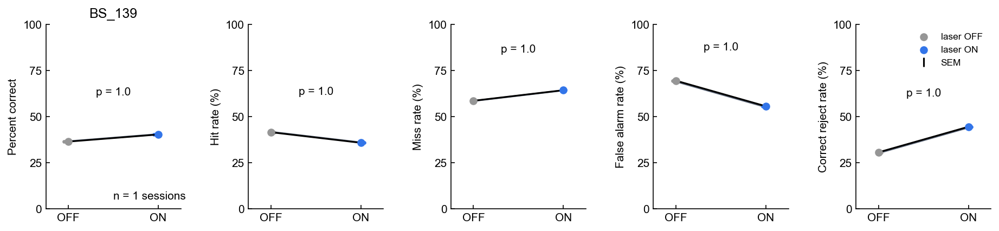

In [226]:
subset_label = 'indeterminate'
for animal in indeterminate:
    
    number_ns6 = 0
    number_beh = 0
    
    hitrateON = []
    missrateON = []
    falarmrateON = []
    crejectrateON = []
    hitrateOFF = []
    missrateOFF = []
    falarmrateOFF = []
    crejectrateOFF = []
    crateON = []
    crateOFF = []
    colors = []
    
    sessionnumbers = [n for n in animalBehaviors[animal].sessions]
    max_session = np.max(sessionnumbers)
    
    for sessionnumber in animalBehaviors[animal].sessions:
        
        color = (sessionnumber - animalBehaviors[animal].reversal)
        
        hitsON = np.nan
        missesON = np.nan
        falarmsON = np.nan
        crejectsON = np.nan
        hitsOFF = np.nan
        missesOFF = np.nan
        falarmsOFF = np.nan
        crejectsOFF = np.nan
        
        #Need to check for cloudiness
        if sessionnumber >= animalBehaviors[animal].cloudiness:
            continue
            
        
        #Need to get the actual data
        session_behavior = animalBehaviors[animal].sessions[sessionnumber]
        outcomes = session_behavior.outcomes
        valid_trials = np.array(range(len(outcomes)))
        sessionfile = load_recording_session(ops_directory,animal,'AC',sessionnumber)
        laser_on_trials = np.where(session_behavior.laser)[0]
        laser_off_trials = np.where(np.logical_not(session_behavior.laser))[0]
        if not sessionfile is None:
            #session_behavior = get_behavior_from_sessionfile(sessionfile)
            outcomes,_,_,laser_on_trials,laser_off_trials,valid_trials = get_outcomes_from_sessionfile(sessionfile)
            number_ns6 += 1
        else:
            number_beh += 1
        #Post-reversal
        post_rev_trials = []
        pre_rev_trials = []
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber > animalBehaviors[animal].reversal:
            post_rev_trials = np.array(range(len(outcomes)))
        #Pre-reversal
        elif np.isnan(animalBehaviors[animal].reversal) or sessionnumber < animalBehaviors[animal].reversal:
            pre_rev_trials = np.array(range(len(outcomes)))
            
        trials_to_keep_valid = find_active_trials(outcomes)
        trials_to_keep_valid = np.where(trials_to_keep_valid)[0]
        valid_trials = valid_trials[np.isin(valid_trials,trials_to_keep_valid)]
        if len(valid_trials) < 100:
            continue
        
        ##Remove "non-behaving" trials
        #trials_to_keep_valid = np.ones_like(valid_trials,dtype='bool')
        #trials_to_keep_valid[0:100] = False                                 #Valid trials needs to be in the format of a list of trials NOT a boolean array
        #if len(trials_to_keep_valid) > 200:
        #    trials_to_keep_valid[0:(len(trials_to_keep_valid)-201)] = False
        #trials_to_keep_valid = np.where(trials_to_keep_valid)[0]
        #valid_trials = valid_trials[np.isin(valid_trials,trials_to_keep_valid)]
        #if len(valid_trials) < 100:
        #    continue
            
        outcomes = np.array(outcomes)
        pre_rev_trials = np.array(pre_rev_trials)
        post_rev_trials = np.array(post_rev_trials)
        laser_on_trials = np.array(laser_on_trials)
        laser_off_trials = np.array(laser_off_trials)
        valid_trials = np.array(valid_trials)
        
        
        if animal == 'BS_86':
            #print(valid_trials)
            pass
        
        
        session_behavior = get_behavior_from_outcomes(outcomes,pre_rev_trials,post_rev_trials,laser_on_trials,laser_off_trials,valid_trials)
        
        
        ###################################################################################################################################################
        
        
        #Post-reversal
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber > animalBehaviors[animal].reversal:
            try:
                hitsON = session_behavior.onPostBehavior.hits
                missesON = session_behavior.onPostBehavior.misses
                falarmsON = session_behavior.onPostBehavior.falarms
                crejectsON = session_behavior.onPostBehavior.crejects

                hitsOFF = session_behavior.offPostBehavior.hits
                missesOFF = session_behavior.offPostBehavior.misses
                falarmsOFF = session_behavior.offPostBehavior.falarms
                crejectsOFF = session_behavior.offPostBehavior.crejects
                
                print(session_behavior)
            except Exception as e:
                #print(animal)
                #print(sessionnumber)
                #print(e)
                pass
            
        #Pre-reversal
        elif np.isnan(animalBehaviors[animal].reversal) or sessionnumber < animalBehaviors[animal].reversal:
            continue
            pass
            #try:
            #    hitsON = session_behavior.onPreBehavior.hits
            #    missesON = session_behavior.onPreBehavior.misses
            #    falarmsON = session_behavior.onPreBehavior.falarms
            #    crejectsON = session_behavior.onPreBehavior.crejects
            #
            #    hitsOFF = session_behavior.offPreBehavior.hits
            #    missesOFF = session_behavior.offPreBehavior.misses
            #    falarmsOFF = session_behavior.offPreBehavior.falarms
            #    crejectsOFF = session_behavior.offPreBehavior.crejects
            #except Exception as e:
            #    #print(animal)
            #    #print(sessionnumber)
            #    #print(e)
            #    pass
            
        hitrateON.append(hitsON / (hitsON + missesON))
        missrateON.append(missesON / (hitsON + missesON))
        falarmrateON.append(falarmsON / (falarmsON + crejectsON))
        crejectrateON.append(crejectsON / (falarmsON + crejectsON))
        crateON.append((hitsON + crejectsON)/(hitsON+missesON+falarmsON+crejectsON))

        hitrateOFF.append(hitsOFF / (hitsOFF + missesOFF))
        missrateOFF.append(missesOFF / (hitsOFF + missesOFF))
        falarmrateOFF.append(falarmsOFF / (falarmsOFF + crejectsOFF))
        crejectrateOFF.append(crejectsOFF / (falarmsOFF + crejectsOFF))
        crateOFF.append((hitsOFF + crejectsOFF)/(hitsOFF+missesOFF+falarmsOFF+crejectsOFF))
        
        colors.append(color)
        
    ##############################################################################################################################
        
    hitrateON = np.array(hitrateON)
    missrateON = np.array(missrateON)
    falarmrateON = np.array(falarmrateON)
    crejectrateON = np.array(crejectrateON)
        
    hitrateOFF = np.array(hitrateOFF)
    missrateOFF = np.array(missrateOFF)
    falarmrateOFF = np.array(falarmrateOFF)
    crejectrateOFF = np.array(crejectrateOFF)
        
    crateON = np.array(crateON)
    crateOFF = np.array(crateOFF)
    
    colors = np.array(colors)
        
    ##############################################################################################################################
        
    hitrateON = hitrateON[np.isfinite(hitrateON)]
    missrateON = missrateON[np.isfinite(missrateON)]
    falarmrateON = falarmrateON[np.isfinite(falarmrateON)]
    crejectrateON = crejectrateON[np.isfinite(crejectrateON)]
        
    hitrateOFF = hitrateOFF[np.isfinite(hitrateOFF)]
    missrateOFF = missrateOFF[np.isfinite(missrateOFF)]
    falarmrateOFF = falarmrateOFF[np.isfinite(falarmrateOFF)]
    crejectrateOFF = crejectrateOFF[np.isfinite(crejectrateOFF)]
        
    crateON = crateON[np.isfinite(crateON)]
    temp = np.isfinite(crateOFF)
    crateOFF = crateOFF[np.isfinite(crateOFF)]
    
    print(colors)
    colors = colors[temp]
    max_color_number = np.max(colors)
    colors = np.array([reversal_cmap(c/max_color_number) for c in colors])
            
    plot_outcome_rates_active(hitrateON,missrateON,falarmrateON,crejectrateON,hitrateOFF,missrateOFF,falarmrateOFF,crejectrateOFF,crateON,crateOFF,colors,'animals',animal,' active trials')
    
    print(animal + ': '+str(number_ns6)+ ' ns6, '+str(number_beh)+' behavior')

In [192]:
def calculate_bootstrapped_significance(outcomes,laser,valid_trials, repetitions = 1000):
    outcomes = outcomes[valid_trials]
    laser = laser[valid_trials]
    
    if np.sum(laser) == 0:
        return np.nan,np.nan,np.nan,np.nan
    
    #Calculate target and nontarget trials
    outcomes_target = np.logical_or(np.equal(outcomes,1) , np.equal(outcomes,2))
    outcomes_nontarget = np.logical_or(np.equal(outcomes,3) , np.equal(outcomes,4))
    outcomes_target = outcomes[outcomes_target]
    outcomes_nontarget = outcomes[outcomes_nontarget]
    
    outcomes_on = outcomes[laser]
    outcomes_off = outcomes[np.logical_not(laser)]
    
    hitsON = np.sum(np.equal(outcomes_on,1))
    missesON = np.sum(np.equal(outcomes_on,2))
    falarmsON = np.sum(np.equal(outcomes_on,3))
    crejectsON = np.sum(np.equal(outcomes_on,4))
    
    hitsOFF = np.sum(np.equal(outcomes_off,1))
    missesOFF = np.sum(np.equal(outcomes_off,2))
    falarmsOFF = np.sum(np.equal(outcomes_off,3))
    crejectsOFF = np.sum(np.equal(outcomes_off,4))
    
    #Calculate the difference in go rates for partition by laser -- these are the test values
    goRateTargetON = (hitsON) / (hitsON + missesON)
    goRateTargetOFF = (hitsOFF) / (hitsOFF + missesOFF)
    goRateNontargetON = (falarmsON) / (falarmsON + crejectsON)
    goRateNontargetOFF = (falarmsOFF) / (falarmsOFF + crejectsOFF)
    diffRateTarget = goRateTargetON - goRateTargetOFF
    diffRateNontarget = goRateNontargetON - goRateNontargetOFF
    
    diffRatesTarget_control = []
    diffRatesNontarget_control = []
    for idx in range(repetitions):
        
        lengthTarget = len(outcomes_target)
        permutationTarget = np.array(range(lengthTarget))
        permutationTarget = np.random.permutation(permutationTarget)
        partitionATarget = permutationTarget[0:int(lengthTarget/2)]
        partitionBTarget = permutationTarget[int(lengthTarget/2):lengthTarget]
        partitionATarget = outcomes_target[partitionATarget]
        partitionBTarget = outcomes_target[partitionBTarget]
        
        lengthNontarget = len(outcomes_nontarget)
        permutationNontarget = np.array(range(lengthNontarget))
        permutationNontarget = np.random.permutation(permutationNontarget)
        partitionANontarget = permutationNontarget[0:int(lengthNontarget/2)]
        partitionBNontarget = permutationNontarget[int(lengthNontarget/2):lengthNontarget]
        partitionANontarget = outcomes_nontarget[partitionANontarget]
        partitionBNontarget = outcomes_nontarget[partitionBNontarget]
        
        hitsA = np.sum(np.equal(partitionATarget,1))
        missesA = np.sum(np.equal(partitionATarget,2))
        falarmsA = np.sum(np.equal(partitionANontarget,3))
        crejectsA = np.sum(np.equal(partitionANontarget,4))
        
        hitsB = np.sum(np.equal(partitionBTarget,1))
        missesB = np.sum(np.equal(partitionBTarget,2))
        falarmsB = np.sum(np.equal(partitionBNontarget,3))
        crejectsB = np.sum(np.equal(partitionBNontarget,4))
        
        goRateTargetA = (hitsA) / (hitsA + missesA)
        goRateTargetB = (hitsB) / (hitsB + missesB)
        goRateNontargetA = (falarmsA) / (falarmsA + crejectsA)
        goRateNontargetB = (falarmsB) / (falarmsB + crejectsB)
        this_diffRateTarget = goRateTargetA - goRateTargetB
        this_diffRateNontarget = goRateNontargetA - goRateNontargetB
        
        diffRatesTarget_control.append(this_diffRateTarget)
        diffRatesNontarget_control.append(this_diffRateNontarget)
    
    #plt.hist(diffRatesNontarget_control,bins=100)
    #plt.axvline(diffRateNontarget,color='k')
    
    #diffRates are gaussian
    Z_target = (diffRateTarget-np.mean(diffRatesTarget_control)) / np.std(diffRatesTarget_control)
    p_val_target = norm.sf(abs(Z_target))
    
    Z_nontarget = (diffRateNontarget-np.mean(diffRatesNontarget_control)) / np.std(diffRatesNontarget_control)
    p_val_nontarget = norm.sf(abs(Z_nontarget))
    
    return diffRateTarget,diffRateNontarget,p_val_target,p_val_nontarget

<ipython-input-145-08d4e9e20f89>:25: RuntimeWarning: invalid value encountered in long_scalars
  goRateTargetON = (hitsON) / (hitsON + missesON)
<ipython-input-145-08d4e9e20f89>:27: RuntimeWarning: invalid value encountered in long_scalars
  goRateNontargetON = (falarmsON) / (falarmsON + crejectsON)


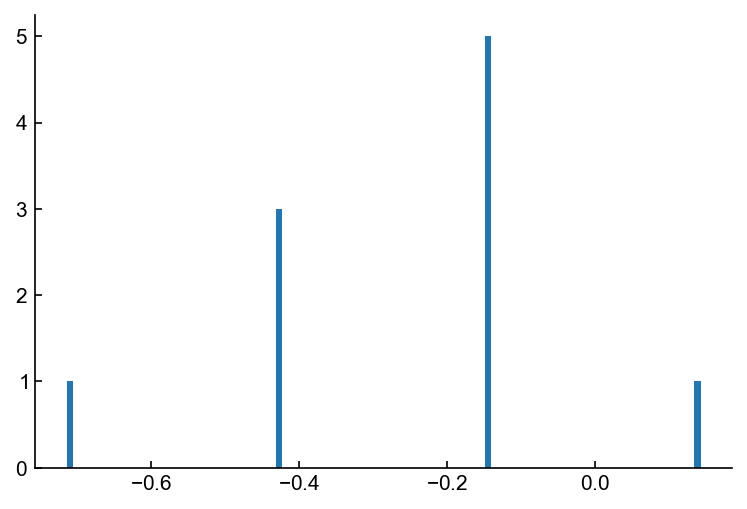

In [146]:
outcomes = np.array([1,2,3,2,3,4,3,1,3,4,2,4,3,2,4,1,1,2,1,4,3,1,2,4,2,3,1])
laser = np.zeros_like(outcomes,dtype='bool')
valid_trials = np.ones_like(outcomes,dtype='bool')

calculate_bootstrapped_significance(outcomes,laser,valid_trials,repetitions=10)

In [168]:
outcomes,pre_rev_trials,post_rev_trials,laser_on_trials,laser_off_trials,valid_trials = get_outcomes_from_sessionfile(sessionfile)

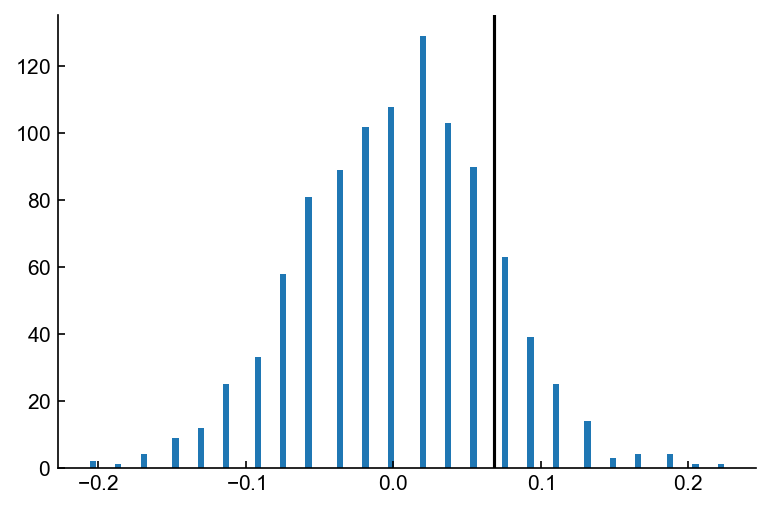

In [176]:
a,b,c,d = calculate_bootstrapped_significance(outcomes,sessionfile.trials.laser_stimulation,valid_trials,repetitions=1000)

In [177]:
a

0.013152553381505228

In [178]:
b

0.06865828092243187

In [179]:
c

0.40374138668640935

In [180]:
d

0.15062350249906398

[       nan        nan        nan        nan        nan 0.41720014
 0.41735168 0.31221972 0.251908   0.30113206]
[       nan        nan        nan        nan        nan 0.12883764
 0.47171075 0.07785085 0.23694594 0.10078163]
[       nan        nan        nan        nan        nan        nan
        nan 0.31143741 0.10387369 0.46420882]
[       nan        nan        nan        nan        nan        nan
        nan 0.46642693 0.02661931 0.41953384]
[       nan        nan        nan        nan 0.00089239 0.08838812
 0.22023695 0.20019688 0.35095069 0.2984493 ]
[       nan        nan        nan        nan 0.46189223 0.2438259
 0.43192942 0.19100886 0.18790246 0.37167735]
[       nan        nan 0.05323974 0.29650206 0.04885449 0.12616389
 0.07681815 0.02648373 0.03952678 0.11532313]
[       nan        nan 0.44113729 0.00050616 0.41214521 0.17623715
 0.43986384 0.03048057 0.40943937 0.17974782]


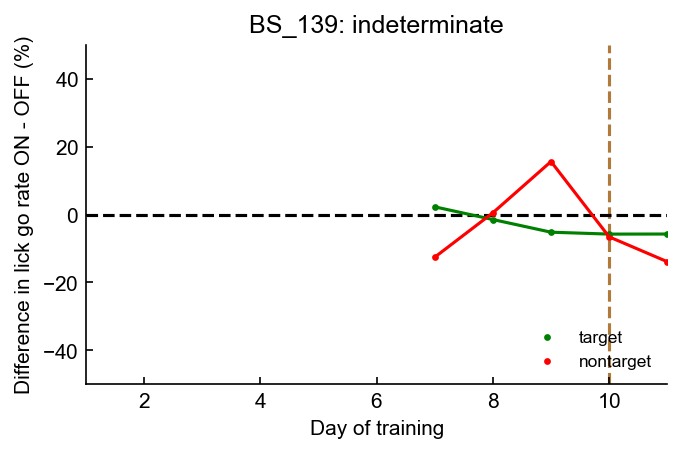

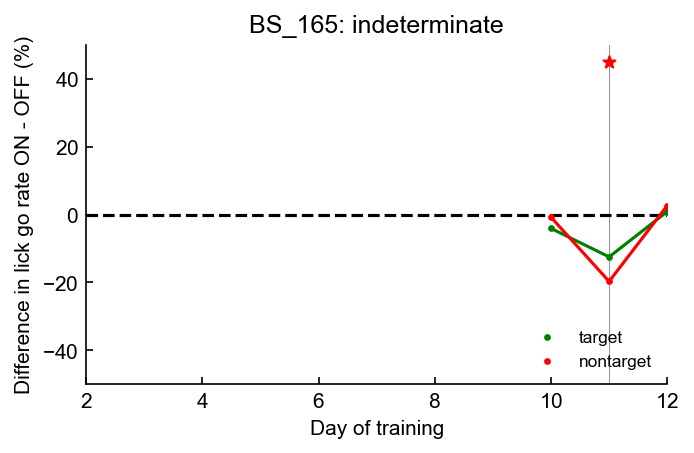

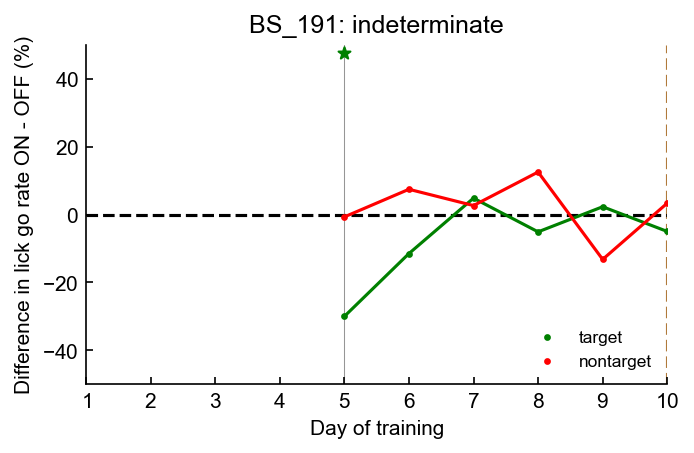

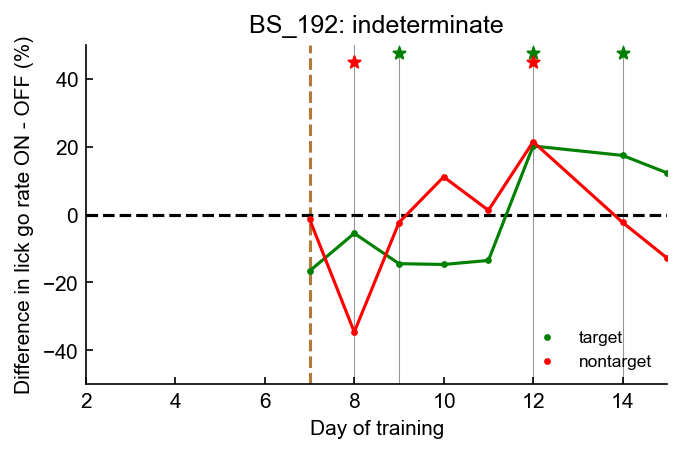

In [225]:
subset_label = 'indeterminate'
for animal in indeterminate:
    
    number_ns6 = 0
    number_beh = 0
    
    sessionnums = []
    reversal_day = animalBehaviors[animal].reversal
    t_diffs = []
    nt_diffs = []
    t_pvals = []
    nt_pvals = []
    
    sessionnumbers = [n for n in animalBehaviors[animal].sessions]
    max_session = np.max(sessionnumbers)
    
    for sessionnumber in animalBehaviors[animal].sessions:
        
        ##########################################################################################################################################################################
        #                                                    Calculate Outcomes                                                                                                  #
        ##########################################################################################################################################################################
        
        #Need to check for cloudiness
        if sessionnumber >= animalBehaviors[animal].cloudiness:
            continue
        
        #Need to get the actual data
        session_behavior = animalBehaviors[animal].sessions[sessionnumber]
        outcomes = session_behavior.outcomes
        valid_trials = np.array(range(len(outcomes)))
        sessionfile = load_recording_session(ops_directory,animal,'AC',sessionnumber)
        laser_on_trials = np.where(session_behavior.laser)[0]
        laser_off_trials = np.where(np.logical_not(session_behavior.laser))[0]
        if not sessionfile is None:
            #session_behavior = get_behavior_from_sessionfile(sessionfile)
            outcomes,_,_,laser_on_trials,laser_off_trials,valid_trials = get_outcomes_from_sessionfile(sessionfile)
            number_ns6 += 1
        else:
            number_beh += 1
        #Post-reversal
        post_rev_trials = []
        pre_rev_trials = []
        if not np.isnan(animalBehaviors[animal].reversal) and sessionnumber > animalBehaviors[animal].reversal:
            post_rev_trials = np.array(range(len(outcomes)))
        #Pre-reversal
        elif np.isnan(animalBehaviors[animal].reversal) or sessionnumber < animalBehaviors[animal].reversal:
            pre_rev_trials = np.array(range(len(outcomes)))
            
        trials_to_keep_valid = find_active_trials(outcomes)
        trials_to_keep_valid = np.where(trials_to_keep_valid)[0]
        valid_trials = valid_trials[np.isin(valid_trials,trials_to_keep_valid)]
        if len(valid_trials) < 100:
            continue
            
        outcomes = np.array(outcomes)
        pre_rev_trials = np.array(pre_rev_trials)
        post_rev_trials = np.array(post_rev_trials)
        laser_on_trials = np.array(laser_on_trials)
        laser_off_trials = np.array(laser_off_trials)
        valid_trials = np.array(valid_trials)
        
        ##########################################################################################################################################################################
        #                                                    Calculate Diffs                                                                                                     #
        ##########################################################################################################################################################################
        
        #Laser is currently in a [0,1,2,3,...] format and we need to change it to [True,True,True,...]
        laser = np.zeros_like(outcomes,dtype='bool')
        laser[laser_on_trials] = True
        
        #Valid_trials is also in a [0,1,2,3,...] format but that's fine since it's just being used to index
        
        t_diff, nt_diff, t_pval, nt_pval = calculate_bootstrapped_significance(outcomes,laser,valid_trials, repetitions = 1000)
        
        #print(t_pval)
        #print(nt_pval)
        #print()
        
        sessionnums.append(sessionnumber)
        t_diffs.append(t_diff)
        nt_diffs.append(nt_diff)
        t_pvals.append(t_pval)
        nt_pvals.append(nt_pval)
        
    sessionnums = np.array(sessionnums)
    t_diffs = np.array(t_diffs)
    nt_diffs = np.array(nt_diffs)
    t_pvals = np.array(t_pvals)
    nt_pvals = np.array(nt_pvals)
    
    ##########################################################################################################################################################################
    #                                                    Plot Data                                                                                                           #
    ##########################################################################################################################################################################
        
    TARGET_COLOR = 'green'
    NONTARGET_COLOR = 'red'
    pointsize = 5
    
    ylims = [-50,50]
        
    fig,ax = plt.subplots(figsize=(5,3))
    
    ax.plot(sessionnums,t_diffs*100,color=TARGET_COLOR)
    ax.plot(sessionnums,nt_diffs*100,color=NONTARGET_COLOR)
    ax.scatter(sessionnums,t_diffs*100,s=pointsize,fc=TARGET_COLOR,label='target')
    ax.scatter(sessionnums,nt_diffs*100,s=pointsize,fc=NONTARGET_COLOR,label='nontarget')
    ax.set_xlim([np.min(sessionnums),np.max(sessionnums)])
    ax.set_ylim(ylims)
    ax.axvline(reversal_day,linestyle='--',color=SWITCH_COLOR,zorder=-10)
    ax.axhline(0,linestyle='--',color='k',zorder=-9)
    ax.set_xlabel('Day of training')
    ax.set_ylabel('Difference in lick go rate ON - OFF (%)')
    ax.legend(frameon=False,loc='lower right')
    
    print(t_pvals)
    print(nt_pvals)
    
    for idx,session in enumerate(sessionnums):
        if t_pvals[idx] < 0.05:
            ax.scatter(session,0.95*ylims[1],marker='*',zorder=5,color=TARGET_COLOR)
        if nt_pvals[idx] < 0.05:
            ax.scatter(session,0.90*ylims[1],marker='*',zorder=5,color=NONTARGET_COLOR)
        if t_pvals[idx] < 0.05 or nt_pvals[idx] < 0.05:
            ax.axvline(session,zorder=-15,color=GOOD_GREY,lw=0.5)
            
    ax.set_title(animal+': '+subset_label)
        
    #break
    fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','ON-OFF Significances','ON-OFF Sigs '+animal+' '+subset_label+'.pdf'),transparent=False,facecolor="white")

In [13]:
sessionfile.responsiveness[10]['all_trials']

namespace(trials=array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
                         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
                         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
                         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
                         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
                         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
                         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
                         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
                        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
                        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
                        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
                     

# Shift in responsiveness -- Opsin

In [4]:
firstExpert = SimpleNamespace()
firstExpert.pre = dict()
firstExpert.post = dict()

firstExpert.pre['BS_86'] = 12
firstExpert.pre['BS_92'] = 5
firstExpert.pre['BS_100'] = 8
firstExpert.pre['BS_103'] = 5
firstExpert.pre['BS_111'] = 5
firstExpert.pre['BS_119'] = 7
firstExpert.pre['BS_123'] = 6
firstExpert.pre['BS_128'] = 4
firstExpert.pre['BS_131'] = 11
firstExpert.pre['BS_139'] = 8
firstExpert.pre['BS_163'] = 10
firstExpert.pre['BS_165'] = 10
firstExpert.pre['BS_174'] = 9
firstExpert.pre['BS_179'] = 13
firstExpert.pre['BS_191'] = 8
firstExpert.pre['BS_192'] = 6

firstExpert.post['BS_86'] = np.Inf
firstExpert.post['BS_92'] = 17
firstExpert.post['BS_100'] = np.Inf
firstExpert.post['BS_103'] = 16
firstExpert.post['BS_111'] = 16
firstExpert.post['BS_119'] = np.Inf
firstExpert.post['BS_123'] = np.Inf
firstExpert.post['BS_128'] = np.Inf
firstExpert.post['BS_131'] = np.Inf
firstExpert.post['BS_139'] = np.Inf
firstExpert.post['BS_163'] = np.Inf
firstExpert.post['BS_165'] = np.Inf
firstExpert.post['BS_174'] = 26
firstExpert.post['BS_179'] = 21
firstExpert.post['BS_191'] = np.Inf
firstExpert.post['BS_192'] = 18

In [5]:
animals_in_cache = []
for session in tqdm(os.listdir(act_directory)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    animals_in_cache.append(sessionfile.meta.animal)
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    animals_in_cache.append(sessionfile.meta.animal)
animals_in_cache = np.unique(animals_in_cache)

training_days_recorded = dict()
for animal in animals_in_cache:
    training_days_recorded[animal] = []
    
for session in tqdm(os.listdir(act_directory)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    if sessionfile.meta.region != 'AC':
        continue
    training_days_recorded[sessionfile.meta.animal].append(sessionfile.meta.day_of_training)
for session in tqdm(os.listdir(ops_directory)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    if sessionfile.meta.region != 'AC':
        continue
    training_days_recorded[sessionfile.meta.animal].append(sessionfile.meta.day_of_training)
    
print(training_days_recorded['BS_59'])

100%|██████████| 101/101 [00:00<00:00, 281.27it/s]

[]


In [6]:
#dualnames = ['BS_108','BS_113','BS_40','BS_41','BS_42','BS_49','BS_50','BS_51','BS_56','BS_59','BS_70','BS_72','BS_83','BS_85','BS_87','BS_95']
#animalnames = dualnames

#Animals missing:
#113,50,83,95
#Animals added:
#61,67,15,16,17,19,22

#animalnames = ['BS_40','BS_41','BS_42','BS_49','BS_51','BS_56','BS_59','BS_67','BS_70','BS_72','BS_87','BS_108','DS_15','DS_19']
dualanimalnames = ['BS_40','BS_41','BS_42','BS_49','BS_50','BS_51','BS_56','BS_59','BS_67','BS_70','BS_72','BS_87','BS_108','DS_15','DS_19']
opsinanimalnames = ['BS_86','BS_92','BS_100','BS_103','BS_111','BS_119','BS_123','BS_128','BS_131','BS_139','BS_163','BS_165','BS_174','BS_179','BS_191','BS_192']
tuninganimalnames = ['BS_173','BS_175','BS_187','BS_188','BS_213','BS_214']
unuseddualanimals = ['BS_78']

#animalnames = np.concatenate([dualanimalnames,opsinanimalnames,tuninganimalnames,unuseddualanimals])
animalnames = opsinanimalnames

animals = dict()
for animal in animalnames:
    animals[animal] = SimpleNamespace()
    animals[animal].name = animal
    
##Dual Recording Animals
##animals['BS_33'].reversal = 20
#animals['BS_67'].reversal = 7
##animals['BS_73'].reversal = np.nan
#animals['BS_78'].reversal = np.nan
#animals['BS_108'].reversal = 7
##animals['BS_113'].reversal = 13
#animals['BS_40'].reversal = 18
#animals['BS_41'].reversal = 6
#animals['BS_42'].reversal = 7
#animals['BS_49'].reversal = 13
#animals['BS_50'].reversal = 12
#animals['BS_51'].reversal = 8
##animals['BS_52'].reversal = 15
#animals['BS_56'].reversal = 8
#animals['BS_59'].reversal = 7
##animals['BS_61'].reversal = 9    ###
#animals['BS_70'].reversal = 8
#animals['BS_72'].reversal = 6
##animals['BS_83'].reversal = 20
##animals['BS_85'].reversal = 10
#animals['BS_87'].reversal = 6
##animals['DS_16'].reversal = 11
##animals['BS_95'].reversal = 8
#animals['DS_15'].reversal = 12
#animals['DS_19'].reversal = 12

#Opsin Animals
animals['BS_86'].reversal = 14
animals['BS_92'].reversal = 9
animals['BS_100'].reversal = 11
animals['BS_103'].reversal = 8
animals['BS_111'].reversal = 8
animals['BS_119'].reversal = 10
animals['BS_123'].reversal = 9
animals['BS_128'].reversal = 6
animals['BS_131'].reversal = 14
animals['BS_139'].reversal = 10
animals['BS_163'].reversal = 13
animals['BS_165'].reversal = np.Inf
animals['BS_174'].reversal = 14
animals['BS_179'].reversal = 16
animals['BS_191'].reversal = 10
animals['BS_192'].reversal = 7

##Tuning Animals
#animals['BS_173'].reversal = 15
#animals['BS_175'].reversal = 11
#animals['BS_187'].reversal = 8
#animals['BS_188'].reversal = 8
#animals['BS_213'].reversal = 8
#animals['BS_214'].reversal = np.Inf

print([a for a in animals])

['BS_86', 'BS_92', 'BS_100', 'BS_103', 'BS_111', 'BS_119', 'BS_123', 'BS_128', 'BS_131', 'BS_139', 'BS_163', 'BS_165', 'BS_174', 'BS_179', 'BS_191', 'BS_192']


BS_86
7
BS_92
4
BS_100
3
BS_103
4
BS_111
4
BS_119
5
BS_123
3
BS_128
3
BS_131
5
BS_139
6
BS_163
3
BS_165
BS_165 has no post-reversal
3
BS_174
2
BS_179
8
BS_191
BS_191 has no post-reversal
3
BS_192
6


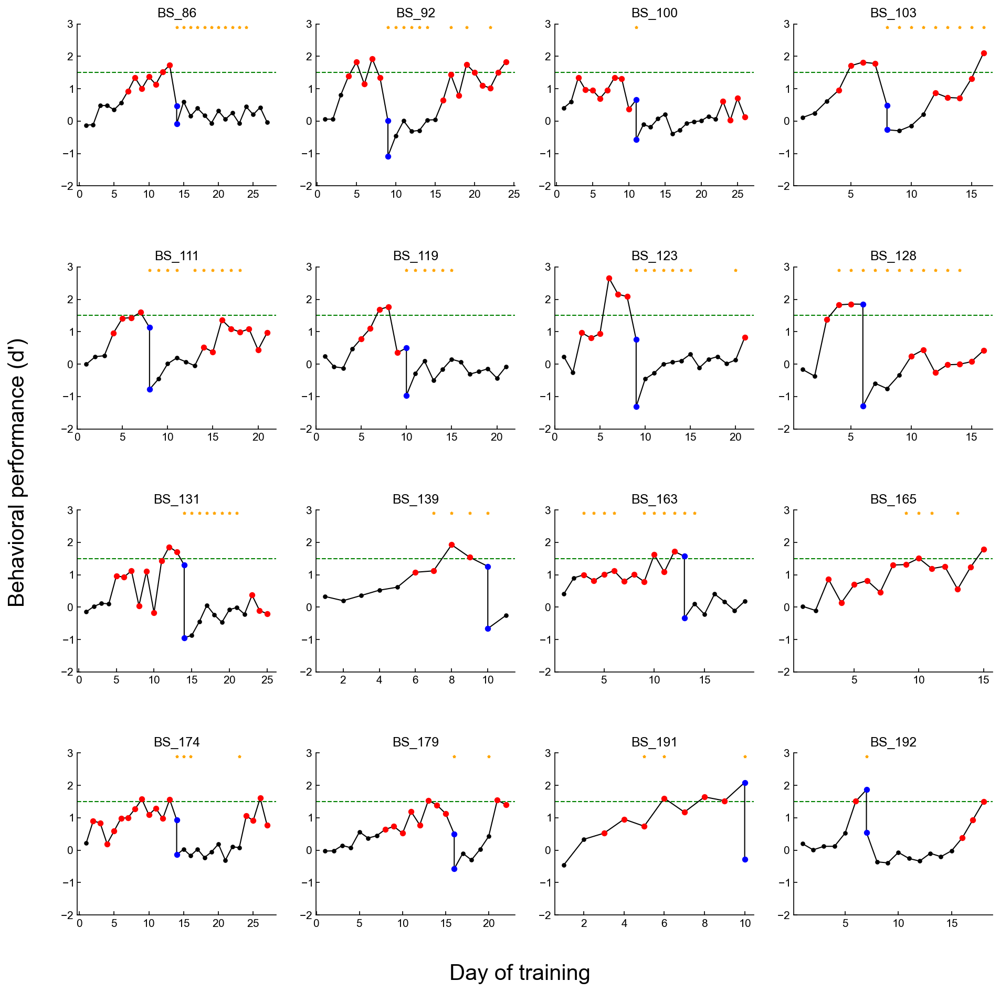

In [7]:
filename = os.path.join('C:\\\\Users','insan','Desktop','DataForJMTTotal.csv')
#filename = os.path.join('D:\\\\DataForJMTTotal.csv')
csv = pd.read_csv(filename)

postthresholds = dict()

plot=True
if plot:
    fig = plt.figure(figsize=(15,15))
    gs = fig.add_gridspec(4,4,hspace=0.5)
    axs = [plt.subplot(gs[i,j]) for i,j in product(range(4),range(4))]
    #plt.delaxes(axs[14])
    #plt.delaxes(axs[15])

premiddlecutoffs = dict()
postmiddlecutoffs = dict()
PERphases = dict()

for animalidx,animal in enumerate(animals):
    print(animal)
    PERphases[animal] = dict()
    
    condname = 'd\' ' + animal
    pc_condname = 'Percent correct ' + animal
    days = np.array(list(csv['Day']))
    cond = csv[condname]
    cond_pc = csv[pc_condname]
    
    #Correct for double reversal days
    for idx,day in enumerate(days):
        if day > animals[animal].reversal:
            days[idx] = day-1
            
        if day > animals[animal].reversal+1: #  +1 because the csv stores the switch day as two entries
            #Calculate PERphase
            PC = cond_pc[idx]
            if PC <= 47.5:
                PERphases[animal][day-1] = 'perseveration'
            elif PC >= 52.5:
                PERphases[animal][day-1] = 'refinement'
            else:
                PERphases[animal][day-1] = 'exploration'
            
    #days = days - animals[animal].reversal
    
    prereversaldays = []
    prereversaldps = []
    maxreversaldp = -np.Inf
    minreversaldp = np.Inf
    postreversaldays = []
    postreversaldps = []
    for idx,day in enumerate(days):
        if day < animals[animal].reversal or np.isnan(animals[animal].reversal):
            prereversaldays.append(day)
            prereversaldps.append(cond[idx])
        if day == animals[animal].reversal:
            maxreversaldp = max(cond[idx],maxreversaldp)
            minreversaldp = min(cond[idx],minreversaldp)
        if day > animals[animal].reversal and not np.isnan(cond[idx]):
            postreversaldays.append(day)
            postreversaldps.append(cond[idx])
            
    #Prereversal threshold
    maxperf = np.nanmax(np.concatenate((prereversaldps,[1.5])))
    minperf = np.nanmin(prereversaldps)
    prethreshold = minperf + 0.4*(maxperf-minperf)
    #Postreversal threshold
    try:
        maxperf = np.nanmax(np.concatenate((postreversaldps,[1.5])))
        minperf = np.nanmin(postreversaldps)
    except:
        print(animal+' has no post-reversal')
        maxperf = np.nan
        minperf = np.nan
    postthreshold = minperf + 0.4*(maxperf-minperf)
    
    postthresholds[animal] = postthreshold
    
    prereversaldays = np.array(prereversaldays)
    prereversaldps = np.array(prereversaldps)
    postreversaldays = np.array(postreversaldays)
    postreversaldps = np.array(postreversaldps)
    
    premiddlebool = np.greater_equal(prereversaldps,prethreshold)
    for idx,day in enumerate(prereversaldays):
        if premiddlebool[idx]:
            premiddlebool[idx:(len(premiddlebool)-1)].fill(True)
        #if not premiddlebool[idx]:
        #    premiddlebool[0:idx].fill(False)
    if np.any(premiddlebool):
        premiddlefirstday = np.min(prereversaldays[premiddlebool])
    else:
        premiddlefirstday = np.Inf
        
    print(premiddlefirstday)
                     
    postmiddlebool = np.greater_equal(postreversaldps,postthreshold)
    for idx,day in enumerate(postreversaldays):
        if postmiddlebool[idx]:
            postmiddlebool[idx:(len(postmiddlebool)-1)].fill(True)
        #if not postmiddlebool[idx]:
        #    postmiddlebool[0:idx].fill(False)
    if np.any(postmiddlebool):
        postmiddlefirstday = np.min(postreversaldays[postmiddlebool])
    else:
        postmiddlefirstday = np.Inf
    
    if animal == 'BS_95':
        premiddlefirstday = 4
    if animal == 'BS_49':
        premiddlefirstday = 7
    if animal in ['BS_83','BS_50']:
        postmiddlefirstday = np.Inf
    if animal == 'BS_86':
        postmiddlefirstday = np.Inf
    
    premiddlecutoffs[animal] = premiddlefirstday
    postmiddlecutoffs[animal] = postmiddlefirstday
    
    if plot:
        ax = axs[animalidx]    
        #All Days no color
        ax.plot(days,cond,color='k',lw=1)
        ax.scatter(days,cond,color='k',s=10,zorder=9)
        #Pre Middle
        premiddle = np.logical_and( np.greater_equal(days,premiddlefirstday), np.less(days,animals[animal].reversal) )
        ax.scatter(days[premiddle],cond[premiddle],color='r',s=20,zorder=10)
        #Post Middle
        postmiddle = np.greater_equal(days,postmiddlefirstday)
        ax.scatter(days[postmiddle],cond[postmiddle],color='r',s=20,zorder=10)
        #Switch
        switch = np.equal(days,animals[animal].reversal)
        ax.scatter(days[switch],cond[switch],color='b',s=20,zorder=10)

        xlims = ax.get_xlim()
        ax.plot(xlims,[1.5,1.5],c='g',linestyle='--',lw=1,zorder=-10)
        ax.set_xlim(xlims)
        ax.set_ylim([-2,3])
        
        days_recorded = training_days_recorded[animal]
        ax.scatter(days_recorded,np.ones_like(days_recorded)*2.9,s=5,marker='*',color='orange',zorder=11)

        ax.set_title(animal)
        
fig.text(0.075, 0.5, 'Behavioral performance (d\')', ha='center', va='center', rotation='vertical',fontsize=20)
fig.text(0.5,0.075, 'Day of training', ha='center', va='center', rotation='horizontal',fontsize=20)

if plot:
    plt.savefig(os.path.join('D:\\\\TempFigures','EIL Learning Phases Opsin Animals.pdf'),transparent=False,facecolor="white")
    pass

In [8]:
EnumSession = []
EnumClust = []
sessions = os.listdir(ops_directory)
for session in tqdm(sessions):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.animal not in did_not_learn:
        continue
    if sessionfile.meta.animal in dualanimals:
        continue
    
    
    for clust in sessionfile.clusters.good:
        EnumSession.append(session)
        EnumClust.append(clust)

100%|██████████| 101/101 [00:00<00:00, 283.64it/s]


In [9]:
EILphases = np.full_like(EnumSession,np.nan)

for idx,session in enumerate(tqdm(EnumSession)):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    
    if sessionfile.meta.animal not in opsinanimalnames:
        #pass
        continue
        
    EILphase = EILphases[idx]
    
    if sessionfile.meta.animal in did_not_learn and sessionfile.meta.day_of_training >= (animals[sessionfile.meta.animal].reversal + 4):
        EILphases[idx] = 'post early'
        continue
    if sessionfile.meta.animal in did_not_learn and sessionfile.meta.day_of_training >= (animals[sessionfile.meta.animal].reversal + 8):
        EILphases[idx] = 'post early'
        continue
    
    try:
        if sessionfile.meta.task in ['switch','opto switch','tuning switch']:
            EILphases[idx] = 'switch'

        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal'] and sessionfile.meta.day_of_training < premiddlecutoffs[sessionfile.meta.animal]:
            EILphases[idx] = 'pre early'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal'] and sessionfile.meta.day_of_training < firstExpert.pre[sessionfile.meta.animal] and sessionfile.meta.day_of_training >= premiddlecutoffs[sessionfile.meta.animal]:
            EILphases[idx] = 'pre late'
        elif sessionfile.meta.task in ['nonreversal','opto nonreversal','tuning nonreversal'] and sessionfile.meta.day_of_training >= firstExpert.pre[sessionfile.meta.animal]:
            EILphases[idx] = 'pre expert'

        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal'] and sessionfile.meta.day_of_training < postmiddlecutoffs[sessionfile.meta.animal]:
            EILphases[idx] = 'post early'
        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal'] and sessionfile.meta.day_of_training < firstExpert.post[sessionfile.meta.animal] and sessionfile.meta.day_of_training >= postmiddlecutoffs[sessionfile.meta.animal]:
            EILphases[idx] = 'post late'
        elif sessionfile.meta.task in ['reversal','opto reversal','tuning reversal'] and sessionfile.meta.day_of_training >= firstExpert.pre[sessionfile.meta.animal]:
            EILphases[idx] = 'post expert'
    except Exception as e:
        print(ilep.generateDateString(sessionfile))
        print(e)
        pass

100%|██████████| 759/759 [00:03<00:00, 248.43it/s]


In [10]:
FRmod_preearly_ON = []
FRmod_preearly_OFF = []
FRmod_prelate_ON = []
FRmod_prelate_OFF = []
FRmod_preexpert_ON = []
FRmod_preexpert_OFF = []

FRmod_postearly_ON = []
FRmod_postearly_OFF = []
FRmod_postlate_ON = []
FRmod_postlate_OFF = []
FRmod_postexpert_ON = []
FRmod_postexpert_OFF = []

animalstouse = opsinanimalnames
cellstouseFRmod = 'all cells'
#cellstouseFRmod = 'task encoders'

for idx,(session,clust) in tqdm(enumerate(zip(EnumSession,EnumClust))):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
         
    if not sessionfile.meta.region == 'AC':
        continue
    
    if cellstouseFRmod == 'task encoders':
        if not np.isfinite(accuracies[idx]) or pvals[idx] > 0.05 or accuracies[idx] < task_encoder_threshold:
            continue
         
    if not sessionfile.meta.animal in animalstouse:
        continue
    if sessionfile.meta.animal in dualanimalnames:
        continue
        
    if sessionfile.meta.animal == 'BS_67' and sessionfile.meta.day_of_training >= 15:
        continue
         
    if not hasattr(sessionfile.trials,'laser_stimulation'):
         continue
        
    if EILphases[idx] == 'pre early':
        FRmod_preearly_ON.append(sessionfile.responsiveness[clust]['laser_on'].FRmodulation)
        FRmod_preearly_OFF.append(sessionfile.responsiveness[clust]['laser_off'].FRmodulation)
    elif EILphases[idx] == 'pre late':
        FRmod_prelate_ON.append(sessionfile.responsiveness[clust]['laser_on'].FRmodulation)
        FRmod_prelate_OFF.append(sessionfile.responsiveness[clust]['laser_off'].FRmodulation)
    elif EILphases[idx] == 'pre expert':
        FRmod_preexpert_ON.append(sessionfile.responsiveness[clust]['laser_on'].FRmodulation)
        FRmod_preexpert_OFF.append(sessionfile.responsiveness[clust]['laser_off'].FRmodulation)
    elif EILphases[idx] == 'post early':
        FRmod_postearly_ON.append(sessionfile.responsiveness[clust]['laser_on'].FRmodulation)
        FRmod_postearly_OFF.append(sessionfile.responsiveness[clust]['laser_off'].FRmodulation)
    elif EILphases[idx] == 'post late':
        FRmod_postlate_ON.append(sessionfile.responsiveness[clust]['laser_on'].FRmodulation)
        FRmod_postlate_OFF.append(sessionfile.responsiveness[clust]['laser_off'].FRmodulation)
    elif EILphases[idx] == 'post expert':
        FRmod_postexpert_ON.append(sessionfile.responsiveness[clust]['laser_on'].FRmodulation)
        FRmod_postexpert_OFF.append(sessionfile.responsiveness[clust]['laser_off'].FRmodulation)
        
print(len(FRmod_preearly_ON))
print(len(FRmod_preearly_OFF))
print(len(FRmod_prelate_ON))
print(len(FRmod_prelate_OFF))
print(len(FRmod_preexpert_ON))
print(len(FRmod_preexpert_OFF))
print()
print(len(FRmod_postearly_ON))
print(len(FRmod_postearly_OFF))
print(len(FRmod_postlate_ON))
print(len(FRmod_postlate_OFF))
print(len(FRmod_postexpert_ON))
print(len(FRmod_postexpert_OFF))
        
#AC_FRmod_baseline_median = np.median(FRmod_preearly_OFF)
AC_FRmod_baseline_median = np.median(FRmod_prelate_OFF)
#AC_FRmod_baseline_median = 3.5938903863432152

print(AC_FRmod_baseline_median)

759it [00:03, 248.70it/s]

0
0
78
78
86
86

482
482
0
0
0
0
5.222222222222222


Early
learning: 0.007275891292431167
Late
learning
: 0.039271530715112135
Expert: 0.0044329141335512565


meta NOT subset; don't know how to subset; dropped


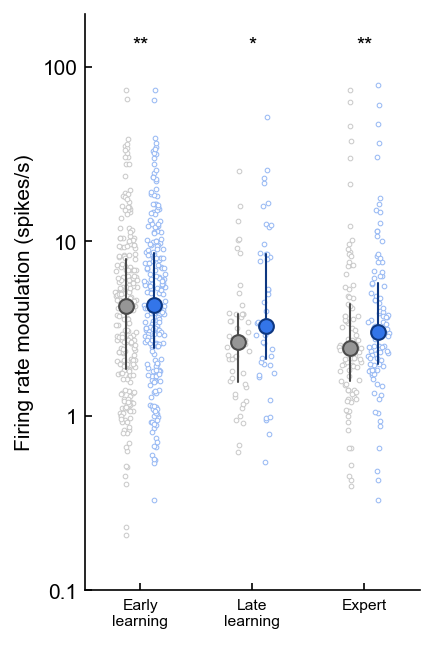

In [59]:
size=5

FRmod_baseline_median = AC_FRmod_baseline_median

fig, ax = plt.subplots(figsize=(3,4.5))
data_ON = [FRmod_postearly_ON,FRmod_postlate_ON,FRmod_postexpert_ON]
data_OFF = [FRmod_postearly_OFF,FRmod_postlate_OFF,FRmod_postexpert_OFF]
labels = ['Early\nlearning','Late\nlearning\n','Expert']
numCon = len(data_ON)

X_ON = [np.ones(len(l))*idx for idx,l in enumerate(data_ON)]
_,Y_ON = ilep.violin(np.concatenate(X_ON),np.concatenate(data_ON))
X_ON,_ = ilep.violin(np.concatenate(X_ON),np.log10(np.concatenate(data_ON)),width=0.25)
X_ON = X_ON + 0.125

X_OFF = [np.ones(len(l))*idx for idx,l in enumerate(data_OFF)]
_,Y_OFF = ilep.violin(np.concatenate(X_OFF),np.concatenate(data_OFF))
X_OFF,_ = ilep.violin(np.concatenate(X_OFF),np.log10(np.concatenate(data_OFF)),width=0.25)
X_OFF = X_OFF - 0.125

colors = GOOD_GREY#NCR_CR_cmap((Y_OFF-1)/5)

ax.scatter(X_OFF, Y_OFF, s=size, ec=colors, fc='white', lw=0.5,zorder=-10)
ax.scatter(X_ON, Y_ON, s=size, ec=LASER_COLOR, fc='white', lw=0.5,zorder=-10)

#Plot summary
for idx,column in enumerate(data_ON):
    if len(column) == 0:
        continue
        
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color=LASER_COLOR
    
    r,g,b = mpl.colors.to_rgb(eye_color)
    h,l,s = colorsys.rgb_to_hls(r,g,b)
    border_color=colorsys.hls_to_rgb(h,l*0.5,s)

    summary_size=50
    summary_width=1
    
    Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    
    ax.scatter([idx+0.125], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx+0.125, idx+0.125], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
#Plot summary
for idx,column in enumerate(data_OFF):
    if len(column) == 0:
        continue
    
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color=GOOD_GREY#NCR_CR_cmap((percentCR-40)/20)
    
    r,g,b = mpl.colors.to_rgb(eye_color)
    h,l,s = colorsys.rgb_to_hls(r,g,b)
    border_color=colorsys.hls_to_rgb(h,l*0.5,s)

    summary_size=50
    summary_width=1
    
    Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    
    ax.scatter([idx-0.125], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx-0.125, idx-0.125], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


ax.set_yscale('log',subs=[])
#ax.set_ylim([0,10])
ax.set_ylim([0.1,200])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.5,2.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels,fontsize=7.5)
ax.set_xlim(ax.get_xlim())

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]]*2,color='white',alpha=0.5,zorder=-5)
ax.axhline(FRmod_baseline_median,color='k',linestyle='--',lw=1,zorder=-4)
#ax.axvline(2.5,color=SWITCH_COLOR,linestyle='--',zorder=10,lw=1)

#ax.axhline(3.5938903863432152,color='k',alpha=0.25,linestyle='--',lw=1,zorder=-4)
for idx,column in enumerate(data_ON):
    pass#ax.text(idx,200,str(len(column)),verticalalignment='bottom',horizontalalignment='center')
    
for idx,(ON,OFF) in enumerate(zip(data_ON,data_OFF)):
    try:
        pval = wilcoxon(ON,OFF).pvalue * 3
        print(labels[idx]+': '+str(pval))
    except:
        print(labels[idx]+': error')
        
ax.text(0,150,str('**'),verticalalignment='top',horizontalalignment='center')
ax.text(1,150,str('*'),verticalalignment='top',horizontalalignment='center')
ax.text(2,150,str('**'),verticalalignment='top',horizontalalignment='center')
        
plt.tight_layout()
plt.savefig(os.path.join('D:\\\\Figures','Opsin Figures','AC FR modulations with shift summary '+cellstouseFRmod+' -- Did learn no dual.pdf'),transparent=False,facecolor="white")

Laser OFF: 1.2931628749733187e-20


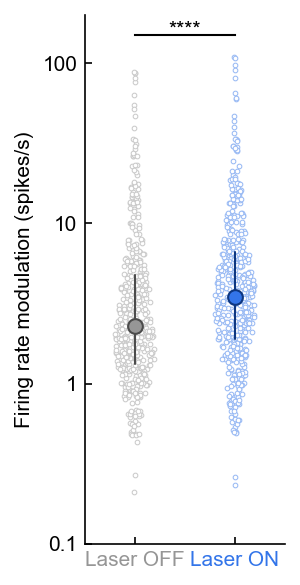

In [15]:
size=5

FRmod_baseline_median = AC_FRmod_baseline_median

fig, ax = plt.subplots(figsize=(2.1,4))
data_ON = [FRmod_postearly_ON]
data_OFF = [FRmod_postearly_OFF]
labels = ['Laser OFF','Laser ON']
numCon = len(data_ON)+len(data_OFF)

X_ON = np.array([np.ones(len(l))*idx for idx,l in enumerate(data_ON)])+1
_,Y_ON = ilep.violin(np.concatenate(X_ON),np.concatenate(data_ON))
X_ON,_ = ilep.violin(np.concatenate(X_ON),np.log10(np.concatenate(data_ON)),width=0.5)
X_ON = X_ON

X_OFF = np.array([np.ones(len(l))*idx for idx,l in enumerate(data_OFF)])
_,Y_OFF = ilep.violin(np.concatenate(X_OFF),np.concatenate(data_OFF))
X_OFF,_ = ilep.violin(np.concatenate(X_OFF),np.log10(np.concatenate(data_OFF)),width=0.5)
X_OFF = X_OFF

colors = GOOD_GREY#NCR_CR_cmap((Y_OFF-1)/5)

ax.scatter(X_OFF, Y_OFF, s=size, ec=colors, fc='white', lw=0.5,zorder=-10)
ax.scatter(X_ON, Y_ON, s=size, ec=LASER_COLOR, fc='white', lw=0.5,zorder=-10)

#Plot summary
for idx,column in enumerate(data_ON):
    if len(column) == 0:
        continue
        
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color=LASER_COLOR
    
    r,g,b = mpl.colors.to_rgb(eye_color)
    h,l,s = colorsys.rgb_to_hls(r,g,b)
    border_color=colorsys.hls_to_rgb(h,l*0.5,s)

    summary_size=50
    summary_width=1
    
    Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    
    ax.scatter([idx+1], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx+1, idx+1], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
#Plot summary
for idx,column in enumerate(data_OFF):
    if len(column) == 0:
        continue
    
    percentCR = np.nanmean(np.greater(column,FRmod_baseline_median))*100
    
    eye_color=GOOD_GREY#NCR_CR_cmap((percentCR-40)/20)
    
    r,g,b = mpl.colors.to_rgb(eye_color)
    h,l,s = colorsys.rgb_to_hls(r,g,b)
    border_color=colorsys.hls_to_rgb(h,l*0.5,s)

    summary_size=50
    summary_width=1
    
    Q1, median, Q3 = (np.percentile(column, q) for q in [25, 50, 75])
    
    ax.scatter([idx], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx, idx], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')


ax.set_yscale('log',subs=[])
#ax.set_ylim([0,10])
ax.set_ylim([0.1,200])
ax.set_yticks([0.1,1,10,100])
ax.set_yticklabels(['0.1','1','10','100'])
ax.set_ylabel('Firing rate modulation (spikes/s)')

ax.set_xlim([-0.5,1.5])
ax.set_xticks(range(numCon))
ax.set_xticklabels(labels)
ax.set_xlim(ax.get_xlim())

ax.fill_between(ax.get_xlim(),[ax.get_ylim()[0]]*2,[ax.get_ylim()[1]]*2,color='white',alpha=0.5,zorder=-5)
#ax.axhline(FRmod_baseline_median,color='k',linestyle='--',lw=1,zorder=-4)
#ax.axvline(2.5,color=SWITCH_COLOR,linestyle='--',zorder=10,lw=1)

#ax.axhline(3.5938903863432152,color='k',alpha=0.25,linestyle='--',lw=1,zorder=-4)
for idx,column in enumerate(data_ON):
    pass#ax.text(idx,200,str(len(column)),verticalalignment='bottom',horizontalalignment='center')
    
for idx,(ON,OFF) in enumerate(zip(data_ON,data_OFF)):
    try:
        pval = wilcoxon(ON,OFF).pvalue
        print(labels[idx]+': '+str(pval))
    except:
        print(labels[idx]+': error')

ax.text(0.5,160,str('****'),verticalalignment='center',horizontalalignment='center')
ax.plot([0,1],[150]*2,lw=1,color='k')
#ax.text(1,150,str('*'),verticalalignment='top',horizontalalignment='center')


#ax.set_xticklabels(['Control','Opsin'])
colors=[GOOD_GREY,LASER_COLOR]
[t.set_color(colors[idx]) for idx,t in enumerate(ax.xaxis.get_ticklabels())]
    
plt.tight_layout()
plt.savefig(os.path.join('D:\\\\Figures','Opsin Figures','AC FR modulations with shift summary '+cellstouseFRmod+' -- Did not learn no dual.pdf'),transparent=False,facecolor="white")

In [ ]:
# p values for did learn animals
p = 0.002425 # with dual
p = 0.000272 # without dual
p = 0.572266 # only dual

# p values for did not learn animals
p = 1.20e-14
p = 1.77e-18 # without dual
p = 0.825820 # dual only

In [303]:
def find_active_trials(outcomes,window_length = 75, active_thresholds = [0.2,0.8], verification_threshold = 0.8):
    hits = np.equal(outcomes,1)
    misses = np.equal(outcomes,2)
    falarms = np.equal(outcomes,3)
    crejects = np.equal(outcomes,4)
    
    gos = np.logical_or(hits,falarms)
    
    participation = np.array([np.mean(gos[i:(i+window_length)]) for i in range(len(gos)-window_length)])
    
    #Calculate where active conditions are fulfilled
    activehighthresh = np.less(participation,active_thresholds[1])
    activelowthresh = np.greater(participation,active_thresholds[0])
    active = np.logical_and(activehighthresh,activelowthresh)
    #Get trial numbers
    activetrials = np.where(active)[0]
    if len(activetrials) >= 2:
        activestart = np.min(activetrials)
        activeend = np.max(activetrials)
    else:
        activestart = np.nan
        activeend = np.nan
    
    ############################################ If there's no active period then skip everything
    if not np.isfinite(activestart) or not np.isfinite(activeend):
        valid_trials = np.zeros_like(outcomes,dtype='bool')
        return valid_trials
    
    ############################################ Verify that an appropriate amount of this span is active
    activespan = np.array(range(len(active)))
    tempspan = np.greater_equal(activespan,activestart)
    tempspan2 = np.less_equal(activespan,activeend)
    activespan = np.logical_and(tempspan,tempspan2)
    verification_frac = np.sum(active) / np.sum(activespan)
    #Check against verification_threshold and abort if insufficient
    if np.isfinite(verification_frac) and verification_frac < verification_threshold:
        valid_trials = np.zeros_like(outcomes,dtype='bool')
        return valid_trials
    
    ############################################ Now return a proper valid_trials object
    activeend += window_length
    valid_trials = np.zeros_like(outcomes,dtype='bool')
    valid_trials[activestart:activeend] = True
    return valid_trials

In [4]:
def getSessionByTraining(directory,animal,region,day_of_training):
    for session in os.listdir(directory):
        sessionfile = ilep.loadSessionCached(directory,session)
        
        if sessionfile.meta.animal == animal and sessionfile.meta.region == region and sessionfile.meta.day_of_training == day_of_training:
            return sessionfile
        
    return None

In [5]:
def getOutcomesFromSession(sessionfile):
    outcomes = np.full_like(sessionfile.trials.starts,np.nan)
    hits = np.logical_and(sessionfile.trials.go,sessionfile.trials.target)
    misses = np.logical_and(np.logical_not(sessionfile.trials.go),sessionfile.trials.target)
    falarms = np.logical_and(sessionfile.trials.go,np.logical_not(sessionfile.trials.target))
    crejects = np.logical_and(np.logical_not(sessionfile.trials.go),np.logical_not(sessionfile.trials.target))
    outcomes[hits] = 1*np.ones(np.sum(hits))
    outcomes[misses] = 2*np.ones(np.sum(misses))
    outcomes[falarms] = 3*np.ones(np.sum(falarms))
    outcomes[crejects] = 4*np.ones(np.sum(crejects))
    return outcomes

In [8]:
animalBehaviors = ilep.getAllBehavior(beh_directory)

Fetching files for BS_51
Fetching files for BS_52
Fetching files for BS_56
Fetching files for BS_59
Fetching files for BS_61
Fetching files for BS_86
Fetching files for BS_92
Fetching files for BS_100
Fetching files for BS_103
Fetching files for BS_111
Fetching files for BS_119
Fetching files for BS_123
Fetching files for BS_128
Fetching files for BS_131
Fetching files for BS_139
Fetching files for BS_163
Fetching files for BS_165
Fetching files for BS_174
Fetching files for BS_179
Fetching files for BS_191
Fetching files for BS_192
Fetching files for BS_33
Fetching files for BS_67
Fetching files for BS_73
Fetching files for BS_78
Fetching files for BS_108
Fetching files for BS_40
Fetching files for BS_41
Fetching files for BS_42
Fetching files for BS_49
Fetching files for BS_50
Fetching files for BS_70
Fetching files for BS_72
Fetching files for BS_83
Fetching files for BS_85
Fetching files for BS_87
Fetching files for BS_95
Fetching files for BS_113
Fetching files for DS_15
Fetching 

In [65]:
def getAnimalBehaviorResults(animal,directory):
    hit_pct_ON = []
    miss_pct_ON = []
    falarm_pct_ON = []
    creject_pct_ON = []
    hit_pct_OFF = []
    miss_pct_OFF = []
    falarm_pct_OFF = []
    creject_pct_OFF = []
    sessionnum_list = np.sort([k for k in animalBehaviors[animal].sessions])

    for sessionnum in sessionnum_list:

        try:
            sessionfile = getSessionByTraining(directory,animal,'AC',sessionnum)

            outcomes_OFF = []
            outcomes_ON = []
            hasON = False
            if sessionfile is None:
                outcomes = animalBehaviors[animal].sessions[sessionnum].outcomes
                if hasattr(animalBehaviors[animal].sessions[sessionnum],'laser'):
                    laser = animalBehaviors[animal].sessions[sessionnum].laser
                else:
                    laser = np.zeros_like(outcomes,dtype='bool')
                
                ##############################################################################################
                valid_trials = find_active_trials(outcomes,window_length=75,verification_threshold=0.6)
                laser_ON = np.logical_and(laser,valid_trials)
                laser_OFF = np.logical_and(np.logical_not(laser),valid_trials)
                ##############################################################################################
                outcomes_ON = outcomes[laser_ON]
                outcomes_OFF = outcomes[laser_OFF]
            else:
                outcomes = getOutcomesFromSession(sessionfile)
                if hasattr(sessionfile.trials,'laser_stimulation'):
                    laser = sessionfile.trials.laser_stimulation
                else:
                    laser = np.zeros_like(outcomes,dtype='bool')
                    
                
                ##############################################################################################
                valid_trials = find_active_trials(outcomes,window_length=75,verification_threshold=0.6)
                laser_ON = np.logical_and(laser,valid_trials)
                laser_OFF = np.logical_and(np.logical_not(laser),valid_trials)
                ##############################################################################################
                outcomes_ON = outcomes[laser_ON]
                outcomes_OFF = outcomes[laser_OFF]

            #print()
            #print(len(outcomes_ON))
            #print(len(outcomes_OFF))
            #print(np.sum(np.equal(outcomes_OFF,1)))
            #print(np.sum(np.equal(outcomes_OFF,2)))
            #print(np.sum(np.equal(outcomes_OFF,3)))
            #print(np.sum(np.equal(outcomes_OFF,4)))

            hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
            miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
            falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
            creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
            hit_pct_OFF.append(np.sum(np.equal(outcomes_OFF,1))/len(outcomes_OFF))
            miss_pct_OFF.append(np.sum(np.equal(outcomes_OFF,2))/len(outcomes_OFF))
            falarm_pct_OFF.append(np.sum(np.equal(outcomes_OFF,3))/len(outcomes_OFF))
            creject_pct_OFF.append(np.sum(np.equal(outcomes_OFF,4))/len(outcomes_OFF))
        except Exception:
            pass

    corr_pct_ON = [h + c for (h,c) in zip(hit_pct_ON,creject_pct_ON)]
    corr_pct_OFF = [h + c for (h,c) in zip(hit_pct_OFF,creject_pct_OFF)]

    results = SimpleNamespace()
    results.sessionnum_list = np.array(sessionnum_list)
    results.corr_pct_ON = np.array(corr_pct_ON)
    results.hit_pct_ON = np.array(hit_pct_ON)
    results.miss_pct_ON = np.array(miss_pct_ON)
    results.falarm_pct_ON = np.array(falarm_pct_ON)
    results.creject_pct_ON = np.array(creject_pct_ON)
    results.corr_pct_OFF = np.array(corr_pct_OFF)
    results.hit_pct_OFF = np.array(hit_pct_OFF)
    results.miss_pct_OFF = np.array(miss_pct_OFF)
    results.falarm_pct_OFF = np.array(falarm_pct_OFF)
    results.creject_pct_OFF = np.array(creject_pct_OFF)
    return results

BS_86


C:\Users\4thgr\AppData\Local\Temp\ipykernel_35432\2129885240.py:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
C:\Users\4thgr\AppData\Local\Temp\ipykernel_35432\2129885240.py:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
C:\Users\4thgr\AppData\Local\Temp\ipykernel_35432\2129885240.py:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
C:\Users\4thgr\AppData\Local\Temp\ipykernel_35432\2129885240.py:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))


BS_100
BS_119
BS_123
BS_128
BS_131
BS_163
BS_174


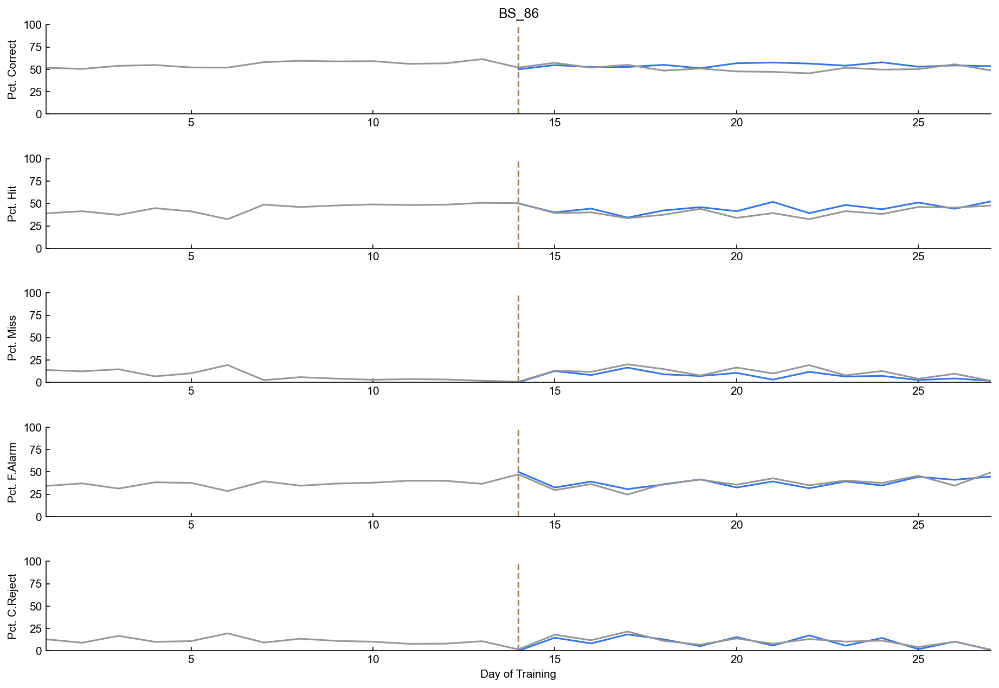

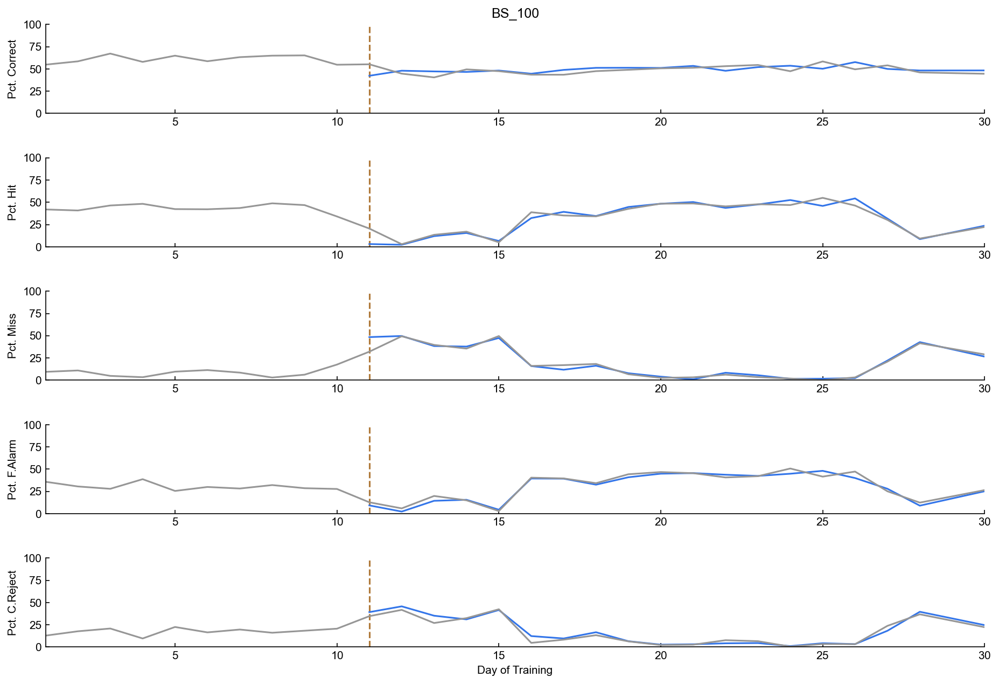

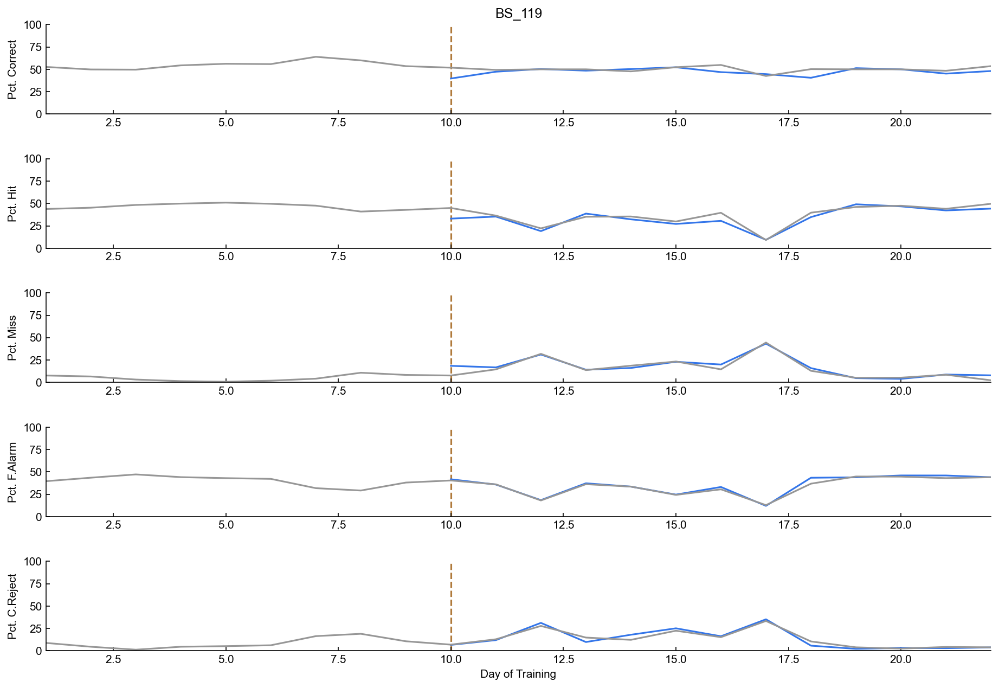

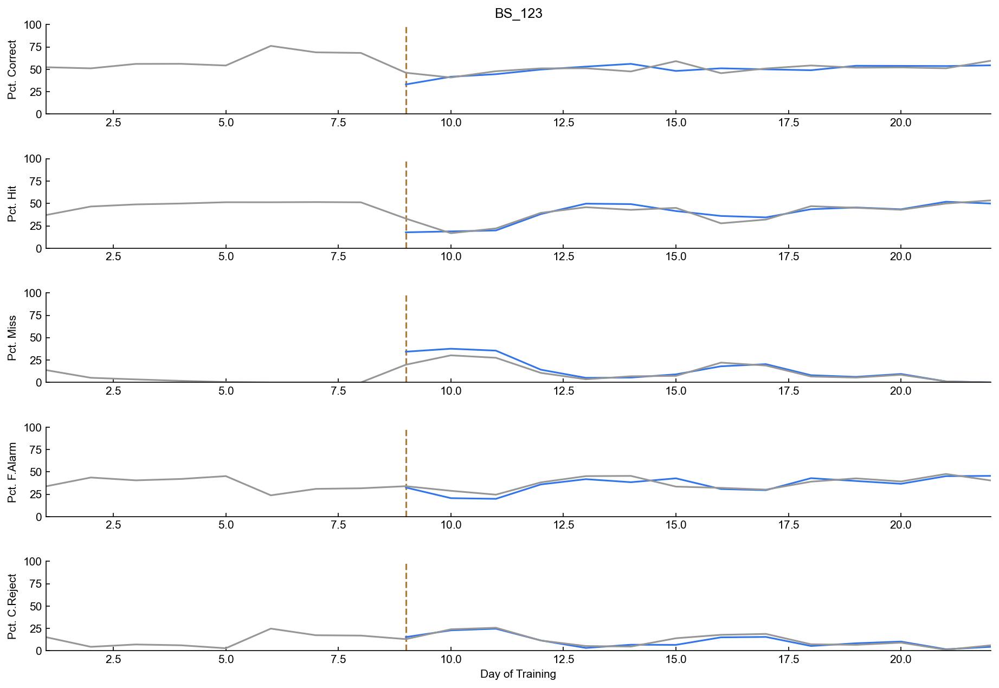

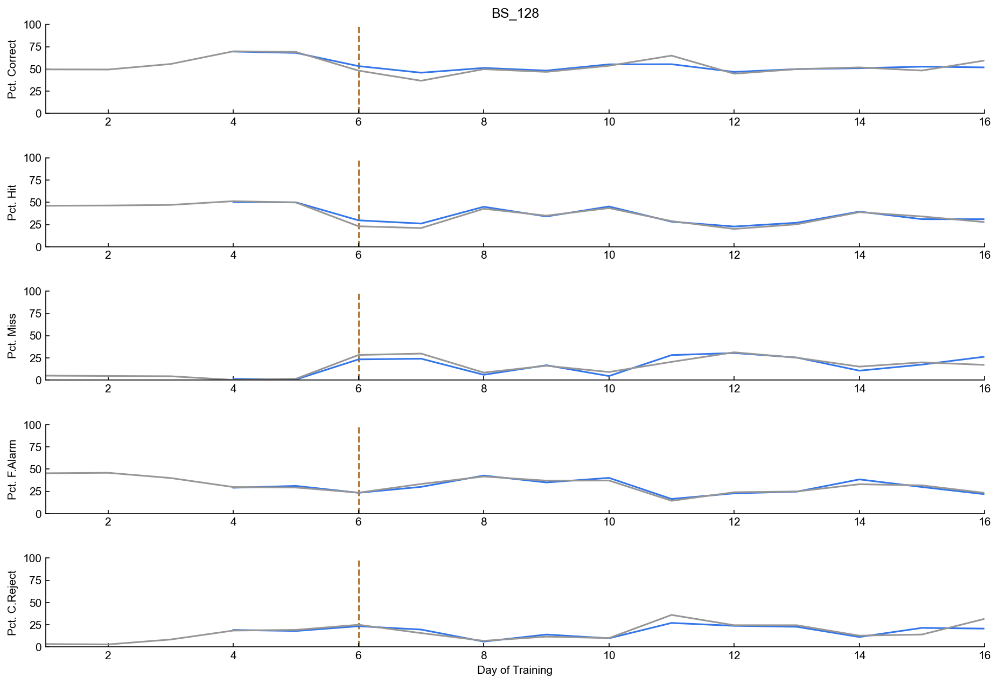

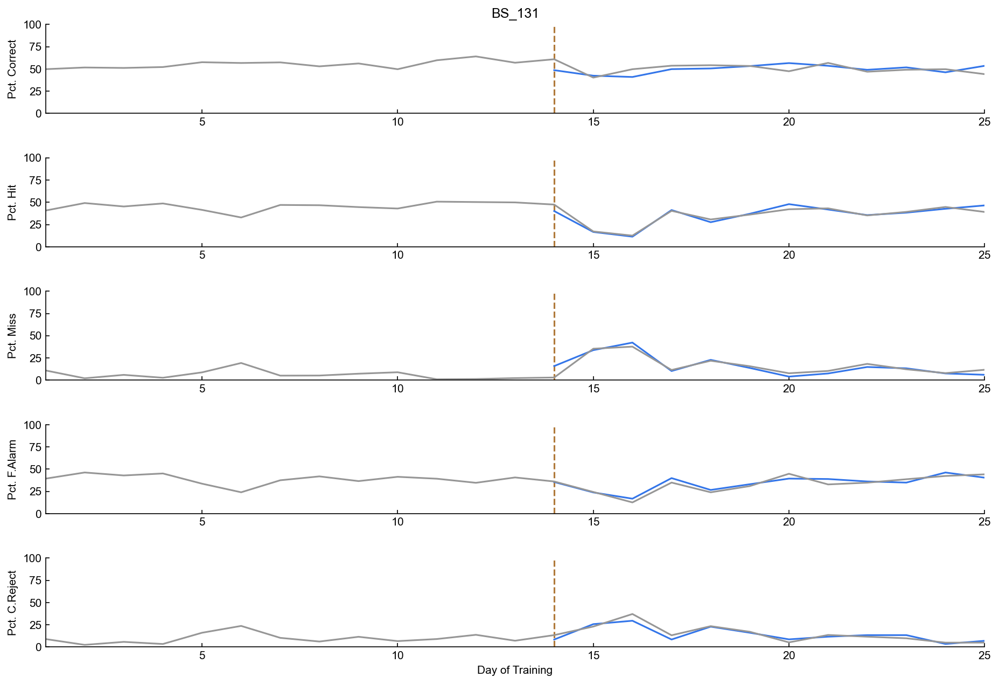

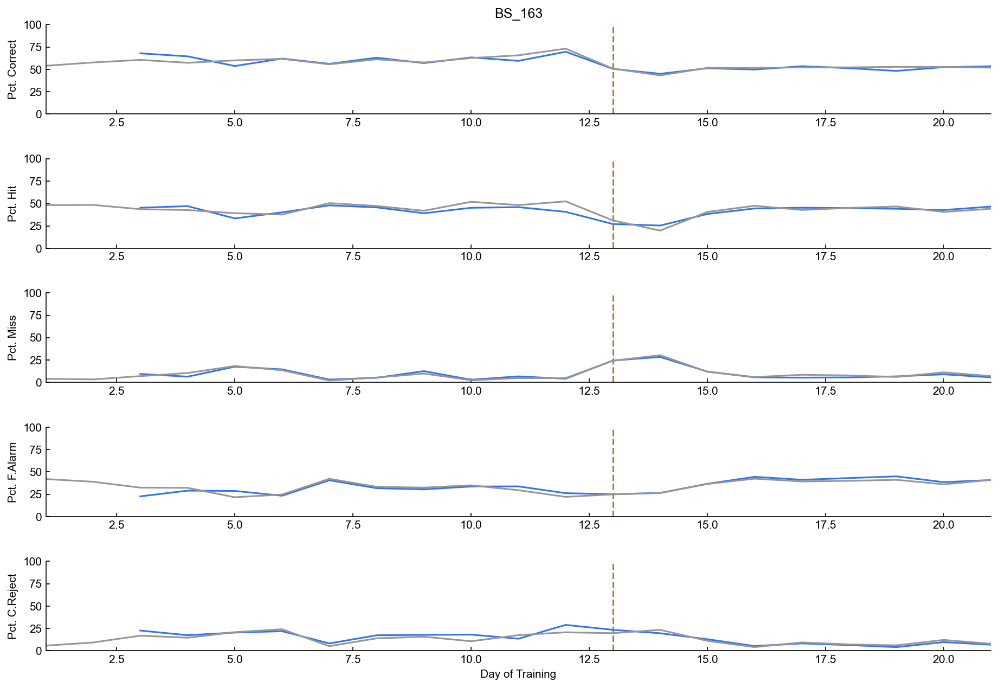

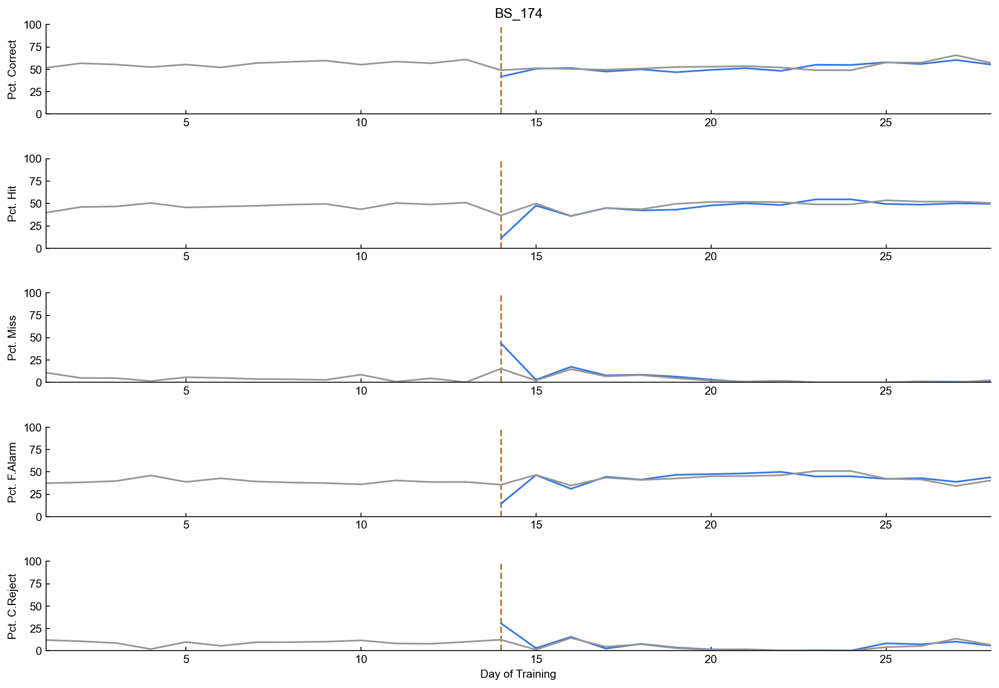

In [93]:
opsin_pct_corr = []
opsin_pct_hit = []
opsin_pct_miss = []
opsin_pct_falarm = []
opsin_pct_creject = []

for animal in did_not_learn:
    print(animal)
    results = getAnimalBehaviorResults(animal,ops_directory)
    #res = results.__dict__
    #[print(len(res[r])) for r in res]
    
    postreversal_days = np.greater(results.sessionnum_list,animalBehaviors[animal].reversal)
    opsin_pct_hit.append(results.hit_pct_OFF[postreversal_days])
    opsin_pct_miss.append(results.miss_pct_OFF[postreversal_days])
    opsin_pct_falarm.append(results.falarm_pct_OFF[postreversal_days])
    opsin_pct_creject.append(results.creject_pct_OFF[postreversal_days])
    opsin_pct_corr.append(results.corr_pct_OFF[postreversal_days])
    
    fig = plt.figure(figsize=(15,10))
    gs = fig.add_gridspec(5,1,hspace=0.5)
    ax_corr = plt.subplot(gs[0])
    ax_hit = plt.subplot(gs[1],sharex=ax_corr,sharey=ax_corr)
    ax_miss = plt.subplot(gs[2],sharex=ax_corr,sharey=ax_corr)
    ax_falarm = plt.subplot(gs[3],sharex=ax_corr,sharey=ax_corr)
    ax_creject = plt.subplot(gs[4],sharex=ax_corr,sharey=ax_corr)

    ax_corr.plot(results.sessionnum_list,results.corr_pct_ON,color=LASER_COLOR)
    ax_hit.plot(results.sessionnum_list,results.hit_pct_ON,color=LASER_COLOR)
    ax_miss.plot(results.sessionnum_list,results.miss_pct_ON,color=LASER_COLOR)
    ax_falarm.plot(results.sessionnum_list,results.falarm_pct_ON,color=LASER_COLOR)
    ax_creject.plot(results.sessionnum_list,results.creject_pct_ON,color=LASER_COLOR)
    ax_corr.plot(results.sessionnum_list,results.corr_pct_OFF,color=GOOD_GREY)
    ax_hit.plot(results.sessionnum_list,results.hit_pct_OFF,color=GOOD_GREY)
    ax_miss.plot(results.sessionnum_list,results.miss_pct_OFF,color=GOOD_GREY)
    ax_falarm.plot(results.sessionnum_list,results.falarm_pct_OFF,color=GOOD_GREY)
    ax_creject.plot(results.sessionnum_list,results.creject_pct_OFF,color=GOOD_GREY)

    ax_corr.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_hit.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_miss.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_falarm.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_creject.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)

    ax_corr.set_ylim([0,1])
    ax_corr.set_yticks([0,0.25,0.5,0.75,1])
    [ax.axhline(t,zorder=-20,alpha=0.25,color='k') for t in [0.25,0.5,0.75,1]]
    ax_corr.set_yticklabels([int(pct*100) for pct in np.array([0,0.25,0.5,0.75,1])])
    ax_corr.set_xlim(np.min(results.sessionnum_list),np.max(results.sessionnum_list))

    ax_corr.set_ylabel('Pct. Correct')
    ax_hit.set_ylabel('Pct. Hit')
    ax_miss.set_ylabel('Pct. Miss')
    ax_falarm.set_ylabel('Pct. F.Alarm')
    ax_creject.set_ylabel('Pct. C.Reject')
    
    ax_corr.set_title(animal)
    ax_creject.set_xlabel('Day of Training')
    
    #plt.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Behavior',animal+' behavior.pdf'),transparent=False,facecolor="white")
    #plt.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Behavior',animal+' behavior.png'),transparent=False,facecolor="white")

BS_40


C:\Users\4thgr\AppData\Local\Temp\ipykernel_35432\2129885240.py:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
C:\Users\4thgr\AppData\Local\Temp\ipykernel_35432\2129885240.py:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
C:\Users\4thgr\AppData\Local\Temp\ipykernel_35432\2129885240.py:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
C:\Users\4thgr\AppData\Local\Temp\ipykernel_35432\2129885240.py:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
C:\Users\4thgr\AppData\Local\Temp\ipykernel_35432\2129885240.py:45: RuntimeWarning: invalid value encountered in long_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_O

BS_41
BS_42
BS_49
BS_50
BS_51
BS_56
BS_59
BS_61
BS_67
BS_70
BS_72
BS_87
BS_108
DS_15


AttributeError: 'types.SimpleNamespace' object has no attribute 'reversal'

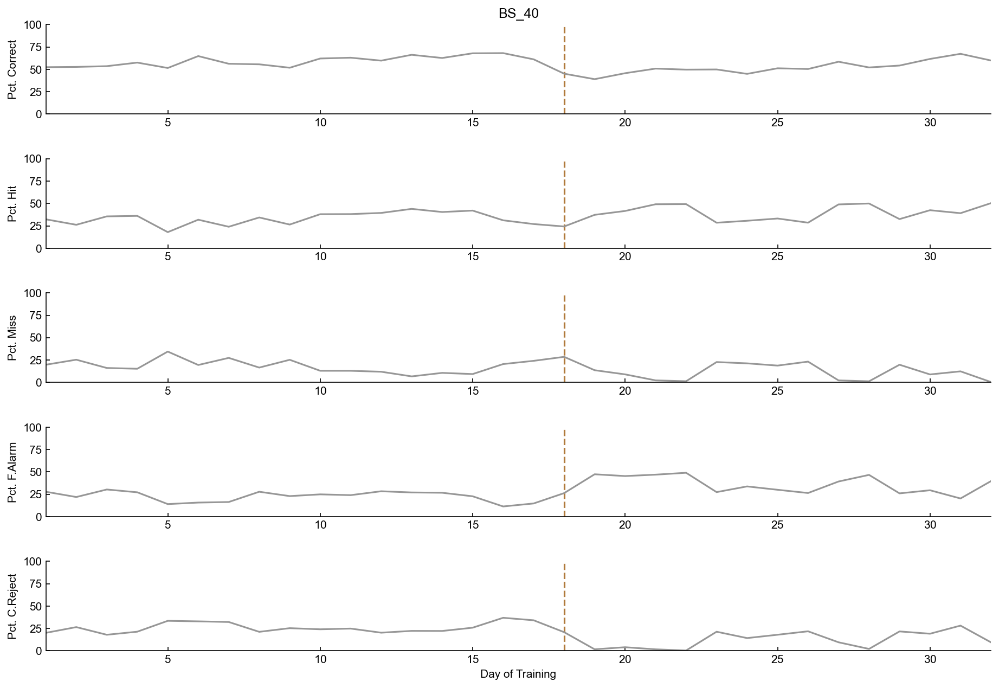

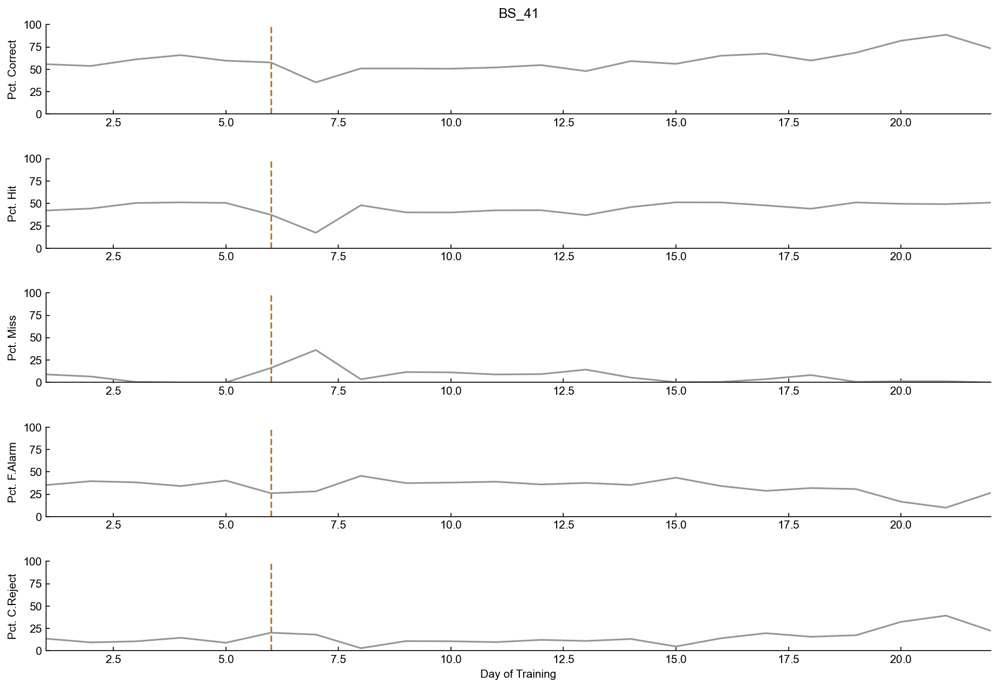

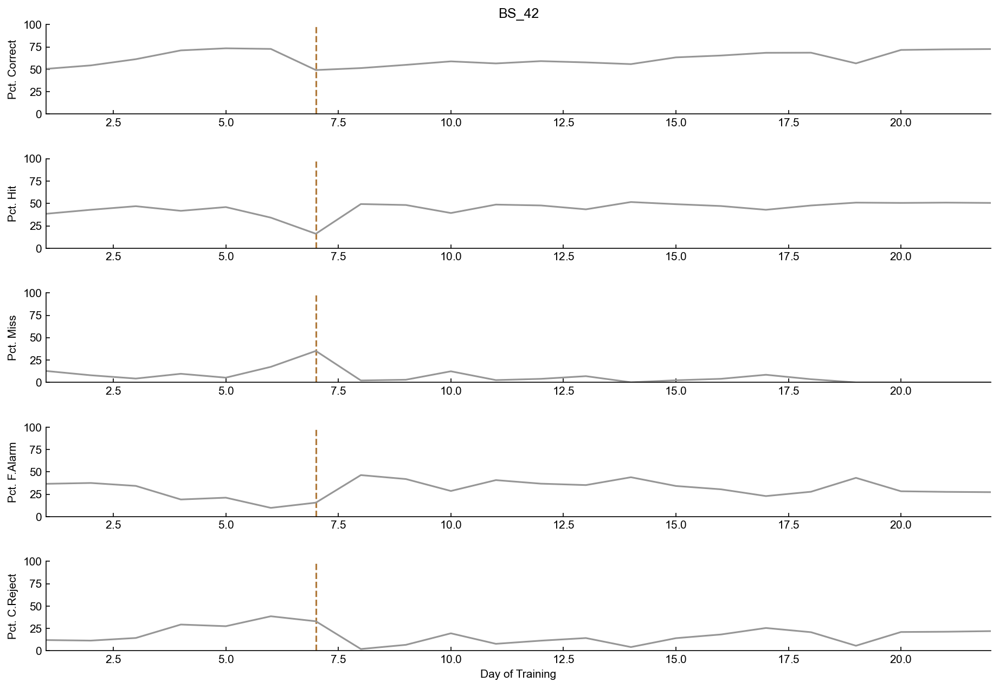

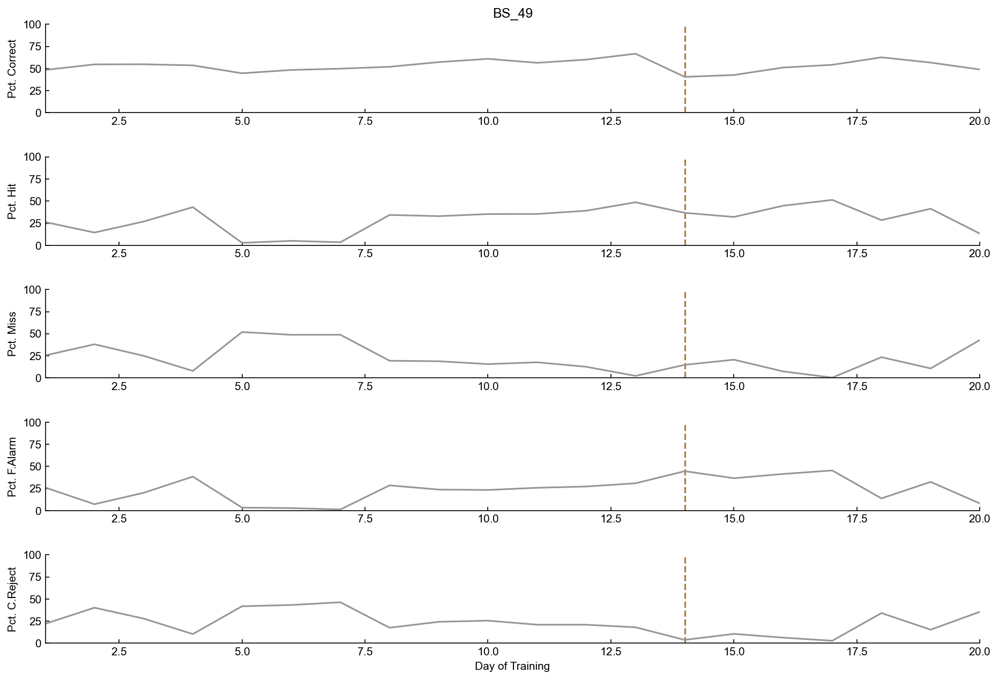

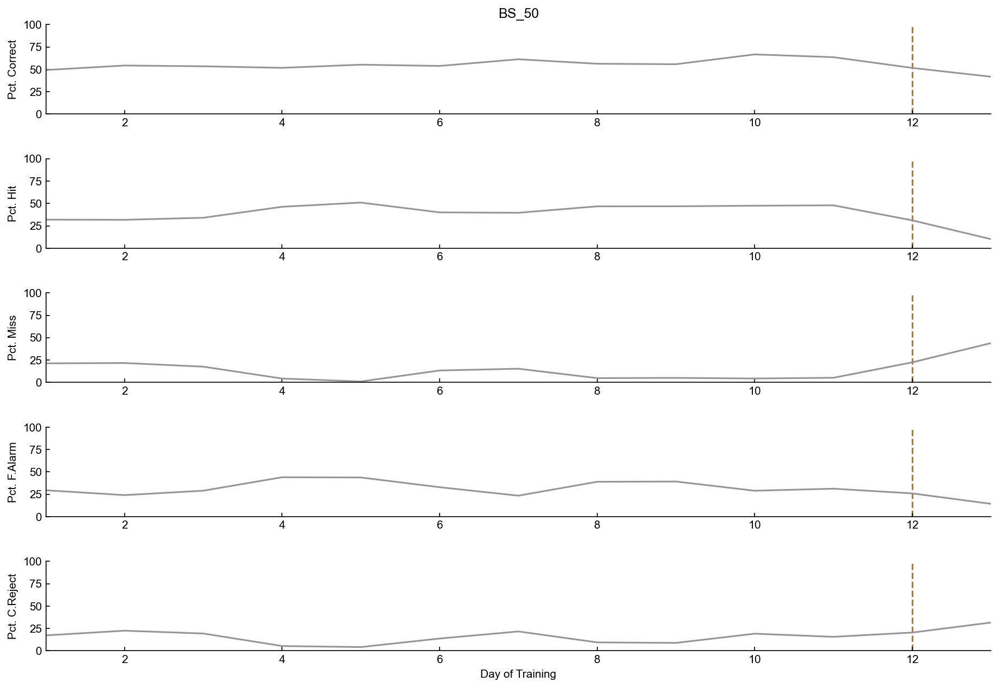

...

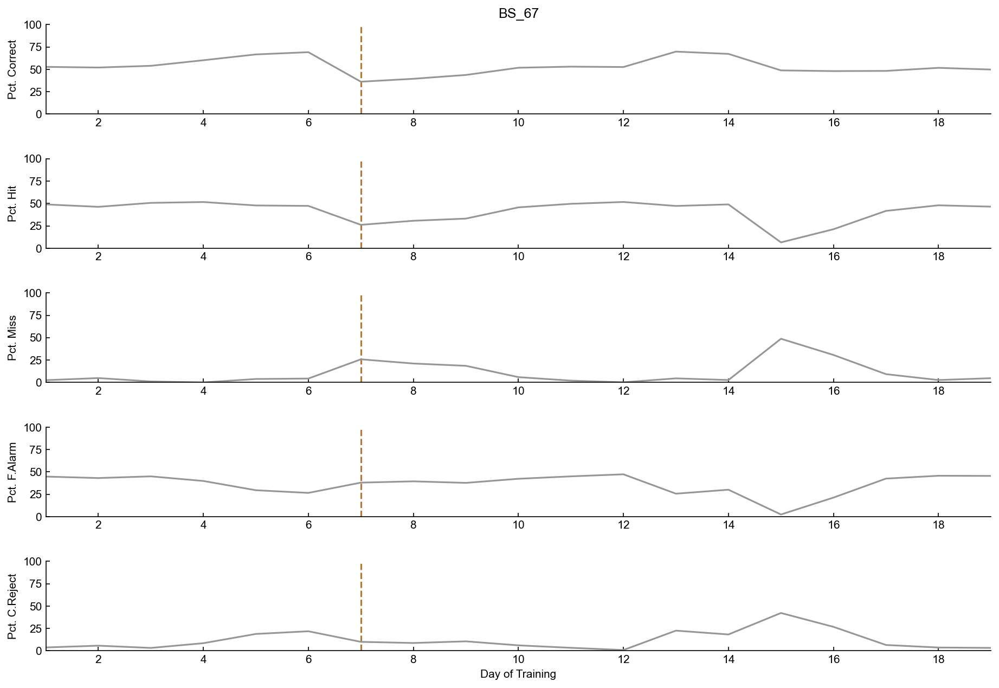

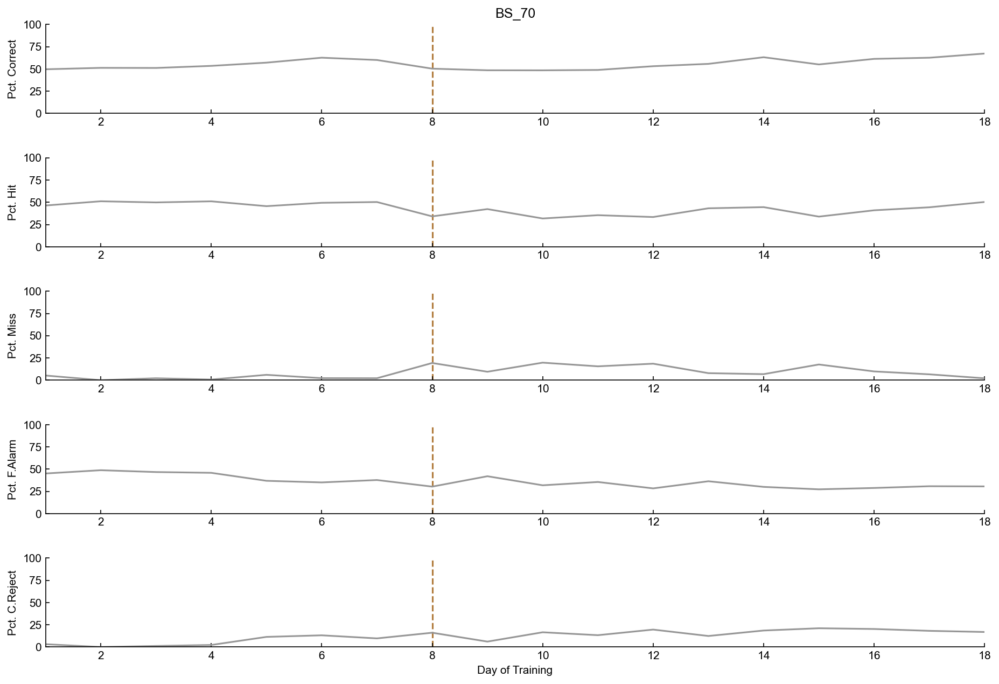

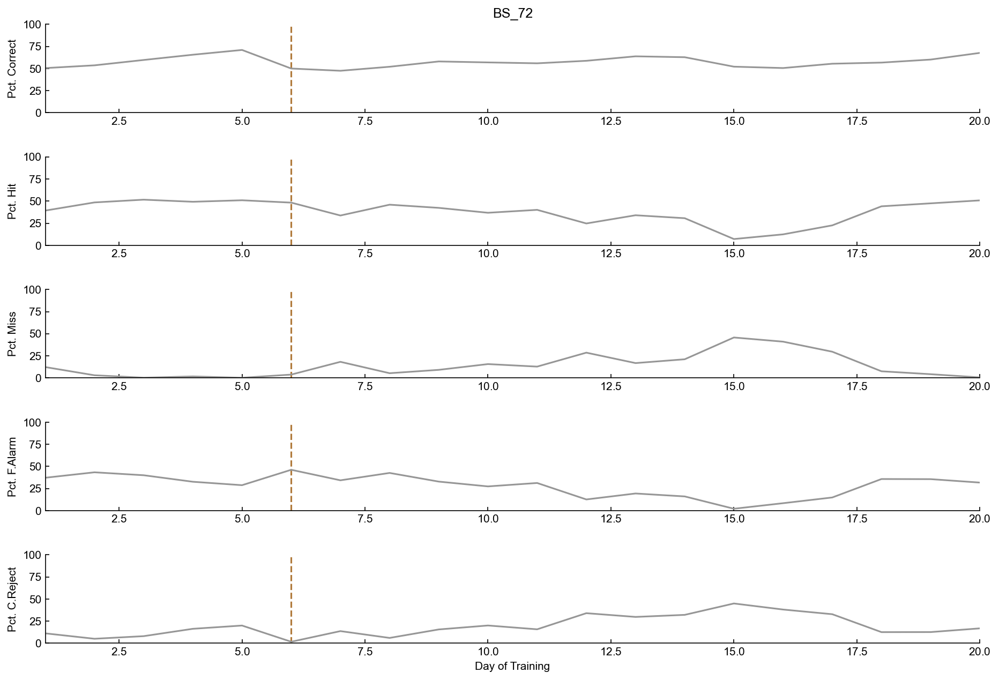

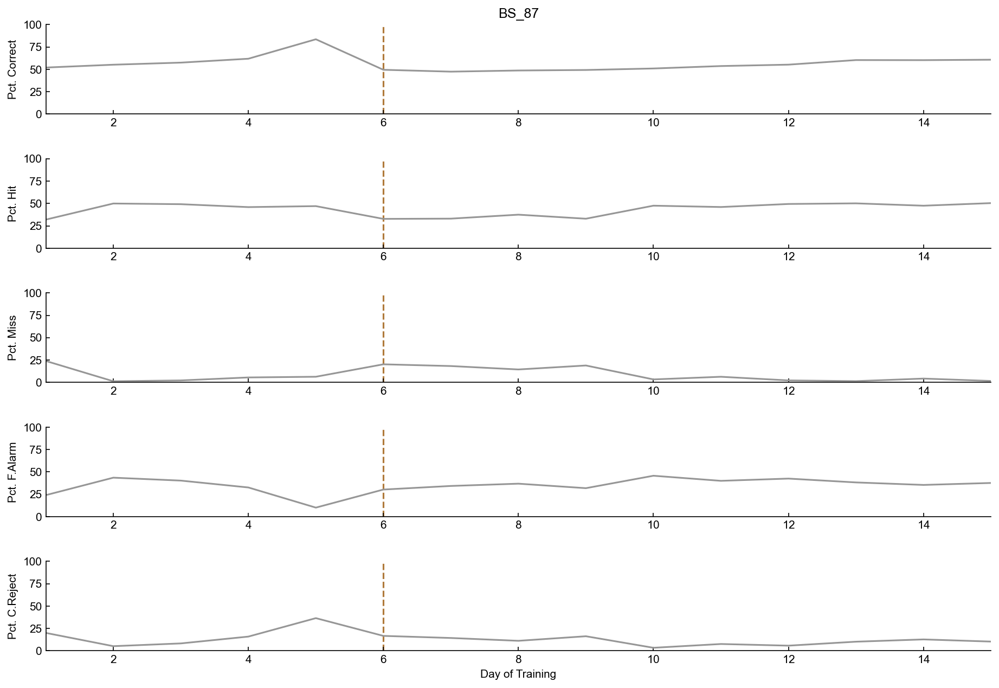

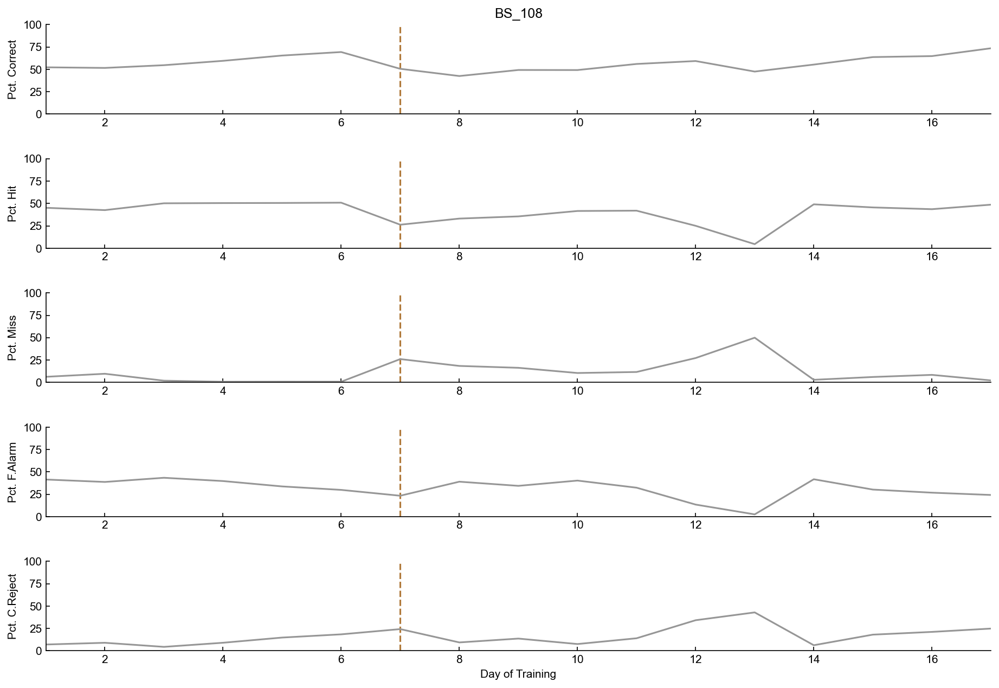

In [94]:
dual_pct_corr = []
dual_pct_hit = []
dual_pct_miss = []
dual_pct_falarm = []
dual_pct_creject = []

for animal in dualrecanimalnames:
    print(animal)
    results = getAnimalBehaviorResults(animal,act_directory)
    #res = results.__dict__
    #[print(len(res[r])) for r in res]
    
    postreversal_days = np.greater(results.sessionnum_list,animalBehaviors[animal].reversal)
    dual_pct_hit.append(results.hit_pct_OFF[postreversal_days])
    dual_pct_miss.append(results.miss_pct_OFF[postreversal_days])
    dual_pct_falarm.append(results.falarm_pct_OFF[postreversal_days])
    dual_pct_creject.append(results.creject_pct_OFF[postreversal_days])
    dual_pct_corr.append(results.corr_pct_OFF[postreversal_days])
    
    fig = plt.figure(figsize=(15,10))
    gs = fig.add_gridspec(5,1,hspace=0.5)
    ax_corr = plt.subplot(gs[0])
    ax_hit = plt.subplot(gs[1],sharex=ax_corr,sharey=ax_corr)
    ax_miss = plt.subplot(gs[2],sharex=ax_corr,sharey=ax_corr)
    ax_falarm = plt.subplot(gs[3],sharex=ax_corr,sharey=ax_corr)
    ax_creject = plt.subplot(gs[4],sharex=ax_corr,sharey=ax_corr)

    ax_corr.plot(results.sessionnum_list,results.corr_pct_ON,color=LASER_COLOR)
    ax_hit.plot(results.sessionnum_list,results.hit_pct_ON,color=LASER_COLOR)
    ax_miss.plot(results.sessionnum_list,results.miss_pct_ON,color=LASER_COLOR)
    ax_falarm.plot(results.sessionnum_list,results.falarm_pct_ON,color=LASER_COLOR)
    ax_creject.plot(results.sessionnum_list,results.creject_pct_ON,color=LASER_COLOR)
    ax_corr.plot(results.sessionnum_list,results.corr_pct_OFF,color=GOOD_GREY)
    ax_hit.plot(results.sessionnum_list,results.hit_pct_OFF,color=GOOD_GREY)
    ax_miss.plot(results.sessionnum_list,results.miss_pct_OFF,color=GOOD_GREY)
    ax_falarm.plot(results.sessionnum_list,results.falarm_pct_OFF,color=GOOD_GREY)
    ax_creject.plot(results.sessionnum_list,results.creject_pct_OFF,color=GOOD_GREY)

    ax_corr.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_hit.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_miss.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_falarm.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_creject.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)

    ax_corr.set_ylim([0,1])
    ax_corr.set_yticks([0,0.25,0.5,0.75,1])
    ax_corr.set_yticklabels([int(pct*100) for pct in np.array([0,0.25,0.5,0.75,1])])
    ax_corr.set_xlim(np.min(results.sessionnum_list),np.max(results.sessionnum_list))

    ax_corr.set_ylabel('Pct. Correct')
    ax_hit.set_ylabel('Pct. Hit')
    ax_miss.set_ylabel('Pct. Miss')
    ax_falarm.set_ylabel('Pct. F.Alarm')
    ax_creject.set_ylabel('Pct. C.Reject')
    
    ax_corr.set_title(animal)
    ax_creject.set_xlabel('Day of Training')
    
    #plt.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Behavior',animal+' control behavior.pdf'),transparent=False,facecolor="white")
    #plt.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Behavior',animal+' control behavior.png'),transparent=False,facecolor="white")

In [10]:
firstExpert = SimpleNamespace()
firstExpert.pre = dict()
firstExpert.post = dict()

#Tuning Animals
firstExpert.pre['BS_173'] = 14
firstExpert.pre['BS_175'] = 10
firstExpert.pre['BS_187'] = 6
firstExpert.pre['BS_188'] = 5
firstExpert.pre['BS_213'] = 6
firstExpert.pre['BS_214'] = np.Inf
firstExpert.pre['TH_217'] = 18

firstExpert.post['BS_173'] = 28
firstExpert.post['BS_175'] = 27
firstExpert.post['BS_187'] = 15
firstExpert.post['BS_188'] = 18
firstExpert.post['BS_213'] = np.Inf
firstExpert.post['BS_214'] = np.Inf
firstExpert.post['TH_217'] = np.Inf ### Pending

#Dual recording animals
firstExpert.pre['BS_40'] = 16 # Maybe 17
firstExpert.pre['BS_41'] = 4
firstExpert.pre['BS_42'] = 5
firstExpert.pre['BS_49'] = 12
firstExpert.pre['BS_50'] = 10
firstExpert.pre['BS_51'] = 6
firstExpert.pre['BS_56'] = 6
firstExpert.pre['BS_59'] = 4
firstExpert.pre['BS_67'] = 4 #Maybe 5. 68% and 1.6
firstExpert.pre['BS_70'] = 6
firstExpert.pre['BS_72'] = 4
firstExpert.pre['BS_87'] = 4
firstExpert.pre['BS_108'] = 5
firstExpert.pre['DS_15'] = 9
firstExpert.pre['DS_19'] = 10

firstExpert.post['BS_40'] = 30
firstExpert.post['BS_41'] = 16
firstExpert.post['BS_42'] = 15
firstExpert.post['BS_49'] = 18
firstExpert.post['BS_50'] = np.Inf
firstExpert.post['BS_51'] = 17
firstExpert.post['BS_56'] = 14
firstExpert.post['BS_59'] = 13
firstExpert.post['BS_67'] = 13
firstExpert.post['BS_70'] = 18
firstExpert.post['BS_72'] = 19
firstExpert.post['BS_87'] = 13
firstExpert.post['BS_108'] = 15
firstExpert.post['DS_15'] = 25 #Double-check this
firstExpert.post['DS_19'] = 23

#Naive behavior animals
firstExpert.pre['BS_52'] = 12
firstExpert.pre['BS_61'] = 7

firstExpert.post['BS_52'] = 28
firstExpert.post['BS_61'] = 18

In [23]:
opsin_pct_corr_ON = []
opsin_pct_hit_ON = []
opsin_pct_miss_ON = []
opsin_pct_falarm_ON = []
opsin_pct_creject_ON = []

opsin_pct_corr_OFF = []
opsin_pct_hit_OFF = []
opsin_pct_miss_OFF = []
opsin_pct_falarm_OFF = []
opsin_pct_creject_OFF = []

for animal in tqdm(did_not_learn):
    print(animal)
    results = getAnimalBehaviorResults(animal,ops_directory)

    cutoffday = animalBehaviors[animal].reversal + 12
    not_cut_off_days = np.where(np.less_equal(results.sessionnum_list,cutoffday))[0]
    day_to_use = np.max(not_cut_off_days)
    
    postreversal_days = day_to_use#np.greater(results.sessionnum_list,animalBehaviors[animal].reversal)
    opsin_pct_hit_ON.append(results.hit_pct_ON[postreversal_days])
    opsin_pct_miss_ON.append(results.miss_pct_ON[postreversal_days])
    opsin_pct_falarm_ON.append(results.falarm_pct_ON[postreversal_days])
    opsin_pct_creject_ON.append(results.creject_pct_ON[postreversal_days])
    opsin_pct_corr_ON.append(results.corr_pct_ON[postreversal_days])
    
    opsin_pct_hit_OFF.append(results.hit_pct_OFF[postreversal_days])
    opsin_pct_miss_OFF.append(results.miss_pct_OFF[postreversal_days])
    opsin_pct_falarm_OFF.append(results.falarm_pct_OFF[postreversal_days])
    opsin_pct_creject_OFF.append(results.creject_pct_OFF[postreversal_days])
    opsin_pct_corr_OFF.append(results.corr_pct_OFF[postreversal_days])

  0%|          | 0/8 [00:00<?, ?it/s]

BS_86


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_100


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_119


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_123


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_128


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_131


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_163


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_174


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

In [52]:
dual_pct_corr = []
dual_pct_hit = []
dual_pct_miss = []
dual_pct_falarm = []
dual_pct_creject = []

for animal in dualrecanimalnames:
    print(animal)
    results = getAnimalBehaviorResults(animal,act_directory)
    
    if not hasattr(animalBehaviors[animal],'reversal'):
        continue
        
    cutoffday = animalBehaviors[animal].reversal + 12
    not_cut_off_days = np.where(np.less_equal(results.sessionnum_list,cutoffday))[0]
    day_to_use = np.max(not_cut_off_days)
    
    if firstExpert.post[animal] < day_to_use:
        day_to_use = firstExpert.post[animal]
    
    postreversal_days = day_to_use#np.greater(results.sessionnum_list,animalBehaviors[animal].reversal)
    dual_pct_hit.append(results.hit_pct_OFF[postreversal_days])
    dual_pct_miss.append(results.miss_pct_OFF[postreversal_days])
    dual_pct_falarm.append(results.falarm_pct_OFF[postreversal_days])
    dual_pct_creject.append(results.creject_pct_OFF[postreversal_days])
    dual_pct_corr.append(results.corr_pct_OFF[postreversal_days])

BS_40


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_41


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_42


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_49


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in long_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in long_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in long_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in long_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipyt

BS_50


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in long_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in long_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON

BS_51


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_56


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_59


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_61


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_67


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_70


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_72


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_87


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

BS_108


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(out

DS_15


<ipython-input-9-2140623ba375>:45: RuntimeWarning: invalid value encountered in long_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:46: RuntimeWarning: invalid value encountered in long_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:47: RuntimeWarning: invalid value encountered in long_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-9-2140623ba375>:48: RuntimeWarning: invalid value encountered in long_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))


DS_19


In [53]:
dual_pct_hit

[0.42531120331950206,
 0.4787018255578093,
 0.47192982456140353,
 0.41424802110817943,
 0.10150375939849623,
 0.509212730318258,
 0.46174142480211083,
 0.516,
 0.5022421524663677,
 0.48997772828507796,
 0.5038051750380518,
 0.44155844155844154,
 0.4755381604696673,
 0.43661971830985913]

In [25]:
opsin_pct_hit_ON = np.concatenate(opsin_pct_hit_ON)
opsin_pct_hit_OFF = np.concatenate(opsin_pct_hit_OFF)
dual_pct_hit = np.concatenate(dual_pct_hit)
opsin_pct_miss_ON = np.concatenate(opsin_pct_miss_ON)
opsin_pct_miss_OFF = np.concatenate(opsin_pct_miss_OFF)
dual_pct_miss = np.concatenate(dual_pct_miss)
opsin_pct_falarm_ON = np.concatenate(opsin_pct_falarm_ON)
opsin_pct_falarm_OFF = np.concatenate(opsin_pct_falarm_OFF)
dual_pct_falarm = np.concatenate(dual_pct_falarm)
opsin_pct_creject_ON = np.concatenate(opsin_pct_creject_ON)
opsin_pct_creject_OFF = np.concatenate(opsin_pct_creject_OFF)
dual_pct_creject = np.concatenate(dual_pct_creject)
opsin_pct_corr_ON = np.concatenate(opsin_pct_corr_ON)
opsin_pct_corr_OFF = np.concatenate(opsin_pct_corr_OFF)
dual_pct_corr = np.concatenate(dual_pct_corr)

ValueError: zero-dimensional arrays cannot be concatenated

In [54]:
opsin_pct_hit_ON = opsin_pct_hit_ON[np.isfinite(opsin_pct_hit_ON)]
opsin_pct_hit_OFF = opsin_pct_hit_OFF[np.isfinite(opsin_pct_hit_OFF)]
dual_pct_hit = dual_pct_hit[np.isfinite(dual_pct_hit)]
opsin_pct_miss_ON = opsin_pct_miss_ON[np.isfinite(opsin_pct_miss_ON)]
opsin_pct_miss_OFF = opsin_pct_miss_OFF[np.isfinite(opsin_pct_miss_OFF)]
dual_pct_miss = dual_pct_miss[np.isfinite(dual_pct_miss)]
opsin_pct_falarm_ON = opsin_pct_falarm_ON[np.isfinite(opsin_pct_falarm_ON)]
opsin_pct_falarm_OFF = opsin_pct_falarm_OFF[np.isfinite(opsin_pct_falarm_OFF)]
dual_pct_falarm = dual_pct_falarm[np.isfinite(dual_pct_falarm)]
opsin_pct_creject_ON = opsin_pct_creject_ON[np.isfinite(opsin_pct_creject_ON)]
opsin_pct_creject_OFF = opsin_pct_creject_OFF[np.isfinite(opsin_pct_creject_OFF)]
dual_pct_creject = dual_pct_creject[np.isfinite(dual_pct_creject)]
opsin_pct_corr_ON = opsin_pct_corr_ON[np.isfinite(opsin_pct_corr_ON)]
opsin_pct_corr_OFF = opsin_pct_corr_OFF[np.isfinite(opsin_pct_corr_OFF)]
dual_pct_corr = dual_pct_corr[np.isfinite(dual_pct_corr)]

TypeError: only integer scalar arrays can be converted to a scalar index

mannwhitney
sig: True
pval: 0.0004190511930450011
mannwhitney
sig: False
pval: 0.8675548050161054
mannwhitney
sig: False
pval: 0.7135441098289396
mannwhitney
sig: True
pval: 0.0021703099102479907
mannwhitney
sig: True
pval: 0.0028958313788035152


<ipython-input-64-fc3a4aaa2c91>:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


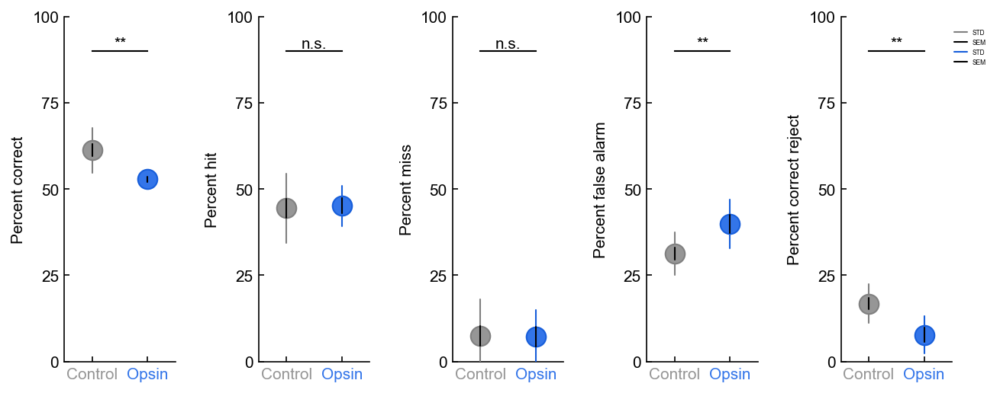

In [64]:
colors = [GOOD_GREY,LASER_COLOR]


fig = plt.figure(figsize=(10,4))
gs = fig.add_gridspec(1,5,wspace=0.75)
ax_corr = plt.subplot(gs[0])
ax_hit = plt.subplot(gs[1],sharex=ax_corr,sharey=ax_corr)
ax_miss = plt.subplot(gs[2],sharex=ax_corr,sharey=ax_corr)
ax_falarm = plt.subplot(gs[3],sharex=ax_corr,sharey=ax_corr)
ax_creject = plt.subplot(gs[4],sharex=ax_corr,sharey=ax_corr)

plotting_data = [[ax_corr,dual_pct_corr,opsin_pct_corr_ON],[ax_hit,dual_pct_hit,opsin_pct_hit_ON],[ax_miss,dual_pct_miss,opsin_pct_miss_ON],[ax_falarm,dual_pct_falarm,opsin_pct_falarm_ON],[ax_creject,dual_pct_creject,opsin_pct_creject_ON]]
labels = ['Percent correct','Percent hit','Percent miss','Percent false alarm','Percent correct reject']

for label,(ax,dual_data,opsin_data) in zip(labels,plotting_data):
    for idx,column in enumerate([dual_data,opsin_data]):
        eye_color=colors[idx]
        r,g,b = mpl.colors.to_rgb(eye_color)
        h,l,s = colorsys.rgb_to_hls(r,g,b)
        #border_color=colorsys.hls_to_rgb(h,l*0.75,s)
        border_color=colorsys.hls_to_rgb(h,l*.85,s)

        summary_size=150
        summary_width=1

        datamean = np.nanmean(column)
        SEMlow = datamean - sem(column,nan_policy='omit')
        SEMhigh = datamean + sem(column,nan_policy='omit')
        STDlow = datamean - np.std(column)
        STDhigh = datamean + np.std(column)

        ax.scatter([idx], [datamean], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx, idx], [STDlow,STDhigh], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round',label='STD')
        ax.plot([idx, idx], [SEMlow,SEMhigh], c='k', lw=summary_width, zorder=11, solid_capstyle='round',label='SEM')

    ax.set_xlim(-0.5,1.5)
    ax.set_xticks([0,1])
    ax.set_xticklabels(['Control','Opsin'])
    [t.set_color(colors[idx]) for idx,t in enumerate(ax.xaxis.get_ticklabels())]

    ax.set_ylim([0,1])

    #ax.text(1,5.4,'n='+str(len(preData)),horizontalalignment='left',verticalalignment='top')

    #print('ttest_rel')
    #test = ttest_rel(preData,postData)
    #pval = test[1]
    #sig = np.abs(pval) < 0.05
    #print('sig: '+str(sig))
    #print('pval: '+str(pval))

    #print('mannwhitney')
    #test = mannwhitneyu(preData,postData)
    #pval = test.pvalue
    #sig = np.abs(pval) < 0.05
    #print('sig: '+str(sig))
    #print('pval: '+str(pval))

    print('mannwhitney')
    test = mannwhitneyu(dual_data,opsin_data)
    pval = test.pvalue
    sig = np.abs(pval) < 0.05
    print('sig: '+str(sig))
    print('pval: '+str(pval))

    ax.set_yticks([0,0.25,0.5,0.75,1])
    ax.set_yticklabels([int(pct*100) for pct in np.array([0,0.25,0.5,0.75,1])])

    #ax.set_ylabel('Trial outcome (%)')
    #ax.text(0.5,0.8,'n.s.',horizontalalignment='center',verticalalignment='center')

ax_creject.legend(frameon=False,loc=(1,0.85),prop={'size': 4})

ax_corr.set_ylabel('Percent correct')
ax_hit.set_ylabel('Percent hit')
ax_miss.set_ylabel('Percent miss')
ax_falarm.set_ylabel('Percent false alarm')
ax_creject.set_ylabel('Percent correct reject')

ax_corr.text(0.5,0.9,str('**'),verticalalignment='bottom',horizontalalignment='center')
ax_hit.text(0.5,0.9,str('n.s.'),verticalalignment='bottom',horizontalalignment='center')
ax_miss.text(0.5,0.9,str('n.s.'),verticalalignment='bottom',horizontalalignment='center')
ax_falarm.text(0.5,0.9,str('**'),verticalalignment='bottom',horizontalalignment='center')
ax_creject.text(0.5,0.9,str('**'),verticalalignment='bottom',horizontalalignment='center')

ax_corr.plot([0,1],[0.9]*2,color='k',lw=1)
ax_hit.plot([0,1],[0.9]*2,color='k',lw=1)
ax_miss.plot([0,1],[0.9]*2,color='k',lw=1)
ax_falarm.plot([0,1],[0.9]*2,color='k',lw=1)
ax_creject.plot([0,1],[0.9]*2,color='k',lw=1)

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Behavior','Opsin vs dual-rec outcome rates at cutoff V2.pdf'),transparent=False,facecolor="white")

In [56]:
data = SimpleNamespace(dual_corr=dual_pct_corr,
                      dual_hit=dual_pct_hit,
                      dual_miss=dual_pct_miss,
                      dual_falarm=dual_pct_falarm,
                      dual_creject=dual_pct_creject,
                      opsin_corr=opsin_pct_corr_ON,
                      opsin_hit=opsin_pct_hit_ON,
                      opsin_miss=opsin_pct_miss_ON,
                      opsin_falarm=opsin_pct_falarm_ON,
                      opsin_creject=opsin_pct_creject_ON
                     )

In [57]:
outcome = len(data.dual_corr)*["correct"] + len(data.dual_hit)*["hit"] + len(data.dual_miss)*["miss"] \
        + len(data.dual_falarm)*["falarm"] + len(data.dual_creject)*["creject"] \
        + len(data.opsin_corr)*["correct"] + len(data.opsin_hit)*["hit"] + len(data.opsin_miss)*["miss"] \
        + len(data.opsin_falarm)*["falarm"] + len(data.opsin_creject)*["creject"]
context = len(data.dual_corr)*["control"] + len(data.dual_hit)*["control"] + len(data.dual_miss)*["control"] \
        + len(data.dual_falarm)*["control"] + len(data.dual_creject)*["control"] \
        + len(data.opsin_corr)*["opsin"] + len(data.opsin_hit)*["opsin"] + len(data.opsin_miss)*["opsin"] \
        + len(data.opsin_falarm)*["opsin"] + len(data.opsin_creject)*["opsin"]
pct = (np.concatenate([data.dual_corr, data.dual_hit, data.dual_miss, data.dual_falarm, data.dual_creject, data.opsin_corr, data.opsin_hit, data.opsin_miss, data.opsin_falarm, data.opsin_creject]))

df = pd.DataFrame({"outcome": outcome, "context": context, "pct": pct})
df.to_csv('C:\\\\Users\\insan\\Desktop\\DataForOpsinBehaviorStatsTests.csv')

In [58]:
df = pd.read_csv('C:\\\\Users\\insan\\Desktop\\DataForOpsinBehaviorStatsTests.csv', index_col=0)

In [59]:
df.columns

Index(['outcome', 'context', 'pct'], dtype='object')

In [60]:
df.outcome.unique()

array(['correct', 'hit', 'miss', 'falarm', 'creject'], dtype=object)

In [61]:
pg.anova(data=df, dv='pct', between=['outcome', 'context'], detailed=True)

,Source,SS,DF,MS,F,p-unc,np2
0,outcome,3.966249,4.0,0.991562,166.868112,2.483562e-43,0.869702
1,context,0.007266,1.0,0.007266,1.222767,2.714714e-01,0.012080
2,outcome * context,0.108595,4.0,0.027149,4.568824,1.977427e-03,0.154515
3,Residual,0.594219,100.0,0.005942,NaN,NaN,NaN


In [62]:
context_results = pg.pairwise_tests(data=df, dv='pct', between=['outcome', 'context'], parametric=False, padjust='fdr_bh')
context_results

,Contrast,outcome,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,outcome,-,correct,creject,False,False,484.0,two-sided,1.439361e-08,8.251067e-08,fdr_bh,6.209011
1,outcome,-,correct,falarm,False,False,480.0,two-sided,2.478874e-08,8.262912e-08,fdr_bh,3.173182
2,outcome,-,correct,hit,False,False,457.0,two-sided,4.781524e-07,5.976905e-07,fdr_bh,1.664200
3,outcome,-,correct,miss,False,False,483.0,two-sided,1.650213e-08,8.251067e-08,fdr_bh,5.879116
4,outcome,-,creject,falarm,False,False,18.0,two-sided,1.553256e-07,2.588761e-07,fdr_bh,-2.717617
5,outcome,-,creject,hit,False,False,15.0,two-sided,1.057533e-07,2.115065e-07,fdr_bh,-3.764473
6,outcome,-,creject,miss,False,False,386.0,two-sided,7.562725e-04,7.562725e-04,fdr_bh,0.697081
7,outcome,-,falarm,hit,False,False,47.0,two-sided,4.984814e-06,5.538683e-06,fdr_bh,-1.204769
8,outcome,-,falarm,miss,False,False,462.0,two-sided,2.573913e-07,3.677019e-07,fdr_bh,2.984173
9,outcome,-,hit,miss,False,False,477.0,two-sided,3.705730e-08,9.264325e-08,fdr_bh,3.900416


In [63]:
context_results[context_results["p-corr"] < 0.05]

,Contrast,outcome,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,outcome,-,correct,creject,False,False,484.0,two-sided,1.439361e-08,8.251067e-08,fdr_bh,6.209011
1,outcome,-,correct,falarm,False,False,480.0,two-sided,2.478874e-08,8.262912e-08,fdr_bh,3.173182
2,outcome,-,correct,hit,False,False,457.0,two-sided,4.781524e-07,5.976905e-07,fdr_bh,1.664200
3,outcome,-,correct,miss,False,False,483.0,two-sided,1.650213e-08,8.251067e-08,fdr_bh,5.879116
4,outcome,-,creject,falarm,False,False,18.0,two-sided,1.553256e-07,2.588761e-07,fdr_bh,-2.717617
5,outcome,-,creject,hit,False,False,15.0,two-sided,1.057533e-07,2.115065e-07,fdr_bh,-3.764473
6,outcome,-,creject,miss,False,False,386.0,two-sided,7.562725e-04,7.562725e-04,fdr_bh,0.697081
7,outcome,-,falarm,hit,False,False,47.0,two-sided,4.984814e-06,5.538683e-06,fdr_bh,-1.204769
8,outcome,-,falarm,miss,False,False,462.0,two-sided,2.573913e-07,3.677019e-07,fdr_bh,2.984173
9,outcome,-,hit,miss,False,False,477.0,two-sided,3.705730e-08,9.264325e-08,fdr_bh,3.900416


In [ ]:
0.005

In [ ]:
0.05
0.01
0.001

In [17]:
opsin_pct_hit_ON

[array([[       nan,        nan,        nan,        nan,        nan,
                nan,        nan,        nan,        nan,        nan,
                nan,        nan,        nan, 0.5       , 0.4009434 ,
         0.44347826, 0.34319527, 0.42272727, 0.45933014, 0.41420118,
         0.51785714, 0.39247312, 0.48360656, 0.43589744, 0.51111111,
         0.44117647, 0.52363636]]),
 array([[       nan,        nan,        nan,        nan,        nan,
                nan,        nan,        nan,        nan,        nan,
         0.03076923, 0.02285714, 0.12      , 0.15544041, 0.06569343,
         0.32307692, 0.3930131 , 0.34602076, 0.44782609, 0.48444444,
         0.50342466, 0.4372093 , 0.47583643, 0.5257732 , 0.45957447,
         0.54418605, 0.31724138, 0.08626198, 0.23671498]]),
 array([[       nan,        nan,        nan,        nan,        nan,
                nan,        nan,        nan,        nan, 0.33112583,
         0.3539823 , 0.19148936, 0.3872549 , 0.32335329, 0.27179487,
       

In [303]:
def find_active_trials(outcomes,window_length = 75, active_thresholds = [0.2,0.8], verification_threshold = 0.8):
    hits = np.equal(outcomes,1)
    misses = np.equal(outcomes,2)
    falarms = np.equal(outcomes,3)
    crejects = np.equal(outcomes,4)
    
    gos = np.logical_or(hits,falarms)
    
    participation = np.array([np.mean(gos[i:(i+window_length)]) for i in range(len(gos)-window_length)])
    
    #Calculate where active conditions are fulfilled
    activehighthresh = np.less(participation,active_thresholds[1])
    activelowthresh = np.greater(participation,active_thresholds[0])
    active = np.logical_and(activehighthresh,activelowthresh)
    #Get trial numbers
    activetrials = np.where(active)[0]
    if len(activetrials) >= 2:
        activestart = np.min(activetrials)
        activeend = np.max(activetrials)
    else:
        activestart = np.nan
        activeend = np.nan
    
    ############################################ If there's no active period then skip everything
    if not np.isfinite(activestart) or not np.isfinite(activeend):
        valid_trials = np.zeros_like(outcomes,dtype='bool')
        return valid_trials
    
    ############################################ Verify that an appropriate amount of this span is active
    activespan = np.array(range(len(active)))
    tempspan = np.greater_equal(activespan,activestart)
    tempspan2 = np.less_equal(activespan,activeend)
    activespan = np.logical_and(tempspan,tempspan2)
    verification_frac = np.sum(active) / np.sum(activespan)
    #Check against verification_threshold and abort if insufficient
    if np.isfinite(verification_frac) and verification_frac < verification_threshold:
        valid_trials = np.zeros_like(outcomes,dtype='bool')
        return valid_trials
    
    ############################################ Now return a proper valid_trials object
    activeend += window_length
    valid_trials = np.zeros_like(outcomes,dtype='bool')
    valid_trials[activestart:activeend] = True
    return valid_trials

In [308]:
def getAnimalActiveBehaviorResults(animal):
    hit_pct_ON = []
    miss_pct_ON = []
    falarm_pct_ON = []
    creject_pct_ON = []
    hit_pct_OFF = []
    miss_pct_OFF = []
    falarm_pct_OFF = []
    creject_pct_OFF = []
    sessionnum_list = np.sort([k for k in animalBehaviors[animal].sessions])

    for sessionnum in sessionnum_list:

        sessionfile = getSessionByTraining(ops_directory,animal,'AC',sessionnum)

        outcomes_OFF = []
        outcomes_ON = []
        if sessionfile is None:
            outcomes = animalBehaviors[animal].sessions[sessionnum].outcomes
            laser = animalBehaviors[animal].sessions[sessionnum].laser
            valid_trials = find_active_trials(outcomes,window_length=75,verification_threshold=0.6)
            laser_ON = np.logical_and(laser,valid_trials)
            laser_OFF = np.logical_and(np.logical_not(laser),valid_trials)
            outcomes_ON = outcomes[laser_ON]
            outcomes_OFF = outcomes[laser_OFF]
        else:
            outcomes = getOutcomesFromSession(sessionfile)
            laser = sessionfile.trials.laser_stimulation
            valid_trials = find_active_trials(outcomes,window_length=75,verification_threshold=0.6)
            laser_ON = np.logical_and(laser,valid_trials)
            laser_OFF = np.logical_and(np.logical_not(laser),valid_trials)
            outcomes_ON = outcomes[laser_ON]
            outcomes_OFF = outcomes[laser_OFF]

        hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
        miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
        falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
        creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
        hit_pct_OFF.append(np.sum(np.equal(outcomes_OFF,1))/len(outcomes_OFF))
        miss_pct_OFF.append(np.sum(np.equal(outcomes_OFF,2))/len(outcomes_OFF))
        falarm_pct_OFF.append(np.sum(np.equal(outcomes_OFF,3))/len(outcomes_OFF))
        creject_pct_OFF.append(np.sum(np.equal(outcomes_OFF,4))/len(outcomes_OFF))

    corr_pct_ON = [h + c for (h,c) in zip(hit_pct_ON,creject_pct_ON)]
    corr_pct_OFF = [h + c for (h,c) in zip(hit_pct_OFF,creject_pct_OFF)]

    results = SimpleNamespace()
    results.sessionnum_list = sessionnum_list
    results.corr_pct_ON = corr_pct_ON
    results.hit_pct_ON = hit_pct_ON
    results.miss_pct_ON = miss_pct_ON
    results.falarm_pct_ON = falarm_pct_ON
    results.creject_pct_ON = creject_pct_ON
    results.corr_pct_OFF = corr_pct_OFF
    results.hit_pct_OFF = hit_pct_OFF
    results.miss_pct_OFF = miss_pct_OFF
    results.falarm_pct_OFF = falarm_pct_OFF
    results.creject_pct_OFF = creject_pct_OFF
    return results

BS_86


<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:37: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:38: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON

BS_100


<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:37: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:38: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON

BS_119


<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:37: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:38: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON

BS_123


<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:37: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:38: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON

BS_128


<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:37: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:38: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON

BS_131


<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:37: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:38: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON

BS_163


<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:37: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:38: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON

BS_174


<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON,2))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:37: RuntimeWarning: invalid value encountered in longlong_scalars
  falarm_pct_ON.append(np.sum(np.equal(outcomes_ON,3))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:38: RuntimeWarning: invalid value encountered in longlong_scalars
  creject_pct_ON.append(np.sum(np.equal(outcomes_ON,4))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  hit_pct_ON.append(np.sum(np.equal(outcomes_ON,1))/len(outcomes_ON))
<ipython-input-308-7d095f44f9d5>:36: RuntimeWarning: invalid value encountered in longlong_scalars
  miss_pct_ON.append(np.sum(np.equal(outcomes_ON

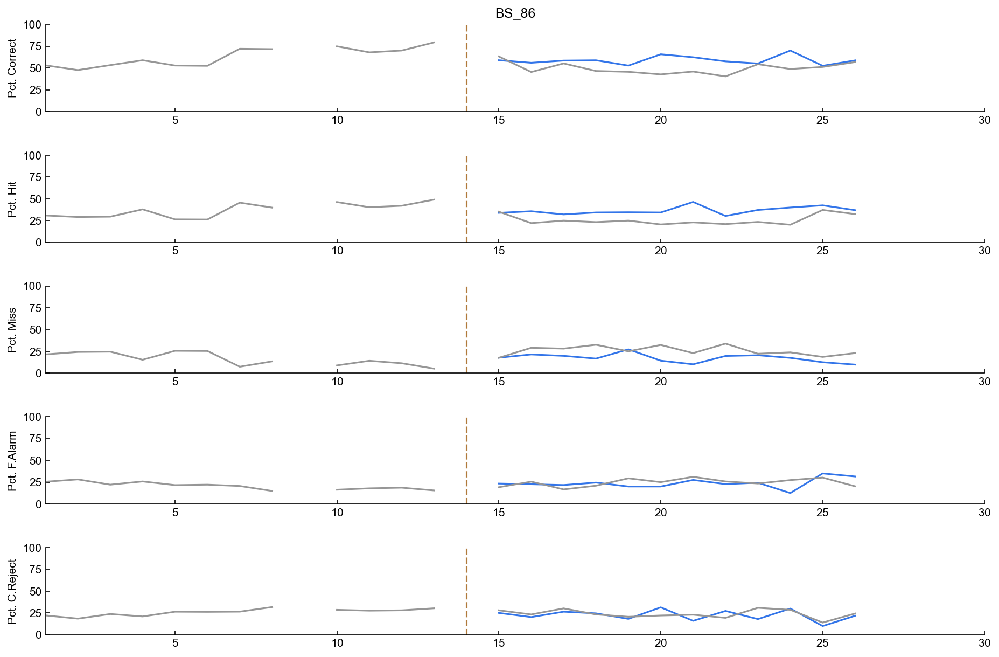

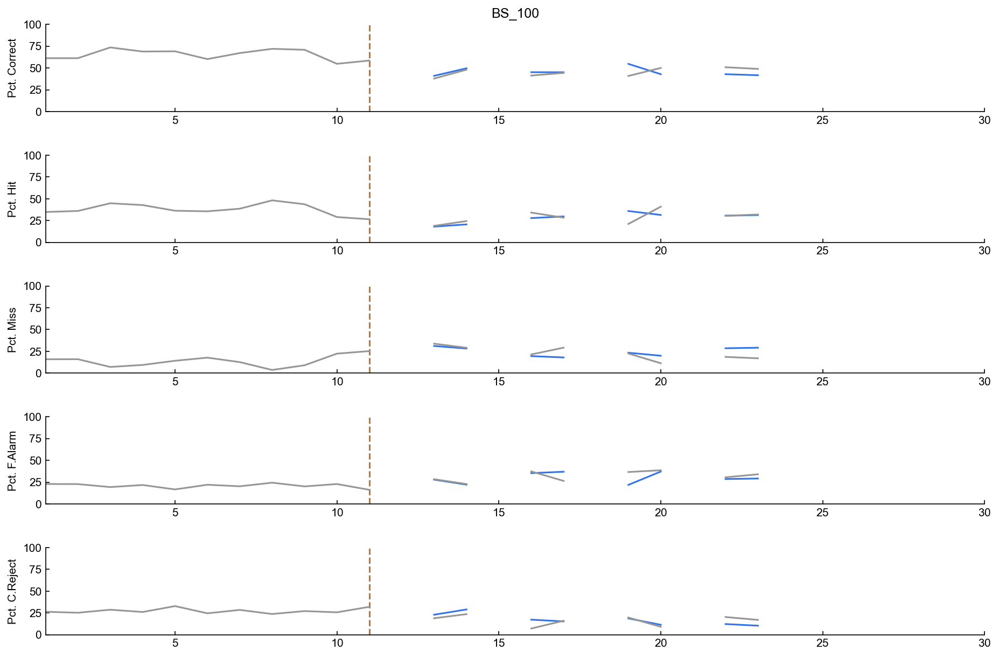

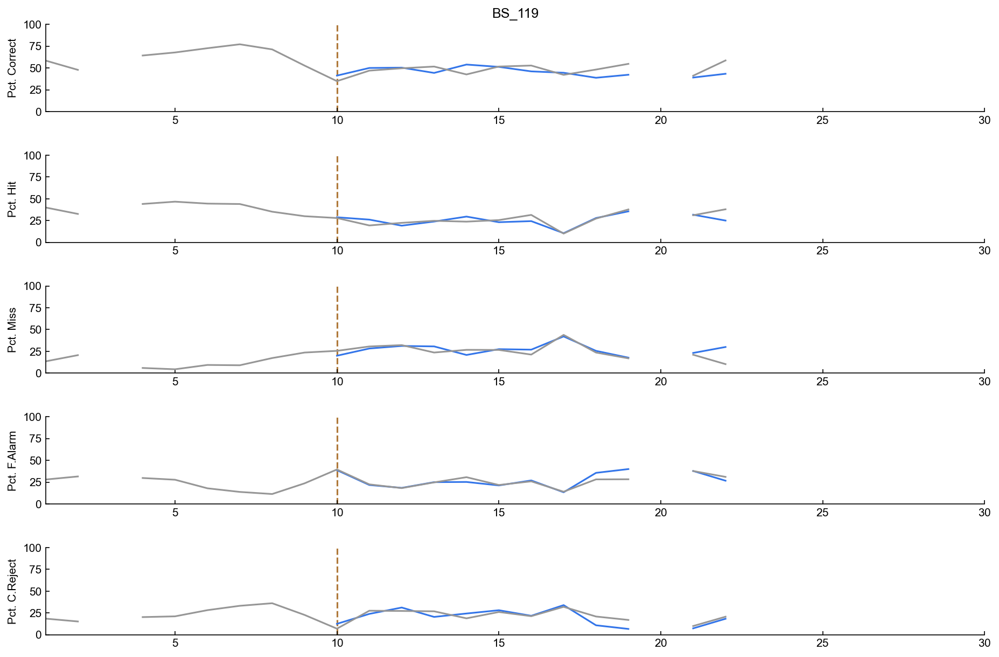

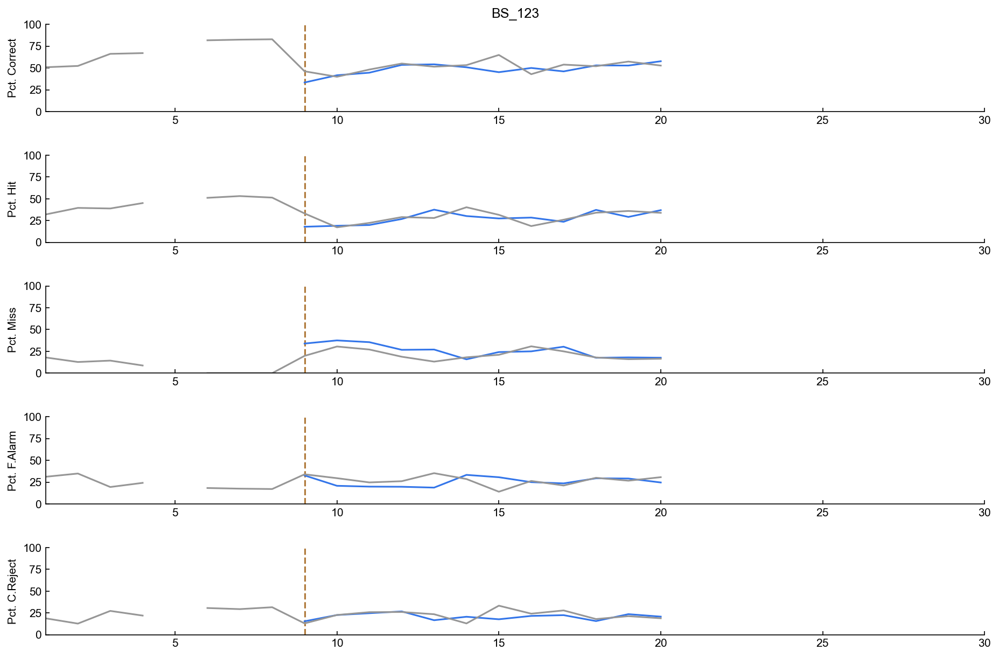

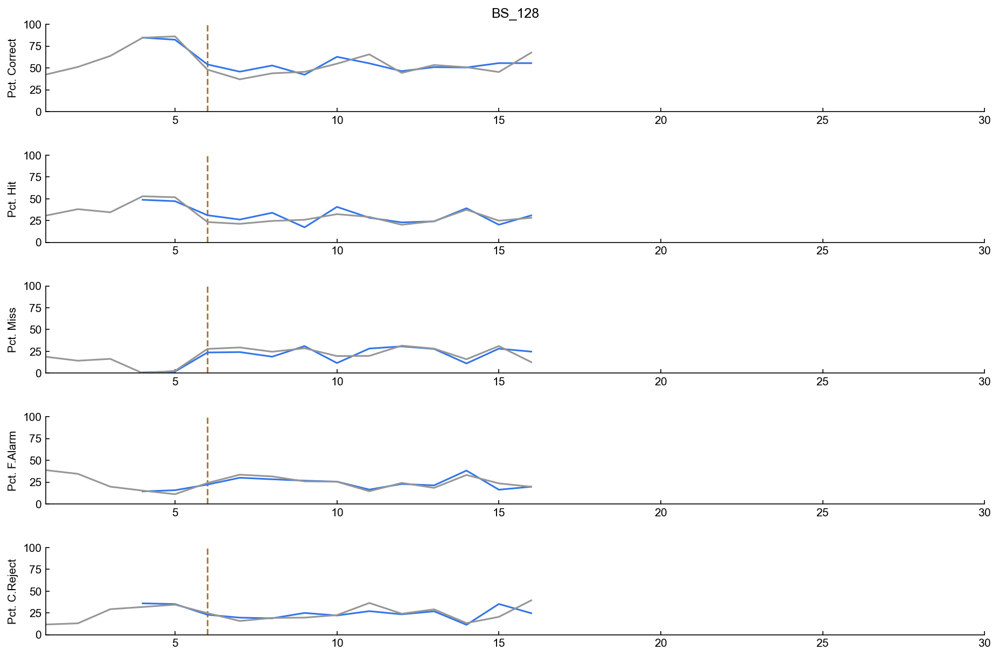

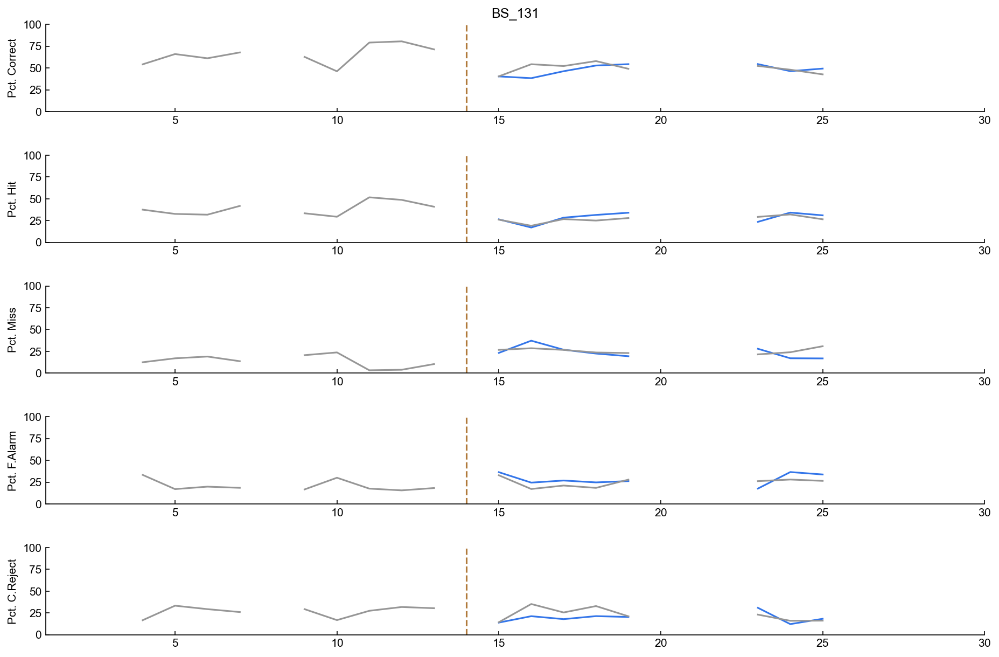

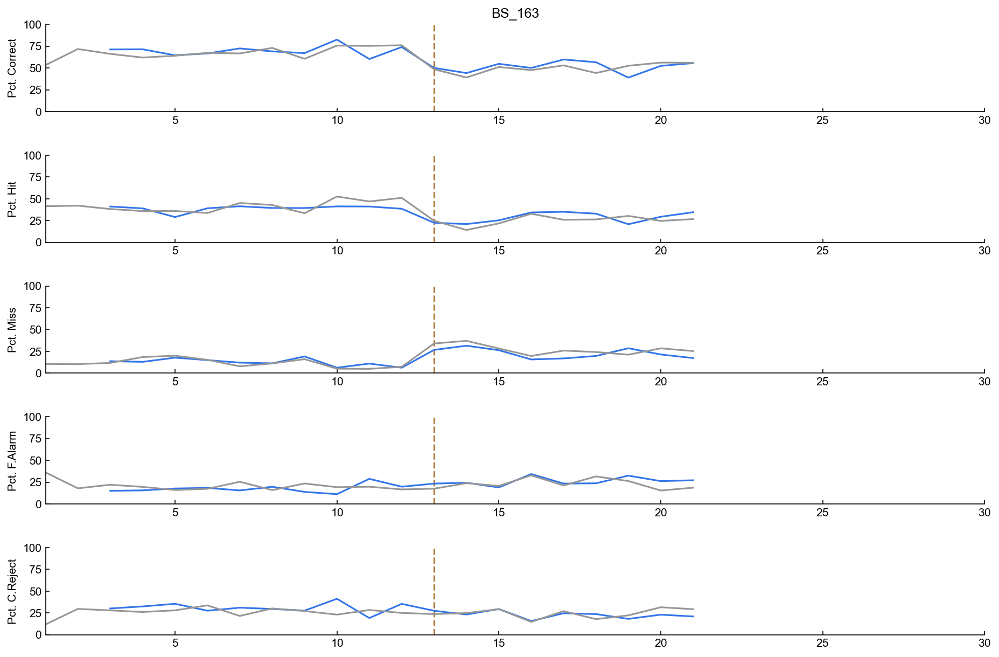

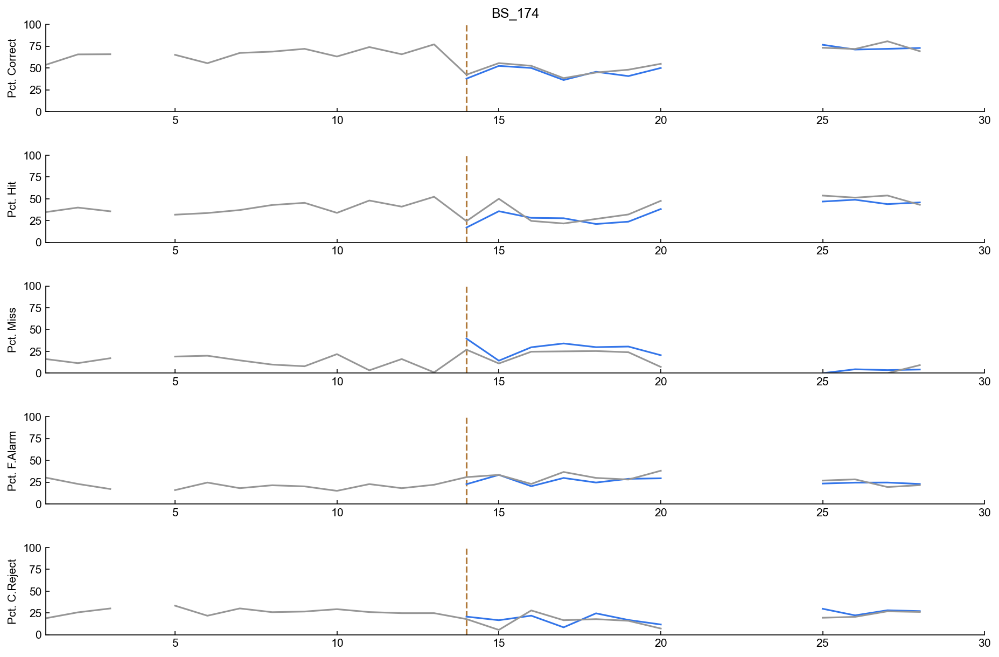

In [309]:
for animal in did_not_learn:
    print(animal)
    results = getAnimalActiveBehaviorResults(animal)
    #res = results.__dict__
    #[print(len(res[r])) for r in res]
    
    fig = plt.figure(figsize=(15,10))
    gs = fig.add_gridspec(5,1,hspace=0.5)
    ax_corr = plt.subplot(gs[0])
    ax_hit = plt.subplot(gs[1],sharex=ax_corr,sharey=ax_corr)
    ax_miss = plt.subplot(gs[2],sharex=ax_corr,sharey=ax_corr)
    ax_falarm = plt.subplot(gs[3],sharex=ax_corr,sharey=ax_corr)
    ax_creject = plt.subplot(gs[4],sharex=ax_corr,sharey=ax_corr)

    ax_corr.plot(results.sessionnum_list,results.corr_pct_ON,color=LASER_COLOR)
    ax_hit.plot(results.sessionnum_list,results.hit_pct_ON,color=LASER_COLOR)
    ax_miss.plot(results.sessionnum_list,results.miss_pct_ON,color=LASER_COLOR)
    ax_falarm.plot(results.sessionnum_list,results.falarm_pct_ON,color=LASER_COLOR)
    ax_creject.plot(results.sessionnum_list,results.creject_pct_ON,color=LASER_COLOR)
    ax_corr.plot(results.sessionnum_list,results.corr_pct_OFF,color=GOOD_GREY)
    ax_hit.plot(results.sessionnum_list,results.hit_pct_OFF,color=GOOD_GREY)
    ax_miss.plot(results.sessionnum_list,results.miss_pct_OFF,color=GOOD_GREY)
    ax_falarm.plot(results.sessionnum_list,results.falarm_pct_OFF,color=GOOD_GREY)
    ax_creject.plot(results.sessionnum_list,results.creject_pct_OFF,color=GOOD_GREY)

    ax_corr.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_hit.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_miss.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_falarm.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)
    ax_creject.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)

    ax_corr.set_ylim([0,1])
    ax_corr.set_yticks([0,0.25,0.5,0.75,1])
    [ax.axhline(t,zorder=-20,alpha=0.25,color='k') for t in [0.25,0.5,0.75,1]]
    ax_corr.set_yticklabels([int(pct*100) for pct in np.array([0,0.25,0.5,0.75,1])])
    ax_corr.set_xlim(np.min(sessionnum_list),np.max(sessionnum_list))

    ax_corr.set_ylabel('Pct. Correct')
    ax_hit.set_ylabel('Pct. Hit')
    ax_miss.set_ylabel('Pct. Miss')
    ax_falarm.set_ylabel('Pct. F.Alarm')
    ax_creject.set_ylabel('Pct. C.Reject')
    
    ax_corr.set_title(animal)
    
    plt.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Behavior',animal+' active behavior.pdf'),transparent=False,facecolor="white")

In [366]:
opsin_pct_miss = []
dual_pct_miss = []

In [363]:
def getAnimalActiveBehaviorResults(animal,directory):
    
    sessionnum_list = np.sort([k for k in animalBehaviors[animal].sessions])
    pct_miss_list = np.full_like(sessionnum_list,np.nan,dtype='float')
    pct_falarm_list = np.full_like(sessionnum_list,np.nan,dtype='float')

    for idx,sessionnum in enumerate(sessionnum_list):

        sessionfile = getSessionByTraining(directory,animal,'AC',sessionnum)

        outcomes = []
        if sessionfile is None:
            outcomes = animalBehaviors[animal].sessions[sessionnum].outcomes
            valid_trials = find_active_trials(outcomes,window_length=35, active_thresholds = [0.3,0.7],verification_threshold=0.5)
            outcomes = outcomes[valid_trials]
        else:
            outcomes = getOutcomesFromSession(sessionfile)
            valid_trials = find_active_trials(outcomes,window_length=35, active_thresholds = [0.3,0.7],verification_threshold=0.5)
            outcomes = outcomes[valid_trials]

        if len(outcomes) == 0:
            pct_miss_list[idx] = np.nan
            pct_falarm_list[idx] = np.nan
            continue
            
        misses = np.equal(outcomes,2)
        falarms = np.equal(outcomes,3)

        pct_miss = np.sum(misses) / (np.sum(misses) + np.sum(falarms))
        pct_falarm = 1 - pct_miss
        
        pct_miss_list[idx] = pct_miss
        pct_falarm_list[idx] = pct_falarm

    results = SimpleNamespace()
    results.sessionnum_list = sessionnum_list
    results.miss_pct = pct_miss_list
    results.falarm_pct = pct_falarm_list
    return results

BS_86
BS_100
BS_119
BS_123
BS_128
BS_131
BS_163
BS_174


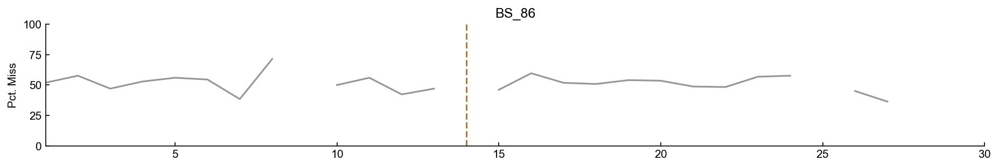

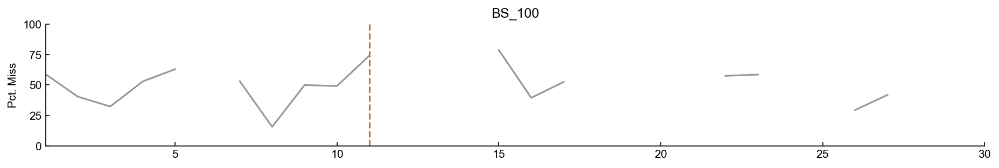

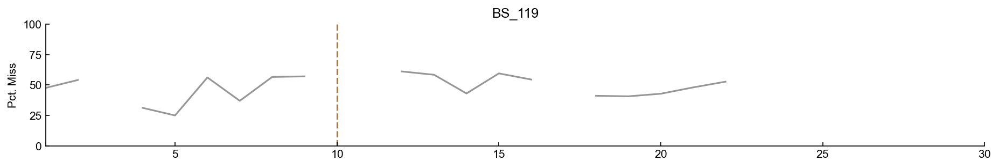

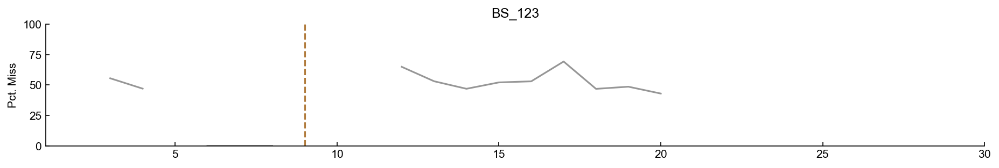

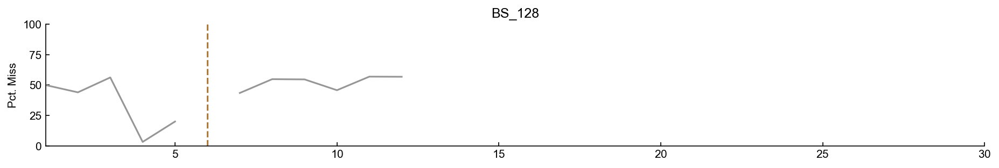

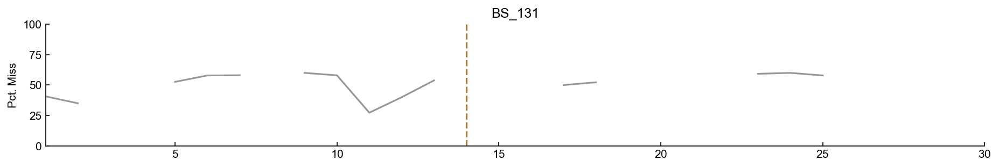

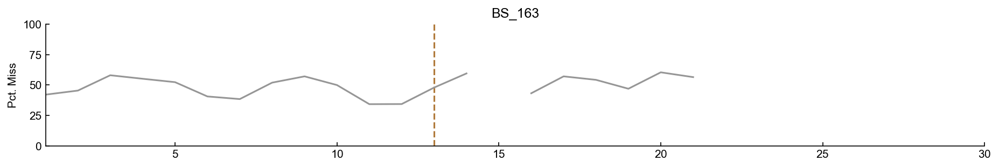

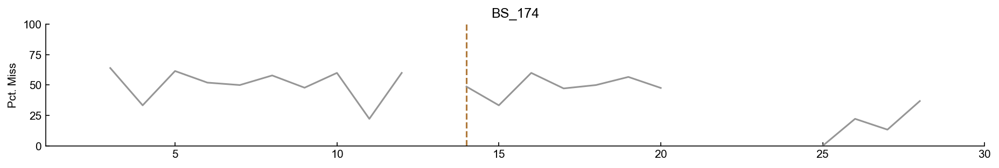

In [368]:
for animal in did_not_learn:
    print(animal)
    results = getAnimalActiveBehaviorResults(animal,ops_directory)
    #res = results.__dict__
    #[print(len(res[r])) for r in res]
    
    fig,ax = plt.subplots(figsize=(15,2))
    #fig = plt.figure(figsize=(15,10))
    #gs = fig.add_gridspec(5,1,hspace=0.5)
    #ax_corr = plt.subplot(gs[0])
    #ax_hit = plt.subplot(gs[1],sharex=ax_corr,sharey=ax_corr)
    #ax_miss = plt.subplot(gs[2],sharex=ax_corr,sharey=ax_corr)
    #ax_falarm = plt.subplot(gs[3],sharex=ax_corr,sharey=ax_corr)
    #ax_creject = plt.subplot(gs[4],sharex=ax_corr,sharey=ax_corr)
    
    postreversal_days = np.greater(results.sessionnum_list,animalBehaviors[animal].reversal)
    postreversal_pct_miss = results.miss_pct[postreversal_days]
    opsin_pct_miss.append(postreversal_pct_miss)

    ax.plot(results.sessionnum_list,results.miss_pct,color=GOOD_GREY)

    ax.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)

    ax.set_ylim([0,1])
    ax.set_yticks([0,0.25,0.5,0.75,1])
    #[ax.axhline(t,zorder=-20,alpha=0.25,color='k') for t in [0.25,0.5,0.75,1]]
    ax.set_yticklabels([int(pct*100) for pct in np.array([0,0.25,0.5,0.75,1])])
    ax.set_xlim(np.min(sessionnum_list),np.max(sessionnum_list))

    ax.set_ylabel('Pct. Miss')
    
    ax.set_title(animal)
    #break
    
    plt.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Behavior','Error Rates over training',animal+' opsin error rates over training.pdf'),transparent=False,facecolor="white")

BS_40
BS_41
BS_42
BS_49
BS_50
BS_51
BS_56
BS_59
BS_61
BS_67
BS_70
BS_72
BS_87
BS_108


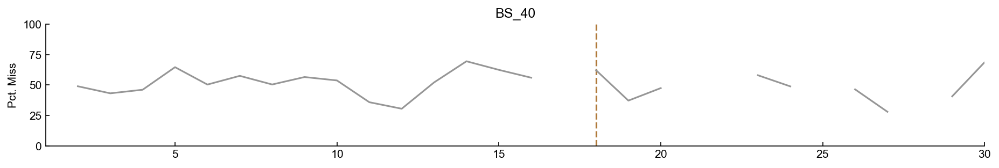

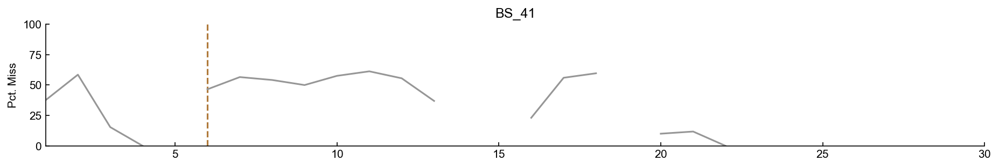

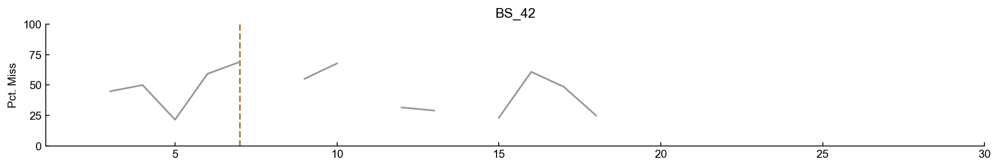

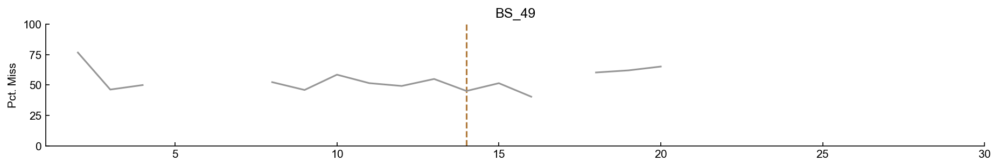

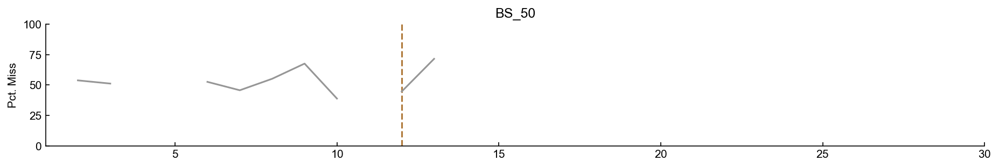

...

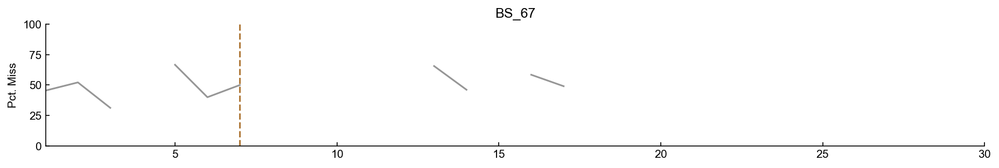

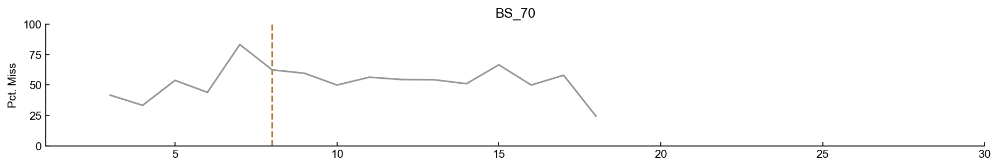

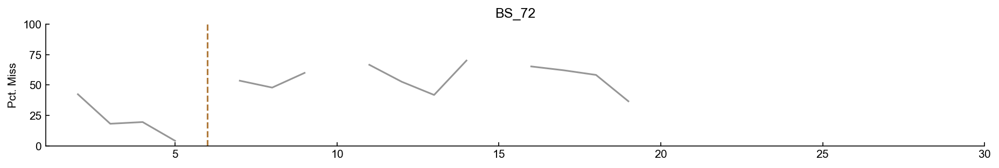

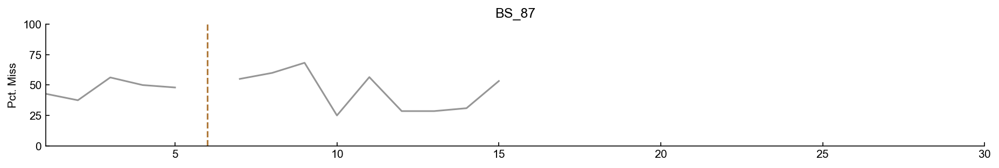

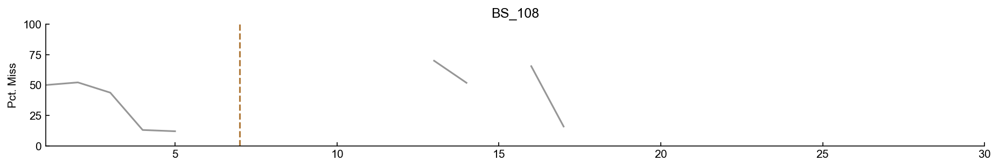

In [369]:
for animal in dualrecanimalnames:
    if animal in ['DS_15','DS_19']:
        continue
    
    print(animal)
    results = getAnimalActiveBehaviorResults(animal,act_directory)
    #res = results.__dict__
    #[print(len(res[r])) for r in res]
    
    fig,ax = plt.subplots(figsize=(15,2))
    #fig = plt.figure(figsize=(15,10))
    #gs = fig.add_gridspec(5,1,hspace=0.5)
    #ax_corr = plt.subplot(gs[0])
    #ax_hit = plt.subplot(gs[1],sharex=ax_corr,sharey=ax_corr)
    #ax_miss = plt.subplot(gs[2],sharex=ax_corr,sharey=ax_corr)
    #ax_falarm = plt.subplot(gs[3],sharex=ax_corr,sharey=ax_corr)
    #ax_creject = plt.subplot(gs[4],sharex=ax_corr,sharey=ax_corr)
    
    postreversal_days = np.greater(results.sessionnum_list,animalBehaviors[animal].reversal)
    postreversal_pct_miss = results.miss_pct[postreversal_days]
    dual_pct_miss.append(postreversal_pct_miss)

    ax.plot(results.sessionnum_list,results.miss_pct,color=GOOD_GREY)

    ax.axvline(animalBehaviors[animal].reversal,color=SWITCH_COLOR,linestyle='--',zorder=-10)

    ax.set_ylim([0,1])
    ax.set_yticks([0,0.25,0.5,0.75,1])
    #[ax.axhline(t,zorder=-20,alpha=0.25,color='k') for t in [0.25,0.5,0.75,1]]
    ax.set_yticklabels([int(pct*100) for pct in np.array([0,0.25,0.5,0.75,1])])
    ax.set_xlim(np.min(sessionnum_list),np.max(sessionnum_list))

    ax.set_ylabel('Pct. Miss')
    
    ax.set_title(animal)
    #break
    
    plt.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Behavior','Error Rates over training',animal+' dual rec error rates over training.pdf'),transparent=False,facecolor="white")

In [372]:
opsin_pct_miss = np.concatenate(opsin_pct_miss)
dual_pct_miss = np.concatenate(dual_pct_miss)

In [383]:
opsin_pct_miss = opsin_pct_miss[np.isfinite(opsin_pct_miss)]
dual_pct_miss = dual_pct_miss[np.isfinite(dual_pct_miss)]

mannwhitney
sig: False
pval: 0.5967805921859027


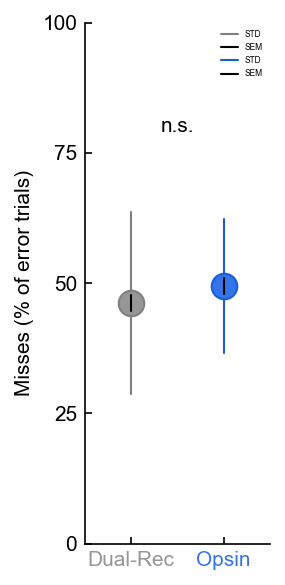

In [397]:
colors = [GOOD_GREY,LASER_COLOR]
fig, ax = plt.subplots(figsize=(2,4))
for idx,column in enumerate([dual_pct_miss,opsin_pct_miss]):
    eye_color=colors[idx]
    r,g,b = mpl.colors.to_rgb(eye_color)
    h,l,s = colorsys.rgb_to_hls(r,g,b)
    #border_color=colorsys.hls_to_rgb(h,l*0.75,s)
    border_color=colorsys.hls_to_rgb(h,l*.85,s)

    summary_size=150
    summary_width=1
    
    datamean = np.nanmean(column)
    SEMlow = datamean - sem(column,nan_policy='omit')
    SEMhigh = datamean + sem(column,nan_policy='omit')
    STDlow = datamean - np.std(column)
    STDhigh = datamean + np.std(column)
    
    ax.scatter([idx], [datamean], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
    ax.plot([idx, idx], [STDlow,STDhigh], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round',label='STD')
    ax.plot([idx, idx], [SEMlow,SEMhigh], c='k', lw=summary_width, zorder=11, solid_capstyle='round',label='SEM')

ax.set_xlim(-0.5,1.5)
ax.set_xticks([0,1])
ax.set_xticklabels(['Dual-Rec','Opsin'])
[t.set_color(colors[idx]) for idx,t in enumerate(ax.xaxis.get_ticklabels())]

ax.set_ylim([0,1])

#ax.text(1,5.4,'n='+str(len(preData)),horizontalalignment='left',verticalalignment='top')

#print('ttest_rel')
#test = ttest_rel(preData,postData)
#pval = test[1]
#sig = np.abs(pval) < 0.05
#print('sig: '+str(sig))
#print('pval: '+str(pval))

#print('mannwhitney')
#test = mannwhitneyu(preData,postData)
#pval = test.pvalue
#sig = np.abs(pval) < 0.05
#print('sig: '+str(sig))
#print('pval: '+str(pval))

print('mannwhitney')
test = mannwhitneyu(dual_pct_miss,opsin_pct_miss)
pval = test.pvalue
sig = np.abs(pval) < 0.05
print('sig: '+str(sig))
print('pval: '+str(pval))

ax.set_yticks([0,0.25,0.5,0.75,1])
ax.set_yticklabels([int(pct*100) for pct in np.array([0,0.25,0.5,0.75,1])])

ax.set_ylabel('Misses (% of error trials)')
ax.text(0.5,0.8,'n.s.',horizontalalignment='center',verticalalignment='center')

ax.legend(frameon=False,loc='upper right',prop={'size': 4})

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin Behavior','Opsin vs dual-rec error pct miss rate.pdf'),transparent=False,facecolor="white")

# Opsin vs Controls d' at cutoff comparison

In [166]:
#opsin_dps = np.concatenate([[0.425,1.12,0.605,2.1,0.44],[-0.082,0.822,0.42,-0.203]])
opsin_dps = [0.15,-0.082,0.822,-0.263,-0.203,0.184,-0.2] ### 9 +/- 3 days for post-reversal cutoff. At least 6 days non-cloudy post-reversal required for inclusion
#NOTE: 192 has not had IHC confirmation
#control_dps = [1.63,1.38,1.69,1.72,1.64,1.82,1.75,1.93,1.57,2.10,1.66,0.83,1.73,2.48,1.48,1.66]
#control_dps = [1.63,1.38,1.69,1.72,1.64]
control_dps = [1.82,1.75,1.93,1.57,2.10,1.66,0.83,1.73,2.48,1.48,1.66]

mannwhitney
sig: True
pval: 0.0005746378094126412


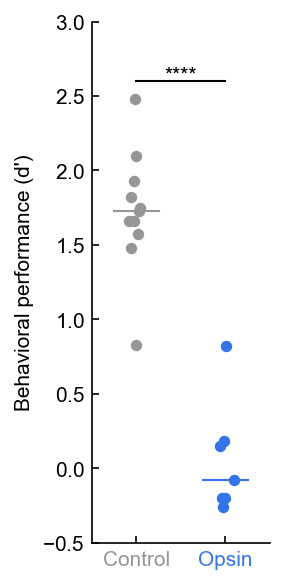

In [173]:
fig, ax = plt.subplots(figsize=(2,4))
meanwidth = 0.25

X,Y = ilep.violin(np.ones_like(opsin_dps),opsin_dps,width=0.25)
ax.scatter(X,Y,color=LASER_COLOR,s=20)
ax.plot([1-meanwidth,1+meanwidth],[np.median(opsin_dps)]*2,lw=1,color=LASER_COLOR)
X,Y = ilep.violin(np.zeros_like(control_dps),control_dps,width=0.25)
ax.scatter(X,Y,color=GOOD_GREY,s=20)
ax.plot([0-meanwidth,0+meanwidth],[np.median(control_dps)]*2,lw=1,color=GOOD_GREY)

ax.set_ylim([-0.5,3])
ax.set_ylabel('Behavioral performance (d\')')

ax.set_xlim(-0.5,1.5)
ax.set_xticks([0,1])
ax.set_xticklabels(['Control','Opsin'])
colors = [GOOD_GREY,LASER_COLOR]
[t.set_color(colors[idx]) for idx,t in enumerate(ax.xaxis.get_ticklabels())]

print('mannwhitney')
test = mannwhitneyu(opsin_dps,control_dps)
pval = test.pvalue
sig = np.abs(pval) < 0.05
print('sig: '+str(sig))
print('pval: '+str(pval))

ax.text(0.5,2.575,str('****'),verticalalignment='bottom',horizontalalignment='center')
ax.plot([0,1],[2.6]*2,color='k',lw=1)

plt.tight_layout()
fig.savefig(os.path.join('D:\\\\Figures','Opsin Figures','Opsin vs Control dp at cutoff.pdf'),transparent=False,facecolor="white")